# Projet 3 OpenFoodFacts - Notebook d'analyse des données


Lien vers les consignes du projet sur openclassrooms : https://openclassrooms.com/fr/projects/628/assignment

Lien vers la définition des variables : https://world.openfoodfacts.org/data/data-fields.txt

## Installation 

In [679]:
!pip install missingno
!pip install mlxtend
!pip install ppscore
!pip install --upgrade statsmodels
!pip install fuzzywuzzy


Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


- missingno : cette bibliothèque fournit des outils pour visualiser les données manquantes dans un ensemble de données. Elle est utile pour identifier rapidement les valeurs manquantes et les tendances des données. Elle peut être utilisée en conjonction avec d'autres bibliothèques d'analyse de données telles que pandas et matplotlib.

- mlxtend : cette bibliothèque est un ensemble d'outils pour l'analyse de données et l'apprentissage automatique. Elle fournit des algorithmes d'apprentissage automatique, des outils pour l'évaluation et la sélection de modèles, et des méthodes de prétraitement des données telles que le codage en une chaîne binaire.

- ppscore : cette bibliothèque fournit une mesure de la corrélation entre les variables appelée "Predictive Power Score" (PPS), qui peut être utilisée pour identifier les variables les plus importantes dans un ensemble de données pour la prédiction. La PPS est une mesure plus complète que la corrélation de Pearson, car elle peut identifier des relations non linéaires et non monotones entre les variables.

## Environnement & Imports

In [440]:
# Importation des bibliothèques nécessaires
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import seaborn as sns
import re
import missingno as msno
import matplotlib.dates as mdates
import os
from sklearn.decomposition import PCA
# Importation de la classe KMeans à partir de la bibliothèque scikit-learn
from sklearn.cluster import KMeans
from scipy.stats import trim_mean
from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import adfuller

import ppscore as pps
import warnings
warnings.filterwarnings('ignore')

from matplotlib.colors import ListedColormap

from scipy.stats import f_oneway, kruskal, rankdata
from sklearn.linear_model import LinearRegression

# POUR RECALCULER LA PCA AVEC MLXTEND
from mlxtend.plotting import plot_pca_correlation_graph
from scipy.stats import pearsonr, spearmanr, kendalltau

# Affichage des graphiques dans le notebook
%matplotlib inline


In [441]:
#Modification des affichages de colonnes, lignes et largeurs de colonnes pour avoir un maximum d'information
pd.set_option('display.max_columns', 200)
pd.set_option('display.max_rows', 1000)
pd.set_option('display.max_colwidth', -1)

## Chargement

In [442]:
# Définition d'une fonction pour tracer une heatmap
# paramètres :
# corr : matrice de corrélation
# title : titre du graphe
# figsize : taille de la figure
# vmin : valeur minimale de la colormap
# vmax : valeur maximale de la colormap
# center : valeur centrale de la colormap
# palette : palette de couleurs
# shape : forme de la heatmap (rectangle ou triangle)
# fmt : format des nombres affichés
# robust : booléen pour utiliser une méthode de calcul robuste ou non
def plot_heatmap(corr, title, figsize=(8,4), vmin=-1, vmax=1, center=0,
                 palette = sns.color_palette("coolwarm", 20), shape='rect',
                 fmt='.2f', robust=False):
    
    # Création d'une figure et d'un axe
    fig, ax = plt.subplots(figsize=figsize)
    
    # Définition du masque pour la forme de la heatmap
    if shape == 'rect':
        mask=None
    elif shape == 'tri':
        mask = np.zeros_like(corr, dtype=np.bool)
        mask[np.triu_indices_from(mask)] = True
    else:
        print('ERROR : this type of heatmap does not exist')

    # Définition de la palette de couleurs
    palette = palette
    
    # Tracé de la heatmap
    ax = sns.heatmap(corr, mask=mask, cmap=palette, vmin=vmin, vmax=vmax,
                     center=center, annot=True, annot_kws={"size": 10},fmt=fmt,
                     square=False, linewidths=.5, linecolor = 'white',
                     cbar_kws={"shrink": .9, 'label': None}, robust = robust,
                     xticklabels= corr.columns, yticklabels = corr.index)
    
    # Configuration des axes et de la légende
    ax.tick_params(labelsize=8,top=False, bottom=True,
                labeltop=False, labelbottom=True)
    ax.collections[0].colorbar.ax.tick_params(labelsize=8)
    plt.setp(ax.get_xticklabels(), rotation=25, ha="right",rotation_mode="anchor")
    ax.set_title(title, fontweight='bold', fontsize=14)
    
    # Retourne le masque (inutilisé dans ce code)
    # return mask


In [443]:
from scipy.stats import trim_mean
from statsmodels.tsa.stattools import adfuller, kpss
import numpy as np

def stationary_tests(data, print_opt=True, trim_prop=0.9):
    # Suppression des valeurs manquantes et NaN
    data_m = data.dropna().values.astype(float)
#     data_m = data_m[~np.isnan(data_m)]
    data_m = data_m[~np.isnan(data_m)].astype(float)

    # Troncature des valeurs extrêmes
    trim_value = int(len(data_m) * trim_prop)
    data_m = trim_mean(data_m, trim_value)
    
    # apply KPSS test on residuals
    stat, p, lags, crit = kpss(data_m, nlags='auto')
    result = adfuller(data_m)

    if print_opt:
        # H0: series is not trend-stationary.
        print('--- Kwiatkowski---') 
        print('stat=%.3f, p=%.3f' % (stat, p))
        # not rejected -> series is not trend-stationary.
        print('prob. not trend-stationary') if p > 0.05\
             else print('prob. trend-stationary') # rejected -> trend-stationary
        
        # H0: there is a unit root i.e. series is non-stationary
        print('--- Aug. Dickey-Fuller ---\n stat.: %f' % result[0]) 
        print('p-value: %f' % result[1])
        # not rejected -> series is non-stationary
        print('prob. not stationary\n') if result[1] > 0.05\
                    else print('prob. stationary\n' )# rejected -> stationary
    # True : stationary/trend-stationary
    return {'Kwiatkowski': (round(p,4), str(p <= 0.05)),
            'Aug. Dickey-Fuller': (round(result[1],4), str(result[1] <= 0.05))}


# # Function applying stationary tests to data and returning if stat. or not

# def stationary_tests(data, print_opt=True):

#     data_m = np.array(data[~np.isnan(data)])
#     stat, p, lags, crit = kpss(data_m, nlags='auto')
#     result = adfuller(data_m)

#     if print_opt:

#         # : H0 : series is not trend-stationary.
#         print('--- Kwiatkowski---') 
#         print('stat=%.3f, p=%.3f' % (stat, p))
#         # not rejected -> series is not trend-stationary.
#         print('prob. not trend-stationary') if p > 0.05\
#              else print('prob. trend-stationary') # rejected -> trend-stationary
        
#         # H0 there is a unit root i.e. series is non-stationary
#         print('--- Aug. Dickey-Fuller ---\n stat.: %f' % result[0]) 
#         print('p-value: %f' % result[1])
#         # not rejected -> series is non-stationary
#         print('prob. not stationary\n') if result[1] > 0.05\
#                     else print('prob. stationary\n' )# rejected -> stationary
#     # True : stationnary/trend-stationnary
#     return {'Kwiatkowski': (round(p,4), str(p <= 0.05)),
#             'Aug. Dickey-Fuller': (round(result[1],4), str(result[1] <= 0.05))}



# def stationary_tests(data, print_opt=True, trim_prop=0.3):
# #     # On enlève les valeurs manquantes et on met les données dans un array numpy
# #     data_m = data.fillna(df.mean())

#     # Suppression des valeurs manquantes et NaN
    
#     data_m = data.dropna().values.astype(float)
#     data_m = data_m[~np.isnan(data_m)]

# #     data_m = data_m.dropna().values
# #     data_m = np.array(data_m[~np.isnan(data_m)])
#     data_m = data_m[~np.isnan(data_m)]
  
#     # Troncature des valeurs extrêmes
#     trim_value = int(len(data_m) * trim_prop)
#     data_m = trim_mean(data_m, trim_value)
    
#     # apply KPSS test on residuals
# #     resids = data_m - np.mean(data_m)
#     data_m = data_m[~np.isnan(data_m)]
    
#     stat, p, lags, crit = kpss(data_m, nlags='auto')
#     result = adfuller(data_m)

#     if print_opt:
#         # H0: series is not trend-stationary.
#         print('--- Kwiatkowski---') 
#         print('stat=%.3f, p=%.3f' % (stat, p))
#         # not rejected -> series is not trend-stationary.
#         print('prob. not trend-stationary') if p > 0.05\
#              else print('prob. trend-stationary') # rejected -> trend-stationary
        
#         # H0: there is a unit root i.e. series is non-stationary
#         print('--- Aug. Dickey-Fuller ---\n stat.: %f' % result[0]) 
#         print('p-value: %f' % result[1])
#         # not rejected -> series is non-stationary
#         print('prob. not stationary\n') if result[1] > 0.05\
#                     else print('prob. stationary\n' )# rejected -> stationary
#     # True : stationary/trend-stationary
#     return {'Kwiatkowski': (round(p,4), str(p <= 0.05)),
#             'Aug. Dickey-Fuller': (round(result[1],4), str(result[1] <= 0.05))}


In [447]:
# Plotting ANOVA and Kruskall-Wallis H test and return if same dist. or not

def id_cat_distrib_tests(data_df, Q_col, C_col, print_opt=True):

    gb = data_df.groupby(C_col)[Q_col]
    cat = list(gb.groups.keys())
    cat_series = [gr.dropna().values for n, gr in gb]

    if print_opt: print('oooooooo- {} vs. {} -oooooooo'.format(Q_col, C_col))

    # Analysis of Variance Test
    stat1, p1 = f_oneway(*cat_series)
    if print_opt:
        print('---ANOVA---')
        print('stat=%.3f, p=%.10f' % (stat1, p1))
        print('Prob. same distr') if p1 > 0.05 else print('Prob. different distr')
    # Kruskal-Wallis H Test
    stat2, p2 = kruskal(*cat_series)
    if print_opt:
        print('---Kruskal-Wallis---')
        print('stat={:.3f}, p={:.10f}'.format(stat2, p2))
        print('Prob. same distr') if p2 > 0.05 else print('Prob. different distr')
        
    return {'ANOVA': (round(p1,4), str(p1 > 0.05)),
            'Kruskal-Wallis': (round(p2,4), str(p2 > 0.05))}

 # - > at least one of the groups has a significantly different mean from the others.

In [448]:
def mult_test(data_df, test_func, print_opt=True, res_df=pd.DataFrame(), **kwargs):
    res_df_mod = res_df.copy('deep')
    
    data_df = pd.DataFrame(data_df).dropna()
    print(res_df_mod)
    for c in data_df.select_dtypes(include=np.number).columns:
        if print_opt: print('oooo--'+c+'--oooo')
        if test_func == 'stat':
            dic_stat = stationary_tests(data_df[c], print_opt=print_opt)
        elif test_func == 'id_dist':
            dic_stat = id_cat_distrib_tests(data_df, C_col=kwargs['C_col'],
                                            Q_col=c, print_opt=print_opt)
        else:
            print('ERROR: this function does not exist')
        for s in dic_stat.keys():
            res_df_mod.loc[s, c] = str(dic_stat.get(s))

    return res_df_mod


In [449]:
# # Plotting proportion of categories among newly entered products and returning
# # the dataframe of aggregated data for each categories

# def plot_cat_prop_thr_time(col, palette='dark', ncol=3):
#     print(df)
#     df_fx = df.copy()
#     if 'last_modified_t' in df_fx.columns:
#         print("la colonne existe ")
#     print("les colonnes df ")    
#     print(df_fx.columns)    
#     df_fx['last_modified_t'] = pd.to_datetime(df['last_modified_t'])   
#     df_fx.set_index('last_modified_t', inplace=True)
#     df_fx.index = pd.to_datetime(df_fx.index, unit='s')
#     print(df_fx)
# #     if 'last_modified_t' in df_f.columns:
# #     # Vérifier si "last_modified_t" a besoin d'être converti en datetime index
# #         if not pd.api.types.is_datetime64_any_dtype(df_f['last_modified_t']):
# #             df_f['last_modified_t'] = pd.to_datetime(df_f['last_modified_t'], unit='s')

# #         # Vérifier si la colonne "last_modified_t" est l'index du dataframe
# #         if 'last_modified_t' not in df.index.names:
# #             df.set_index('last_modified_t', inplace=True)
# #         else:
    
# #     # Vérifier si "last_modified_t" existe dans le dataframe
# #     if 'last_modified_t' in df_f.columns:
# #         # Vérifier si "last_modified_t" a besoin d'être converti en datetime index
# #         if not pd.api.types.is_datetime64_any_dtype(df_f['last_modified_t']):
# #             df_f['last_modified_t'] = pd.to_datetime(df_f['last_modified_t'], unit='s')

# #         # Vérifier si la colonne "last_modified_t" est l'index du dataframe
# #         if 'last_modified_t' not in df.index.names:
# #             df_f.set_index('last_modified_t', inplace=True)
            
# #     df_100g_thr_time = df.set_index('last_modified_t').sort_index()[col_100g]
# #     df_100g_thr_time.index = pd.to_datetime(df_100g_thr_time.index, unit='s')

# #     # Convert "last_modified_t" to datetime index
# #     df_f['last_modified_t'] = pd.to_datetime(df['last_modified_t'], unit='s')
# #     df_f.set_index('last_modified_t', inplace=True)

#     fig = plt.figure(figsize=(10,5))
#     gb = df_fx.groupby(col)
#     lab = gb.size().index
#     # mean aggregation by month
#     gb_week = df_fx.groupby([pd.Grouper(key='last_modified_t', freq='M'), col])
#     cat_n_item_counts = gb_week.size().unstack()
# #     print(cat_n_item_counts)
#     cat_n_item_prop = cat_n_item_counts\
#          .div(cat_n_item_counts.sum(axis='columns').values/100, axis='rows')
# #     print(cat_n_item_prop  )
#     with sns.color_palette(palette):
#         plt.stackplot(cat_n_item_prop.index, cat_n_item_prop.T.values,
#                       alpha=0.8, labels=cat_n_item_prop.columns)

#     ax = plt.gca()
#     plt.legend(bbox_to_anchor=[0.9,-0.1], ncol=ncol)
#     ax.set_xlabel("Time"), ax.set_ylabel("Category proportions (%)")
#     ax.set_title("Proportion of each category among new items ("+col+")")
#     plt.tight_layout(rect=[0, 0.05, 1, 1.2])
  
#     return cat_n_item_prop

In [506]:
# Tracé de la proportion de chaque catégorie parmi les nouveaux produits entrés et les produits retournés,
# en retournant le dataframe de données agrégées pour chaque catégorie.

def plot_cat_prop_thr_time(df_fx, col, palette='dark', ncol=3):
    # Affichage du dataframe de base
#     print(df)
    
    # Copie du dataframe pour éviter la modification de l'original
#     df_fx = df.copy()
    
    # Vérification si la colonne last_modified_t existe dans le dataframe copié
    if 'last_modified_t' in df_fx.columns:
        print("la colonne existe dans le dataframe")
    else:
        print("la colonne N'existe PAS dans le dataframe") 
      
    # Affichage des colonnes du dataframe copié
    print("les colonnes df ")    
    print(df_fx.columns)    
    
    # Conversion de la colonne last_modified_t en datetime
    df_fx['last_modified_t'] = pd.to_datetime(df['last_modified_t'] , unit='s')
    print(df_fx['last_modified_t'])
    # Mise en index du dataframe copié sur la colonne last_modified_t
#     df_fx.set_index('last_modified_t', inplace=True)
    
    # Affichage du dataframe copié
#     print(df_fx)
    if 'last_modified_t' in df_fx.index:
        print("la colonne existe dans la serie ") 
    else:
        print("la colonne N'existe PAS dans le serie")       
    print(df_fx.index)
#     print(s.index)
    
    # Création de la figure de plot
    fig = plt.figure(figsize=(10,5))
    
    # Groupe par la colonne 'col' du dataframe copié
    gb = df_fx.groupby(col)
    
    # Création des étiquettes pour chaque groupe
    lab = gb.size().index
    
    # Agrégation de la moyenne par mois
    gb_week = df_fx.groupby([pd.Grouper(key='last_modified_t', freq='M'), col])
    
    # Comptage du nombre d'éléments par catégorie
    cat_n_item_counts = gb_week.size().unstack()
#     print(cat_n_item_counts)
    
    # Calcul de la proportion de chaque catégorie
    cat_n_item_prop = cat_n_item_counts\
         .div(cat_n_item_counts.sum(axis='columns').values/100, axis='rows')
#     print(cat_n_item_prop  )
    
    # Tracé de la proportion de chaque catégorie au fil du temps
    with sns.color_palette(palette):
        plt.stackplot(cat_n_item_prop.index, cat_n_item_prop.T.values,
                      alpha=0.8, labels=cat_n_item_prop.columns)

    # Paramètres de la légende
    ax = plt.gca()
    plt.legend(bbox_to_anchor=[0.9,-0.1], ncol=ncol)
    
    # Paramètres des axes et titre
    ax.set_xlabel("Time"), ax.set_ylabel("Category proportions (%)")
    ax.set_title("Proportion de chaque catégorie : ("+col+")")
    
    # Réglages de la disposition
    plt.tight_layout(rect=[0, 0.05, 1, 1.2])
  
    # Retourne le dataframe de la proportion de chaque catégorie
    return cat_n_item_prop


In [451]:
def display_factorial_planes(X_proj, n_comp, pca, axis_ranks, labels=None,
                             width=16, alpha=1, n_cols=3, illus_var=None,
                             lab_on=True, size=10):
    # Détermine le nombre de lignes pour afficher les plans factoriels
    n_rows = (n_comp+1)//n_cols
    # Crée une nouvelle figure avec la taille spécifiée
    fig = plt.figure(figsize=(width,n_rows*width/n_cols))
    # Boucle sur chaque plan factoriel
    for i, (d1,d2) in (enumerate(axis_ranks)):
        # Vérifie que l'axe d2 est inférieur au nombre de composantes principales
        if d2 < n_comp:
            # Ajoute un subplot à la figure
            ax = fig.add_subplot(n_rows, n_cols, i+1)
            # Points
            if illus_var is None:
                # Affiche des points simples sans distinction de couleur
                ax.scatter(X_proj[:, d1], X_proj[:, d2], alpha=alpha, s=size)
            else:
                # Si illus_var est spécifié, affiche les points avec des couleurs différentes pour chaque valeur unique de illus_var
                illus_var = np.array(illus_var)
                for value in np.unique(illus_var):
                    sel = np.where(illus_var == value)
                    ax.scatter(X_proj[sel, d1], X_proj[sel, d2], 
                                alpha=alpha, label=value)
                ax.legend()
            labels = labels.astype(str)
    
            # Labels des points
            if labels is not None and lab_on:
                # Ajoute les labels pour chaque point
                for i,(x,y) in enumerate(X_proj[:,[d1,d2]]):
                    ax.text(x, y, labels[i],
                              fontsize='14', ha='center',va='center')   
            # Limites de l'axe
            bound = np.max(np.abs(X_proj[:, [d1,d2]])) * 1.1
            ax.set(xlim=(-bound,bound), ylim=(-bound,bound))
            # Lignes horizontales et verticales
            ax.plot([-100, 100], [0, 0], color='grey', ls='--')
            ax.plot([0, 0], [-100, 100], color='grey', ls='--')
            # Noms des axes avec le pourcentage d'inertie expliqué
            ax.set_xlabel('F{} ({}%)'.format(d1+1, round(100*pca.explained_variance_ratio_[d1],1)))
            ax.set_ylabel('F{} ({}%)'.format(d2+1, round(100*pca.explained_variance_ratio_[d2],1)))
            # Titre du subplot
            ax.set_title("Projection des individus (sur F{} et F{})".format(d1+1, d2+1))
    # Ajuste les paramètres de la figure pour éviter les chevauchements
    plt.tight_layout()


In [452]:

# import time

# def save_figure_opt(n_file, repertoire='Graphique', library='matplotlib'):
#     # Create the directory path based on the current time and the specified subdirectory
#     fig_dir = os.path.join(os.getcwd(), 'FIG', repertoire, time.strftime("%d_%m_%Y_%H_%M"))
#     # Create the directory if it does not exist
#     if not os.path.exists(fig_dir):
#         os.makedirs(fig_dir)
#     # Set the path to save the figure inside the directory
#     fig_path = os.path.join(fig_dir, n_file)
#     # Save the figure using the specified library
#     if library == 'seaborn':
#         sns.savefig(fig_path, dpi=400)
#     else:
#         plt.savefig(fig_path, dpi=400)
#     # Show the figure
#     plt.show()

import time

# def save_figure_opt(n_file, repertoire='Graphique', library='matplotlib'):
#     # Create the directory path based on the current time and the specified subdirectory
#     fig_dir = os.path.join(os.getcwd(), 'FIG', repertoire, time.strftime("%d_%m_%Y_%H_%M"))
#     # Create the directory if it does not exist
#     if not os.path.exists(fig_dir):
#         os.makedirs(fig_dir)
#     # Set the path to save the figure inside the directory
#     fig_path = os.path.join(fig_dir, n_file)
#     # Save the figure using the specified library
#     if library == 'seaborn':
#         sns.savefig(fig_path, dpi=800)
#     else:
#         plt.savefig(fig_path, dpi=800)

#     # Show the figure
#     plt.show()
def save_figure_opt(n_file, repertoire='Graphique', library='matplotlib'):
    # Create the directory path based on the current time and the specified subdirectory
    fig_dir = os.path.join(os.getcwd(), 'FIG', repertoire, time.strftime("%d_%m_%Y_%H_%M"))
    # Create the directory if it does not exist
    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)
    # Set the path to save the figure inside the directory
    fig_path = os.path.join(fig_dir, n_file)
    # Save the figure using the specified library
    if library == 'seaborn':
        sns.savefig(fig_path, dpi=800, transparent=True)
    else:
        plt.savefig(fig_path, dpi=300)
    # Adjust the layout to avoid overlapping of axis labels and titles
    fig = plt.gcf()
    fig.tight_layout()    
    fig.subplots_adjust(left=0, right=1, wspace=None, hspace=None)

    # Adjust the margins of the figure to include all texts and legends
    plt.subplots_adjust(left=0.1, right=0.9, bottom=0.1, top=0.9)
    # Show the figure
    plt.show()

    

In [453]:
import pandas as pd
import scipy.stats as stats
from sklearn.linear_model import LinearRegression

def compare_analyses(column, quant_cols, df):
    # Créer un DataFrame de résultats vide
    results = []
    df = df.fillna(0).round(2)
#     pnns1_n_item_prop = pnns1_n_item_prop.drop('unknown', axis=1, inplace=True)


    # Parcourir chaque colonne quantitative et comparer avec la colonne de référence
    for col in quant_cols:
        # Calculer la p-value de l'ANOVA
        anova = stats.f_oneway(*[df[column][df[col].notnull()] for col in quant_cols])
        pval_anova = anova.pvalue
        
        # Calculer la corrélation entre la colonne de référence et la colonne quantitative
        corr = df[[column, col]].corr().iloc[0,1]
        
        # Calculer la p-value du t-test pour les moyennes égales
        ttest = stats.ttest_ind(df[column][df[col].notnull()], df[col][df[col].notnull()], equal_var=True)
        pval_ttest = ttest.pvalue
        
        # Calculer la p-value du test Kruskal-Wallis pour les médianes égales
        kruskal = stats.kruskal(*[df[column][df[col].notnull()] for col in quant_cols])
        pval_kruskal = kruskal.pvalue
        
        # Calculer la pente de la régression linéaire et l'ordonnée à l'origine
        lm = LinearRegression()
        lm.fit(df[[col]][df[col].notnull()], df[[column]][df[col].notnull()])
        slope = lm.coef_[0][0]
        intercept = lm.intercept_[0]
        
        # Ajouter les résultats de la comparaison à la liste de résultats
        results.append([col, pval_anova, corr, pval_ttest, pval_kruskal, slope, intercept])
    
    # Créer un DataFrame à partir de la liste de résultats
    columns = ['colonne de référence', 'p-value ANOVA', 'corr', 'p-value t-Test', 'p-value Kruskal-Wallis', 'pente de la régression', 'ordonnée à l\'origine']
    df_results = pd.DataFrame(results, columns=columns)
    
    # Retourner le DataFrame de résultats
    return df_results


In [454]:
def replace_nan(df):
    return df.fillna(0)


In [455]:
# Function calculating regression for each categories through time

def mult_reg_thr_time(df):
#     data = df.dropna(how='any')
#     dates = mdates.date2num(data.index)
#     dates_rel = dates-dates.min()
#     df_reg_prop = pd.DataFrame([])

#     for c in df.columns:
#         X = dates_rel
#         y = data[c].values
#         X, y = [arr.reshape(-1, 1) for arr in [X,y]]
#         reg = LinearRegression()
#         reg.fit(X,y)
#         reg.score(X, y)
#         df_reg_prop.loc['coef', c] = reg.coef_[0,0]
#         df_reg_prop.loc['intercept',c] = reg.intercept_[0]
#         df_reg_prop.loc['mean',c] = y.mean()
#     return df_reg_prop

    # Drop les valeurs nulles
    data = df.dropna(how='any')

    # Convertir les dates en numéro de jours pour pouvoir les utiliser dans la régression
    dates = mdates.date2num(data.index)
    dates_rel = dates-dates.min()

    # Initialiser une nouvelle DataFrame pour stocker les coefficients, intercepts et moyennes pour chaque catégorie
    df_reg_prop = pd.DataFrame([])

    # Calculer la régression pour chaque colonne de la DataFrame
    for c in df.columns:
        X = dates_rel
        y = data[c].values
        X, y = [arr.reshape(-1, 1) for arr in [X,y]]
        reg = LinearRegression()
        reg.fit(X,y)
        reg.score(X, y)

        # Stocker les coefficients, intercepts et moyennes dans la nouvelle DataFrame
        df_reg_prop.loc['coef', c] = reg.coef_[0,0]
        df_reg_prop.loc['intercept',c] = reg.intercept_[0]
        df_reg_prop.loc['mean',c] = y.mean()

    # Renvoyer la nouvelle DataFrame contenant les informations de la régression pour chaque catégorie
    return df_reg_prop


In [456]:
def correlation_tests(data1, data2, print_opt=False):
    res_df = pd.DataFrame([])
    # data1_notna = data1[data1.notna()]
    # Pearson, Spearman, Kendall
    for f_name, func in zip(['Pearson', 'Spearman', 'Kendall'],[pearsonr, spearmanr, kendalltau]):
        stat, p = func(data1, data2)
        res_df.loc[f_name,'stat'] = stat
        res_df.loc[f_name,'p_value'] = p
        if print_opt: print('---'+f_name)
        if print_opt: print('stat=%.3f, p=%.3f' % (stat, p))
        if print_opt: print('Probably independent') if p > 0.05 else print('Probably dependent')
    return res_df

In [457]:
def save_table_opt(df, repertoire, filename, library='matplotlib', **kwargs):
    """
    Enregistre un tableau pandas dans un fichier image.

    Parameters:
    -----------
    df : pandas.DataFrame
        Le tableau à sauvegarder.
    title : str
        Le titre à afficher sur le tableau.
    filename : str
        Le nom du fichier image à sauvegarder.
    library : str, optional
        La librairie à utiliser pour générer l'image ('matplotlib' ou 'plotly').
    **kwargs : dict, optional
        Des options supplémentaires pour la fonction de génération d'image.

    Returns:
    --------
    None
    """

    # Créer le chemin vers le dossier en utilisant le répertoire actuel et la date/heure courante
    fig_dir = os.path.join(os.getcwd(), 'FIG', repertoire, time.strftime("%d_%m_%Y_%H_%M"))
    
    # Créer le dossier s'il n'existe pas
    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)
    
    # Définir le chemin où sauvegarder l'image dans le dossier créé
    fig_path = os.path.join(fig_dir, filename)
    
    # Vérifier la librairie utilisée pour la génération de l'image
    if library == 'matplotlib':
        import matplotlib.pyplot as plt
                
        # Créer une figure matplotlib avec une taille de 10 pouces sur 4 pouces
        plt.figure(figsize=(12, 4))

        # Ajouter un subplot à la figure avec une seule rangée, une seule colonne et l'index 1 (le seul)
        ax = plt.subplot(111, frame_on=False)

        # Masquer les axes x et y du subplot
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)


        
        # Utiliser la fonction pd.plotting.table pour dessiner le tableau pandas dans la figure
        pd.plotting.table(ax, df, loc='center')
        
        # Ajouter un titre à la figure
        plt.title(repertoire, fontsize=16)
        plt.subplots_adjust(top=0.8)
        # Sauvegarder la figure
        plt.savefig(fig_path, transparent=True)
        
    elif library == 'plotly':
        import plotly.graph_objects as go
        
        # Créer la figure plotly avec le tableau pandas
        fig = go.Figure(data=[go.Table(header=dict(values=list(df.columns)),
                                        cells=dict(values=[df[col] for col in df.columns]))
                             ])
        # Ajouter un titre et des options supplémentaires à la figure
        fig.update_layout(title=repertoire, **kwargs)
        fig.update_layout(margin=dict(l=0, r=0))
        fig.update_layout(plot_bgcolor='rgba(0,0,0,0)', paper_bgcolor='rgba(0,0,0,0)')

        plt.subplots_adjust(top=0.8)
        # Sauvegarder la figure
        fig.write_image(fig_path, transparent=True)


In [458]:
def affectation_types_object(dataframe):
    '''Corrige les types pour les colonnes dont les résultats sont des booléens'''
    try:
        # Colonnes à convertir en type 'object'
        object_columns = ['code', 'url', 'cities', 'creator', 'product_name', 'generic_name', 'quantity', 'packaging', 'packaging_tags', 'brands', 'brands_tags', 'categories', 'categories_tags', 'categories_en', 'origins', 'origins_tags', 'manufacturing_places', 'manufacturing_places_tags', 'labels', 'labels_tags', 'labels_en', 'emb_codes', 'emb_codes_tags', 'first_packaging_code_geo', 'cities_tags', 'purchase_places', 'stores', 'countries', 'countries_tags', 'countries_en', 'ingredients_text', 'allergens', 'traces', 'traces_tags', 'traces_en', 'serving_size', 'additives', 'additives_tags', 'additives_en', 'nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2', 'states', 'states_tags', 'states_en', 'main_category', 'main_category_en', 'image_url', 'image_small_url', 'image_ingredients_url', 'image_ingredients_small_url', 'image_nutrition_url', 'image_nutrition_small_url']

        # Convertit les colonnes en type 'object' si elles existent
        for column in object_columns:
            if column in dataframe.columns:
                dataframe[column] = dataframe[column].astype('object')
            else:
                print(f'La colonne {column} n\'existe pas dans le dataframe')
                
    except:
        print('Erreur de conversion de type, vérifiez les colonnes')
        
    return dataframe


In [459]:
data = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

In [460]:
data.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [461]:
data.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 94485 entries, 0 to 94484
Data columns (total 42 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   code                                     94485 non-null  object 
 1   url                                      94485 non-null  object 
 2   creator                                  94485 non-null  object 
 3   created_t                                94485 non-null  int64  
 4   created_datetime                         94485 non-null  object 
 5   last_modified_t                          94485 non-null  int64  
 6   product_name                             87490 non-null  object 
 7   quantity_original                        67819 non-null  object 
 8   packaging                                55975 non-null  object 
 9   packaging_tags                           55975 non-null  object 
 10  brands                                   82616

In [462]:
# if 'Unnamed: 0' in data.columns:
#     data.drop('Unnamed: 0', axis=1, inplace=True)

In [463]:
data.shape

(94485, 42)

In [464]:
data.isna().sum()

code                                       0    
url                                        0    
creator                                    0    
created_t                                  0    
created_datetime                           0    
last_modified_t                            0    
product_name                               6995 
quantity_original                          26666
packaging                                  38510
packaging_tags                             38510
brands                                     11869
categories_fr                              35655
labels_fr                                  60961
countries_fr                               0    
ingredients_text                           43932
allergens                                  72762
additives_n                                44156
additives                                  43944
additives_tags                             65800
additives_fr                               65800
ingredients_from_pal

## Correction des types

In [465]:
data.dtypes

code                                       object 
url                                        object 
creator                                    object 
created_t                                  int64  
created_datetime                           object 
last_modified_t                            int64  
product_name                               object 
quantity_original                          object 
packaging                                  object 
packaging_tags                             object 
brands                                     object 
categories_fr                              object 
labels_fr                                  object 
countries_fr                               object 
ingredients_text                           object 
allergens                                  object 
additives_n                                float64
additives                                  object 
additives_tags                             object 
additives_fr                   

In [466]:
types = pd.read_csv('../dtypes.csv')
types

,index,dtypes
0,code,object
1,url,object
2,creator,category
3,last_modified_t,object
4,product_name,object
5,quantity_original,category
6,packaging,category
7,packaging_tags,category
8,brands,category
9,categories_fr,category


In [467]:
for column in data.columns:
    if types['index'].str.contains(fr"\b{column}\b").any():
        column_type = types[types['index'].str.contains(fr"\b{column}\b")]['dtypes'].values[0]
        data[column] = data[column].astype(column_type)


In [468]:
data.dtypes

code                                       object  
url                                        object  
creator                                    category
created_t                                  int64   
created_datetime                           object  
last_modified_t                            object  
product_name                               object  
quantity_original                          category
packaging                                  category
packaging_tags                             category
brands                                     category
categories_fr                              category
labels_fr                                  category
countries_fr                               category
ingredients_text                           object  
allergens                                  category
additives_n                                float32 
additives                                  object  
additives_tags                             category
additives_fr

# QUESTION 2 


**Tout au long de l’analyse, produire des visualisations afin de mieux comprendre les données. Effectuer une analyse univariée pour chaque variable intéressante, afin de synthétiser son comportement.**

## Analyse Univariée

### Distribution

In [469]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

In [470]:
df.shape

(94485, 42)

In [471]:
df.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [472]:

# Appliquer la condition sur chaque élément numérique de chaque colonne
invalid_values = df.select_dtypes(include=['int8', 'float32' ,'int32','float64']).apply(lambda x: (x < 0) | (x > 100))

# Afficher le maximum et le minimum de chaque colonne
if invalid_values.any().any():
    print("Les valeurs suivantes sont invalides :")
    for col in invalid_values.columns:
        if invalid_values[col].any():
            print(f"{col}: min={df[col].min()}, max={df[col].max()}")
else:
    print("Toutes les valeurs sont valides")

# Définir les colonnes à vérifier
cols_to_check = df.select_dtypes(include=['int8', 'float32' ,'int32','float64']).filter(regex='_100g$')

# Appliquer la condition sur chaque élément de ces colonnes
invalid_values = cols_to_check

print("Max et Min : ")
    
for col in invalid_values.columns:
    if invalid_values[col].any():
        print(f"{col}: min={df[col].min()}, max={df[col].max()}")


Les valeurs suivantes sont invalides :
energy_100g: min=0.0, max=3700.0
quantity: min=0.0, max=2000.0
Max et Min : 
energy_100g: min=0.0, max=3700.0
fat_100g: min=0.0, max=100.0
saturated-fat_100g: min=0.0, max=56.0
carbohydrates_100g: min=0.0, max=96.9
sugars_100g: min=0.0, max=90.1
fiber_100g: min=0.0, max=28.3
proteins_100g: min=0.0, max=36.0
salt_100g: min=0.0, max=20.7
sodium_100g: min=0.0, max=8.149607
nutrition-score-fr_100g: min=0.0, max=28.0


In [473]:
# Sélectionner les colonnes 'product_name' et 'energy_100g'
selection = data.loc[:, ['product_name', 'energy_100g']]

# Boucler sur les lignes et afficher les valeurs
for i, row in selection.iterrows():
    print(row['product_name'], row['energy_100g'])


Farine de blé noir nan
Filet de bœuf nan
nan nan
Twix x2 nan
lentilles vertes  nan
nan nan
Biscuits sablés fourrage au cacao nan
nan nan
Thé de Noël aromatisé orange-cannelle nan
Sirops pour ganache macarons nan
Mini Confettis 1753.0
Praliné Amande Et Noisette 2406.0
Côte du Rhône village nan
Bonbon Vichy nan
M&m's peanut butter nan
Pepsi, Nouveau goût ! 177.0
nan nan
BoFrost Nudelpfanne nan
Tarte Poireaux Et Lardons 1079.0
7Up 177.0
Madeleines nature 1900.0
Terrine de campagne nan
Cakes Raisins 1768.0
nan nan
Cakes aux Fruits 1670.0
Chair à saucisse nan
Financiers aux Amandes 1868.0
Fondants Citron 1896.0
Kiehls - Cream #gel nan
Beignets framboises 1272.0
nan nan
Pepsi nan
nan nan
Pates Langue d'oiseau nan
Huile d'olive Monini nan
30 Panach' Fruits 1724.0
Foie gras de canard du Périgord nan
nan nan
Médaillon au foie gras de canard et aux champignons nan
Terrine de magret de canard au Sauternes nan
nan nan
nan nan
Fluteaux de jambon nan
Foie gras canard Périgord nan
Pâté au foie de can

Coconut Merchant Organic Raw Extra Virgin Coconut Oil 500 ML 2925.0
Huile de coco 2937.0
Bulk Deal 6 X Aqua Coco Active 88.0
2004 Vidal Icewine nan
Beechers Mac & Cheese World's Best 895.0
nan nan
Sauce Sesame 2427.0
Preserved bamboo shoot in soybean oil 1424.0
Dr. Pepper Soda Diet 0.0
Cheese Balls 628.0
Stiratini Grissini mit Sesam nan
Dr Pepper Cherry Vanilla Soda 586.0
Barre Célébration Cake nan
Sichuan Spicy Noodle Sauce - 368 g - Lee Kum Kee nan
cassonade 1674.0
nan nan
tea red label nan
nan nan
Breakfast Yogurt Biscuits with Whole grain nan
Dessert végétal myrtille 653.0
Chocolate Almonds 163.0
nan nan
Eliche Giganti nan
Tortina White 2343.0
Les Sardines à l'huile de tournesol et olives noires nan
nan nan
Olio extra vergine d'Oliva  nan
Tas Brand Coconut Juice - Young Coconut Juice 142.0
Tep Tip Coconut Milk 753.0
Coconut Chilli sauce nan
Korean BBQ Original Sauce - Kalbi Marinade 698.0
Crispy seaweed snacks nan
Royal Muscato nan
Bonne nuit 17.0
Tartelettes myrtilles nan
Alo expo

Munsbit apple and strawberry 1514.0
Boulettes De Viande 799.0
Vite une purée ! Pommes de terre & carottes nan
nan nan
ikea lebkuchenhaus nan
Sylt Hjortron 1038.0
Grönsaksbullar Vegetable Balls (ikea) 707.0
Munsbit 2013.0
Finest Dark chocolate 2365.0
Instant Noodle 1941.0
Vinaigrette huile d'olive et pointe d'olive noire 1200.0
Sirop Pêche Prune Coing 173.0
Haricots blancs nan
Tofu Nature 649.0
nan nan
Polo Original 1682.0
nan nan
Champagne Legrand Extra Brut nan
Les Hauts de Montrouge, Côtes de Gascogne, 2009 nan
Bas Armagnac, Hors d'âge, 20 ans d'âge nan
Jus de Veau Lié nan
Pommes Frites Sauce 791.0
Royal Cheese 1070.0
Best Stawberry-cheesecake 1120.0
Brasserie burger 1151.0
Crumpets 791.0
palmier pur beurre 2004.0
Best vanille/Amande/Caramel au beurre salé 1090.0
Sushi Maki Kawaï 169.0
Limonade artisanale nan
Salade à la  chinoise aux champignons noirs nan
Coeurs d'artichauts 247.0
Apérivrais saveurs provençales - poivrons - thym - ciboulette 1351.0
Coca Cola 180.0
Mayonnaise 404.0
L

Goufa Jeune 1531.0
Captain Rondo 2050.0
envitas biscuit céréales et pépites de chocolat 912.0
Envitas 1772.0
Grandino 2189.0
Envitas 6 céréales completes nan
Biscuits cacaotés nan
Boulette au feta 1125.0
Saumon Norvegien Cuit 920.0
nan nan
Poulet nan
Family box itami 657.0
Bio gehackte Tomaten nan
Bio passierte Tomaten nan
Say Cheeezz 1038.0
Penne Rigate Bio 1483.0
Blanc Noisettes Entières 2510.0
Bio galettes de riz 1615.0
Bio galettes de maïs avec une pointe de sel 1636.0
Galettes de Riz BIO nan
Sirop d'agave nan
Smoothie + Chia Beeren nan
Bio Sellerie Salat nan
Bio Rote Bete Scheiben nan
Geschirr-Reiniger-Taks nan
Bière nan
nan nan
Pavé céréales amandes noisettes  nan
nan nan
Boule De Pain Biologique 1046.0
Faluche x2 nan
Energus10 1109.0
Beignets framboise  nan
Tarte pommes nan
nan nan
Baguette nan
Filet de cabillaud MSC 326.0
Douceur De Brebis Nature (4x100g) 536.0
Cheddar Galloway nan
Flan Vanille Nappé Caramel 485.0
Fromage Frais Sucré Au Fruits 377.0
Crème Dessert Bio 607.0
Lait

Epaule Lapin sciée congelé nan
nan nan
Carré De Côtes Cuit 2322.0
nan nan
Wilhelm Brandenburg Schweinefilet nan
Pizza jambon emmental 869.0
Bavette d'aloyau nan
3 pot au feu ** avec os à mijoter nan
Les spécialités du Boucher  nan
Poitrine de porc fumée au bois de hêtre 1129.0
Parmigiano Reggiano 1633.0
Cuisse de dinde nan
nan nan
Sticks Et Bretzel 1519.0
oreilles de port nan
Boudin nan
tomme du Chatelard nan
Tomme du chatelard nan
Caille nan
Landjäger nan
Rollmops Nordland 430.0
Mousse chocolat nan
 celeri remoulade nan
Agneau nan
Gouda vieux nan
nan nan
Comté 1674.0
Le Moulis affiné sur planche au lait cru de vache nan
filet de dinde 456.0
Cote De Porc Grillee 649.0
Véritable andouille de Vire nan
Duo Ananas et carotte au surimi 753.0
Paté De Lapin 1305.0
Chipolatas Carotte Et Courgette 724.0
hache mix provencal 766.0
Girouette de canard nan
Deluxe Südamerikanisches Rinderfilet nan
FREEDENT nan
Rôti de Porc Cuit 515.0
Fourrer d'Ambert AOP nan
Filet poulet le gaulois nan
Lammlachse na

Gervais maxi nan
Danacol Nature 0% 13.0
Activia Recette au Fromage Blanc (2,9 % MG) Fraise nan
Activia Recette au Fromage Blanc (2,9 % MG) Pêche  428.0
Velouté (Nature) 16 Pots 318.0
gervita fraise melba nan
Danette nan
Danette (saveur vanille sur lit au caramel) 538.0
Velouté Fruix (Fraise, Framboise, Pêche, Abricot) Prix Choc 402.0
Danette Crousti 3 Choco Vanille 580.0
Danette Chocolat 515.0
velouté fruix nan
Gervais (Saveurs : Fraise, Banane, Pêche, Framboise, Abricot) 18 Pots 396.0
nan nan
Gervais Paille 328.0
Mousse au fromage blanc sur lit de fruits Taillefine 230.0
Mousse au fromage blanc sur fruits 983.0
Danone - Yaourt aux fruits - Pruneau 247.0
Jockey avec du bon lait entier 475.0
Jockey 8 Pots 303.0
Lait fermenté à boire sucré 299.0
activia fruit nan
Danette noir extra 535.0
Fromage blanc 0% fraise nan
Taillefine recette au fromage blanc pêche 222.0
Taille fine recette fromage blanc saveur vanille 0% nan
Taillefine Nature (0 % MG) Recette au Fromage Blanc 204.0
Danette (Save

Spaghetti (Offre Economique) 1548.0
Spaghetti (Lot de 5 paquets de 500 g + 1 Gratuit)  1548.0
Spaghetti 1548.0
Risetti - Panzani 1527.0
Cheveux d'Ange (Maxi Format) 365.0
Coquillettes (Maxi Format) 1548.0
Macaroni (Maxi Format) 1548.0
Macaroni (Maxi Format) Offre Economique 1548.0
Coudes Rayés 1548.0
Torti (Maxi Format) 1548.0
Petits Paniers (maxi format) 1548.0
Spaghetti  1527.0
Spaghetti N°3 (Offre Économique) 1548.0
Tagliatelle 1548.0
Lumaconi 1527.0
Gnocchi à Poêler  720.0
Coquillettes à Poêler 1506.0
Torti à Poêler  1525.0
Penne à Poêler (Cuisson 7 min) 1525.0
Torti Tomates & Épinards 1498.0
Farfalle Epinards & Tomates nan
Coquillettes 1548.0
Macaroni 1548.0
Torti 1548.0
Panzani 1527.0
Capellini 1548.0
Capellini N° 1 1548.0
Spaghetti Grosso 1548.0
Spaghetti plat 1548.0
Coquillettes (+ 20 % Gratuit) 1548.0
Coquillettes 500gx3 1527.0
Cheveux d'Ange (+ 20% Gratuit) 1519.0
Macaroni nan
Macaroni (+20% gratuits) 1548.0
Torti (+ 20 % Gratuit) 1548.0
Torti x 3 paquets de 500 g (+ 20 % Gra

Le Supérieur  -25% de Sel sans couenne 500.0
Le Torchon -25% de Sel 488.0
Le Jambon Bio 598.0
Le Cuisiné à l'Os recette Joël Robuchon 478.0
Le Supérieur -25% de Sel 498.0
Le Fumé au Bois de Chêne (4+1 gratuite) 610.0
Le Fumé au Bois de Chêne 610.0
Rôti de Poulet cuit 100% filet nan
nan nan
Rôti de porc cuit -25% sel 534.0
Émincés de poulet grillé (maxi format) 725.0
Terrine de Volaille aux olives Halal 689.0
Le tranché fin, - 25 % de sel 469.0
Le tranché fin - 25% de sel nan
Le Tranché Fin (-25% de sel) (lot 2x4+2 tranches gratuites) 471.0
Le jambon de paris léger 445.0
Filet de poulet rôti Halal FLEURY MICHON, 4 tranches, 120g 510.0
Jambon à poêler (-25% de sel) 582.0
Le supérieur - 6 tranches fines sans couenne - -25% de sel 500.0
Rôti de Porc cuit (-25% de Sel) 534.0
Rôti de dinde cuit 100% fillet nan
Fleuron de Canard 1975.0
Rôti de Porc cuit (-25% de sel) (4+2 gratuites) 516.0
Le Braisé sans couenne 488.0
Le Paris cuit à l'étouffée 473.0
le Paris cuit à l'étouffée nan
Le Jambon de

Dark Chocolate 72% nan
Chocolat noir 72% de cacao 2131.0
Noir 70% Eclat De Feves 2397.0
Chocolat de couverture noir São Tomé 66% 2404.0
nan nan
Chocolat Noir 50% 2141.0
nan nan
Chocolat de couverture noir 72% 2385.0
Pépite de chocolat à cuisiner nan
nan nan
Désir noir nan
Accompagnements Chocolat Noir 2439.0
Chocolat Lait Superieur 2201.0
Choc Oh ! Lait 2050.0
Calendrier de l'Avent Nativité 2145.0
Chocolats 2071.0
Nature Lait Noix de coco bio 2316.0
Chocolat de couverture au lait 38% 2364.0
Chocolat de couverture au lait 32,5% 2272.0
Chocolat de couverture au lait aromatisé 2386.0
nan nan
nan nan
nan nan
Choc oh! Lat Lait noisettes 2151.0
Lait Croustillant 2137.0
Chocolat noir fourrage menthe nan
Quadro Crousti 2188.0
Les Papillotes, Follement Praliné 525.0
nan nan
Bonheurs d'Enfance nan
lapin de Pâques nan
lapin en chocolat nan
Boules praliné  nan
Dragées  nan
Pâtes de fruits aromatisées nan
Pâtes de Fruits Aromatisées Citron, Orange, Fraise, Pomme 1426.0
Chocolat en poudre nan
Lapin 

Côtes de porc échine nan
Escalopes de porc nan
Rognons de bœuf sauce au madère 415.0
Langue de bœuf sauce piquante 712.0
Bœuf Bourguignon nan
nan nan
Boulettes au Boeuf, à la napolitaine  360.0
Spécial Bolognaise 452.0
Émincés au bœuf sauce aux champignons 542.0
Boulettes au bœuf à l'Orientale 422.0
Boulettes au Bœuf à la Napolitaine (format familial) nan
Tendre de Boeuf x2 544.0
Steak enfants nan
Barbecue 4 Hachés de Boeuf & Sachet d'assaisonnement spécial grillades 1055.0
Le Big Burger 1076.0
Big Burger 1079.0
Tendre de Boeuf (format spécial x6) 544.0
Bifteck nan
Sauce au camebert 634.0
 Maxi Hot Dog New York Style 1071.0
2 tournedos nan
2 bavettes d'aloyau Charal 2305.0
2 steaks hachés spécial Burgers 895.0
nan nan
Entrecôte 952.0
Nuggets au Bœuf  1186.0
Mini Boulettes au Boeuf à la Provençale 1032.0
steaks hachés 15% pur boeuf nan
Haché Sélection Race Normande 727.0
Steak haché 15% Mat.gr 900.0
Noix de Faux-Filet Cuisinée Sauce Forestière 423.0
Pièce Minute Rumsteck cuisiné Sauce a

nan 494.0
mitoné de boeuf écrasé de pommes de terre nan
Poulet Aux Pleurotes 1979.0
Risotto aux cèpes  1389.0
Crème glacée Chocolat noir 823.0
Crottin de Chavignol nan
Rocamadour nan
Camenbert 1180.0
Bleu d'Auvergne A.O.P (30 % MG) 1450.0
Confiture extra rhubarbe 1003.0
Pommes noisettes 766.0
Soupe de poisson à la Sétoise 226.0
Confiture extra frambroises au sucre de canne 1034.0
Infusion Reglisse Menthe nan
Pizza Feu de Bois 4 Saisons 828.0
100% pur jus Orange Raisin Passion 216.0
Saint Marcellin 1151.0
Saint Félicien  1246.0
nan nan
CA VIENT D'ICI Quenelles Lyonnaise De bro 824.0
Trio Poulet Rôti 993.0
Diablotins goût Ketchup 1992.0
Tubes goût salé à l'huile de tournesol  nan
Galette de riz nappées de chocolat noir 2071.0
Galettes de riz nappées de chocolat au lait 2146.0
BIO Galette Maïs Chocolat noir 2130.0
Galettes de riz nappées de chocolat noir orange nan
Crackers 3 graines 1908.0
Crackers emmental et graines de courge 1879.0
Tortilla chips nature 398.0
Tortilla Chips goût Froma

nan nan
Son de blé 1199.0
Agar-agar nan
Muesli SuperFruits cassis cranberry myrtille raisin 1477.0
Mian Tiao saveur poulet - 85 g - Thien Shan 1838.0
Mian Tiao saveur crevettes - 85 g - Thien Shan 1836.0
Mian Tiao saveur boeuf - 85 g - Tien Shan 1953.0
Soja nature bio nan
Boisson Epautre Noisette Bio  333.0
Kara lait coco 17.0
Son d'avoine nan
Le Sablé Bio 2109.0
biscuits aux 7 céréales et pavot bio nan
Fourrés Chocolat Lait Noisettes Bio 2141.0
nan nan
Riz complet à poêler bio 1582.0
Crousti' Raisin Saveur Cranberry nan
Nappé Choco nan
Pause chocolat aux éclats de noisettes caramélisées 1709.0
Gayelord Hauser Goji 216.0
Lait de coco cuisine bio 198.0
Boisson amande chocolat Bio 245.0
Galettes de Maïs au Chocolat Noir Bio 1981.0
Kit brochettes Yakitori nan
Fourrés au chocolat Lait Noisettes Bio 2141.0
Barre de son d'avoine saveur amande Gayelord Hauser 1368.0
nan 134.0
Pain grillé au blé complet bio 1584.0
Petit Épeautre Boulgour et Graines de Courges 753.0
Avoine façon risotto aux lég

Paquito Framboise Allegee 703.0
Choco Foliz nan
Confiture Mûres 1048.0
Confiture framboises 1059.0
Paquito Pom Banan SSUCRE4 293.0
Pomme Abricot allégée en sucres 296.0
Huile pour Pizza nan
Riz Long Grain Incollable & de qualité supérieure (10 min.) 1501.0
Quatre quarts pur beurre 1799.0
Vin d'Espagne nan
Chips à l'ancienne 2337.0
Tableau d'honneur chocolat au lait 2074.0
Petits pains grillés sans sucres ajoutés 1626.0
Biscottes aux 6 céréales 1615.0
Eau de source 0.0
Look Cola Classic 50 cl nan
nan nan
Café Soluble DÉCAFÉINÉ, Planteur des Tropiques, Qualité Filtre nan
Pop Corn Caramel 1732.0
Cricfie's & sauce nan
Look iced tea nan
Cookies pécan choco 2016.0
Ratatouille 140.0
Levure chimique nan
Brioche tranchée Chabrior 20 tranches 1366.0
Elodie - Macédoine de fruits confits nan
Gélatine alimentaire 5-7feuilles nan
Vermicelles multicolores nan
Lubrifiant Mixgliss Kiss 2151.0
Petit reblochon de Savoie au lait cru 1343.0
Lait emprésuré au Chocolat nan
L'Emmental français râpé 1529.0
Pet

nan nan
Grand Mie complet 1025.0
Cookies aux noix de pécan 504.0
Café Régal corsé & généreux nan
Petit Beurre Complet 1878.0
Génoise Cerise 1573.0
Lingots Blancs 1305.0
Pois cassés  nan
Riz de Camargue 1555.0
Saint Eloi - Légumes du Sud à l'huile d'olive vierge extra (1,5%) nan
Velouté Épinards Artichauts 171.0
Les croûtons nature 2191.0
Les croûtons saveur ail 2219.0
Croûtons Fromage 2381.0
Gâteau De Riz Par 4 632.0
Dessert de fruits Pomme (x 16) 291.0
Chocolat Lait Dégustation Aux Éclats de Caramel 2201.0
Pâtes d'Alsace Coquillettes (7 Œufs Frais au kilo) nan
Pâtes d'Alsace Nouilles Bouclées 1536.0
Confiture Extra d'Abricots nan
Confiture fraises nan
Marmelade d'Oranges 1065.0
Jambon de Paris 453.0
Crème fraîche épaisse bio 1222.0
Briefing 2113.0
Goûter Crok 1985.0
Netto Barres Fruits Rouges 1481.0
Netto Trop Top Gouter Choco 1971.0
Moutarde de Dijon nan
Grain couscous nan
nan nan
Jambon nan
eau minerale naturelle nan
Petits pains précuits dorés et croustillants 1222.0
demi baguettes

Goûters saveur chocolat 1983.0
pêches, demi-fruits au sirop 357.0
Cocktail de fruits au sirop léger 260.0
Paella volaille fruits de mer 491.0
cidre bouché de Normandie nan
Edulcorant poudre 1573.0
Rik & Rok nan
nan nan
Kao'choc 1540.0
Tomato ketchup 460.0
Langues de chat 1831.0
Boudoirs aux Œufs Frais 1615.0
Noix de cajou nan
Auchan Rochers Noir x7 - 2385.0
Fruits fibres 1644.0
Birdies Grains De Blé Soufflés Au Miel Et Caramel 1623.0
Tournesol 60% MG (Tartine et Cuisson)  2227.0
Chees'Apéro à l'Emmental 2232.0
Thon à la catalane 365.0
Auchan Hors D'oeuvre Thon Aux Aromates Et Condiments 135g 690.0
Thon a la Provencale 397.0
Pâtes penne rigate de qualité supérieure (11 min. al dente) 1536.0
Farfalles 1498.0
Petit beurre tablette chocolat au lait 2080.0
Petit beurre Tablette Chocolat Blanc 2151.0
Thon entier a l'huile de 1151.0
Café soluble Tradition nan
Moutarde de Dijon forte 619.0
Miettes de thon à l'huile de tournesol 1397.0
Extra filtre nan
Pain grillé  1647.0
pain grillé très pauvr

100% pur jus de clémentine 210.0
100% pur jus Ananas 234.0
Couscous Royal Aux 3 Viandes U, 607.0
Betteraves rouges entières (Cuites à la vapeur) Bio 177.0
Pavés de Morue dessalée 238.0
Tropical à l'eau de source 151.0
Pêche Abricot à l'eau de source nan
Émietté de saumon au naturel  388.0
Haricots verts surgelés 153.0
Mélange de petits legumes 92.0
blancs de calmar  nan
Mesclun nan
Lait en poudre ecreme 1502.0
Lait en poudre écrémé nan
Farine de blé 1498.0
Farine fluide pour cuisine & patisserie  (T45) 1481.0
Couscous Grains Moyens 1526.0
Couscous, grains moyens, 1481.0
Chips nature à l'ancienne  2368.0
Chips aromatisées sachets individuels 2305.0
Rillettes aux 2 saumons 937.0
Rillettes De Crabe U, 803.0
Pétales de Blé au Chocolat 1682.0
mélange gourmand  71.0
Mélange Gourmand (Frisée, mâche, chicorée rouge) 1 portion 71.0
Bouquets de Mâche nan
Chardonnay blanc nan
Pointe de brie Bio (21 % MG) nan
Fromage de chèvre (21 % MG) nan
Petits pains grillés au froment  1767.0
Petits Pains Gril

Sablés nan
assortiment dessert colorés nan
Au Jus De Pêche 126.0
Extra Pétillante saveur citron vert nan
Chocolat lait avec dragées colorées de chocolat U MAT&LOU 2176.0
Miel crémeux de citronnier doux 1339.0
Miel crémeux de Romarin 1339.0
Farine Pain Multi Cereales 1807.0
Capuccino 1799.0
Beignets de Crevette 910.0
Vollkornbrot - seigle complet 858.0
Pruneaux D'agen 1033.0
Tomates Entieres Pelees Au Jus 96.0
nan nan
Quinoa 1531.0
Fusili à la carbonara 661.0
Radiatori aux fromages  593.0
Penne à la bolognaise 654.0
Tortellini au jambon cru sauce parmesan 665.0
Cuisinez Facile - Carbonara 1481.0
Farine Fluide 1479.0
Envolée douce 180.0
Bonbons saveur Fruitée, sans sucres à l'extrait de Stévia 950.0
Croustillade oignons frits 2602.0
Fond de Veau 1251.0
Bouillon Instantané 3381.0
Thon Naturel 494.0
Thon au naturel 498.0
Thon au naturel 494.0
Thon au Naturel 498.0
Cumin nan
Curry nan
Muscade nan
Ail nan
Poivre gris nan
Sel rose de l'Himalaya nan
Caramel à Tartiner 1527.0
Crème fraîche Si l

duo emmental mimolette  nan
Tiramisu aux spéculoos 1267.0
Frites au four, Surgelé 702.0
Jambon Crudités 841.0
Jambon Emmental 1182.0
Saumon fumé d'Écosse nan
Confiture extra 4 fruits fouges 1014.0
Confiture extra Reine-claude 1024.0
Confiture extra mûres du Nord Pas de Calais 1033.0
Harmony 0 calories 0.0
Edulcorant a l'extrait de stevia 1556.0
Rosé Pamplemousse nan
Huile d'olive vierge extra 3700.0
Jambon choix sans couenne (lot de 2 sachets de 10 tranches) 471.0
Madeleines pur beurre 1870.0
Nature Bio Poudre Cacaotée Instantanée Pour Cacao Instantané 1590.0
Biscuits cacao fourrés goût vanille 2064.0
Mini Speculoos 2002.0
Cup Cakes goût vanille 2018.0
Madeleines pur beurre 1970.0
Émincés de poulet Kebab 704.0
Pains Hot Dog (x 4) 1212.0
Saumon Atlantique bio 953.0
Dés de saumon 776.0
Haricots verts très fins Bio 130.0
Pâtes de fruits d'Auvergne 5 saveurs 1616.0
Mini Pizzas 2134.0
Flammekueche 1037.0
Cônes Menthe Chocolat sauce Chocolat 1194.0
Palmier Salés aux Olives  2287.0
Gélatine a

Flageolets verts 1435.0
Haricots rouges 1343.0
Pois casses 1431.0
Lentille verte du Puy AOP 1746.0
Lentilles vertes précuites 10min LE BON SEMEUR nan
Quinoa 1540.0
Haricots verts extra-fins surgelés 156.0
Légumes pour Potage 162.0
Carottes en rondelles surgelées 123.0
Poireaux en Rondelles 90.0
Courgettes en rondelles, Surgelé 61.0
Oignons émincés 128.0
nan nan
Epinards en branches 108.0
Épinards en Branches à la Crème 138.0
Légumes Cuisinés à l'Italienne 145.0
Légumes cuisinés à la florentine 218.0
Mes Légumes Vapeur Assaisonnés 210.0
Mes légumes vapeur assaisonnés 142.0
Purée de Céleris - Surgelé 174.0
Sucre roux de canne nan
Sucre roux de canne en poudre nan
Sucre roux de canne en poudre nan
Sucre Glace nan
Édulcorant de table 1603.0
Édulcorant à base de Sucralose 1409.0
Morceaux De Sucre Et édulcorant 1674.0
Sucre de canne blond bio 1669.0
édulcorant de table à base d'extraits de stevia 155.0
Sirop d'agave bio 1320.0
Huile de Tournesol nan
Huile de colza 3404.0
Huile d'olive aromat

Cocktail multivitaminé 203.0
Sirop framboise violette 1363.0
Nectar Pêche-Poire 187.0
Cola 109.0
Cocktail multivitaminé A.C.E 188.0
Thé glacé pêche 2L 8.0
Limonade 1, 5L 163.0
Sirop grenadine 1042.0
100% pur jus Mandarine Orange Sanguine 197.0
Jus multifruits 204.0
Lait demi-écrémé stérilisé UHT 194.0
Cola 0% 9.0
Frantelli bianco nan
nan nan
100% Pur Jus Pomme 187.0
100% pur jus d'orange 196.0
Cola light allégé en sucres 2.0
Cocktail 12 fruits multivitaminé 167.0
Smoothie Ananas Coco Leader Price 260.0
Boisson à l'eau minérale gazeuse aux arômes naturels menthe 0.0
Jus de pomme à base de concentré 171.0
100 % Pur jus de raisin 265.0
Bio lait stérilisé UHT demi-écrémé 192.0
Nectar de Mangue 190.0
Nectar fraise 187.0
Boisson aux jus Kiwi - Pommes Leader Price 196.0
Nectar abricot 204.0
Oh ! Citron-citron vert nan
Oh! saveur citron - citron vert 0.0
Pina Colada Noix de coco & ananas 251.0
Nectar banane 188.0
Thé glacé Saveur Pêche 111.0
Petit Déj' Orange 182.0
100 % pur jus Ananas 182.0
S

Petits pains grilés 1707.0
Cassoni 1050.0
Huile de friture et cuisson nan
Huile Vierge De Lin 3502.0
Huile vierge de colza Bio 3700.0
Huile Omega'Claire nan
Huile d'olive vierge extra 3700.0
Huile d'olive vierge extra nan
Huile d'Olive vierge extra nan
Huile Vierge De Cameline 418.0
Huile vierge de noix de coco 3404.0
Huile De Noix De Coco Désodorisée 3464.0
Miel d'Acacia nan
Margarine De Tournesol 3012.0
Huile vierge de noix de coco 3404.0
Sucre de Canne Blond nan
Sucre de canne Complet nan
Pâtes Demi complètes (Cheveux d'Ange) Bio 1494.0
Pâtes Demi Complètes Bio 1513.0
Pâtes Complètes : Coquillettes Bio 1453.0
Pâtes complètes, Spaghetti Bio 1453.0
Pâtes Complètes Penne nan
Pates Blanches Nouilles 1494.0
Truite fumée 736.0
Saumon Sauvage 607.0
Sucre de Fleur de coco non raffiné 1615.0
Olives Noires Naturelles 1653.0
Sauce Salsa 134.0
Tortilla 2008.0
Tortilla Chips Nature 2008.0
Pate D'amande Figue Miel 1941.0
Pâte D'amande 2059.0
Café Moulu Mélange Italien nan
Baies de Goji Biologique

4 tartares de saumon à la ciboulette 822.0
Nuggets De Poulet 824.0
La framboise 308.0
Sorbet Noix de Coco  753.0
nan nan
Sorbet mangue-passion 297.0
Sorbet Mangue 460.0
Picard - Crème glacée Vanille, Enrobages chocolat blanc, chocoalt au lait, chocolat noir, chocolat au lait et amandes 890.0
10 mini-cônes vanille nan
4 Citrons Givrés Dessert Glacés 4 Citrons Givrés. 480 Millilitres 498.0
nan nan
Mini Cônes Chocolat 1648.0
6 Timbales De Sorbet 420 Millilitres 2201.0
Macaron aux framboises 1133.0
2 gratins aux frutis rouges surgelés nan
2 pâtes feuilletées pré-étalées, pur beurre, surgelées 1667.0
Opéra, Pièce De 220 Grammes 1741.0
2 Pâtes brisées 1546.0
Croissants pur beurre surgelés prêts à cuire 1492.0
10 Mini Pains Au Chocolat 1443.0
6 petits pains à l'italienne 1059.0
Pizza 3 fromages 1114.0
Pizza Regina Jambon, champignon, fromage 824.0
Couscous, Surgelé 423.0
Hachis Parmentier, Boîte De 400 Grammes 2515.0
Lasagnes Chèvre Epinards 659.0
Lasagnes à la Bolognaise, Surgelées 541.0
nan

Nature 192.0
Dessert végétal au soja, Nature 181.0
2 Mandarine Citron Vert & 2 Abricot Goyave nan
2 Myrtilles & 2 Framboise Passion nan
Dessert végétal Nature 180.0
Texture Velours Saveur Vanille nan
Texture Velours sur lit d'Abricot 341.0
Dessert végétal aux morceaux de fruits, Framboise Litchi (4 Pots) 340.0
5 agrumes  330.0
Fruits mixés (Abricot Goyave) 4 Pots  318.0
Abricot Goyave - Dessert Végétal 318.0
Fruits mixés (Framboise Passion) 4 Pots 357.0
Dessert végétal, Figues (4 Pots) 340.0
Dessert végétal, Fruits mixés (Mangue) 4 Pots 356.0
Dessert végétal, Fruits mixés (Citron) 4 Pots 326.0
Sojasun Cerise (4 Pots) 347.0
Dessert végétal, Muesli & Fruits (4 Pots) 365.0
Dessert végétal, Fruits mixés (Myrtilles) 4 Pots 318.0
Dessert végétal, Pruneaux (4 Pots)  356.0
Dessert végétal aux morceaux de fruits, Fruits Rouges (4 Pots)  338.0
Pomme poire 331.0
Dessert végétal aux morceaux de fruits, Pêche (4 Pots) 348.0
Dessert végétal aux morceaux de fruits, Poire Amandes (4 Pots)  339.0
Desse

Tipiak Crêpes bretonnes jambon emmental les 8 crêpes de 50 g 1059.0
2 Galettes Jambon Italien Mozzarella et Tomates Séchées 780.0
2 Galettes Petites Gambas à la Bretonne 500.0
1 Galette Complète Œuf, Emmental, Jambon 861.0
2 Délices de Gambas Bisque de Homard surgelés 383.0
nan nan
Klorane  épaisseur et vitalité nan
Shampoing à la centauree nan
nan nan
Quinoral nan
nan nan
nan nan
nan nan
Aderma - Sensifluid Eau Micellaire 0.0
TriXéra + nan
Coquille St Jacques spéciale Brasserie 535.0
2 Crêpes au Maroilles 744.0
Gratin de volaille façon &quot;Poulet au pot&quot; 434.0
Coquille de poisson Côte d'Opale 561.0
Champagne Nicolas Feuillatte nan
nan nan
Champagne Saint Nicholas nan
Champagne Nicolas Feuillatte Brut Edition Spéciale nan
nan nan
Le Suédois Poulet Cheddar 1125.0
Chicken Burger 703.0
Wrap Chicken façon Tex Mex 831.0
Chicken Burgers 703.0
Sandwiches Poulet Roti 974.0
Club Dinde sauce Fromage frais 837.0
Club Poulet sauce Mayonnaise allégée et Fines herbes 925.0
Pizza Dinde Champig

Brioches parisiennes 1431.0
Délice du Verger 915.0
Ma charlotte Vanille Chocolat 1271.0
Croquant au chocolat nan
mes 6 choux, praliné 1586.0
4 Paris-brest 320 g 1498.0
Mes 2 Moelleux au chocolat 1867.0
Moelleux chocolat caramel salé 1753.0
nan nan
Mini Burger 1109.0
12 Mini verrines apéritives 804.0
10 mini cornets chocolat 1611.0
Saumon Atlantique Fumé 838.0
Emincés De Saumon Marinés 854.0
4 Cheese Burgers 1067.0
Pizza 4 Saisons 824.0
Pizza regina nan
nan nan
Tartines Thon Oignons Tomates  nan
Croustades  nan
Feuilletés Chèvre Épinards 1176.0
Tartines Fromage Saucisses Moutarde  nan
Feuilleté légumes du soleil nan
Feuilleté jambon fromage nan
Tartines Lardons-Crème  Fraîche-Oignons  nan
Tourte poulet champignons nan
nan nan
Tarte Aux Legumes Du Soleil 795.0
nan nan
4 paniers Noix de Saint-Jacques* à la Bretonne, Surgelé 1137.0
Panier de chèvre nan
nan nan
Feuilleté au saumon nan
Feuilletes Au Fromage 1134.0
Croustillants Sainte Maure 1121.0
Tartines jambon Fromage Tomates  nan
Tartine

Cruz' Art Pâtes de fruits glacées nan
Pates De Fruits Mini Im Eimerchen 1368.0
Farine du boulanger nan
Raviolis ricotta épinards aux œufs, Bio 1130.0
Quart de Vieux Lille 1240.0
Le Dauphin aux Fines Herbes nan
Crème de Maroilles (24% MG) 1109.0
Maroilles Sorbais 1423.0
Le Pavé de l'Helpe affiné à la bière de Jenlain (26% MG) 1420.0
Le Pavé de l'Helpe affiné au Genièvre de Wambrechies (26% MG) nan
Nuits-Saint-Georges 2007 nan
La Marche Bourgogne Chardonnay nan
Galette poitevines nan
Broyé du Poitou pur beurre nan
Broyé du poitou 2075.0
Benoitines Augereau sachet 2071.0
Galet gianduja nan
Le Pinot Noir - 2015 - IGP Puy de Dome nan
Choux Cuisinés 134.0
Boudin Blanc à l'ancienne nan
Haute côtes de Beaune 2007 Vieilles Vignes nan
Bourgogne Hautes Côtes de Nuits 2012 nan
Rhum Agricole de la Guadeloupe nan
Sauce créoline 1201.0
Sauce chien Dame Besson nan
8 Tripoux Tradition 800g 460.0
choucroute  nan
Rochebaron 30 % 1431.0
Saint Agur Cheese 1527.0
Saint Augur nan
Saint Agur 1510.0
Crème de S

Tzatziki 531.0
Guacamole 671.0
Houmous 760.0
Tarama aux œufs de Cabillaud 2709.0
Jambon sec 994.0
Galettes Surgelées  nan
Cheeseburgers surgelés 1144.0
6 Mini Nems au Porc avec Sauce Nuoc-Mâm 801.0
Dés de Jambon 555.0
Allumettes de Lardons Fumées 1053.0
Madeleine nature  1920.0
Fromage 100% brebis 1137.0
Chorizo Fort 1745.0
Mozzarella di Buffala campana 1089.0
Pain de Mie - Le Blanc 1185.0
Dés de gouda et mimolette nan
Beaufort nan
Cantal Entre-Deux AOP au lait cru (30 % MG) 1544.0
Ossau-iraty 1669.0
nan nan
Foie gras de canard entier du Sud-Ouest en lobe 2331.0
Sandwich Poulet Rôti Moutarde à l'ancienne Monoprix 842.0
Saumon Fromage Frais sur Pain Polaire 970.0
Jambon emmental 1113.0
Bloc de Foie Gras de canard du Sud-Ouest avec morceaux IGP 2089.0
nan nan
Mini-Cake Chèvre Tomate Courgette 1134.0
Hachis parmentier surgelé nan
Hachis parmentier surgelé nan
Carottes râpées vinaigrette allégée 332.0
Céleri Râpé Sauce Rémoulade 372.0
Taboulé oriental à la menthe 771.0
nan nan
Carottes râp

Farine De Pois Chiches Bio 1523.0
Germe de blé 1616.0
Levure de Bière 1257.0
Spaghetti blé quinoa curry 1502.0
Spirales à la Spiruline 1533.0
Spaghetti épeautre complet nan
Tagliatelles Curcuma Pavot 1502.0
nan nan
Tortils au citron et au safran 1510.0
Codini blé & quinoa à la provençale nan
Spirales 3 couleurs blé & quinoa 1488.0
Spaghetti Blé & Quinoa - Ail et persil 1485.0
Ressorts complets 1412.0
Spaghetti demi-complets 1425.0
Spaghetti grains entiers 1483.0
Coquillettes demi-complètes 1516.0
Coquillettes complètes nan
Spirales demi-complètes 1516.0
PAPILLONS DEMI CPT 1464.0
Macaroni complets 1481.0
Spaghetti blancs nan
Coquillettes Blanches Bio 1473.0
Papillons blancs 1516.0
Vermicelles, Pâte alimentaire blanche nan
Lasagnes blanches 1469.0
Galettes riz quinoa au chocolat 2042.0
Lentilles vertes nan
Lentilles Blondes 1464.0
Lentilles corail 1464.0
Lentilles Corail Bio 1448.0
Purée de pommes 266.0
Lentillons de France 1146.0
Pois chiches 317.0
Lingots Blancs De Vendee 1230.0
soja j

Muesli croustillant pomme cannelle Bio Terres et Céréales 1753.0
Muesli croustillant duo pépites chocolat noir et lait 1723.0
Muesli croustillant tradition  1777.0
Son De Blé 1113.0
Son d'avoine 1471.0
Crok Fondant Chocolat Noisettes 1698.0
Chocolat Noir 71% - 100G - Grillon D'or (Céréco) 2389.0
Les délices sans gluten éclat de noix  588.0
Petits flocons d'avoine nan
Galettes riz complet 1622.0
Galettes fines aux 4 céréales 1552.0
Galettes de riz chocolat au lait 2022.0
Galettes de riz chocolat noir  1976.0
Terres et Céréales Galettes de Riz Complet 1650.0
Galettes 4 céréales  1571.0
Tartines Craquantes 3 Céréales 1574.0
Tartines craquantes au Sarrasin 1576.0
nan nan
nan nan
Domino Framboise 1878.0
Flocons De Céréales 1402.0
Domino Amandes Noisettes 2052.0
Flocons d'avoine complets 1113.0
Flocons De Sarrasin 1443.0
Flocons De 5 Cereales 1402.0
Flocons d'avoine sans gluten 1536.0
Maïs à éclater nan
Mops Chocolat 1453.0
Mops miel 1496.0
Protéines de soja 1435.0
Protéines de soja gros 143

la véritable gaufre pur beurre nan
la véritable gaufre caramel au beurre salé nan
la véritable gauffre chocolat nan
Les Gaufres de Bergues 1979.0
Yaourts nature 246.0
Yaourts vanille 240.0
Yaourt Aux Fruits 0% MG 247.0
Yaourt Nature 1 / 2 Ecreme 234.0
Yaourts nature 246.0
Riz au lait tradition 518.0
Yaourt Myrtille Sans Sucre 368.0
Chèvre choco - flan chocolat nan
Riz Au Lait X2 515.0
Yaourt nature 310.0
Cafeneige 628.0
Riz Au Lait Brebis 569.0
2 X 125G Riz Au Lait Chevre 477.0
Yaourts de chèvre bio 289.0
Yaourts de Chèvre Vanille 381.0
Oeufs Au Lait 502.0
Fromage Blanc Lisse 5% MG 464.0
Fromage Blanc Lissé demi-écrémé 289.0
Le Campagnard 308.0
Fromage Blanc Campagnard 0% MG 188.0
Petit Jersey Fruits 464.0
Lait Frais Demi-ecreme Pasteurise 230.0
Crème fraîche onctueuse de Jersiaise 2167.0
crème fraîche de brebis  nan
Flan Vanille Caramel 464.0
Yaourt Lait De Chevre Fermente Au Casei-philus 243.0
Yaourts Aux 4 Fruits 368.0
Beurre Cru Demi-sel 3192.0
Beurre cru de vache jersiaise 3217.0


Rillettes De Canard 1979.0
palets au beurre frais nan
nan nan
nan nan
Boeuf à la gelée 556.5
La Caillou d'Escanecrabe nan
Boudin landais nan
Pur Jus de Pommes 197.0
nan nan
Pâtes de Coings 1380.0
Pâtes de fruits - France Marion confiserie 1660.0
The caramel 17.0
Miel de lavande  nan
Miel de Lavande nan
Miel de châtaignier 3347.0
Miel de citronnier 1368.0
Miel de Thym 1368.0
Miel de Thym nan
Miel d'Acacia nan
Miel 1390.0
Pollen Multifloral 1109.0
Bonbons Miel-Eucalyptus nan
nan nan
Velouté Bio Tomate & Basilic 159.0
Soupe 5 légumes 88.0
Soupe tomate et basilic 105.0
Ferme d'Anchin suprême de tomate 138.0
Supreme de potiron Contient 4 legumes. 105.0
Suprême d'asperges, 985ml 134.0
Potage bio Potimarron 100.0
Supreme de courgettes 109.0
Velouté champignons & cèpes 149.0
Potage bio petit pois, brocoli et courgette 142.0
Soupe de Légumes Biologiques 5 Légumes 113.0
Velouté Tomate & Basilic Bio 121.0
Gaspacho Andalou 110.0
Petits pois, brocoli & courgettes 145.0
Butternut & Piment d'Espelett

Tablette Chocolat Noir Fourré au Caramel au Beurre Salé à la Fleur de Sel 2049.0
Chocolat au lait fourré caramel au beurre salé à la fleur de sel 2061.0
Spécialité gourmande pomme Tatin nan
La mogette Du puy Du Fou 2113.0
nonettes aux miel et aux amandes 1383.0
Sablés Pur beurre caramel au beurre salé 2136.0
Sablés A La Pomme 2059.0
nan 2084.0
nan nan
Gâteaux fourrés myrtille nan
nan nan
Biscuits saveur myrtille nan
Terrine à la Langoustine et au Muscadet nan
Château Haut Rocher 2006 - Saint-Emilion grand cru nan
Petits fours à l'orange  nan
Sablé aromatisé framboise nan
Palets solognots nan
Croustillants Orange nan
Mini-palets au chocolat nan
Palets chocolat-orange nan
Jus d'orange blonde Alain Milliat nan
Confiture extra fraise nan
Nectar Poire D'été 201.0
Nectar fraise 259.0
Jus d'ananas 206.0
Nectar Pêche Jaune 222.0
Jus d'orange blonde nan
nan nan
Nectar pêche de vigne nan
Jus De Pomme Cox's Orange 222.0
Jus de Poire d'Automne 222.0
nan nan
Jus ananas nan
3 Pains Naan, 1264.0
5 Pa

Pains au chocolat 1753.0
Pâtes d'Alsace IGP, Corolles (7 œufs frais au kilo) 1537.0
Galettes bretonnes 2040.0
36 Dosettes décaféinées nan
Café moulu nan
Café moulu équilibré nan
Café moulu corsé - Gemalen koffie strong nan
Dosettes café équilibré Bio Carrefour nan
Dosettes café Corsé Bio 0.0
Dosettes de café doux 0.0
Huile d'olive vierge extra Bio Carrefour 3404.0
Napolitaine aux légumes cuisinés 223.0
Jambon de Bayonne  nan
Coktail fruits 1549.0
Sablé coeur à la framboise  nan
Moka Premium nan
Chorizo fort 1253.0
Hache de boeuf 15% MG a cuisiner 883.0
nan nan
Champagne demi-sec Bio Fleury nan
Châtaignes 661.0
Chai Latte 1764.0
Yaourt nature à la Grecque bio 498.0
2 yaourts au lait de brebis 404.0
Jambon de Bayonne 1031.0
Pâté de Campagne de Bretagne au Sel de Guérande 1469.0
Jus d'orange 100% pur jus pulpé 175.0
Feuilles de brick nan
Crackers Emmental  2168.0
Crackers extra fin 2109.0
Carrefour coffret crackers  nan
Crackers Goût Pizza 2148.0
Crackers au sésame & au pavot 2050.0
Apéro

Sirop de Menthe Pur Sucre 1190.0
Sirop d'orange pur sucre  1130.0
Sirop De Citron, Bidon De 75 Centilitres, Marque Frucci 1142.0
Sirop de grenadine pur sucre 1438.0
Sirop de pêche pur sucre 1403.0
Sirop de framboise pur sucre 1447.0
Frucci Fraise 1360.0
Sirop de cassis nan
Sirop de menthe pur sucre 1190.0
Sirop de grenadine pur sucre 1438.0
Sirop Frucci Menthe 1210.0
Sirop d'Orange pur sucre 1154.0
Sirop de citron pur sucre 1088.0
Sirop  grenadine 1270.0
Sirop de fraise pur sucre  1214.0
Sirop de Cassis 1324.0
R / Sirop 1L 1188.0
Sirop d'orgeat 1205.0
Sorbet Poire Trofic, 502.0
Génoises cerise 1610.0
Vinaigrette Nature allégée en matières grasses 25% MG 1022.0
Vinaigrette moutarde à l'ancienne 1034.0
Vinaigrette fines herbes allégée en matières grasses 1022.0
Vinaigrette à l'échalotte 1056.0
Farine de blé 1443.0
Farine Fluide sans Grumeaux 1396.0
nan nan
Tomates entières pelées 75.0
Tomates entières pelées au jus 326.0
Crème Entière Sucrée Arôme Vanille 1235.0
Petits pois à l'étuvée ex

Brésil 100% pur jus Orange 197.0
100% pur jus de pamplemousse rose floride 185.0
Eau 0.0
DéliDelo sans sucres à l'eau de source au pamplemousse rose 0.0
Deli delo nan
Arôme naturel de citron à l'eau de source sans sucres 2.0
Sans sucres Fraise 3.0
Oranges spécial jus 184.0
Eau minérale naturelle gazéifiée 0.0
4 mini gratins choux-fleurs nan
Poêlée à la savoyarde 578.0
Eminces poireaux A la creme 276.0
Ananas pressés nan
Les Pressés Citron 196.0
Pur jus de pomme 186.0
Duo de Mâche et Roquette 113.0
Laitue iceberg 63.0
Chili Con Carne au piment de Cayenne 470.0
Biscuits adaptés à bébé 1782.0
Mayonnaise à la moutarde de Dijon 2735.0
Mayonnaise à la moutarde de Dijon 2750.0
Mayonnaise à la Moutarde de Dijon Allégée en Matières Grasses 1084.0
Velouté de Légumes du Soleil  140.0
Soupe de Tomates et Vermicelles 184.0
Chips à l'ancienne nature au sel fin 2318.0
Chips à l'Ancienne saveur jambon fumé 2321.0
Chips saveur sel et vinaigre 2264.0
chips saveur wasabi 2260.0
Tortilla Chips - Nature 19

Croustillant Tenders 879.0
Escalope Cordon Bleu de Dinde 100% filet 800.0
Cordons Bleus de Dinde 803.0
Panés de Dinde 848.0
10 Beignets de Volaille 912.0
Crousty pomme verte 1649.0
Crousty saveur Fruits Rouges 1632.0
Crousty 1745.0
Auchan Vinaigre De Xerès 17.0
Fond de veau 1343.0
Fond de volaille déshydraté  1313.0
Auchan Fumet De Poisson 1017.0
Carottes râpées  275.0
Céleri rémoulade 522.0
Taboulé poulet nan
100 % Pur Jus pomme 204.0
Jus multifruits 191.0
100 % Pur Jus Orange (Avec Pulpe) 202.0
Mélange fruits exotiques nan
Canard laqué et nouilles 458.0
Iles Flottantes Auchan 527.0
Chips de crevettes 2430.0
Terrine de cerf à la bourguignonne 1183.0
Terrine de lapin aux herbes de Provence 970.0
Confit de foie de vollaile au Porto 1192.0
Truite fumée au bois de hêtre salée au sel sec 636.0
Goûters fondants au cacao 2149.0
Paëlla 485.0
assortiment de biscuits nan
nan nan
Tranchettes Edam tendres 1314.0
Tranchettes Gouda moelleuses (29,9% MG) 1494.0
Cheddar (33% MG) 1646.0
Tranchettes de

Coulis Tomate de Provence 201.0
Huile Spéciale Salade Colza et Noix nan
Emmental français râpé 1607.0
Cornichons Malossol 109.0
Jumblies au Lait 1841.0
Jumblies Tout Chocolat 1979.0
Pause Snack Jambon Beurre 1106.0
Pause Snack Thon 1132.0
Pause Snack Poulet rôti 1055.0
Pause Snack Jambon Emmental 1173.0
Pause Snack Jambon Concombre 899.0
Pause Snack Émincé Poulet rôti tomate roquette 871.0
Pause Snack Rôti de porc Cornichon 1078.0
Pause Snack Chèvre Légumes du soleil 909.0
Pause Snack Jambon aux herbes, Tomate, Roquette 709.0
Pause Snack Poulet rôti Salade 1130.0
Pause Snack Jambon Pain de mie malté 976.0
Pause Snack Thon Oeuf 1080.0
Lait Demi-écrémé 195.0
Lait demi-écrémé issu de l'agriculture biologique 195.0
Chocotwizz chocolat noir 2040.0
Fromage en Tranche 1109.0
Cheesy fondu à l'Emmental 1100.0
Fromage fondu au cheddar en tranches 1083.0
Cheddar nan
Sirop d'agave bio 1375.0
Mmm mini feuilletés x30 1067.0
nan nan
Fusilli 1498.0
Penne Sans Gluten 1498.0
Tranchettes de Jambon Spécia

P'tit Dros Pomme Fraise Banane 268.0
Andros - P'tit Dros (4 Pomme Banane, 6 Pomme Pêche Abricot, 10 Pomme Nature) nan
Jus pasteurisé d'Oranges Pressées 220.0
Clémentines pressées  nan
Sorbet ananas passion nan
Oranges pressées (offre éco) 209.0
Auchan Jus de Clémentines 222.0
Confiture d'abricot 1024.0
Confiture Fraises (offre généreuse) 1023.0
Clémentines pressées  222.0
Citronnade 114.0
Citronnade à la menthe 113.0
Andros Soupe de fraises 335.0
Fruit à tartiner Fraise 848.0
Fruit à tartiner framboise 837.0
confiture fraise et groseilles nan
Compote Pomme Rhubarbe 157.0
Semoule Raisins au Rhum 651.0
Flan aux œufs frais au caramel 603.0
Pomme pêche de vigne 318.0
3 Agrumes 208.0
Taillefine Pomme framboise  180.0
Fruits Panachés nan
Délice à la cerise 417.0
Délice de pêche 323.0
Dessert Pomme Nature 362.0
Pomme nature 360.0
Dessert fruitier Pomme Châtaigne 561.0
Compote pomme abricot 319.0
Pomme Poire 318.0
Compote Pomme/Banane 318.0
Pomme fraise 318.0
Sans Sucres Ajoutés Pomme Nature 1

Pink Lady nan
Zen Detox nan
Riz Cantonais végétarien au riz de camargue nan
NEMS AUX LEGUMES 711.0
nan nan
Pizza 4 Saisons 873.0
Calzone aux champignons & jambon 902.0
Calzone aux légumes du soleil 809.0
Pizza Royale 949.0
Quinoa cuisiné au poulet et sésame 724.0
Riz façon paëlla 621.0
Petits Pois Et Carottes 660G Bio P Coeur Bio 255.0
Ketchup nan
Compotes Et Purées De Fruits 226.0
Ma pâte à tartiner aux noisettes 2318.0
Ma pâte à tartiner aux noisettes 2318.0
RISOTTO POULET PARMESAN CHAMPIGNON 845.0
Purée de pommes bio nan
Nems au poulet 778.5999755859375
Nems aux crevettes Jardin Bio'logique 736.0
Nems aux légumes 665.0
nan nan
Arachides coque  grillées nan
Cannelle moulue nan
Curcuma moulu nan
Gingembre moulu nan
Épices couscous nan
Épice tajine nan
nan nan
nan nan
Feuilles de laurier nan
Maïs doux cuit à la vapeur 438.0
Betteraves rouges cuites sous vide nan
Nectar d'orange nan
Jus de Pomme nan
Jus Multifruits 205.0
Pur jus de pomme trouble bio 192.0
Douceur du Matin 222.0
nan nan


Petites Galettes bretonnes nan
Suprême endives nan
Lentilles vertes du marais 469.0
nan nan
L'Orge du Bouffay nan
L'Orge du Bouffay nan
Black Prince nan
La Goule Bio nan
Moulins d'Ascq Blonde nan
Moulins d'Ascq Blonde nan
Château Fontenelles 2011 nan
Fromage de tête nan
Terrine de campagne qualité supérieure nan
Cereadej nan
Céréadej 1508.0
PROTIFOIE DE MORUE NATUREL NON FUME 2644.0
Muscovado pur sucre de canne non rafiné 1611.0
Rapadura 1565.0
Foie de morue au naturel 2483.0
De Bardo Végédrink Riz Nature Boisson Végétale Bio 500G 1565.0
Arbouse Bio nan
Crevettes Sauvages d'Argentine 316.0
Queues de crevettes Cocktail 340.0
Crevettes grises décortiquées 386.0
nan nan
Moules provencale 372.0
Moules au naturel nan
Rollmops 610.0
Thon 1726.0
Cocktail de crevettes à la mandarine 1040.0
Surimi Crabe 1822.0
Saumon fumé 1570.0
Thon Piquant 1367.0
Crabe cocktail  nan
Jus de citron de Sicile 113.0
Muffins bio au seigle nan
Terrine à la chataigne bio 1230.0
nan nan
Confirure Corse Orange Amère 9

Purée Pomme 268.0
Purée Pommes Bananes 310.0
Purée pomme poire 276.0
Purée Pomme Myrtille sans sucres ajoutés 261.0
Crème fraîche épaisse 1178.0
Creme Fraiche Epaisse 30%MG 1234.0
100% pur Jus d'orange du bassin Méditerranéen 183.0
Petits beurre tablette de chocolat au lait 2125.0
Biscuits nappés nan
100% pur jus d'orange 183.0
Poudre cacaotée 1548.0
Fromage de brebis  1305.0
Corn Flakes 1565.0
Chocolat Noir Dessert 2339.0
Poudre Cacaotée pour le Petit-Déjeuner 1566.0
Bouillon de légumes 1274.0
Bouillon de Poule 276.0
Yaourts aux fruits mixés 435.0
Puree De Pomme De Terre En Flocons 1506.0
pain d'épices nan
Galettes Bretonnes pur beurre de baratte 2104.0
Chocolat lait céréales croustillantes Riz et avoine soufflés 2305.0
Biscuits petit épeautre sésame 2145.0
Jus d'orange nan
chips des faucheurs 2343.0
Galettes de riz chocolat noir 2065.0
Galettes riz chocolat noir-coco 2057.0
Galettes riz chocolat lait nan
Puree Pomme Pruneau 310.0
Puree Pomme Mangue 322.0
Dessert à base de purée de po

Miel d'Ardèche nan
Hibiscus Nature nan
Noix de cajou sans ajout bio nan
Mangue séchée bio 1423.0
lait frais entier pasteurisé 308.0
IO Persillades nan
Mes tartines  nan
Tartines gourmandes Cacao 1615.0
Tartines Gourmandes Au Quinoa Et Sel De Guérande 1623.0
Croc' gourmands cacao 1594.0
Tartines Gourmandes Souchet 1665.0
Tartines gourmandes 3 céréales  1560.0
nan nan
Tartines Gourmandes Banane 1573.0
Germillade Bio nan
Express Quinoa - Blanc & Rouge 750.0
Quinola Baby - Rutabaga Panais, Carotte & Quinoa Bio Et Sans Gluten 159.0
Express quinoa spicy mexican 767.0
Express Quinoa 757.0
Kids Thai Quinoa 461.0
Quinoa Blanc 1520.0
Quinoa Rouge 1519.0
Express Quinoa graine complète 696.0
Express Quinoa & Légumes Du Soleil 523.0
Houmous 699.0
La Teurgoule 590.0
Tofu nan
Fromage frais nature nan
Miel  nan
CAFE nan
la Toison d'Oc (30 % MG) nan
Pastador 1854.0
Biscuits au coquelicot de Nemours nan
nan nan
Biscuits au Coquelicot nan
Biscuits au Safran nan
Biscuits au chocolat de Hardricourt nan
Bao

Apfel-Birnensaft Direktsaft 184.0
Jus De Pomme Et Mangue 201.0
Cocktail de jus de fruits rouges 100 % pur jus 212.0
Traubensaft 280.0
Bio Mehrfruchtsaft nan
Sojamilch Schoko nan
10 bunte Eier gekocht nan
Liliput nan
Händchen  Schönkel nan
Eier nan
Ültje Extra Roast Erdnüsse nan
Bar-Mix nan
bio Zentrale - Brotaufstrich Rote Beete Meerrettich nan
Peanut Butter 2498.0
Couscous 1435.0
nan nan
Eden Choco Moons 1569.0
Eden Choco Balls 375G 1674.0
nan nan
Hühnerbrühe nan
Borbon Vanille gemahlen nan
Natron nan
Backferment nan
Biovegan Roggen Sauerteig flüssig nan
Agaranta nan
Conrads Nudel-Eimer nan
Smarties Mini 1948.0
Le Viennois ® (4 chocolat - 4 café) 681.0
Le Viennois Chocolat 681.0
Le Viennois (Café) 682.0
Nestle Baby Milk Dessert Chocolate 381.0
Maggi Sauce zu Braten nan
Penne Tomate-Mozzarella nan
Maggi Buchstaben Suppe nan
P'tit Souper repas du soir potiron, blé 366.0
P'tit Brassé Poire 393.0
Nestle  Kondensmilch nan
Remoulade nan
Eiskaffee nan
Klare Fleisch Suppe nan
Wurze Maggi 427.

Bio Agavendicksaft 1255.0
Gehackte Mandeln nan
Nuss-Nougat-Creme Bio nan
Pustasalat nan
Frico Gouda mittelalt nan
REWE Frankendammer geräuchert nan
Rahmspinat  mild gewürzt nan
Baguette nan
Bambus Sprossen nan
Raspel Schokolade Vollmilch nan
Champignons nan
Creme Fraiche nan
Feine Welt Marokkos Feige, Feige 682.0
Getränke Sirup Holunder Blüten nan
Frei von Schoko Muffins glutenfrei 1602.0
Bratwurst nan
Ja Prefferminze nan
nan nan
REWE Stangen Spargel nan
Ananas Scheiben nan
Rotkohl nan
Ja! Zaziki nan
REWE Knoblauch nach toskanischer Art nan
REWE Bio Gouda nan
REWE Bio Butterkäserolle nan
Knoblauch nan
REWE Bio Kochschinken nan
Ja  Joghurt 0,1 nan
Mini Mozzarella (Rewe) nan
nan nan
Tomatenmark nan
REWE Maiskölbchen nan
Hot Dog Brötchen nan
Eiersalat nan
Honig Senf. Sauce nan
Rewe Salami mit Chili nan
Rewe Bio Eier nan
Rewe Erdbeerkonfitüre Extra nan
Apfel Schorle nan
Käse gerieben nan
Mini Möhren nan
REWE Chili sin Carne vegetarisch nan
Rewe Joghurt nan
Süsskartoffel Chips 2130.0
Rewe B

Sen nan
nan nan
Reisgebaeck mit Erdnuss nan
Konyaku nan
nan nan
nan nan
Soba Noodles 1418.0
Äpfel nan
HOVIS Wholemeal Medium 925.0
Mélange D'épices Pour Chili, 39 Grammes, Marque Old El Paso 1130.0
Avoines 1565.0
Scott's Porage Oats Original 1000g - Schottische Haferflocken In Premium-qualität 1565.0
Nesfit 1607.0
Quaker Traditional Oats 500G Bag 1565.0
nan nan
nan nan
Worcestershire Sauce 393.0
HP Sauce 517.0
Amoy Dark Soy Sauce 150ml 444.0
Coca-Cola 180.0
Coca-cola 1,5 l 180.0
Coca Cola 180.0
Fanta Orange 113.0
Fanta Orange (Offre Economique) 166.0
Coca-Cola (5+1 gratuite) 180.0
Coca-Cola 180.0
Coca cola light 0.0
Burn original 234.0
Coca Cola nan
nan nan
Coca-Cola 180.0
Coca-Cola zéro 1.0
nan nan
Fanta Orange 163.0
Coca-Cola light 1.0
Coca Cola David Guetta Collector 2012 180.0
nan nan
Coca-cola 180.0
Coca Cola Light Jean Paul Gaultier 2012 1.0
Coca cola nan
Coke Zero nan
nan nan
Nestea Thé glacé 82.0
Coca-Cola Light 1.0
nan nan
Coca-Cola nan
Coca-Cola Zero 1.399999976158142
Coca-Co

nan nan
Luxury fruit cake with irish whiskey nan
Chutes saumon fumé  bio origine Irlande  nan
nan nan
nan nan
nan nan
Ananas 196.0
nan nan
nan nan
Medium cut marmelade 1105.0
Fisherman's Friend Menthe 1008.0
Barry's tea classic blend 2.0
Chocolate Pearls 2393.0
Original Recipe Tennessee Honey nan
Wisky & Cola nan
Jack Daniel's Tennessee Fire nan
Single Barrel Select nan
Jack Daniel's n°7 nan
nan nan
Single barrel select nan
Jack Daniel's Tennessee Whiskey nan
Reduced Fat Houmous 1054.0
Itilian Mortadella 1079.0
Baby Spinach Leaves 100.0
Walkers Crinkles Cheese & Onion Crisps nan
ERREUR_CODE_BARRES nan
spaetzle nan
Tapioca recette traditionelle nan
Tiramisu de tomate et céleri-feuille nan
Dänische Dessertsauce nan
Salade de crevettes acidulée aux pommes et aux radis nan
Miel toutes fleurs nan
Chips à l' ancienne  nan
Pâte brisée  nan
Puligny Montrachet 2011 nan
Sorbet pomme avec morceaux 476.0
Saint-Félicien 1749.0
18 petits pains Azymes 1489.0
Pesto alla calabrese  nan
Kub Or l'origina

Couque Au Miel à L'ancienne Avec Sucre Perlé 500G 1377.0
Pain D'epices Au Sucre Perlé 40G 2 Tranches 1807.0
Pain D'epices Au Sucre Perlé 240G 6X2 Tranches 1351.0
Pain d'epice 1284.0
Pudding Semoule 573.0
Joris Liquorice Rounds (Pack Of 8) 925.0
Perle Noire Intense nan
Perle Praliné Gianduja 2285.0
Ganache cOcO nan
Ganache caramel  2189.0
Perle Noire Intense 2347.0
Authentic of Belgium 2146.0
Assortiment de biscuits fins 2194.0
Iced Gem 1724.0
Sauce Andalouse 2460.0
Mayonnaise 3519.0
Brazil nan
Lait demi-écrémé 201.0
Lait demi-écrémé stérilisé UHT 194.0
Lait Demi Écrémé 201.0
Campina Crème Culinaire 331.0
Camping crème culinaire légère nan
Lait 155.0
Cécémel 364.0
Cécémel 6 x 1 L Magere Schokoladenmilch Mit Natürlichen Aromastoffen. 243.0
Lait battu UHT 139.0
Lot de 3 éponges végétales n°2 de NICOLS nan
Miko Press Choco 1569.0
Jambon cuit grille 490.0
Dés de Jambons cuits nan
Aubel Kipfilet 6SN. 435.0
Cervelas 1071.0
Sirop Poire-pomme-datte 1138.0
Ecobiscuit Spelt Mueslibiscuit 2025.0
P

D-Fence Pomme - Framboise 54.0
Vitaminwater xxx - 3 baies (vitamines b + c), açaï - myrtille - grenade 80.0
Poudre Poweradz 1632.0
Coca Cola zéro sans caféine 1.399999976158142
Coca-Cola Zero sans caféine 1.399999976158142
Aquarius Libre Limón Botella Sin Azúcar 17.0
Coca Cola light 1.0
Coca-Cola Zero 1.399999976158142
Limon & Nada 192.0
Especial verano nan
Coca-Cola sin cafeína nan
Eau de coco nan
Coca Cola Cherry 182.0
Saveur Exotique 172.0
Coca cola zero cherry 1.399999976158142
Coca-Cola Zero Cherry 1.399999976158142
Fruit & Nada Orange avec une touche de Goyave 139.0
Fruit & Nada Citron 137.0
Coca-Cola 180.0
Coca colas zéro sucres 250ml nan
Coca Cola 176.0
Coca-Cola Zéro 0.0
Framboise Passion 118.0
Finley Pamplemousse & Orange sanguine 88.0
Pamplemousse & orange sanguine 84.0
Orange & saveur cranberry 84.0
FINLEY, citrons & fleur de sureau 84.0
Finley Citroen & Vlierbloesem 25CL 6-pack 84.0
Finley Citron & Fleur de sureau 80.0
Thé glacé saveur Tropical 80.0
orange cranberry 84.0
M

Lion peanut 2092.0
Ricoré 577.0
recharge Nescafé sélection nan
20 Original Knacki, 100 % Pur Porc 1099.0
Tendre Noix au torchon -25% de sel 460.0
Grand chocolat noir 75%  2420.0
Pâte à Chaussons 1428.0
Ambiance 2318.0
Mousline 1468.0
Papillotes Petits Mijotés Rôti saveur forestière 1636.0
Grand Chocolat Noir 84% 2544.0
 grand chocolat  nan
Café Crème 406.0
la laitière parfum crême brulée nan
delice caramel beurre salé nan
Le Bon Paris, À l'Étouffée (4 Tranches) 444.0
Eco-pack Spécial Filtre nan
Céréales Du Soir Carottes Potiron P'tit Souper Nestlé 250G + 1602.0
344G Preparation Moelleux Chocolat Nestle 1920.0
Nestlé - Desserts - Fondant au Chocolat 1994.0
P'tit souper - céréales du soir Légumes variés 1636.0
6 Original Knacki, 100 % Pur Porc 1099.0
4 Original Knacki, 100 % Pur Porc 1099.0
nan nan
nan nan
Cookies aux pépites de chocolat 1816.0
Dolce Gusto Marrakech Tea 82.69999694824219
Lemon Fresh nan
Lion peanut 2076.0
Extrême Original Cône Vanille Praliné 1232.0
P'tit pot Les Minis P

Alles Gute Pralinés à la dessert au chocolat 2345.0
Choco Wafer nan
Concombre et feta 590.0
Espresso classic No8 - dosettes souple (type Senseo) nan
Choco Cookies 2040.0
Tang nan
café dn poudre nan
Milka Daim Chocolate 2205.0
Crezos sur nan
Lait Biscuits Speculoos 2218.0
chips master nan
nan nan
Oeuf Milka 2275.0
Mélange bio aux notes d'Indonésie 100% Pur Arabica nan
n°5 café classic nan
Caramel et Noisettes extra gourmand 2335.0
Qualité Filtre nan
Double Noir Craquant & Fondant 2535.0
Choco jaffa nan
Café bio Jacques Vabre nan
Rochers lait 2360.0
Philadelphia Nature (21,5% MG) 913.0
L'Original Lait 2360.0
L'original Noir 2385.0
Original 2008.0
Tassimo  nan
Croquant Noisette Lait nan
Carte Noire Cappuccino nan
L'Œuf coque Cacao 2385.0
Oreo Milk Choc 2125.0
Oeufs de Pâques en chocolat au lait aux éclats de caramel croquant (10%) et amandes 2225.0
Choco Moooo 2075.0
Lapin en chocolat au lait alpin 2220.0
Qualité Filtre décaféiné nan
chocolat milka 2225.0
Noisettes Entières extra gourmand

Ditaletti rigati nan
231 Scarpette  1538.0
327 Fiocchi 1538.0
Orecchiette baresi 1515.0
Dante's Disneyland Inferno 1515.0
350 Gomiti rigati  1515.0
366 Fusilli  nan
nan nan
Panettone nan
Spaghetti nan
Bardolino 2014 nan
nan nan
Fusilli nan
Spaghetti nan
Alphabet 1516.0
300G Biscuits (frollini Farro) Farine Epeautre 1908.0
Spirale Complète nan
Coquillette complète Bio nan
Escargot blanc nan
Sauce Tomate Arrabiata 272.0
Pâtes Blanches 1469.0
Miels Bio 1385.0
Brodo vegetale 835.0
Milk biscuits nan
Menebrea nan
Polenta Istantanea 1473.0
nan nan
nan nan
Torinesi Gourmet 1702.0
Gressin 1632.0
Gressin Saltelli Individuel 1807.0
Gressins Rustici 150 G - Valledoro - CASTELLI 1703.0
Mini Grissini Zufì Pizza 1861.0
Valledoro 1761.0
Zulù - Gressins croquants 2037.0
Coquillettes 138 1487.0
Macaroni 124 1521.0
Yaourt vanille 444.0
Harissa 732.0
Mozzarella di Bufala Campana AOP (20% MG) - 125 g - Ambrosi 1200.0
Sugo Pomodoro e Basilico Rustichella [sauces] [. .. 473.0
Jus de citron de Sicile 116.0
Ju

Mœlleux au chocolat 1659.0
Bifidus saveur Citron 388.0
Paniers Feuilletés Saint-Jacques* (x 4), Surgelés 1125.0
Nectar abricot 200.0
Huile d'olive vierge extra bio 3367.0
Tortellini aux champignons Dia 1679.0
Sauce Arrabbiata Dia 212.0
Boisson Cacaotée  nan
Chocolat au lait aux céréales croustillantes Dia 2133.0
Jus de Pomme à base de concentré  189.0
Sucre roux de canne 1674.0
barres de céréales au chocolat au lait et caramel nan
Fromage fondu tranches 1039.0
8 tartelettes fraise nan
palets bretons 2152.0
Galettes Bretonnes pur beurre 2033.0
Biscuit fourré goût Chocolat 2040.0
Jus d'Ananas à base de concentré 213.0
Persillade Lyophilisée nan
Farine de blé bio nan
Galette de Riz Complet 1647.0
Gésiers de Canard, Confits dans la graisse de canard 615.0
Beurre 3105.0
Magret de Canard Séché 1471.0
cumin moulu nan
Cassonade nan
Liégeois café 597.0
Maxi jambon oeufs 875.0
Nouilles 1495.0
Coquillettes (Cuisson rapide) 1495.0
nan nan
nan nan
Tranches pour Hamburger 1029.0
Chocolat noir pâtiss

Mouliné de tomates au basilic 120.0
Unox Stevige Mosterdsoup nan
Douceur de légumes du soleil avec une pointe d'origan 180.0
Sauce a l'échalote nan
Maille - Vinaigre balsamique de Modène nan
Moutarde fine de Dijon 623.0
Douceur de légumes du soleil aux oignons rissolés 200.0
Secrets de Grand-Mère Petits pois & pois gourmands au bacon 1800.0
Tomato al Gusto - Italienische Kräuter nan
Marmite Bouquet Garni Thym, Persil, Laurier 700.0
Marmite fond de veau 385.0
Russin Earl grey nan
Veloute de tomates et pointe de mascarpone nan
Coffret The blanc & Thé vert 17.0
Collection Exclusive coffret de thés 17.0
Marmite de Bouillon - Poisson 550.0
Coffret thés parfumés  nan
Coffret d'infusions parfumées 17.0
Infusion Abricot Pêche Goyave 17.0
Astra 2600.0
Thé Raisin Framboise nan
Knorr SnackBar Bolognese nan
Knorr SnackBar Nudel in Rahm Sauce nan
Knorr Snack Bar Pasta in Broccoli-Käse Sauce nan
Mouliné de légumes du potager 126.0
Velouté de légumes du potager à la crême fraîche 289.0
Papillote poul

3 petits pains multicéréales nan
Spécial k chocolat au lait belge  nan
nan nan
Lemon dental mints nan
nan nan
Reglisde 1050.0
Fischerman's Friend - Spearmint nan
Princes Tuna Chunks In Brine 160G 414.0
Spearmint sans sucres 1017.0
nan nan
Malt vinegar nan
nan nan
Coffee & Chocolate With Peanuts 12 x 45G 2121.0
Peanut & Popcorn With Dark Chocolate 12 x 45G 1883.0
nan nan
OBF nan
Eat Natural Protein Packed 1996.0
nan nan
Fisherman's Friend Miel-Citron 1031.0
Dessert Noir (lot de 2) nan
Lardons nan
renutryl nan
nan nan
Graine couscous fin nan
Mucho Mango nan
nan nan
Confiture bonne maman  nan
Confiture abricot fruitée intense nan
Confiture Bonne Maman (Abricots et mangues nan
Confiture fraise bio nan
confiture montignac abricot nan
Boîte de saumon frais trouvée à l'extérieur d'un restaurant japonais nan
Fruit  d'or nan
Takikomi recette japonaise riz vapeur aux légumes et aux fruits de mer nan
Attiéké nan
Verrine Cheescake Myrtille 1084.0
Fiche Brevet 4.0
Gingembre nan
nan nan
nan nan
nan 

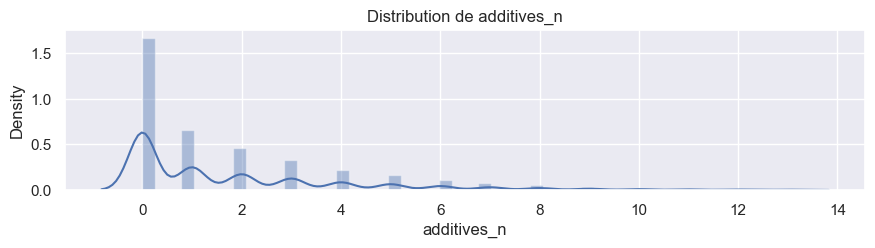

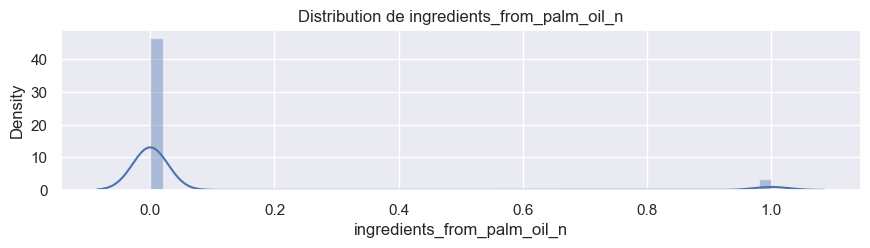

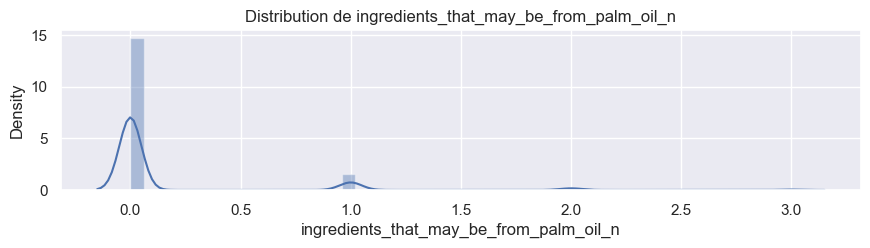

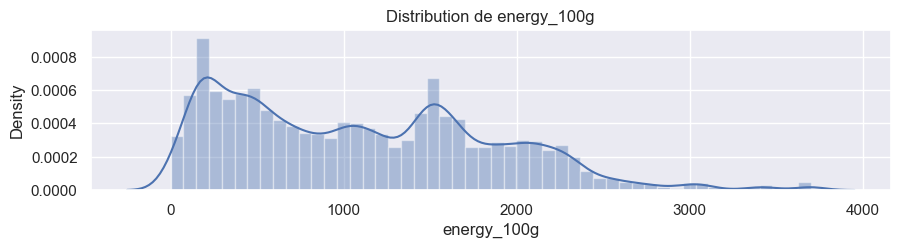

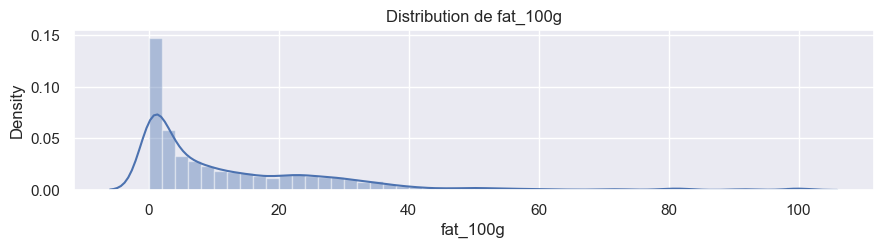

...

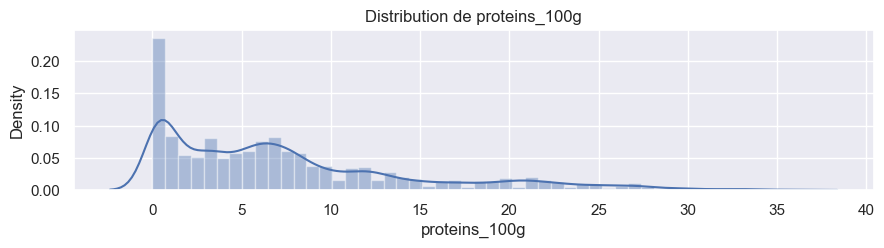

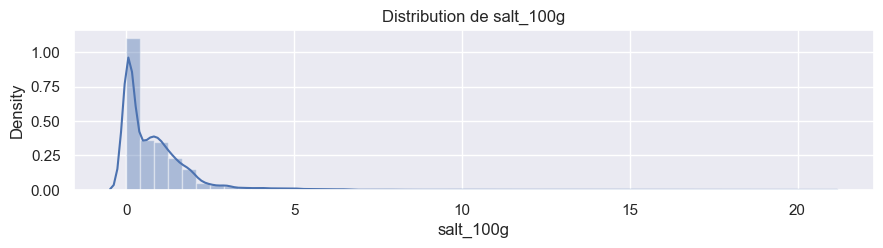

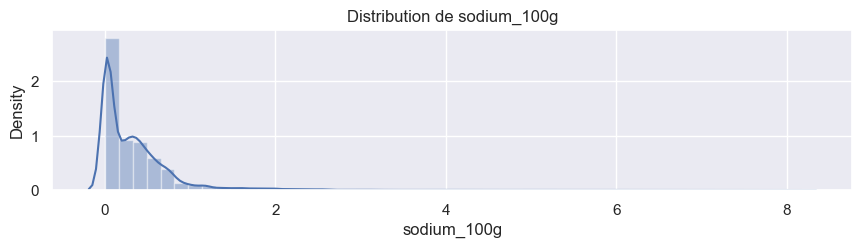

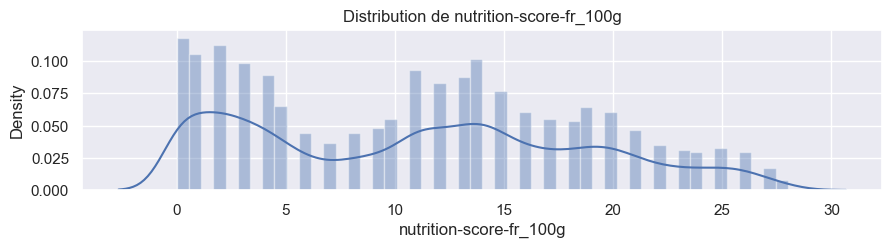

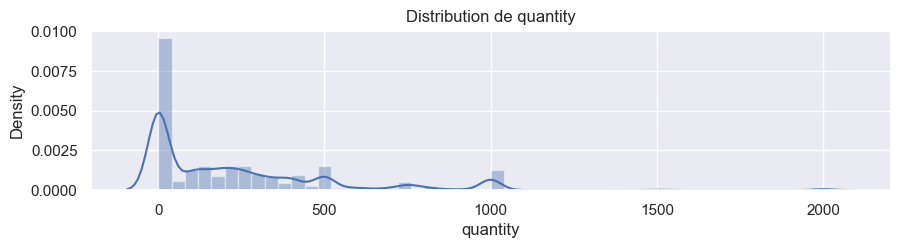

In [474]:
# numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns
# for column in numeric_columns:
#     plt.figure(figsize = (10,2))
#     sns.set(font_scale=1)
#     sns.distplot(data[column], bins=50)
#     chaine = 'Distribution de ' + column
#     plt.title(chaine)
#     plt.xlabel(column)
# #    plt.show()
#     save_figure_opt(chaine,"Aanalyse_univariée_Distribution_par_variable", library='matplotlib')
numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns

for column in numeric_columns:
    plt.figure(figsize = (10,2))
    sns.set(font_scale=1)
    sns.distplot(data[column], bins=50)
    chaine = 'Distribution de ' + column
    plt.title(chaine)
    plt.xlabel(column)
#     x_max = min(100, data[column].max() * 1.1)
#     plt.xlim(0, x_max)
#     plt.ylim(0, 100)
#    plt.show()
    save_figure_opt(chaine,"Aanalyse_univariée_Distribution_par_variable_libre", library='matplotlib')


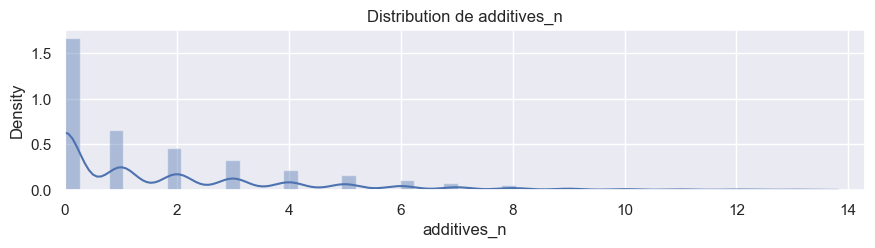

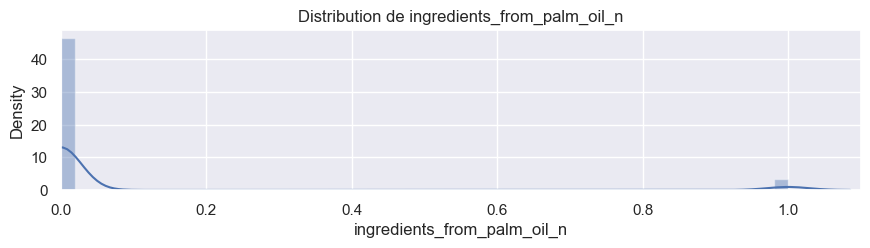

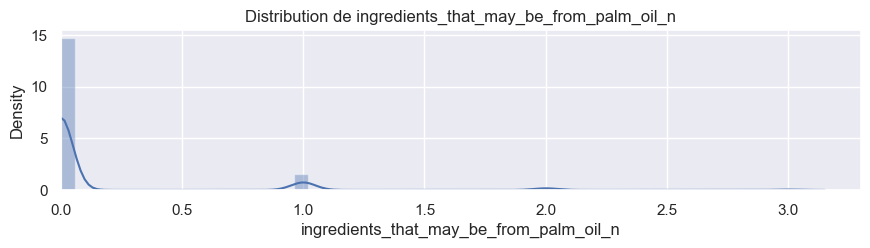

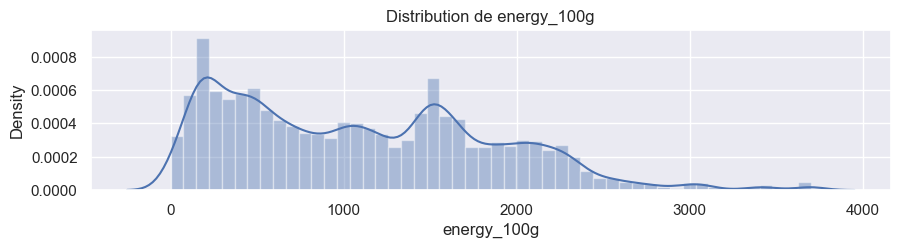

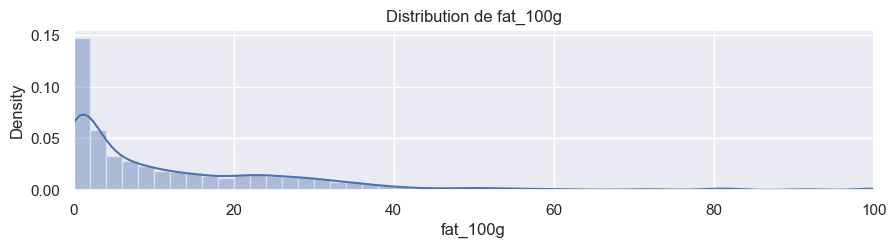

...

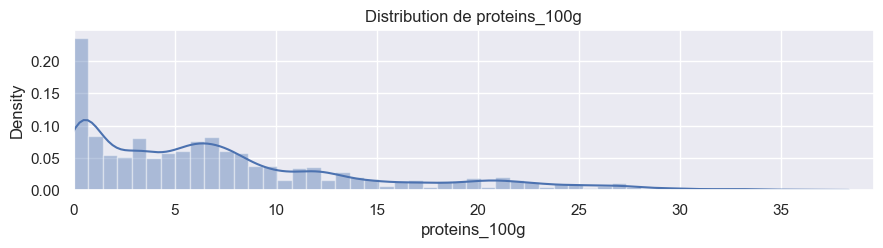

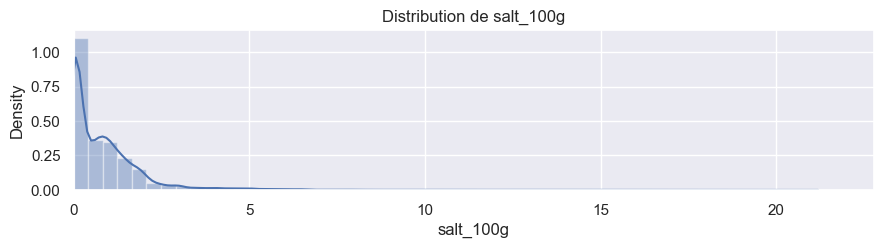

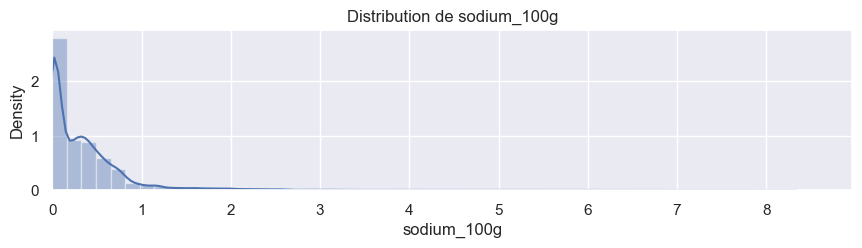

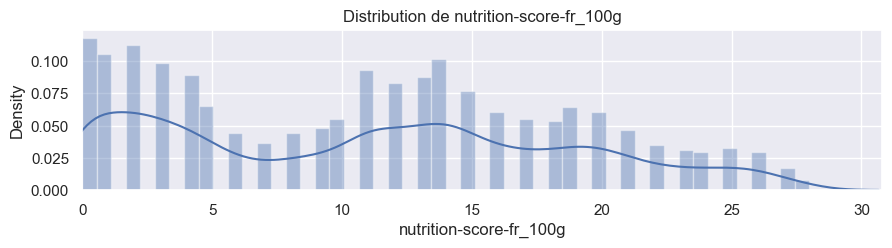

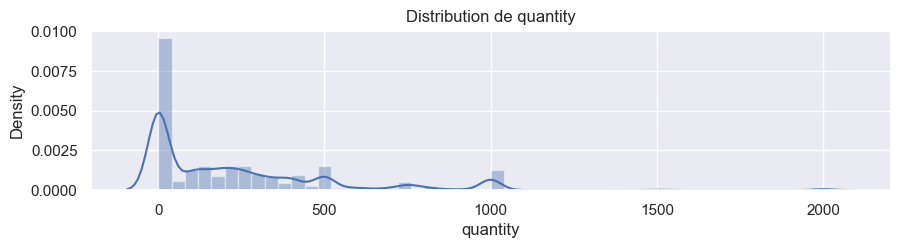

In [475]:
numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns

for column in numeric_columns:
    plt.figure(figsize = (10,2))
    sns.set(font_scale=1)
    if column in ['energy_100g', 'quantity']:
        sns.distplot(data[column].dropna(), bins=50)
    else:
        sns.distplot(data[column], bins=50)
    chaine = 'Distribution de ' + column
    plt.title(chaine)
    plt.xlabel(column)
    if column not in ['energy_100g', 'quantity']:
        x_max = min(100, data[column].max() * 1.1)
        plt.xlim(0, x_max)
    save_figure_opt(chaine,"Aanalyse_univariée_Distribution_par_variable_100g", library='matplotlib')



In [476]:
numeric_columns

Index(['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity'],
      dtype='object')

**Observations :**
* Certaines distributions ont une allure très semblable:
    * fat_100g
    * saturated-fat_100g
    * carbohydrates_100g (à l’exception de la partie entre 40 et 80g)
    * sugars_100g
    * fiber_100g
    * sodium_100g
    * salt_100g
    * proteins_100g
    
    
* Certaines variables sont discrètes:
    * nutrition-score-fr_100g
    * additives_n

### Boîtes à moustaches

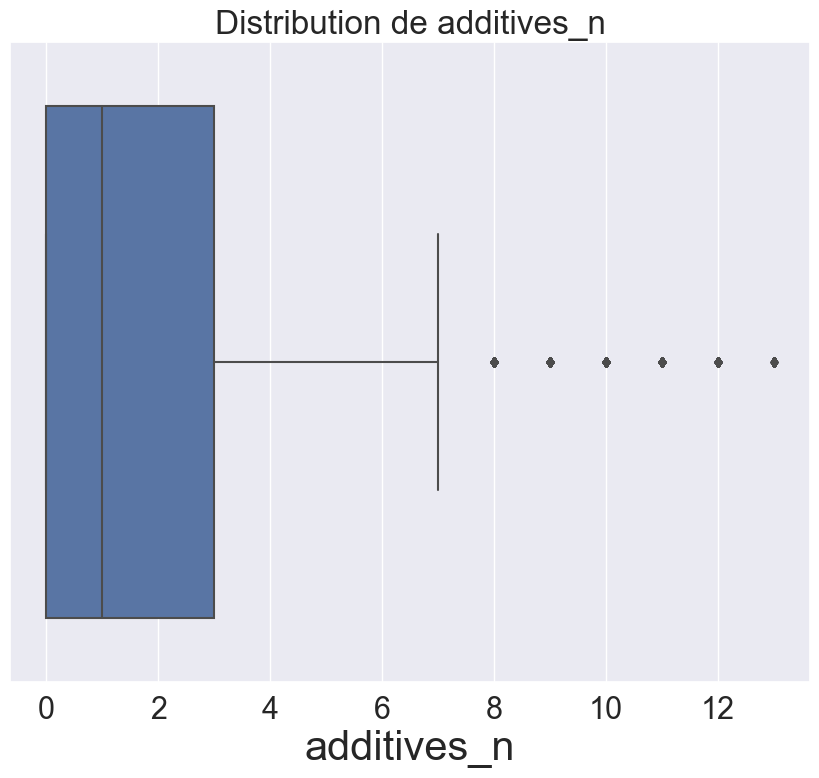

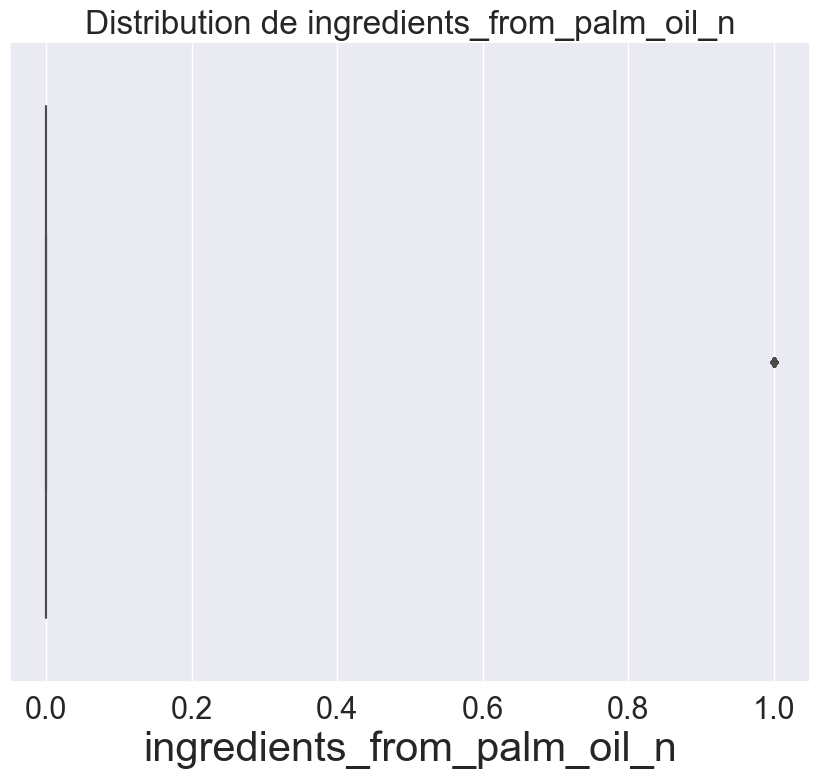

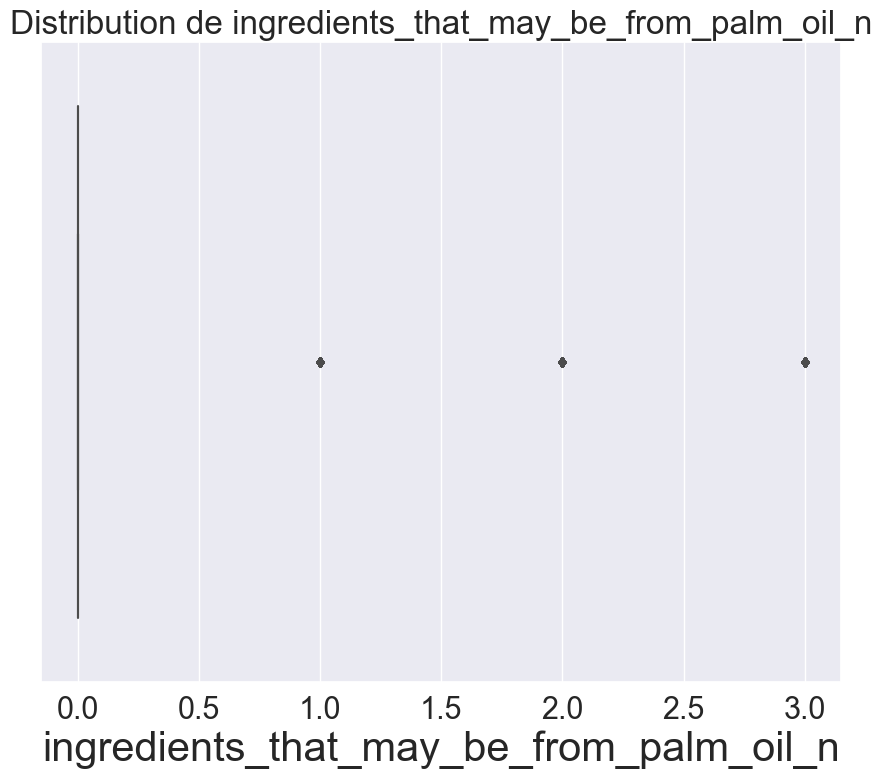

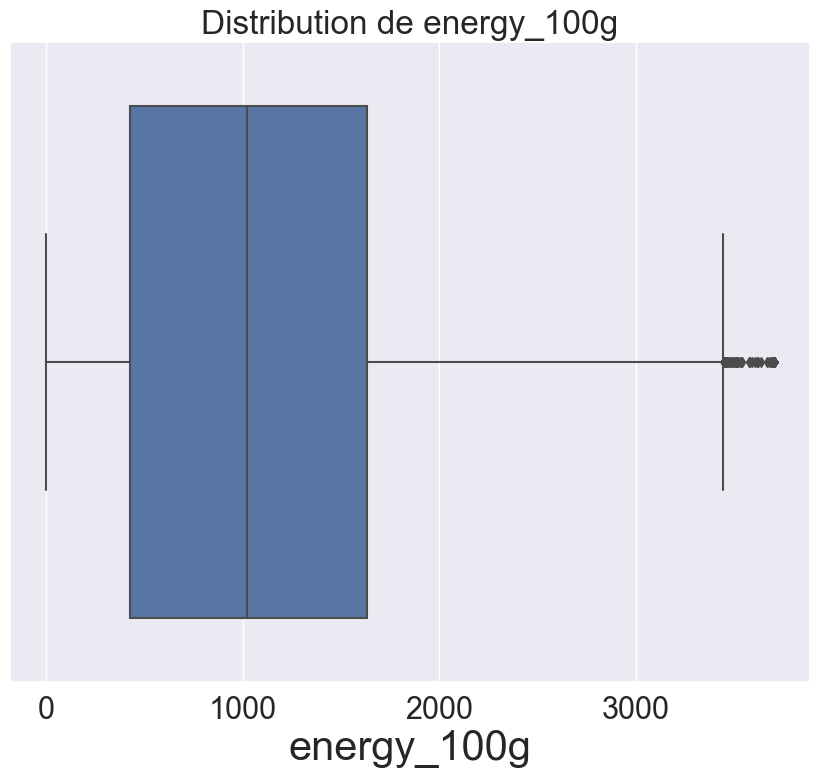

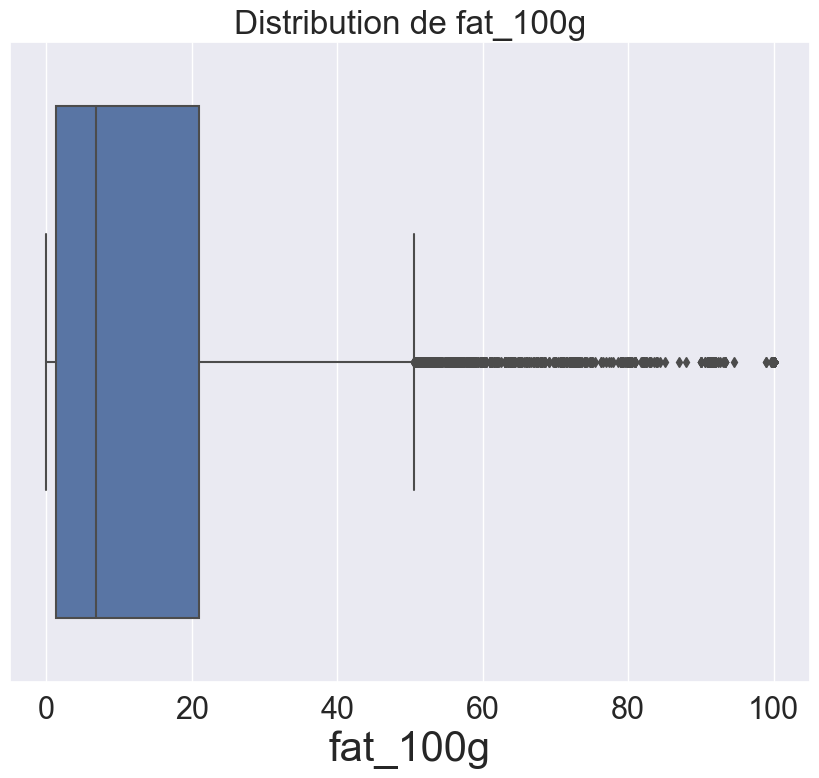

...

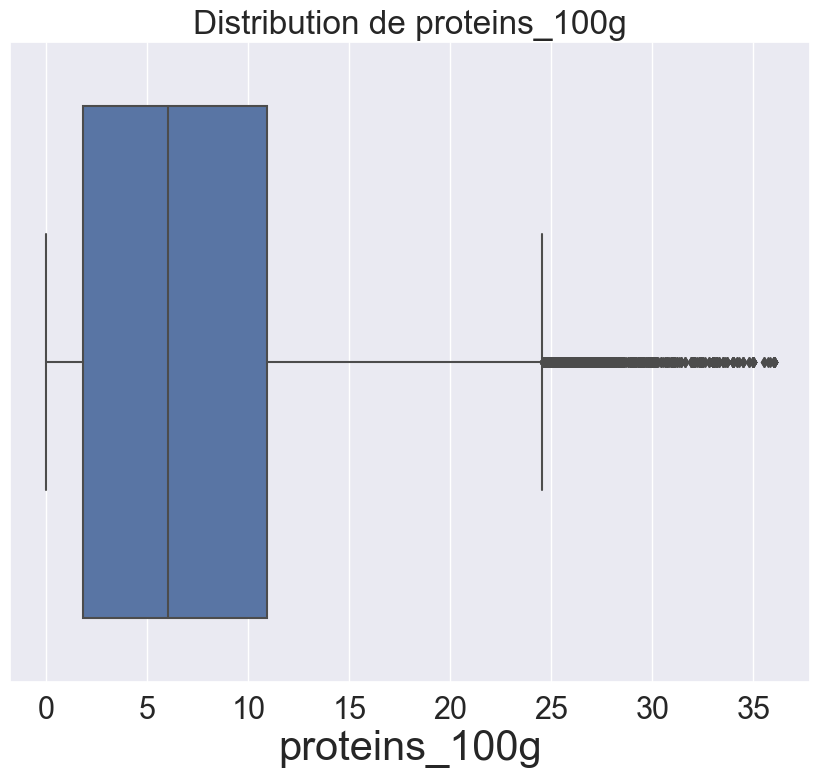

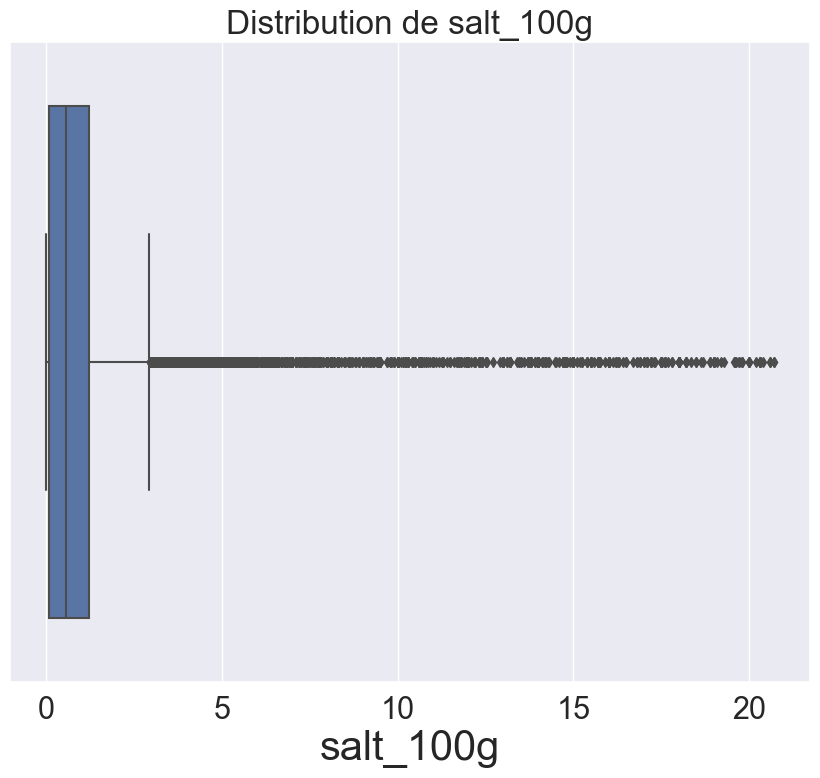

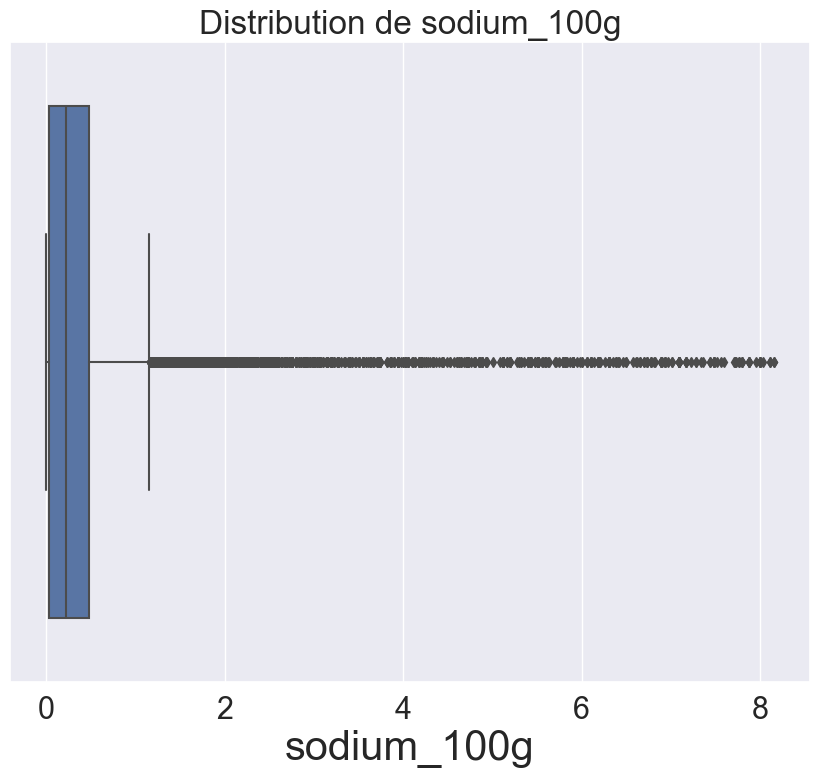

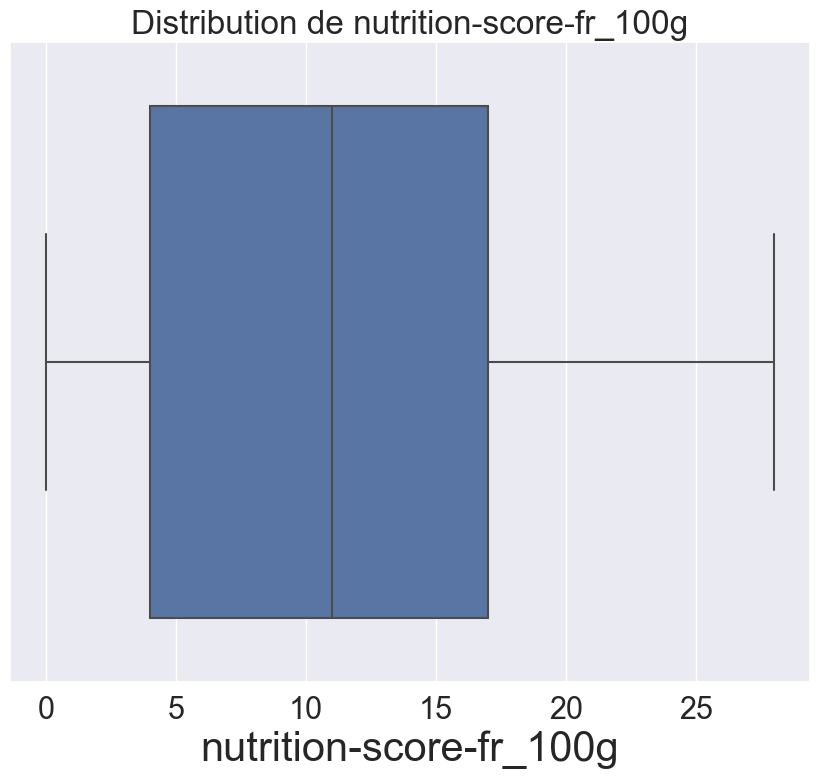

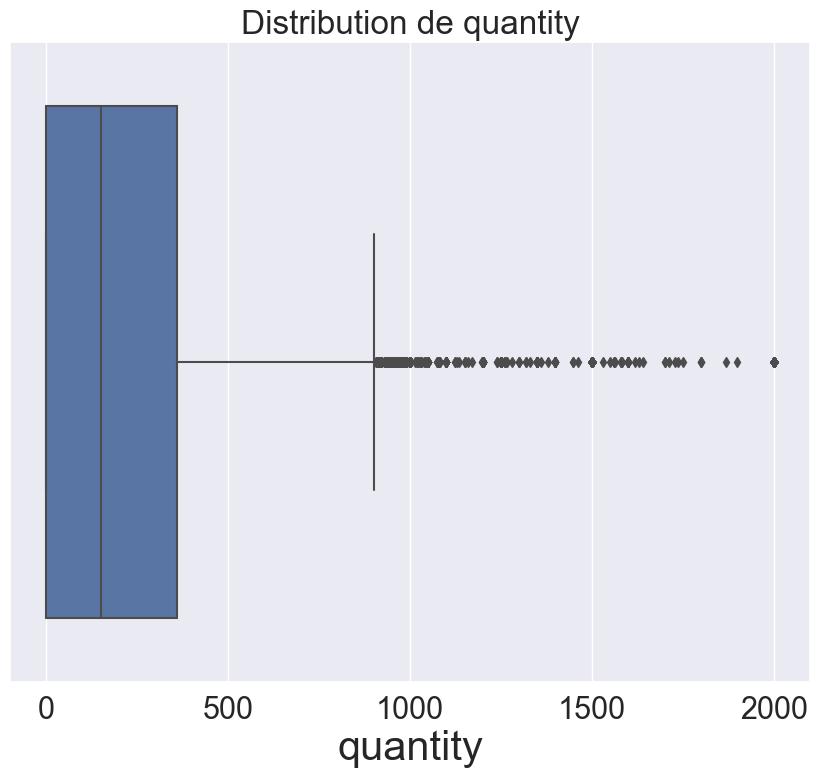

In [477]:
numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns
sns.set(font_scale=2)
for column in numeric_columns:
    plt.figure(figsize = (10,8))
    
    sns.boxplot(data[column])
    chaine = 'Distribution de ' + column
    plt.title(chaine)
    plt.xlabel(column, fontsize=30)
    save_figure_opt(chaine,"Boite_moustache_Distribution_par_variable", library='matplotlib')
#     plt.show()
sns.set(font_scale=1)


En observant les boxplot, on constate que les différentes variables ne semblent pas suivre une loi normale.

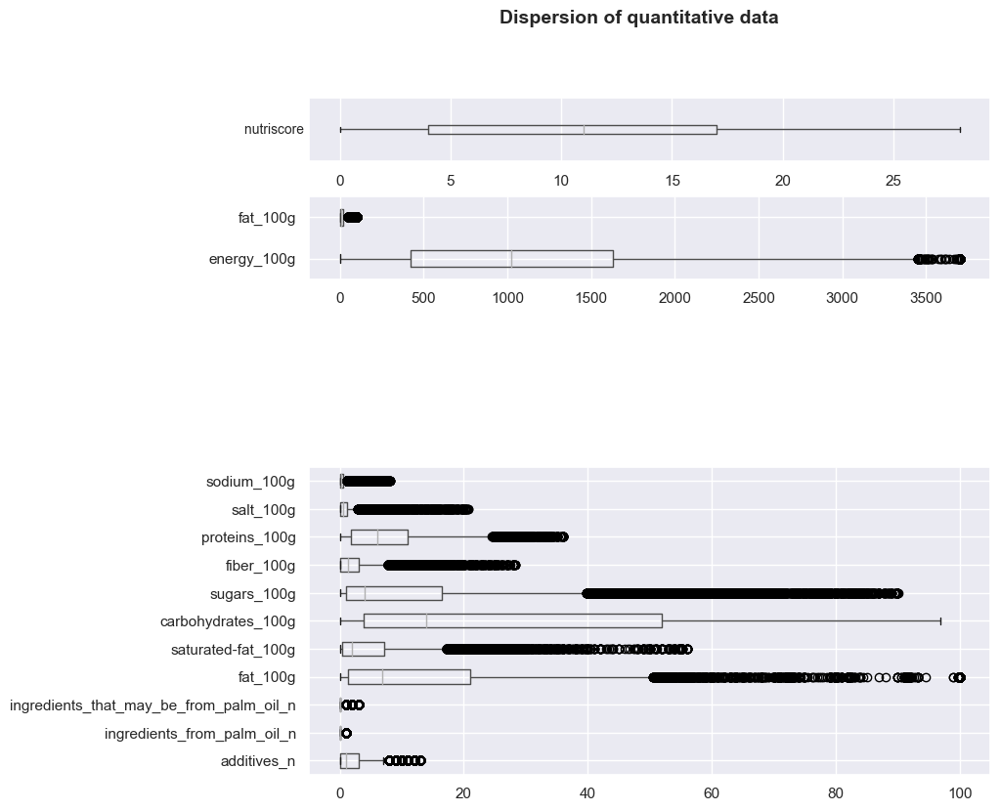

In [478]:
# Plotting boxplot of quantitative features for each nutrigrade

fig = plt.figure(figsize=(9,9))

ax1 = fig.add_subplot(9,1,1)
sel_cols = [ 'nutrition-score-fr_100g']
df[sel_cols].boxplot(vert=False, patch_artist= False, ax=ax1)
# ax1.boxplot(df['nutrition-score-fr_100g'], widths=[0.25], vert=False, patch_artist= False)
ax1.set_ylabel('nutriscore    ', rotation=0, va = 'center', fontsize=10, labelpad = 20)
ax1.set_yticks([])
# ax1.set_yticklabels(['']*10)

ax2 = fig.add_subplot(7,1,2)
# sel_cols = ['energy_100g', 'energy_from_fat_kj_100g']
sel_cols = ['energy_100g', 'fat_100g']
df[sel_cols].boxplot(vert=False, widths=[0.4,0.4], patch_artist= False, ax=ax2)

ax3 = fig.add_subplot(2,1,2)
# sel_cols = ['fat_100g', 'carbohydrates_100g', 'proteins_100g','saturated-fat_100g', 'sugars_100g', 'fiber_100g', 'salt_100g', 'sodium_100g']

sel_cols = ['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
   'proteins_100g', 'salt_100g', 'sodium_100g']

df[sel_cols].boxplot(vert=False, patch_artist= False, ax=ax3)

plt.suptitle('Dispersion of quantitative data', fontsize=14,
             fontweight='bold')

plt.show()


### Barplots

In [479]:
categories_columns = data.select_dtypes(include = ['category']).columns

In [480]:
categories_columns

Index(['creator', 'quantity_original', 'packaging', 'packaging_tags', 'brands',
       'categories_fr', 'labels_fr', 'countries_fr', 'allergens',
       'additives_tags', 'additives_fr', 'nutrition_grade_fr', 'pnns_groups_1',
       'pnns_groups_2', 'states_fr', 'main_category_fr', 'image_url',
       'image_small_url', 'quantity_origine', 'quantity_unit'],
      dtype='object')

In [481]:
data = affectation_types_object(data)

La colonne cities n'existe pas dans le dataframe
La colonne generic_name n'existe pas dans le dataframe
La colonne brands_tags n'existe pas dans le dataframe
La colonne categories n'existe pas dans le dataframe
La colonne categories_tags n'existe pas dans le dataframe
La colonne categories_en n'existe pas dans le dataframe
La colonne origins n'existe pas dans le dataframe
La colonne origins_tags n'existe pas dans le dataframe
La colonne manufacturing_places n'existe pas dans le dataframe
La colonne manufacturing_places_tags n'existe pas dans le dataframe
La colonne labels n'existe pas dans le dataframe
La colonne labels_tags n'existe pas dans le dataframe
La colonne labels_en n'existe pas dans le dataframe
La colonne emb_codes n'existe pas dans le dataframe
La colonne emb_codes_tags n'existe pas dans le dataframe
La colonne first_packaging_code_geo n'existe pas dans le dataframe
La colonne cities_tags n'existe pas dans le dataframe
La colonne purchase_places n'existe pas dans le datafr

In [482]:
# for column in categories_columns:
#     sns.countplot(x = data[column], data = data)
#     plt.title(column)
#     plt.show()
#     print('')

In [483]:
#for column in data.select_dtypes(include = ['object']).columns:
#    sns.countplot(x = data[column], data = data)
#    plt.show()
#    print('')

In [484]:
# for column in categories_columns:
#     data[column].hist()
#     plt.title(column)
#     plt.show()
#     print('')

### Occurences des mots

In [485]:
object_columns = data.select_dtypes(include = ['object']).columns
object_columns

Index(['code', 'url', 'creator', 'created_datetime', 'last_modified_t',
       'product_name', 'packaging', 'packaging_tags', 'brands',
       'ingredients_text', 'allergens', 'additives', 'additives_tags',
       'nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2', 'image_url',
       'image_small_url', 'quantity'],
      dtype='object')

In [486]:
data.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [487]:
df.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [488]:
object_columns = ['code',
                  'product_name',
                  'packaging',
                  'brands',
                  'categories',
                  'stores',
                  'ingredients_text',
                  'nutrition_grade_fr',
                  'pnns_groups_1',
                  'pnns_groups_2',
                  'main_category_en', 
                  'manufacturing_places',
                  'labels_fr',
                  'allergens',
                  'additives',
                  'main_category_fr',
                  'image_nutrition_small_url']

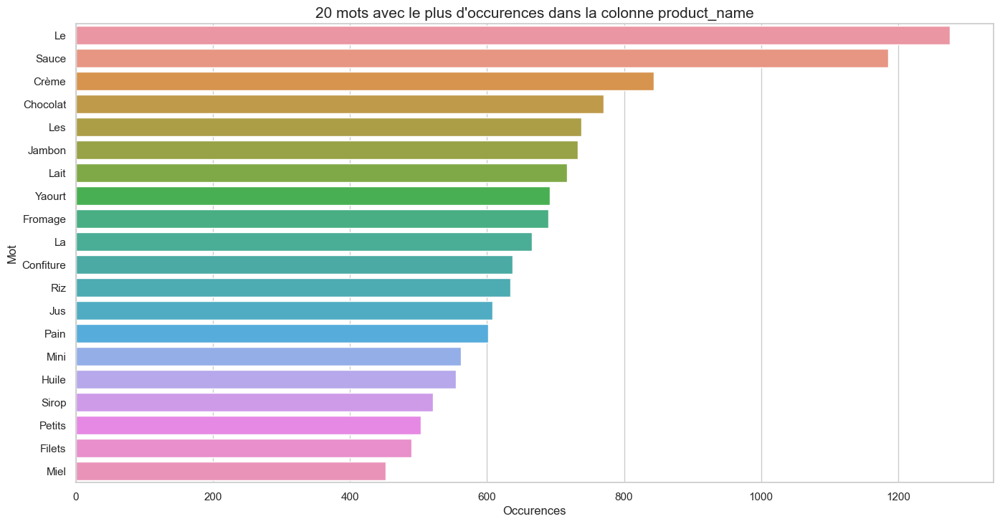

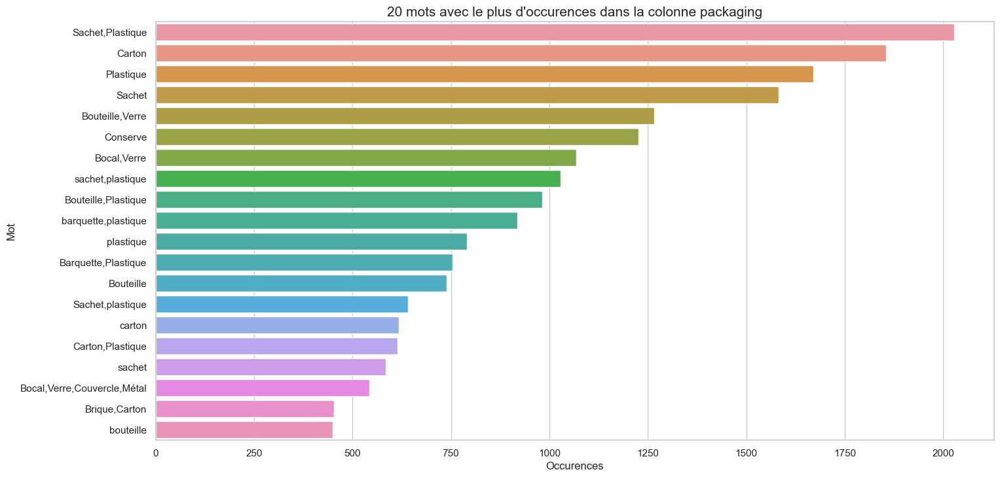

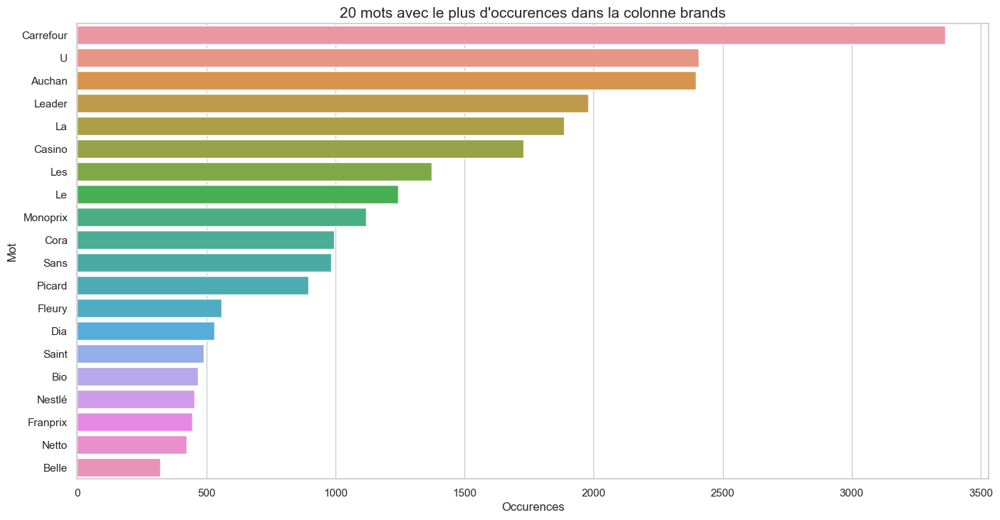

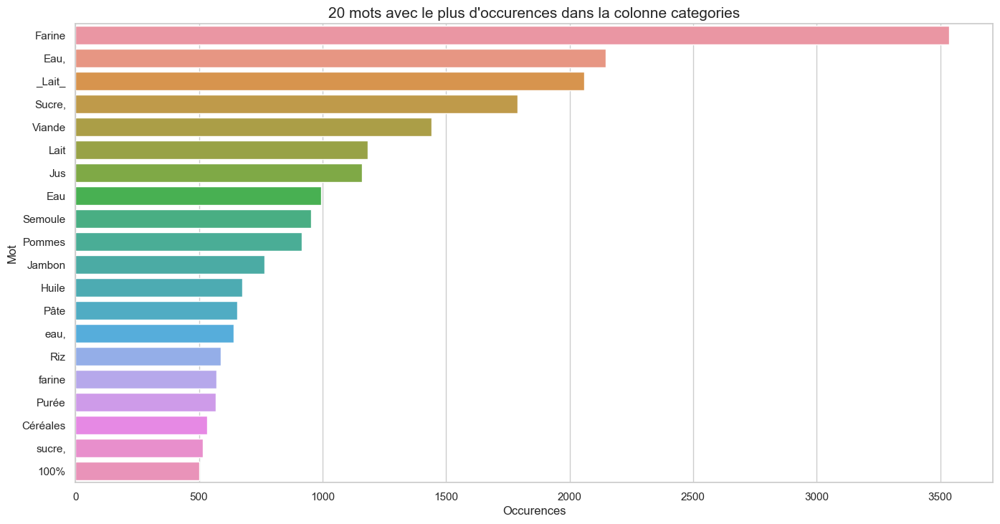

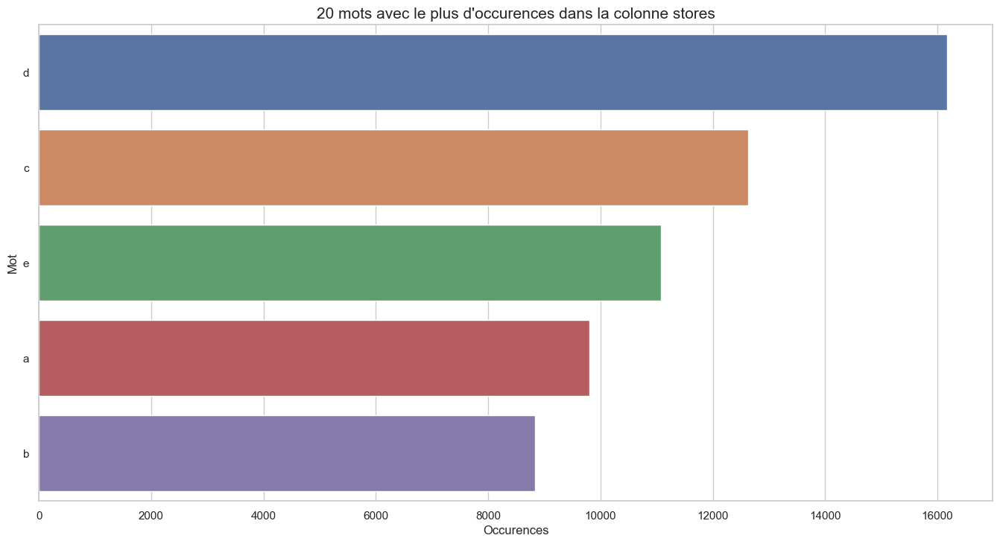

...

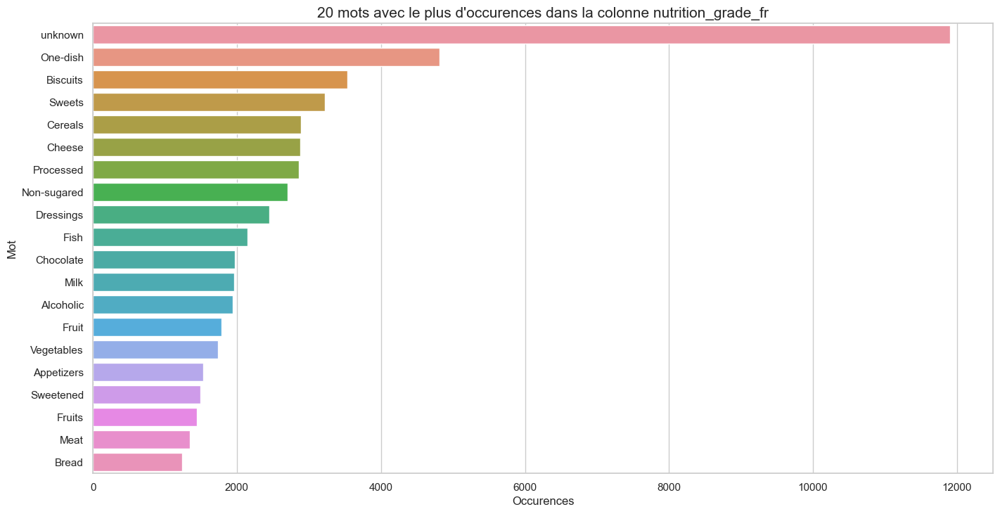

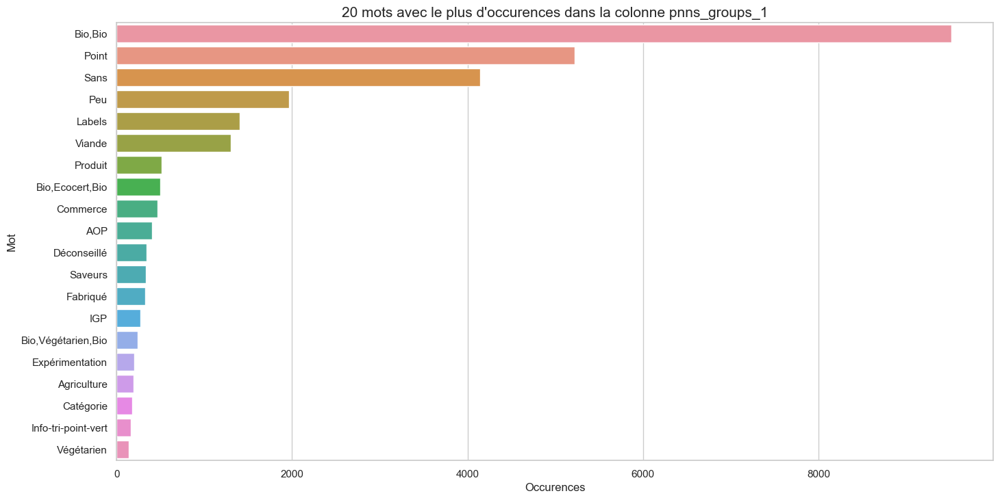

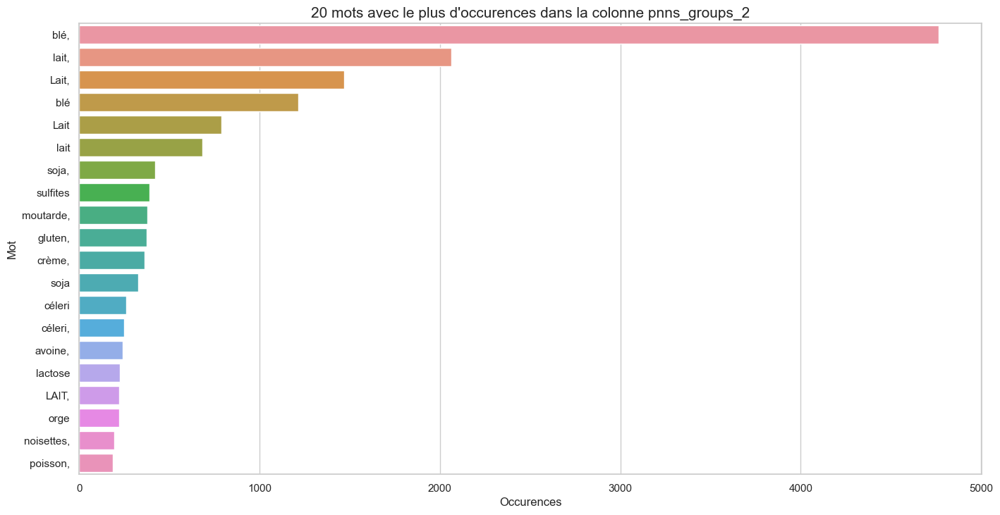

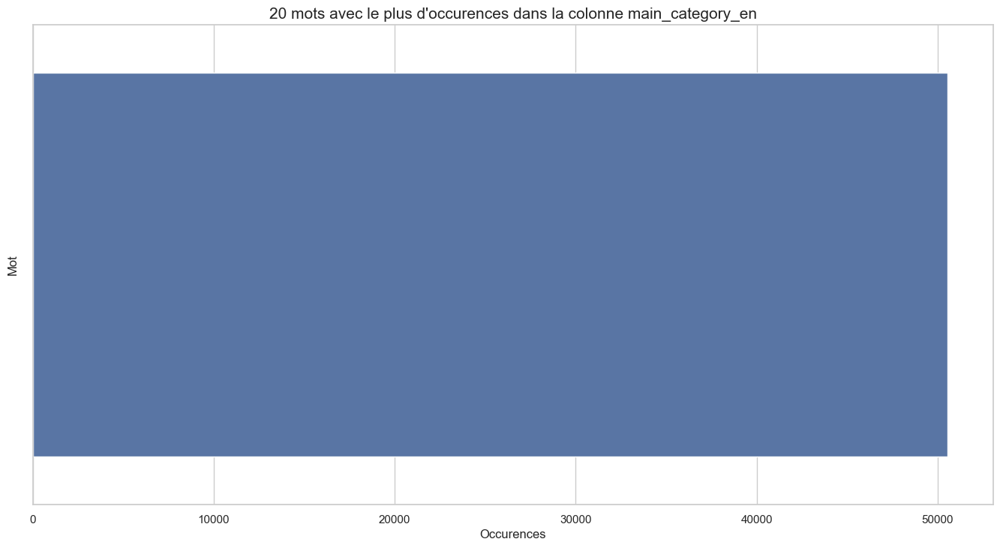

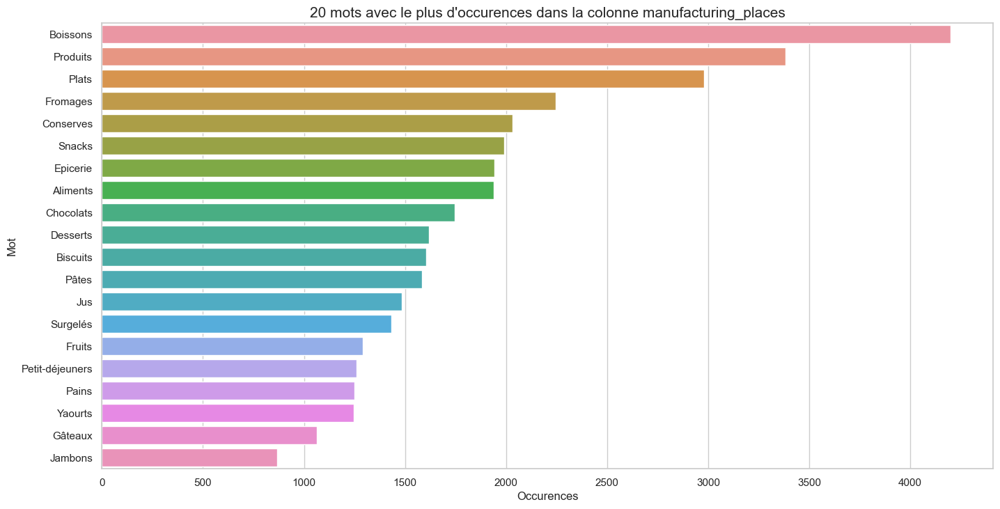

In [489]:
import collections

# Initialisation d'une liste pour stocker les mots populaires de chaque colonne
mots_populaires = []

# Pour chaque colonne de la liste object_columns, vérifier si elle existe dans le dataframe data
for colonne in object_columns :
    if colonne in data.columns:
        # Création d'une liste contenant le premier mot de chaque valeur non nulle de la colonne
        liste_mots = [str(i).split(' ', 1)[0] for i in data[colonne].dropna().tolist()]
        # Ajout des 20 mots les plus fréquents de la colonne dans la liste mots_populaires
        mots_populaires.append(collections.Counter(liste_mots).most_common(20))

# Réglage de la taille de police pour le graphique
sns.set(font_scale=2.5)

# Pour chaque colonne et sa liste de mots populaires, tracer un graphique
for nom_colonne, liste_mots in zip(object_columns[1:], mots_populaires[1:]):
    # Vérification que la liste de mots n'est pas vide
    if liste_mots:
        # Réglages du style et de la taille de la figure
        sns.set(style="whitegrid")
        plt.figure(figsize=(16, 8))

        # Création d'un dataframe contenant les 20 mots les plus fréquents de la colonne
        df_mots_utilises = pd.DataFrame(liste_mots, columns = ['Mot', 'Occurences']).sort_values(by='Occurences', ascending=False)
        df_mots_utilises.head()

        # Tracé d'un graphique en barres horizontales des mots et de leur fréquence
        sns.barplot(y = 'Mot', x='Occurences', data = df_mots_utilises)
        chaine = 'occurences_de_la_colonne_' + nom_colonne
        # Ajout d'un titre au graphique
        plt.title('20 mots avec le plus d\'occurences dans la colonne ' + nom_colonne, size=15)
        
        # Affichage du graphique
        #plt.show()
        save_figure_opt(chaine,"Occurence_par_variable_", library='matplotlib')

# Réinitialisation de la taille de police à la valeur par défaut
sns.set(font_scale=1)



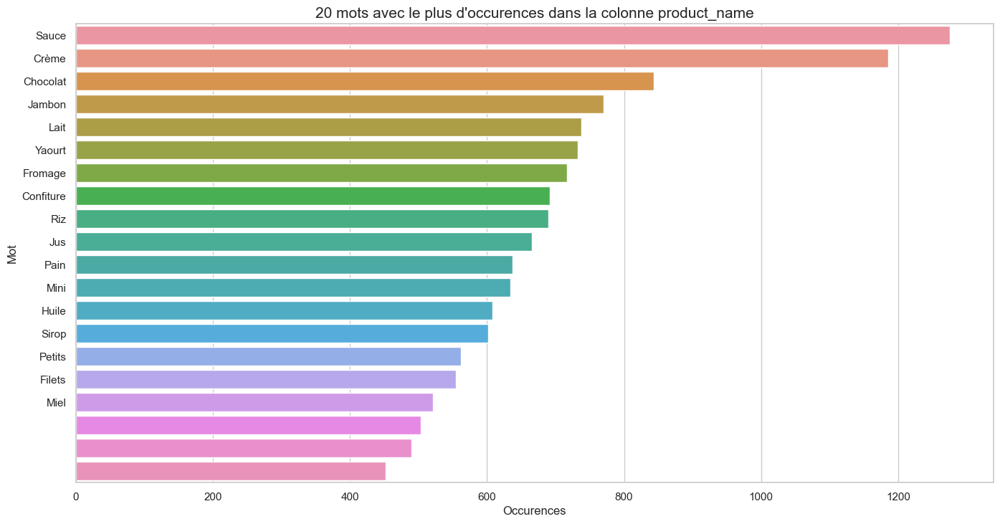

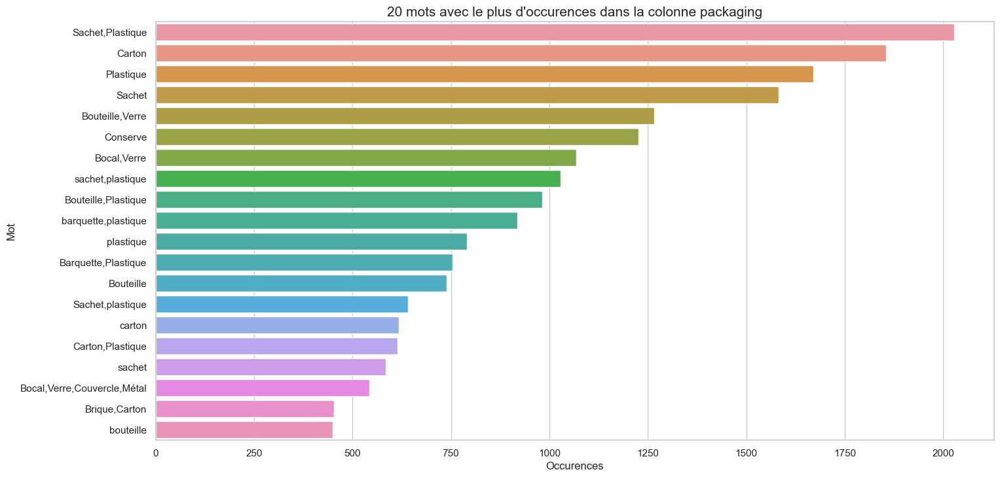

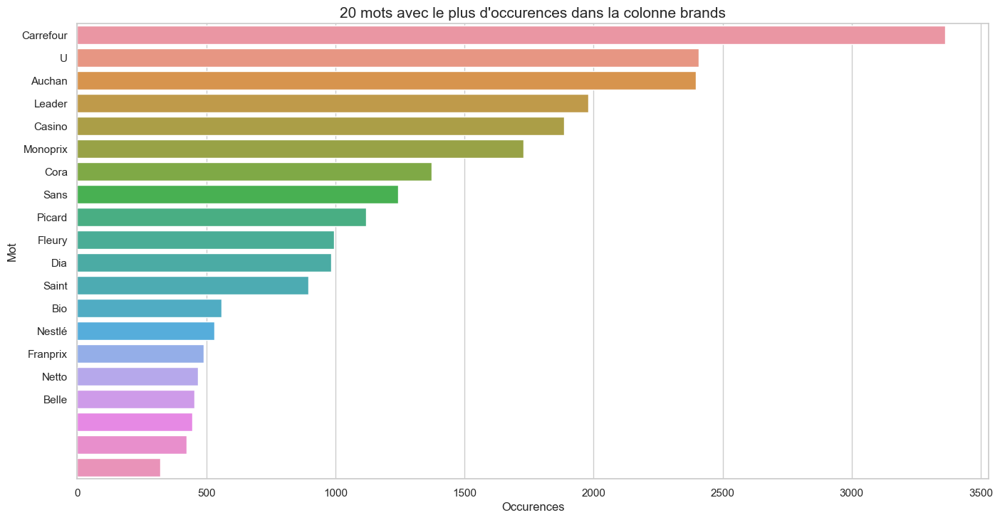

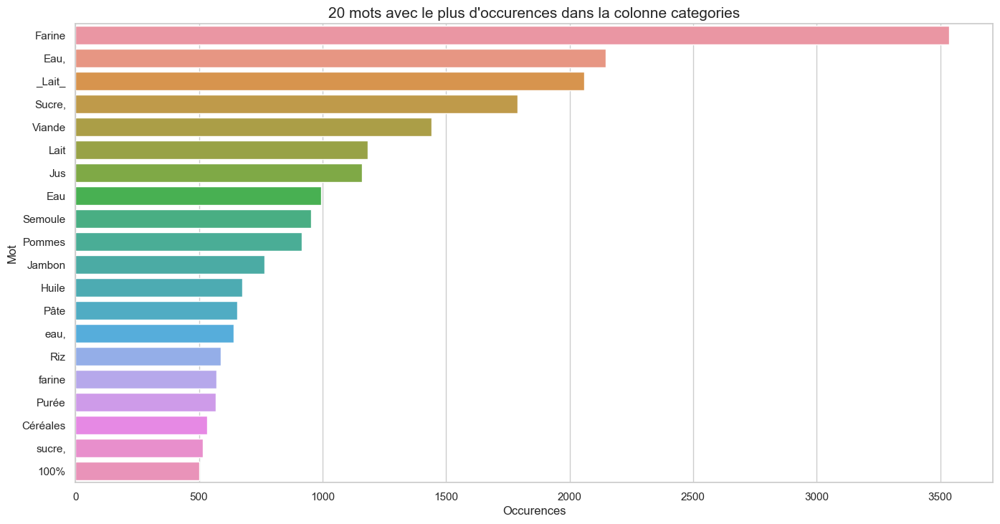

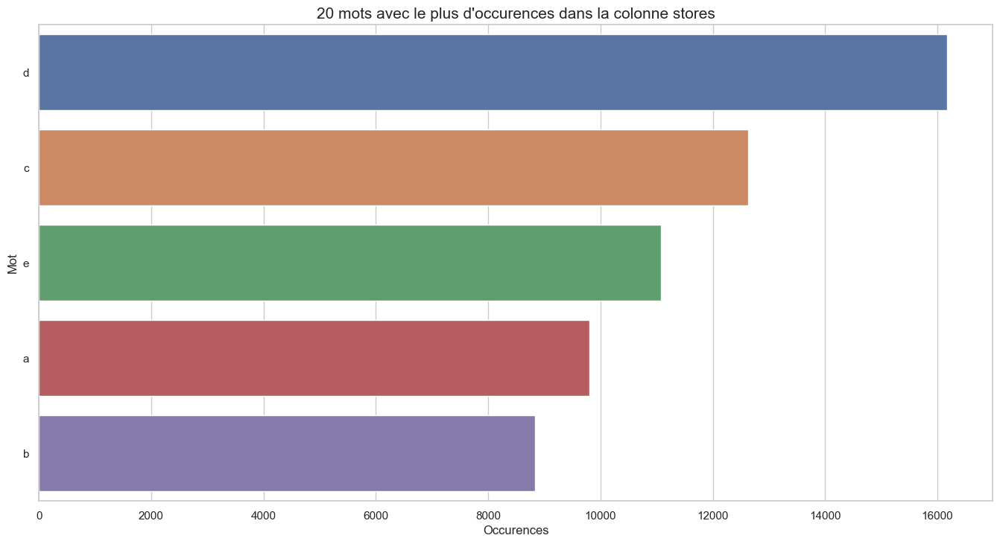

...

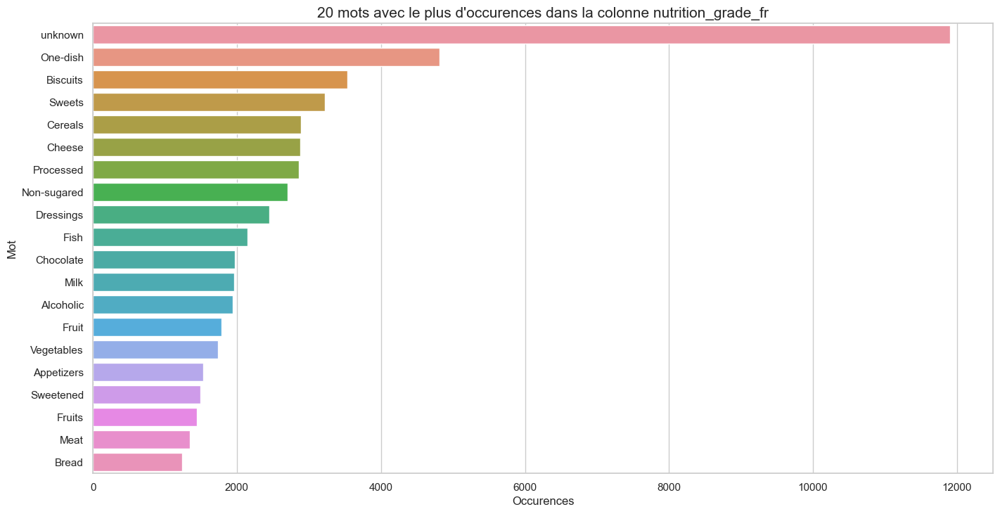

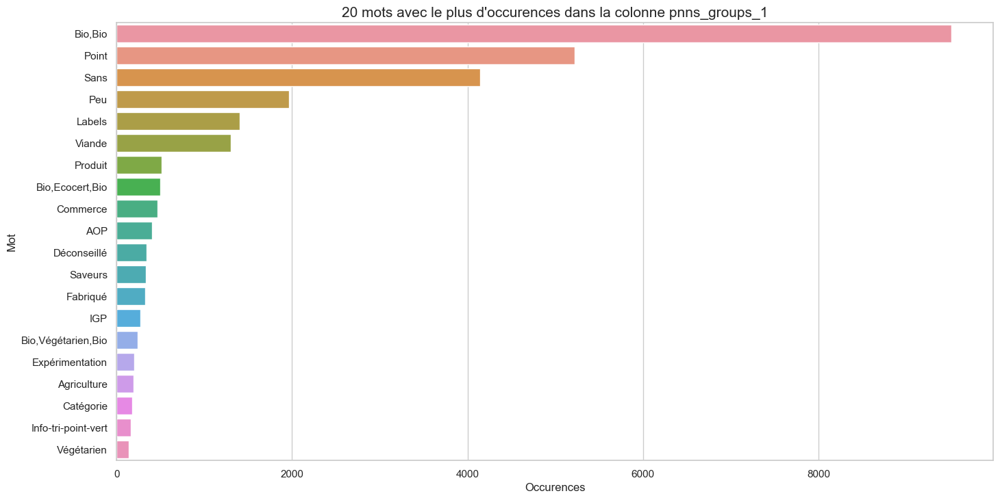

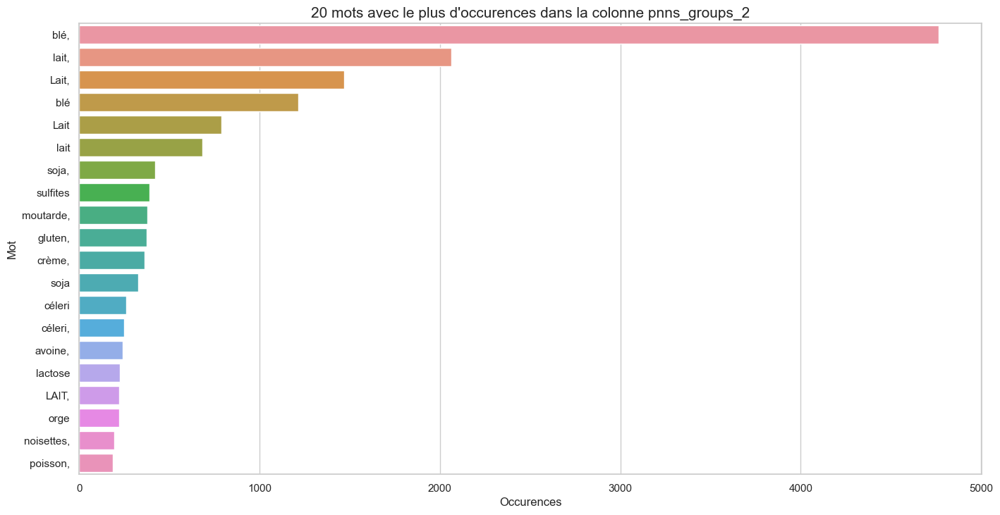

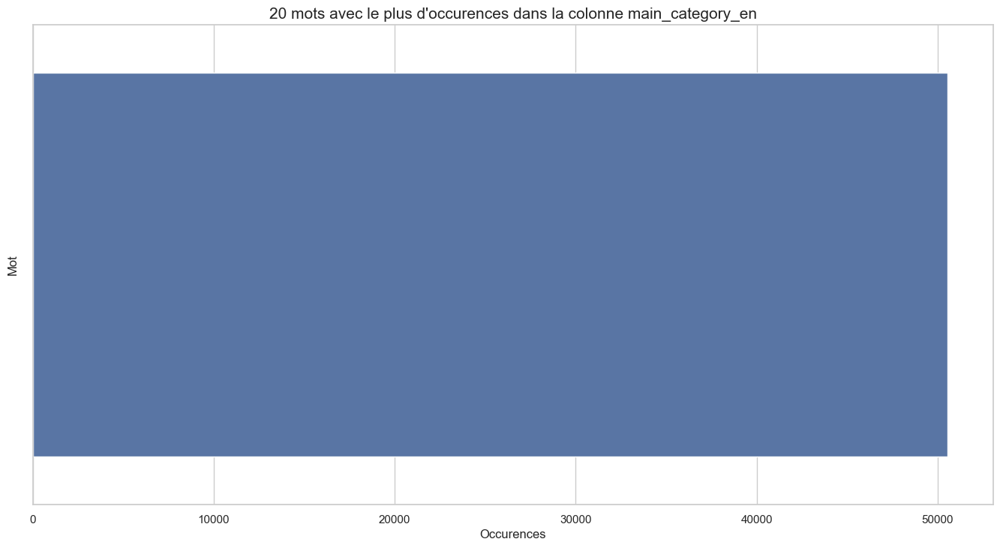

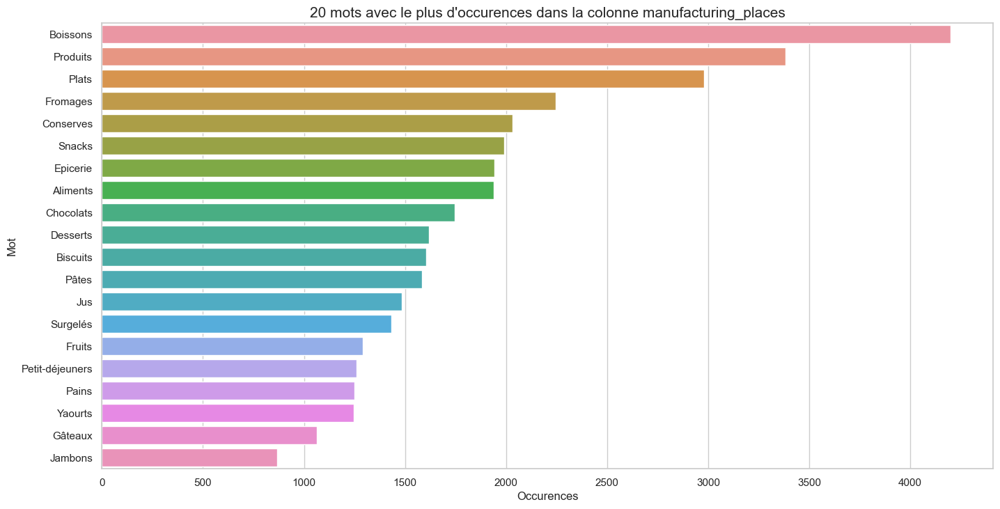

In [490]:
import collections

# Initialisation d'une liste pour stocker les mots populaires de chaque colonne
mots_populaires = []

# Pour chaque colonne de la liste object_columns, vérifier si elle existe dans le dataframe data
for colonne in object_columns :
    if colonne in data.columns:
        # Création d'une liste contenant le premier mot de chaque valeur non nulle de la colonne
        liste_mots = [str(i).split(' ', 1)[0] for i in data[colonne].dropna().tolist()]
        # Ajout des 20 mots les plus fréquents de la colonne dans la liste mots_populaires
        mots_populaires.append(collections.Counter(liste_mots).most_common(20))

# Réglage de la taille de police pour le graphique
sns.set(font_scale=2.5)

# Pour chaque colonne et sa liste de mots populaires, tracer un graphique
for nom_colonne, liste_mots in zip(object_columns[1:], mots_populaires[1:]):
    # Vérification que la liste de mots n'est pas vide
    if liste_mots:
        # Réglages du style et de la taille de la figure
        sns.set(style="whitegrid")
        plt.figure(figsize=(16, 8))

        # Création d'un dataframe contenant les 20 mots les plus fréquents de la colonne
        df_mots_utilises = pd.DataFrame(liste_mots, columns = ['Mot', 'Occurences']).sort_values(by='Occurences', ascending=False)
        df_mots_utilises.head()

        # Tracé d'un graphique en barres horizontales des mots et de leur fréquence
        sns.barplot(y = 'Mot', x='Occurences', data = df_mots_utilises)
        chaine = 'occurences_de_la_colonne_' + nom_colonne
        # Ajout d'un titre au graphique
        plt.title('20 mots avec le plus d\'occurences dans la colonne ' + nom_colonne, size=15)
        
        # Suppression des articles définis et indéfinis dans les labels de l'axe y
        labels = [label.get_text() for label in plt.gca().get_yticklabels()]
        labels = [label for label in labels if label not in ['le', 'la', 'les', 'un', 'une', 'des','Le', 'La', 'Les', 'Un', 'Une', 'Des']]
        plt.yticks(range(len(labels)), labels)
        
        # Réduction de l'espace blanc autour du graphique
        plt.tight_layout()
        
        # Affichage du graphique
        #plt.show()
        save_figure_opt(chaine,"Occurence_par_variable_", library='matplotlib')

# Réinitialisation de la taille de police à la valeur par défaut
sns.set(font_scale=1)


### Informations sur les données

In [491]:
df.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [494]:
qual_cols = ['nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2','brands',
 'countries_fr', 'categories_fr', 'main_category_fr',
 'additives', 'labels_fr', 'allergens', 'packaging',
 'packaging']

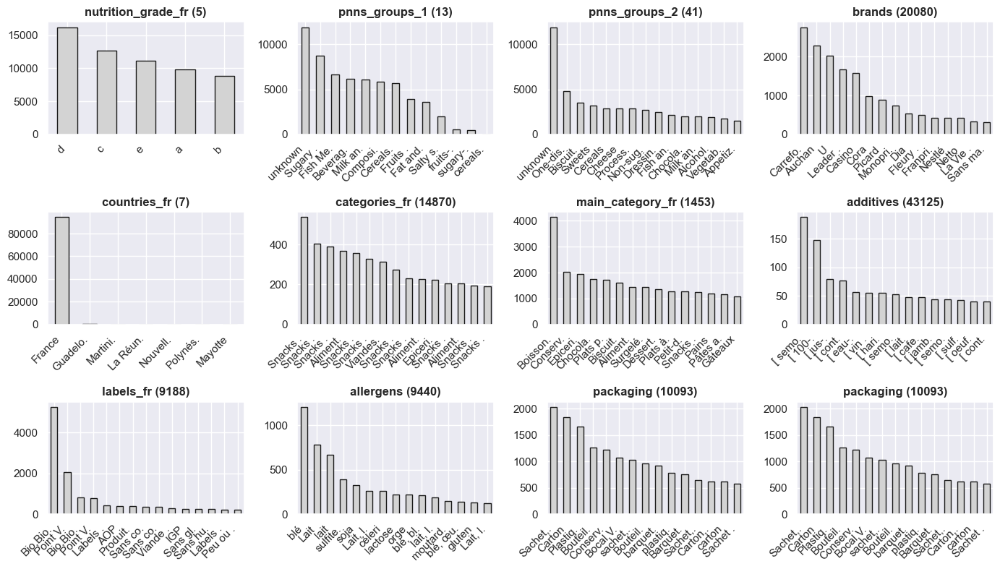

In [495]:
# Plotting bar plots of the main categorical columns

fig = plt.figure(figsize=(14,10))
for i, c in enumerate(qual_cols,1):
    ax = fig.add_subplot(4,4,i)
    ser = df[c].value_counts()
    n_cat = ser.shape[0]
    if n_cat>15:
        ser[0:15].plot.bar(color='lightgrey',ec='k', ax=ax)
    else:
        ser.plot.bar(color='lightgrey',ec='k',ax=ax)
    ax.set_title(c+f' ({n_cat})', fontweight='bold')
    labels = [item.get_text() for item in ax.get_xticklabels()]
    short_labels = [s[0:7]+'.' if len(s)>7 else s for s in labels]
    ax.axes.set_xticklabels(short_labels)
    plt.xticks(rotation=45, ha='right')
plt.tight_layout()

plt.show()

Certaines caractéristiques ont beaucoup de catégories ('main category_fr', 'brands', 'packaging', tandis que d'autres ('nutrition_grade_fr', 'pnns_groups_1' 'pnns_groups_2' en ont moins.

## 2 Analyse temporelle 
Nous allons définir des fonctions utiles pour l'analyse temporelle des données présentées ci-dessous.

## 2.1 Evolution au fil du temps 
Traçons le nombre de nouvelles entrées par périodes de temps.

In [496]:
data 

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,1458238638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,1473538082,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,1442570752,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations

In [497]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

In [498]:
df

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,1458238638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,1473538082,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,1442570752,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations

In [499]:
dfxx = df.copy()
# Conversion de la colonne 'date' en type datetime
dfxx['created_datetime'] = pd.to_datetime(df['created_datetime'])

# Récupération des années uniques
unique_years = dfxx['created_datetime'].dt.year.unique()

print(unique_years)

[2016 2015 2013 2017 2012 2014]


In [501]:
dfxxx = df.copy()
# Conversion de la colonne 'date' en type datetime
dfxxx['last_modified_t'] = pd.to_datetime(df['last_modified_t'])

# Récupération des années uniques
unique_years = dfxxx['last_modified_t'].dt.year.unique()

print(unique_years)

[1970]


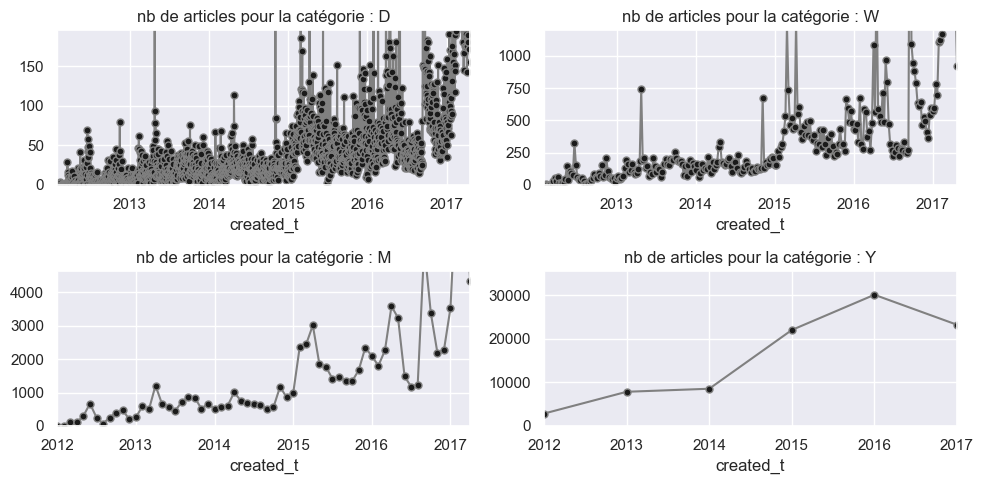

In [502]:
# # Convertir "last_modified_t" en index de date et heure
# df['last_modified_t'] = pd.to_datetime(df['last_modified_t'], unit='s')
# df.set_index('last_modified_t', inplace=True)
# Vérifier si "last_modified_t" existe dans le dataframe
df_f2 = df.copy()
# if 'last_modified_t' in df.columns:
#     # Vérifier si "last_modified_t" a besoin d'être converti en datetime index
#     if not pd.api.types.is_datetime64_any_dtype(df['last_modified_t']):
#         df_f1['last_modified_t'] = pd.to_datetime(df['last_modified_t'], unit='s')

#     # Vérifier si la colonne "last_modified_t" est l'index du dataframe
#     if 'last_modified_t' not in df.index.names:
#         df_f1.set_index('last_modified_t', inplace=True)
# else:
df_f2['created_t'] = pd.to_datetime(df['created_t'], unit='s')
df_f2.set_index('created_t', inplace=True)
# print(df_f1['last_modified_t'])
# Tracer le nombre de nouveaux éléments au fil du temps
fig = plt.figure(figsize=(10,5))  # Créer une figure
for i,per in enumerate(['D', 'W', 'M', 'Y'],1):  # Itérer sur les fréquences de temps (Jour, Semaine, Mois, Année)
    ax = fig.add_subplot(2,2,i)  # Ajouter un sous-plot à la figure
    t_ser = df_f2.groupby(pd.Grouper(freq=per)).size()  # Grouper les données par période de temps (fréquence) et calculer la taille de chaque groupe
    t_ser.plot(ax=ax, ms=5, marker='o', mfc='k', color='grey', ls='-')  # Tracer les données sur le sous-plot
    ax.set(ylim=(0,np.mean(t_ser)+2*np.std(t_ser)))  # Définir la limite verticale des données
    ax.set_title("nb de articles pour la catégorie : "+per)  # Définir le titre du sous-plot
fig.tight_layout()  # Ajuster la disposition des sous-plots
plt.show()  # Afficher la figure



In [503]:
df_f1

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,1458238638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,1473538082,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,1442570752,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations

In [504]:
df

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,1434535914,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,1458238638,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,1473538082,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,1442570752,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals and potatoes,Legumes,"A compléter,Informations

la colonne existe dans le dataframe
les colonnes df 
Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'product_name', 'quantity_original', 'packaging',
       'packaging_tags', 'brands', 'categories_fr', 'labels_fr',
       'countries_fr', 'ingredients_text', 'allergens', 'additives_n',
       'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')
0       2016-09-17 09:18:13
1       2015-06-17 10:11:54
2       2016-03-17 18:17:18
3       2016-09-10 20:08:02
4       2015-09

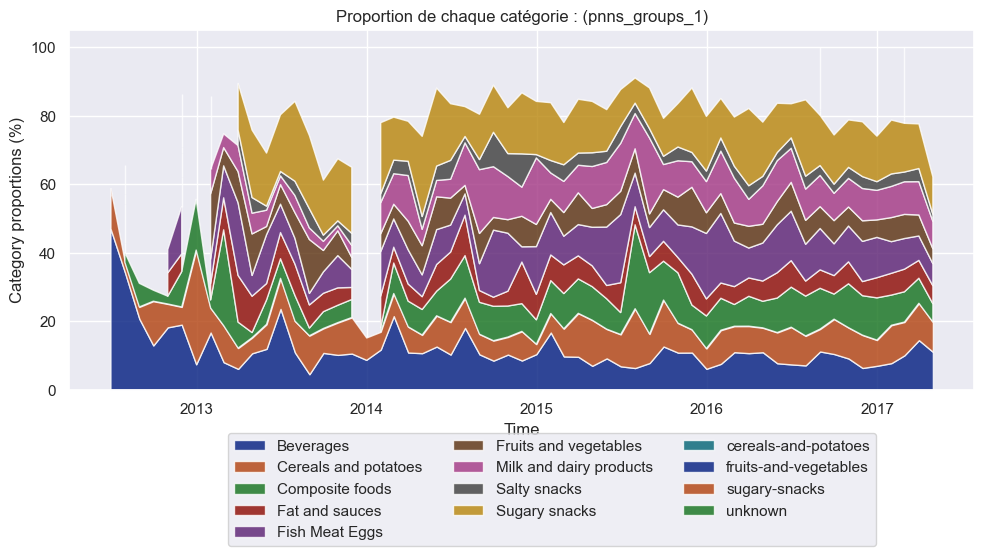

In [507]:
# Plotting proportion of pnns1 among newly entered items
# # Charger les données
# df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')
# df
pnns1_n_item_prop = plot_cat_prop_thr_time(df, 'pnns_groups_1')

plt.show()



In [508]:
df

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,2016-09-17 09:18:13,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,2015-06-17 10:11:54,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,2016-03-17 18:17:18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,2016-09-10 20:08:02,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,2015-09-18 10:05:52,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals a

In [509]:
# calculating regression for the proportion on new items
# for each pnns1 category through time

reg_pnns1_prop = mult_reg_thr_time(pnns1_n_item_prop)
reg_pnns1_prop

,Beverages,Cereals and potatoes,Composite foods,Fat and sauces,Fish Meat Eggs,Fruits and vegetables,Milk and dairy products,Salty snacks,Sugary snacks,cereals-and-potatoes,fruits-and-vegetables,sugary-snacks,unknown
coef,-0.006212,0.017494,-0.016957,0.006723,-0.017258,0.003650,0.002314,-0.000235,-0.002327,-0.000290,-0.002683,0.000619,0.015163
intercept,11.137072,6.542056,11.915888,5.373832,12.071651,6.386293,9.112150,2.881620,14.641745,0.077882,1.246106,0.623053,17.990654
mean,10.574873,8.125274,10.381265,5.982226,10.509843,6.716594,9.321601,2.860328,14.431138,0.051615,1.003281,0.679080,19.362881


In [510]:
df

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,2016-09-17 09:18:13,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,2015-06-17 10:11:54,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,2016-03-17 18:17:18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,2016-09-10 20:08:02,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,2015-09-18 10:05:52,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals a

In [511]:
pnns1_n_item_prop

pnns_groups_1,Beverages,Cereals and potatoes,Composite foods,Fat and sauces,Fish Meat Eggs,Fruits and vegetables,Milk and dairy products,Salty snacks,Sugary snacks,cereals-and-potatoes,fruits-and-vegetables,sugary-snacks,unknown
last_modified_t,,,,,,,,,,,,,
2012-04-30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.000000
2012-05-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,100.000000,NaN,NaN,NaN,NaN
2012-06-30,47.058824,11.764706,NaN,NaN,NaN,5.882353,NaN,NaN,11.764706,NaN,NaN,NaN,23.529412
2012-07-31,34.285714,2.857143,2.857143,2.857143,11.428571,2.857143,8.571429,NaN,25.714286,NaN,NaN,NaN,8.571429
2012-08-31,20.689655,3.448276,6.896552,NaN,3.448276,31.034483,10.344828,3.448276,20.689655,NaN,NaN,NaN,NaN
2012-09-30,12.903226,12.903226,3.225806,NaN,16.129032,6.451613,6.451613,3.225806,19.354839,NaN,NaN,NaN,19.354839
2012-10-31,18.181818,6.818182,2.272727,6.818182,6.818182,NaN,4.545455,NaN,6.818182,NaN,2.272727,NaN,45.454545
2012-11-30,18.965517,5.172414,10.344828,5.172414,13.793103,8.620690,6.896552,1.724138,15.517241,NaN,NaN,NaN,13.793103
2012-12-31,7.407407,33.333333,14.814815,NaN,3.703704,7.407407,11.111111,3.703704,7.407407,NaN,3.703704,NaN,7.407407


In [512]:
pnns1_n_item_prop = pnns1_n_item_prop.fillna(0).round(2)
pnns1_n_item_prop = pnns1_n_item_prop.drop('unknown', axis=1, inplace=True)



In [513]:
pnns1_n_item_prop 


In [514]:
reg_pnns1_prop = mult_test(data_df = pnns1_n_item_prop, test_func = 'stat',
                           res_df=reg_pnns1_prop, print_opt=True)

           Beverages  Cereals and potatoes  Composite foods  Fat and sauces  \
coef      -0.006212   0.017494             -0.016957         0.006723         
intercept  11.137072  6.542056              11.915888        5.373832         
mean       10.574873  8.125274              10.381265        5.982226         

           Fish Meat Eggs  Fruits and vegetables  Milk and dairy products  \
coef      -0.017258        0.003650               0.002314                  
intercept  12.071651       6.386293               9.112150                  
mean       10.509843       6.716594               9.321601                  

           Salty snacks  Sugary snacks  cereals-and-potatoes  \
coef      -0.000235     -0.002327      -0.000290               
intercept  2.881620      14.641745      0.077882               
mean       2.860328      14.431138      0.051615               

           fruits-and-vegetables  sugary-snacks    unknown  
coef      -0.002683               0.000619       0.01516

la colonne existe dans le dataframe
les colonnes df 
Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'product_name', 'quantity_original', 'packaging',
       'packaging_tags', 'brands', 'categories_fr', 'labels_fr',
       'countries_fr', 'ingredients_text', 'allergens', 'additives_n',
       'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')
0       2016-09-17 09:18:13
1       2015-06-17 10:11:54
2       2016-03-17 18:17:18
3       2016-09-10 20:08:02
4       2015-09

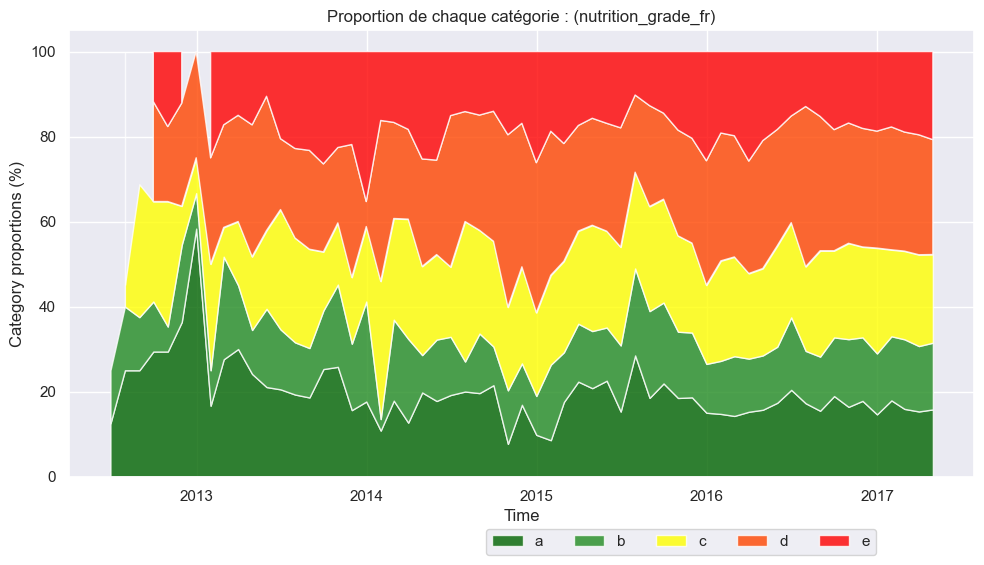

,a,b,c,d,e
coef,-0.04,-0.00,0.01,0.02,0.01
intercept,83.46,10.58,1.73,2.05,2.18
mean,47.98,9.29,11.41,18.56,12.76


In [515]:
# plotting graph, calculating regression and testing for stationarity

nutri_pal = ['darkgreen', 'forestgreen', 'yellow', 'orangered', 'red']

nutrig_n_item_prop = plot_cat_prop_thr_time(df,'nutrition_grade_fr', palette=nutri_pal,
                                            ncol=5)
# nutrig_n_item_prop = nutrig_n_item_prop.fillna(0).round(2)
# print ("*****************      nutrig_n_item_prop                     : ")
# print(nutrig_n_item_prop)
# reg_nutrig_prop = mult_reg_thr_time(nutrig_n_item_prop)
# reg_nutrig_prop = reg_nutrig_prop.fillna(0).round(2)
# print("**************         reg_nutrig_prop                     : ")
# print(reg_nutrig_prop)
# reg_nutrig_prop = reg_nutrig_prop.fillna(0).round(2)
# reg_nutrig_prop = mult_test(data_df=nutrig_n_item_prop, res_df=reg_nutrig_prop,
#                             test_func='stat', print_opt=False)
print(" apres mult_test,       ************         reg_nutrig_prop                     : ")
print(reg_nutrig_prop)
plt.show()
reg_nutrig_prop




**Nutriscore**

In [516]:
unique_quantities = data['quantity'].unique()
print(unique_quantities)

[1000.0 nan 0.0 75.0 19.0 150.0 330.0 880.0 900.0 600.0 792.0 660.0 500.0
 980.0 100.0 200.0 130.0 180.0 90.0 80.0 65.0 400.0 350.0 740.0 250.0
 320.0 950.0 254.0 148.0 60.0 175.0 370.0 56.0 230.0 473.0 300.0 204.0
 244.0 115.0 125.0 275.0 240.0 496.0 750.0 530.0 560.0 165.0 475.0 280.0
 120.0 355.0 700.0 992.0 220.0 78.0 365.0 22.0 439.0 50.0 245.0 37.0 454.0
 141.0 42.0 680.0 170.0 1130.0 140.0 425.0 380.0 340.0 227.0 111.0 198.0
 119.0 521.0 360.0 10.0 113.0 397.0 226.0 408.0 265.0 255.0 270.0 135.0
 908.0 260.0 282.0 1750.0 450.0 850.0 213.0 276.0 189.0 38.0 796.0 375.0
 725.0 26.0 640.0 52.0 206.0 890.0 2000.0 283.0 316.0 40.0 30.0 36.0 160.0
 368.0 45.0 35.0 54.0 480.0 138.0 114.0 15.0 32.0 592.0 800.0 438.0 510.0
 207.0 47.0 585.0 650.0 565.0 187.0 540.0 225.0 455.0 453.0 7.0 410.0 72.0
 303.0 765.0 1360.0 354.0 110.0 169.0 290.0 522.0 192.0 642.0 289.0 308.0
 613.0 167.0 118.0 1.0 358.0 766.0 620.0 718.0 580.0 830.0 876.0 875.0
 584.0 514.0 763.0 819.0 132.0 136.0 126.0 543.0 2

In [517]:
#counts = data['nutrition_grade_fr'].value_counts()
counts = data['nutrition_grade_fr'].value_counts(dropna=False)

print(counts)


NaN    35957
d      16177
c      12633
e      11073
a      9808 
b      8837 
Name: nutrition_grade_fr, dtype: int64


In [518]:
# Regrouper les données par nutriscore et calculer la somme et le pourcentage
nutriscore_sum = data.groupby('nutrition_grade_fr').sum()
nutriscore_percent = (nutriscore_sum / nutriscore_sum.sum()) * 100

# Afficher les résultats
print("Somme de chaque nutriscore:")
print(nutriscore_sum)
print("Pourcentage de chaque nutriscore:")
print(nutriscore_percent)


Somme de chaque nutriscore:
                         created_t  additives_n  ingredients_from_palm_oil_n  \
nutrition_grade_fr                                                             
a                   14155508467359  5830.0       35.0                          
b                   12800593940847  10347.0      95.0                          
c                   18283071410283  17550.0      425.0                         
d                   23437329073766  25183.0      1016.0                        
e                   16049341501662  17470.0      1320.0                        

                    ingredients_that_may_be_from_palm_oil_n  energy_100g  \
nutrition_grade_fr                                                         
a                   459.0                                    7052101.5     
b                   668.0                                    4781692.0     
c                   1327.0                                   10882470.0    
d                   2457.0     

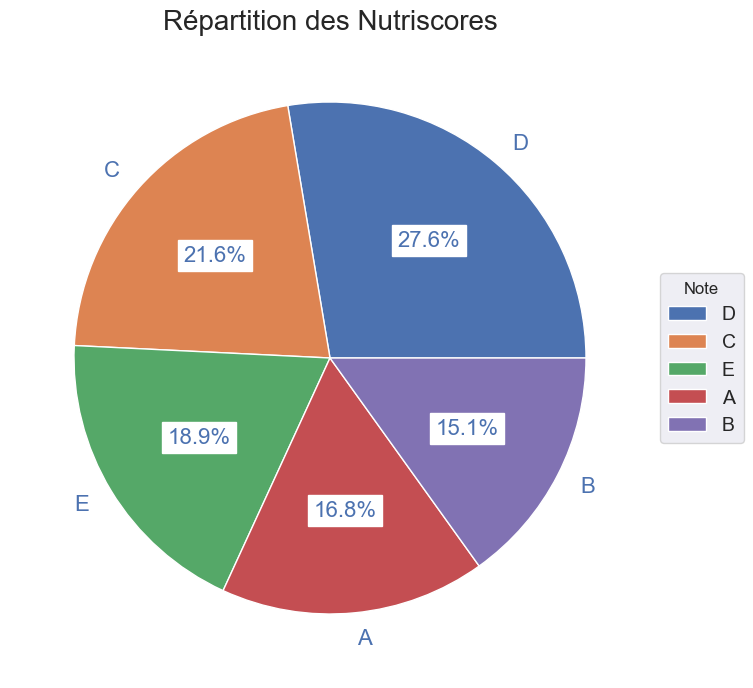

In [519]:
# Création d'une figure avec une taille de 8x8 pouces
plt.figure(figsize=(8,8))

chaine = 'Répartition des Nutriscores'
# Ajout d'un titre à la figure
plt.title(chaine, size=20)

# Création d'un graphique en camembert en utilisant les valeurs de la colonne "nutrition_grade_fr"
# Les étiquettes de chaque part sont en majuscules
# Le pourcentage de chaque part est affiché avec une décimale
# Les propriétés du texte sont définies pour une taille de police de 16, une couleur de police bleue et un fond blanc
wedges, texts, autotexts = plt.pie(data.nutrition_grade_fr.value_counts().values, 
        labels = data.nutrition_grade_fr.value_counts().index.str.upper(),
       autopct='%1.1f%%', textprops={'fontsize': 16, 
                                     'color' : 'b', 
                                     'backgroundcolor' : 'w',}
       )

# Récupération des axes de la figure
ax = plt.gca()

# Ajout d'une légende aux graphiques en camembert
# Les étiquettes des parts sont en majuscules et ont un titre "Note"
# La légende est centrée à gauche
# La taille de police est définie à 14
# La boîte qui entoure la légende est ajustée pour ne pas chevaucher les graphiques en camembert
ax.legend(wedges, data.nutrition_grade_fr.value_counts().index.str.upper(),
          title="Note",
          loc="center left",
          fontsize=14,
          bbox_to_anchor=(1, 0, 0.5, 1))
save_figure_opt(chaine,"Repartition_Distribution_par_variable", library='matplotlib')

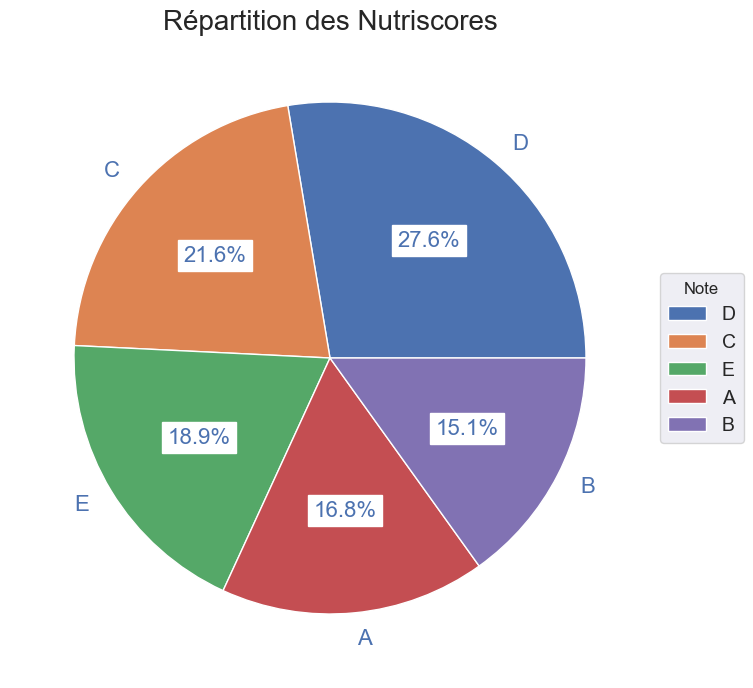

In [520]:
# Création d'une figure avec une taille de 8x8 pouces
plt.figure(figsize=(8,8))

chaine = 'Répartition des Nutriscores'
# Ajout d'un titre à la figure
plt.title(chaine, size=20)

# Création d'un graphique en camembert en utilisant les valeurs de la colonne "nutrition_grade_fr"
# Les étiquettes de chaque part sont en majuscules
# Le pourcentage de chaque part est affiché avec une décimale
# Les propriétés du texte sont définies pour une taille de police de 16, une couleur de police bleue et un fond blanc
wedges, texts, autotexts = plt.pie(data.nutrition_grade_fr.value_counts().values, 
        labels = data.nutrition_grade_fr.value_counts().index.str.upper(),
       autopct='%1.1f%%', textprops={'fontsize': 16, 
                                     'color' : 'b', 
                                     'backgroundcolor' : 'w',}
       )

# Récupération des axes de la figure
ax = plt.gca()

# Ajout d'une légende aux graphiques en camembert
# Les étiquettes des parts sont en majuscules et ont un titre "Note"
# La légende est centrée à gauche
# La taille de police est définie à 14
# La boîte qui entoure la légende est ajustée pour ne pas chevaucher les graphiques en camembert
ax.legend(wedges, data.nutrition_grade_fr.value_counts().index.str.upper(),
          title="Note",
          loc="center left",
          fontsize=14,
          bbox_to_anchor=(1, 0, 0.5, 1))

# Appel de la fonction save_figure_opt pour sauvegarder la figure
save_figure_opt(chaine,chaine)


In [521]:
#provenance des url

In [522]:
# Récupération de l'ensemble des noms de domaine à partir de l'url de chaque entrée
data.url.dropna().apply(lambda x: str(x).split('/')[2]).unique()

array(['world-fr.openfoodfacts.org'], dtype=object)

Ce code permet de récupérer les noms de domaine uniques à partir de la colonne "url" du dataframe "data".

- data.url : sélectionne la colonne "url" du dataframe "data".
- .dropna() : supprime les valeurs manquantes de la colonne "url".
- .apply(lambda x: str(x).split('/')[2]) : applique une fonction lambda à chaque élément de la colonne "url", qui extrait le nom de domaine en séparant la chaîne de caractères selon le caractère "/". Le 3ème élément correspond au nom de domaine.
- .unique() : renvoie un tableau numpy des noms de domaine uniques.

In [523]:
# Extraction de noms de domaines uniques à partir d'une colonne 'image_url' non vide
# en appliquant la fonction split pour obtenir la troisième partie de chaque URL qui est le nom de domaine.
# Ensuite, on applique la méthode unique pour obtenir la liste des noms de domaines uniques.

data.image_url.dropna().apply(lambda x: str(x).split('/')[2]).unique()


array(['fr.openfoodfacts.org'], dtype=object)

Ce code permet de récupérer les noms de domaine uniques à partir de la colonne "image_url" du dataframe "data".

- data.image_url : Sélectionne la colonne "image_url" du dataframe "data".

- .dropna() : Exclut toutes les valeurs manquantes (NaN) dans la colonne "image_url".

- .apply(lambda x: str(x).split('/')[2]) : Applique une fonction lambda à chaque valeur de la colonne "image_url" pour extraire le nom de domaine. La fonction lambda divise chaque URL par les "/", puis sélectionne le troisième élément (qui est le nom de domaine) et renvoie une chaîne de caractères.

- .unique() : Retourne une liste de tous les noms de domaine uniques extraits des URLs des images, sans doublons.

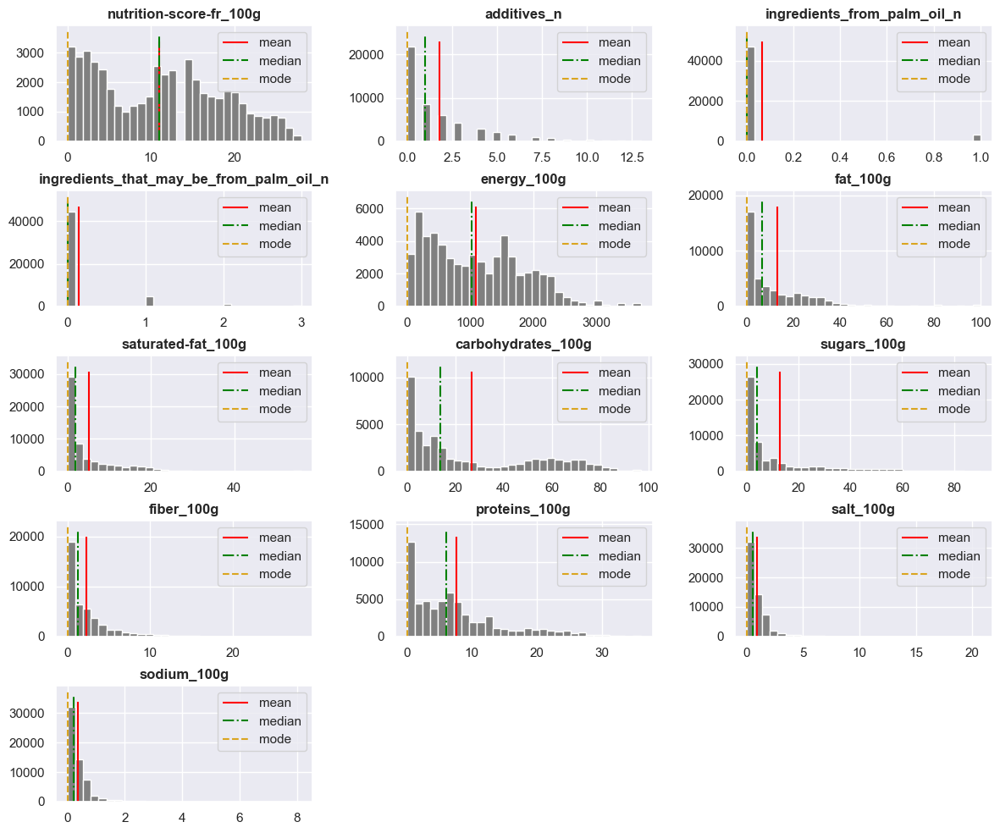

In [525]:
# Plotting histograms of the main quantitative continuous columns

# -- reordering columns
quant_cols = ['nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g']

fig = plt.figure(figsize=(12,10))

# for i, ax, c in enumerate(zip(fig.ravel(), sorted(quant_cols))):
for i, c in enumerate(quant_cols,1):
    ax = fig.add_subplot(5,3,i)
    ax.hist(df[c],  bins=30, color='grey')
    ax.set_title(c)
    ax.vlines(df[c].mean(), *ax.get_ylim(),  color='red', ls='-', lw=1.5)
    ax.vlines(df[c].median(), *ax.get_ylim(), color='green', ls='-.', lw=1.5)
    ax.vlines(df[c].mode()[0], *ax.get_ylim(), color='goldenrod', ls='--', lw=1.5)
    ax.legend(['mean', 'median', 'mode'])
    ax.title.set_fontweight('bold')
    
# plt.tight_layout(w_pad=4.5, h_pad=-1)
plt.tight_layout(w_pad=2, h_pad=0.65)
# plt.gcf().set_size_inches(16,7)

plt.show()

## 2.3 Évolution des caractéristiques quantitatives 
Voyons maintenant si nous pouvons mettre en évidence des changements dans certaines des principales caractéristiques quantitatives. Nous tracerons une moyenne mobile des caractéristiques dans le temps.

In [526]:
df

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,2016-09-17 09:18:13,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g
1,0000000024600,http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf,date-limite-app,1434530704,2015-06-17T08:45:04Z,2015-06-17 10:11:54,Filet de bœuf,2.46 kg,plastique,plastique,NaN,Filet-de-boeuf,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite complétée,Caractéristiques à compléter,Catégories complétées,Marques à compléter,Emballage complété,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",Filet-de-boeuf,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/4600/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.46 kg,NaN,g
2,0000000027205,http://world-fr.openfoodfacts.org/produit/0000000027205,tacinte,1458238630,2016-03-17T18:17:10Z,2016-03-17 18:17:18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit à compléter,Photos à valider,Photos envoyées",NaN,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/002/7205/front.3.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
3,0000000039259,http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2,tacinte,1422221773,2015-01-25T21:36:13Z,2016-09-10 20:08:02,Twix x2,NaN,NaN,NaN,NaN,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,unknown,unknown,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques à compléter,Emballage à compléter,Quantité à compléter,Nom du produit complete,Photos à envoyer",NaN,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.400.jpg,http://fr.openfoodfacts.org/images/products/000/000/003/9259/front.6.200.jpg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,g
4,0000005200016,http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune,sigoise,1441186657,2015-09-02T09:37:37Z,2015-09-18 10:05:52,lentilles vertes,1 kg,Sachet plastique,plastique,Bertrand Lejeune,"Aliments et boissons à base de végétaux,Aliments d'origine végétale,Céréales et pommes de terre,Légumineuses et dérivés,Légumineuses,Graines,Graines de légumineuses,Légumes secs,Lentilles,Lentilles vertes","Bio,Bio européen,AB Agriculture Biologique",France,lentilles vertes,NaN,0.0,[ lentilles-vertes -> fr:lentilles-vertes ] [ lentilles -> fr:lentilles ],NaN,NaN,0.0,0.0,NaN,Cereals a

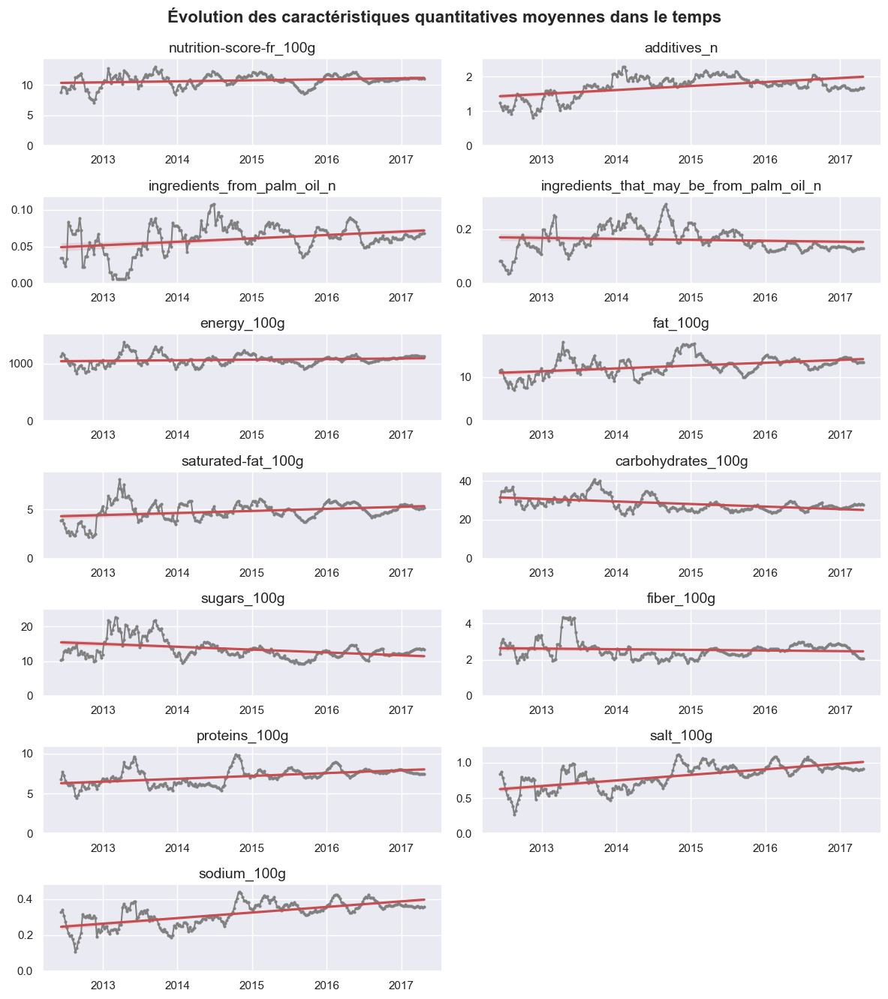

In [528]:
# Plotting evolution of the mean of main quantitative features
# in newly entered items through time (aggregated on weeks )
import matplotlib.dates as mdates
col_100g =  ['nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
             'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
             'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
             'proteins_100g', 'salt_100g', 'sodium_100g']

df_100g_thr_time = df.set_index('last_modified_t').sort_index()[col_100g]
df_100g_thr_time.index = pd.to_datetime(df_100g_thr_time.index, unit='s')
df_100g_thr_time = df_100g_thr_time.resample('W').mean()
dates = mdates.date2num(df_100g_thr_time.index)

fig = plt.figure(figsize=(12,14))

for i, c in enumerate(col_100g,1):
    ax = fig.add_subplot(7,2,i)
    y_roll = df_100g_thr_time[c].fillna(df_100g_thr_time[c].median()).rolling(10).mean().values
    plt.plot_date(dates, y_roll, ls='-', markersize=2, lw=1.5, color='grey')
    sns.regplot(dates, y_roll, marker='None', color='r', ax= ax)
    ax.set(ylim=(0,np.nanmax(y_roll)*1.1))
    ax.set_title(c, fontsize=14)
plt.tight_layout(rect=[0, 0.03, 1, 0.96])
fig.suptitle("Évolution des caractéristiques quantitatives moyennes dans le temps",
             fontweight='bold', fontsize=16)
plt.show()



A partir de ces graphiques, nous pouvons émettre l'hypothèse que le nombre moyen d'additifs et d'ingrédients issus de l'huile de palme est en hausse, et baisse aprés 2017.

Testons ces hypothèses.

In [530]:
def adf_kpss_test(df, columns, ref_column):
    result = pd.DataFrame(columns=['ADF Statistic', 'p-value', 'KPSS Statistic', 'p-value'],
                          index=columns)
    for col in columns:
        adf_result = adfuller(df[col])
        kpss_result = kpss(df[col], regression='c')
        result.loc[col, 'ADF Statistic'] = adf_result[0]
        result.loc[col, 'p-value'] = adf_result[1]
        result.loc[col, 'KPSS Statistic'] = kpss_result[0]
        result.loc[col, 'p-value'] = kpss_result[1]
    adf_result = adfuller(df[ref_column])
    for col in columns:
        kpss_result = kpss(df[ref_column] - df[col], regression='c', nlags=int(np.ceil(3 * np.sqrt(len(df)))))
        result.loc[col, 'ADF Statistic (diff)'] = adf_result[0]
        result.loc[col, 'p-value (diff)'] = adf_result[1]
        result.loc[col, 'KPSS Statistic (diff)'] = kpss_result[0]
        result.loc[col, 'p-value (diff)'] = kpss_result[1]
    return result


In [531]:
print ("Test colonne reférence nutrition-score-fr_100g" ) 
df = df.dropna(subset=['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
                       'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
                       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g','energy_100g'])

resultats_tests = adf_kpss_test(df, ['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
                                     'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
                                     'proteins_100g', 'salt_100g', 'sodium_100g'], 'nutrition-score-fr_100g')
print(resultats_tests)
print ("Test colonne reférence energy_100g" ) 
df = df.dropna(subset=['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
                       'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
                       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g','energy_100g'])

resultats_tests = adf_kpss_test(df, ['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
                                     'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
                                     'proteins_100g', 'salt_100g', 'sodium_100g'], 'energy_100g')
print(resultats_tests)


Test colonne reférence nutrition-score-fr_100g
                                        ADF Statistic   p-value  \
additives_n                             -18.822268     0.038998   
ingredients_from_palm_oil_n             -13.282349     0.01       
ingredients_that_may_be_from_palm_oil_n -25.948516     0.044819   
fat_100g                                -16.735718     0.041728   
saturated-fat_100g                      -17.670348     0.01       
carbohydrates_100g                      -15.119101     0.016157   
sugars_100g                             -14.312917     0.01       
fiber_100g                              -21.131398     0.01       
proteins_100g                           -18.230711     0.051063   
salt_100g                               -20.332235     0.1        
sodium_100g                             -20.332257     0.1        

                                        KPSS Statistic   p-value  \
additives_n                              0.511847       0.038998   
ingredients_

une explication pour chaque colonne du tableau :

- La colonne "Test" indique le nom de la variable testée dans l'analyse.

- La colonne "ADF Statistic" correspond au résultat du test ADF (Augmented Dickey-Fuller) qui permet de vérifier si une série temporelle est stationnaire ou non. Plus la valeur de ce test est négative, plus il y a de chances que la série temporelle soit stationnaire.

- La colonne "p-value (ADF)" correspond à la valeur de p associée au test ADF. Elle indique si la série temporelle est stationnaire ou non en fonction d'un seuil de significativité. Si la valeur de p est inférieure au seuil de significativité (par exemple, 0,05), on peut rejeter l'hypothèse nulle selon laquelle la série temporelle n'est pas stationnaire.

- La colonne "KPSS Statistic" correspond au résultat du test KPSS (Kwiatkowski-Phillips-Schmidt-Shin) qui permet de vérifier si une série temporelle est stationnaire ou non. Plus la valeur de ce test est positive, plus il y a de chances que la série temporelle ne soit pas stationnaire.

- La colonne "p-value (KPSS)" correspond à la valeur de p associée au test KPSS. Elle indique si la série temporelle est stationnaire ou non en fonction d'un seuil de significativité. Si la valeur de p est inférieure au seuil de significativité (par exemple, 0,05), on peut rejeter l'hypothèse nulle selon laquelle la série temporelle est stationnaire.

- La colonne "ADF Statistic (diff)" correspond au résultat du test ADF (Augmented Dickey-Fuller) après avoir différencié la série temporelle. La différenciation consiste à soustraire chaque observation de la précédente. Ce test est utilisé pour vérifier si la série temporelle différenciée est stationnaire.

- La colonne "p-value (diff)" correspond à la valeur de p associée au test ADF après différenciation de la série temporelle. Elle indique si la série temporelle différenciée est stationnaire ou non en fonction d'un seuil de significativité.

- La colonne "KPSS Statistic (diff)" correspond au résultat du test KPSS après différenciation de la série temporelle. Ce test est utilisé pour vérifier si la série temporelle différenciée est stationnaire.

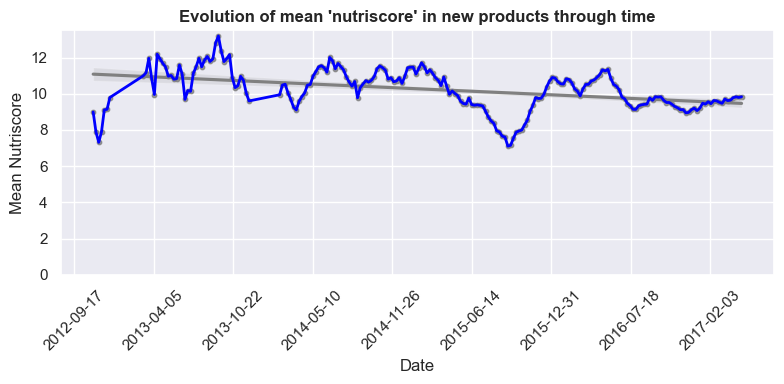

In [534]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.dates as mdates
from statsmodels.tsa.stattools import adfuller, kpss

# # créer un DataFrame fictif avec la variable 'nutrition-score-fr_100g' et 'last_modified_t'
# df = pd.DataFrame({'nutrition-score-fr_100g': np.random.randn(1000)*10 + 50,
#                    'last_modified_t': pd.date_range(start='2022-01-01', periods=1000)})

# regrouper les données par semaine et calculer la moyenne
df_weekly = df.set_index('last_modified_t').resample('W').mean()

# définir les dates en format numérique
dates = mdates.date2num(df_weekly.index)

# calculer la moyenne mobile sur une fenêtre de 10 semaines
y_roll = df_weekly['nutrition-score-fr_100g'].rolling(window=10).mean().values

# créer la figure et l'axe
fig, ax = plt.subplots(figsize=(8, 4))

# tracer la courbe et la droite de régression
sns.regplot(x=dates, y=y_roll, color='grey', ax=ax, scatter_kws={'s': 10})
sns.lineplot(x=dates, y=y_roll, color='blue', ax=ax, lw=2)

# définir les titres et les limites des axes
ax.set_title("Evolution of mean 'nutriscore' in new products through time", fontweight='bold')
ax.set_xlabel('Date')
ax.set_ylabel('Mean Nutriscore')
ax.set_ylim(bottom=0)

# formater les dates en axe des x
date_format = mdates.DateFormatter('%Y-%m-%d')
ax.xaxis.set_major_formatter(date_format)
plt.xticks(rotation=45)

# afficher la figure
plt.tight_layout()
plt.show()


La valeur moyenne du nutriscore a tendance à baisser (vers des aliments plus sains) avec le temps.

In [407]:
data.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


**Additifs**

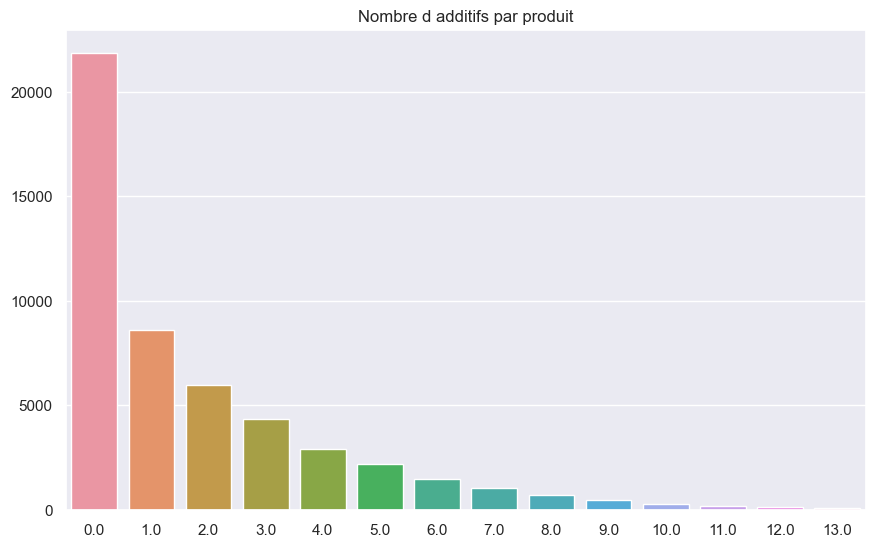

In [535]:
# Crée une figure de taille 10x6
plt.figure(figsize=(10,6))

# Donne un titre à la figure
chaine = 'Nombre d additifs par produit'
plt.title(chaine)
 
# Trace un diagramme en barres avec les nombres d'additifs sur l'axe x et leur fréquence sur l'axe y
sns.barplot(x = data.additives_n.value_counts().index,
           y = data.additives_n.value_counts().values )

# Affiche la figure
save_figure_opt(chaine,chaine, library='matplotlib')
#plt.show()


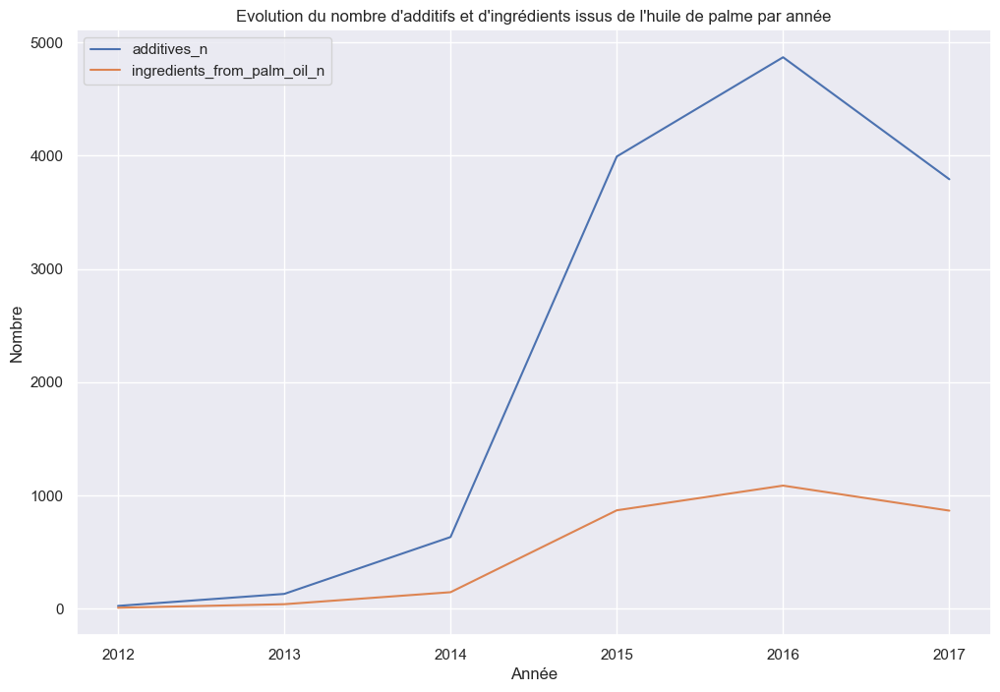

In [536]:
# Charger les données
df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Nettoyer la colonne 'product_name'
df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# Filtrer les lignes avec des valeurs non numériques dans la colonne 'last_modified_t'
df_g = df_g[pd.to_numeric(df_g['last_modified_t'], errors='coerce').notnull()]

# Convertir la colonne 'last_modified_t' en année
df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year

# Filtrer les produits avec des noms incohérents
df_g = df_g[df_g['product_name'].str.len() > 0]

# Sélectionner les colonnes d'intérêt
cols = ['product_name', 'additives_n', 'ingredients_from_palm_oil_n']

# Grouper les données par produit et par année, et compter le nombre d'additifs et d'ingrédients issus de l'huile de palme pour chaque groupe
additifs_palme_par_produit_par_annee = df_g.groupby(['product_name', 'annee'])[cols].sum()

# # Sélectionner les données pour les produits contenant de l'huile de palme
# additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[additifs_palme_par_produit_par_annee['ingredients_from_palm_oil_n'] > 0]
additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[(additifs_palme_par_produit_par_annee['ingredients_from_palm_oil_n'] > 0) & (additifs_palme_par_produit_par_annee['additives_n'] > 0)]

# Afficher l'évolution du nombre d'additifs et d'ingrédients issus de l'huile de palme par année
additifs_palme_par_produit_par_annee.groupby('annee')[['additives_n', 'ingredients_from_palm_oil_n']].sum().plot(kind='line', figsize=(12, 8), title='Evolution du nombre d\'additifs et d\'ingrédients issus de l\'huile de palme par année')
plt.xlabel('Année')
plt.ylabel('Nombre')
plt.show()


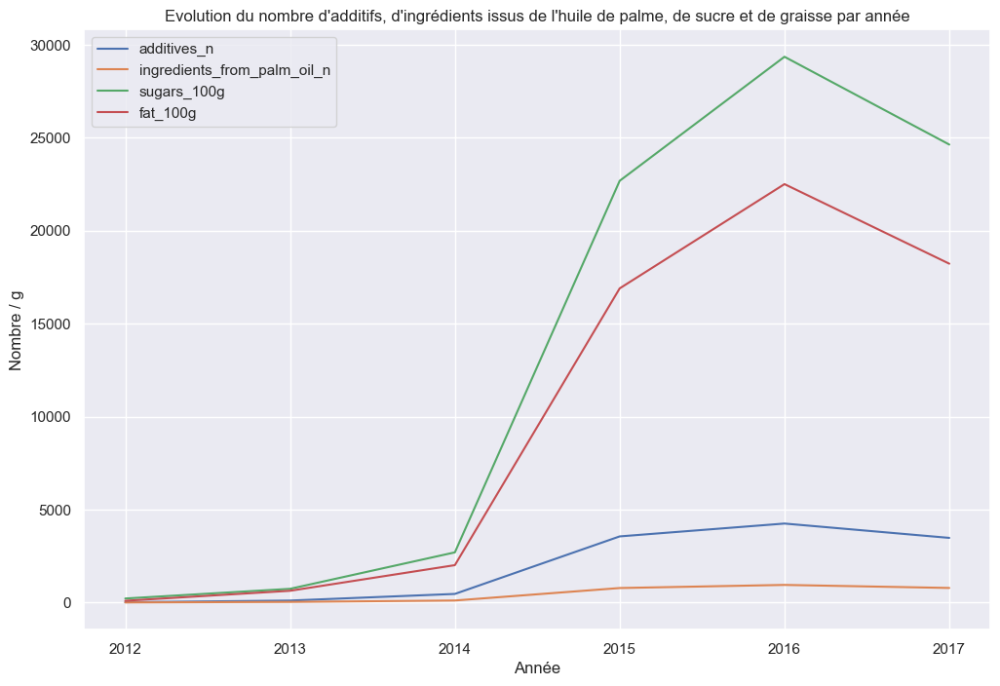

In [422]:
# Charger les données
df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Nettoyer la colonne 'product_name'
df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# Filtrer les lignes avec des valeurs non numériques dans la colonne 'last_modified_t'
df_g = df_g[pd.to_numeric(df_g['last_modified_t'], errors='coerce').notnull()]

# Convertir la colonne 'last_modified_t' en année
df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year

# Filtrer les produits avec des noms incohérents
df_g = df_g[df_g['product_name'].str.len() > 0]

# Sélectionner les colonnes d'intérêt
cols = ['product_name', 'additives_n', 'ingredients_from_palm_oil_n', 'sugars_100g', 'fat_100g']

# Grouper les données par produit et par année, et compter le nombre d'additifs et d'ingrédients issus de l'huile de palme pour chaque groupe
additifs_palme_par_produit_par_annee = df_g.groupby(['product_name', 'annee'])[cols].sum()

# Sélectionner les données pour les produits contenant de l'huile de palme
# additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[additifs_palme_par_produit_par_annee['ingredients_from_palm_oil_n'] > 0]
additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[(additifs_palme_par_produit_par_annee['ingredients_from_palm_oil_n'] > 0) & (additifs_palme_par_produit_par_annee['additives_n'] > 0)& (additifs_palme_par_produit_par_annee['sugars_100g'] > 0)& (additifs_palme_par_produit_par_annee['fat_100g'] > 0)]

# Afficher l'évolution du nombre d'additifs, d'ingrédients issus de l'huile de palme, de sucre et de graisse par année
additifs_palme_par_produit_par_annee.groupby('annee')[['additives_n', 'ingredients_from_palm_oil_n', 'sugars_100g', 'fat_100g']].sum().plot(kind='line', figsize=(12, 8), title='Evolution du nombre d\'additifs, d\'ingrédients issus de l\'huile de palme, de sucre et de graisse par année')
plt.xlabel('Année')
plt.ylabel('Nombre / g')
plt.show()


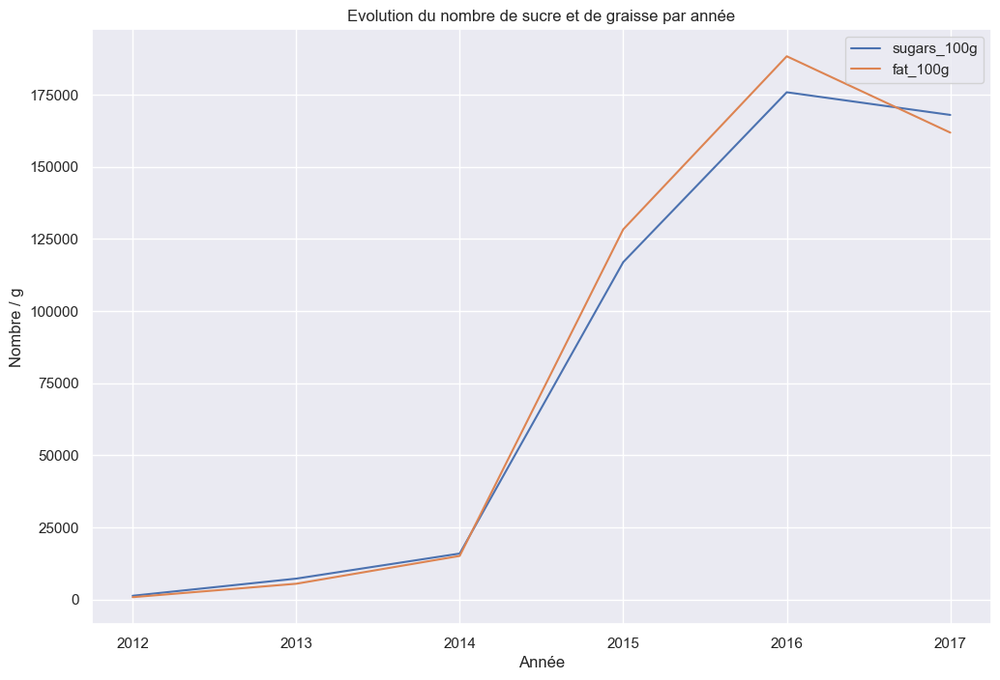

In [537]:
# Charger les données
df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Nettoyer la colonne 'product_name'
df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# Filtrer les lignes avec des valeurs non numériques dans la colonne 'last_modified_t'
df_g = df_g[pd.to_numeric(df_g['last_modified_t'], errors='coerce').notnull()]

# Convertir la colonne 'last_modified_t' en année
df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year

# Filtrer les produits avec des noms incohérents
df_g = df_g[df_g['product_name'].str.len() > 0]

# Sélectionner les colonnes d'intérêt
cols = ['product_name', 'sugars_100g', 'fat_100g']

# Grouper les données par produit et par année, et compter le nombre d'additifs et d'ingrédients issus de l'huile de palme pour chaque groupe
additifs_palme_par_produit_par_annee = df_g.groupby(['product_name', 'annee'])[cols].sum()

# Sélectionner les données pour les produits contenant de l'huile de palmefat_100g
# additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[additifs_palme_par_produit_par_annee['sugars_100g'] > 0]
additifs_palme_par_produit_par_annee = additifs_palme_par_produit_par_annee[(additifs_palme_par_produit_par_annee['sugars_100g'] > 0) & (additifs_palme_par_produit_par_annee['fat_100g'] > 0)]

# Afficher l'évolution du nombre d'additifs, d'ingrédients issus de l'huile de palme, de sucre et de graisse par année
additifs_palme_par_produit_par_annee.groupby('annee')[['sugars_100g', 'fat_100g']].sum().plot(kind='line', figsize=(12, 8), title='Evolution du nombre de sucre et de graisse par année')
plt.xlabel('Année')
plt.ylabel('Nombre / g')
plt.show()


product_name
nan                       43
Haricotsvertsextrafins    35
Huiledoliveviergeextra    34
Haricotsrouges            34
Framboises                31
Mayonnaise                30
Poischiches               29
Macdoinedelgumes          26
Eauminralenaturelle       25
Spaghetti                 25
Name: additives_n, dtype: int64


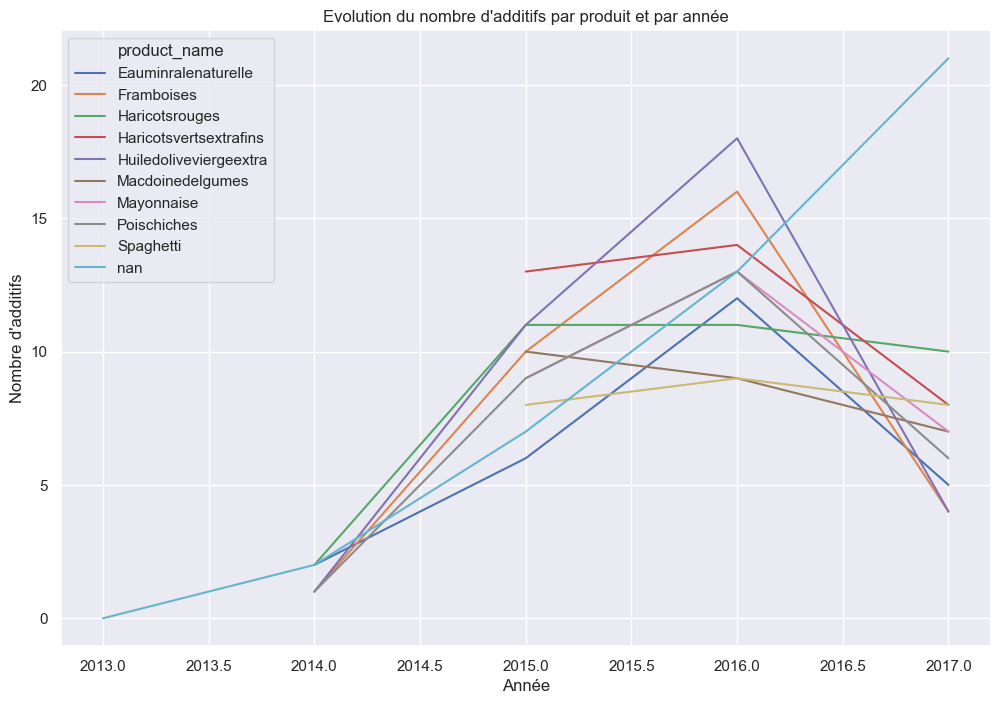

In [538]:
# Charger les données
df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')

# df_g = pd.DataFrame(df_g).dropna()
# Convertir la colonne 'last_modified_t' en année
df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year
df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# Grouper les données par produit et compter le nombre d'additifs pour chaque groupe
additifs_par_produit = df_g.groupby(['product_name'])['additives_n'].count()

# Trier les produits par nombre d'additifs décroissant et afficher les 10 premiers
top_10_produits_additifs = additifs_par_produit.sort_values(ascending=False)[:10]
print(top_10_produits_additifs)

# Filtrer les données pour ne garder que les 10 produits avec le plus d'additifs
df_top_produits_additifs = df_g[df_g['product_name'].isin(top_10_produits_additifs.index)]

# Grouper les données par produit et par année, et compter le nombre d'additifs pour chaque groupe
additifs_par_produit_par_annee = df_top_produits_additifs.groupby(['product_name', 'annee'])['additives_n'].count()

# Afficher l'évolution du nombre d'additifs par produit et par année
additifs_par_produit_par_annee.unstack(level=0).plot(kind='line', figsize=(12, 8), title='Evolution du nombre d\'additifs par produit et par année')
plt.xlabel('Année')
plt.ylabel('Nombre d\'additifs')
plt.show()


In [176]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import re

# # Charger les données
# df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned6.csv')

# # Enlever les lignes avec des valeurs manquantes (NaN)
# df_g = df_g.dropna(subset=['product_name', 'additives_n'])

# # Convertir la colonne 'last_modified_t' en année
# df_g['annee'] = pd.to_datetime(df_g['last_modified_t'], unit='s').dt.year

# # Remplacer les valeurs vides ou incohérentes par NaN
# df_g['product_name'] = df_g['product_name'].replace('', np.nan)
# df_g['product_name'] = df_g['product_name'].replace('nan', np.nan)

# # Enlever les lignes avec des valeurs manquantes (NaN)
# df_g = df_g.dropna(subset=['product_name'])

# # Nettoyer les noms de produits
# df_g['product_name'] = df_g['product_name'].astype(str).apply(lambda x: re.sub('[^A-Za-z0-9]+', '', x))

# # Grouper les données par produit et par année, et compter le nombre d'additifs pour chaque groupe
# additifs_par_produit_par_annee = df_g.groupby(['product_name', 'annee'])['additives_n'].count()

# # Afficher les 10 produits avec le plus grand nombre d'additifs
# top_10_additifs_produits = additifs_par_produit_par_annee.groupby('product_name').sum().sort_values(ascending=False)[:10]
# print(top_10_additifs_produits)

# # Afficher l'évolution du nombre d'additifs par produit et par année
# additifs_par_produit_par_annee.unstack(level=0).plot(kind='line', figsize=(12, 8), title='Evolution du nombre d\'additifs par produit et par année')
# plt.xlabel('Année')
# plt.ylabel('Nombre d\'additifs')
# plt.show()


product_name
Haricotsvertsextrafins    35
Huiledoliveviergeextra    34
Haricotsrouges            34
Framboises                31
Mayonnaise                30
Poischiches               29
Macdoinedelgumes          26
Orange                    25
Spaghetti                 25
Eauminralenaturelle       25
Name: additives_n, dtype: int64


KeyboardInterrupt: 

In [533]:

# Lister les valeurs uniques de la colonne "additives"
additives_uniques = df['additives_n'].unique()

# Afficher les valeurs uniques de la colonne "additives"
print(additives_uniques)


[nan  0.  3.  4.  5.  6.  2.  1. 13.  8.  7. 10.  9. 12. 11.]


In [248]:
data.columns.tolist

<bound method IndexOpsMixin.tolist of Index(['code', 'url', 'creator', 'last_modified_t', 'product_name',
       'quantity_original', 'packaging', 'packaging_tags', 'brands',
       'categories_fr', 'labels_fr', 'countries_fr', 'ingredients_text',
       'allergens', 'additives_n', 'additives', 'additives_tags',
       'additives_fr', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')>

In [249]:
#description des grandeurs

In [250]:
data[['energy_100g',
      'fat_100g',
      'saturated-fat_100g',
      'carbohydrates_100g',
      'sugars_100g',
       'fiber_100g',
      'proteins_100g',
      'salt_100g',
      'sodium_100g',
      'nutrition-score-fr_100g']
    ].describe()
# data[['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']].describe().round(2)



,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
count,44419.000000,27828.000000,42346.000000,27194.000000,42420.000000,26651.000000,44133.000000,42480.000000,42477.000000,31705.000000
mean,1069.142334,12.769018,4.958138,24.691948,11.945448,2.324704,7.767637,0.904206,0.355997,11.641413
std,756.260132,17.742680,7.492442,26.742132,17.988079,3.440184,7.364684,1.508758,0.594019,7.785559
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,402.000000,1.000000,0.200000,3.000000,0.900000,0.000000,1.700000,0.050800,0.020000,4.000000
50%,1000.000000,5.000000,1.500000,12.000000,3.400000,1.200000,6.000000,0.500000,0.196850,12.000000
75%,1572.000000,20.000000,6.800000,49.000000,14.000000,3.200000,11.500000,1.200000,0.472441,18.000000
max,3700.000000,100.000000,56.000000,96.900002,90.099998,28.299999,36.000000,20.700001,8.149607,28.000000


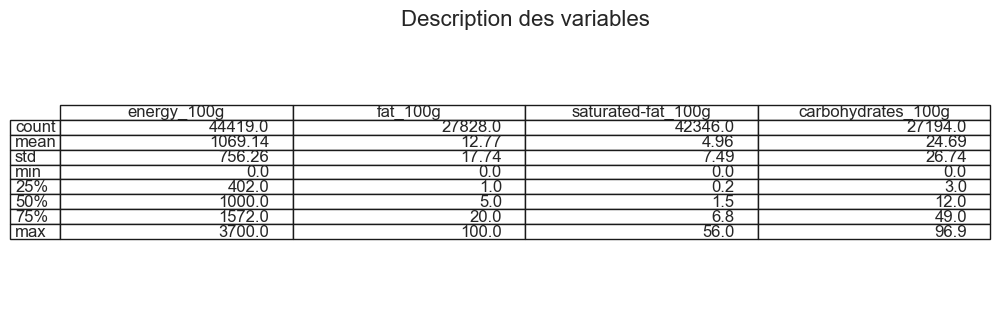

In [251]:
save_table_opt(data[['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g']].describe().round(2), "Description des variables", "description_variables.png")


# Question 3 

## Analyse Bivariée et multivarié

In [542]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
df = df.fillna(0) # Remplacez les NaN par la valeur 0

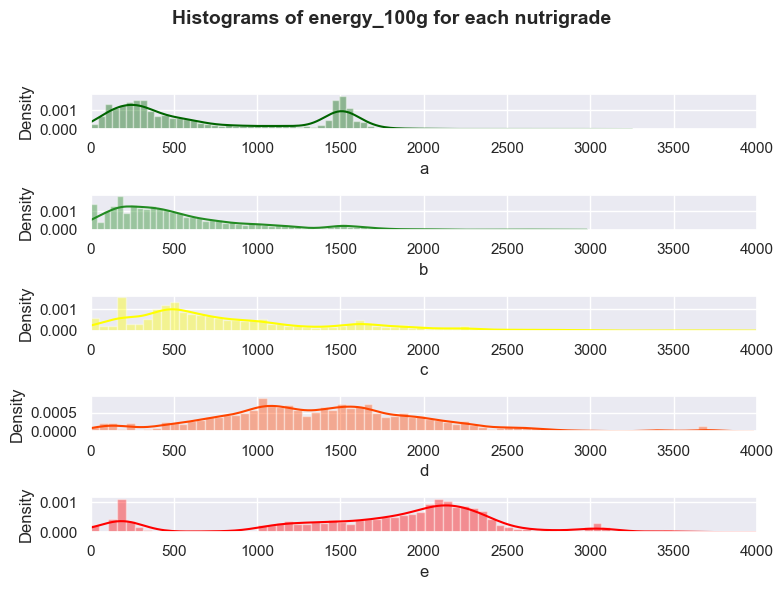

In [543]:
# Selecting the nutriscore series of pnns2 categories to compare
nutri_pal = ['darkgreen', 'forestgreen', 'yellow', 'orangered', 'red']
gb = df.groupby('nutrition_grade_fr')['energy_100g']
nutrigr_df = pd.DataFrame([gb.get_group(n).values for n in list('abcde')],
                            index = list('abcde')).T

# Plotting histogram for each category

fig = plt.figure(figsize=(8,6))

i=0
for n, c in zip(list('abcde'), nutri_pal):
    i+=1
    ax = fig.add_subplot(5,1,i)
    sns.distplot(nutrigr_df[n], color=c, bins=70)
    ax.set(xlim=(0,4000))
fig.suptitle('Histograms of energy_100g for each nutrigrade',
             fontweight='bold', fontsize=14)
plt.tight_layout(rect=[0,0.0,1,0.93])
plt.show()

### Matrice de corrélation

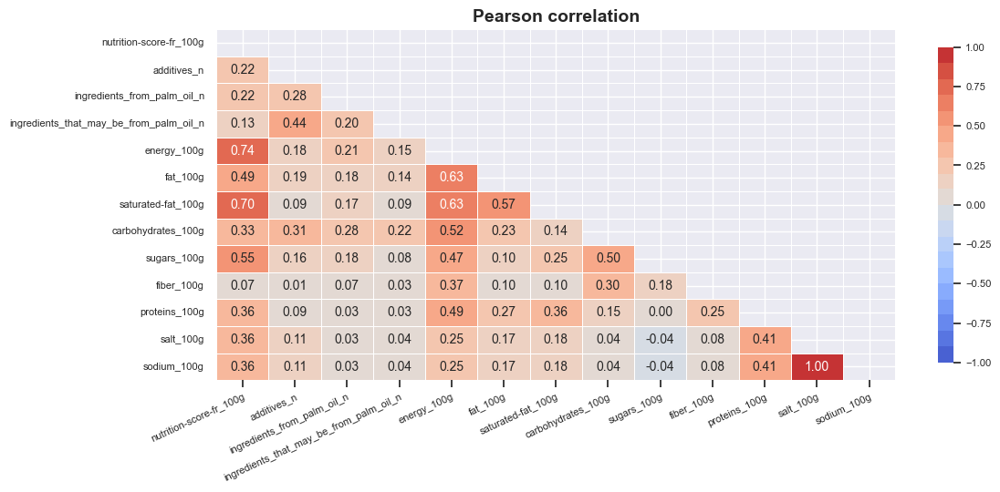

In [544]:
# Importer les bibliothèques nécessaires
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Sélectionner les colonnes quantitatives
cols = quant_cols

# Calculer la corrélation de Pearson entre les colonnes quantitatives
pears_corr = df[cols].corr()

# Créer un heatmap de la corrélation de Pearson en utilisant la fonction plot_heatmap de seaborn
# La forme de la matrice de corrélation sera triangulaire, 
# pour éviter la redondance puisque la matrice de corrélation est symétrique
# Le titre du graphique est "Pearson correlation"
# La taille de la figure est de 12 pouces de largeur et 5 pouces de hauteur
plot_heatmap(pears_corr, shape='tri',
             title="Pearson correlation", figsize=(12,5))

# Afficher le graphique
plt.show()


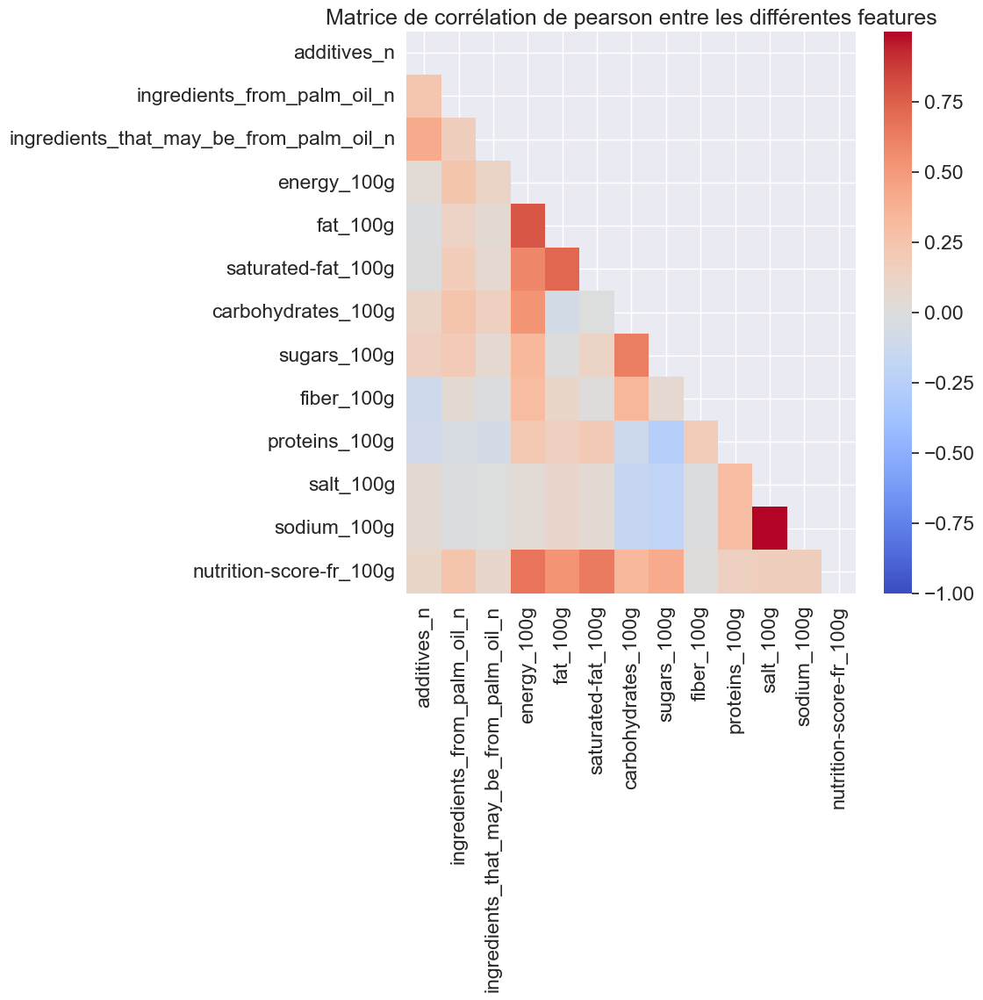

In [545]:
# Crée une nouvelle figure avec une taille de 8 pouces de large et 8 pouces de hauteur
plt.figure(figsize=(8,8))

# Définit la taille de police pour les titres et les labels des graphiques
sns.set(font_scale=1.5)
chaine = 'Matrice de corrélation de pearson entre les différentes features'
# Définit le titre du graphique
plt.title(chaine )

# Calcule la matrice de corrélation de Pearson entre les colonnes numériques du dataframe
corr = data[numeric_columns].corr()

# Crée un masque pour masquer la partie supérieure de la matrice de corrélation
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True 

# Trace le heatmap de la matrice de corrélation avec une couleur allant du bleu foncé (valeurs négatives) au rouge foncé (valeurs positives) et avec le masque défini précédemment
ax = sns.heatmap(corr, mask=mask, vmin=-1, cmap='coolwarm')

# Affiche le graphique
save_figure_opt(chaine, chaine, library='matplotlib')
# plt.show()

# Réinitialise la taille de police pour les titres et les labels des graphiques
sns.set(font_scale=1)


### Suppression 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n' du graphique

In [546]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def plot_corr_heatmap(data):
    # Crée une nouvelle figure avec une taille de 8 pouces de large et 8 pouces de hauteur
    plt.figure(figsize=(8,8))

    # Définit la taille de police pour les titres et les labels des graphiques
    sns.set(font_scale=1.5)
    chaine = 'Matrice de corrélation de pearson entre les différentes features'
    # Définit le titre du graphique
    plt.title(chaine )

    # Calcule la matrice de corrélation de Pearson entre les colonnes numériques du dataframe
    numeric_columns = data.select_dtypes(include=np.number).columns.tolist()
    numeric_columns.remove('ingredients_from_palm_oil_n')
    numeric_columns.remove('ingredients_that_may_be_from_palm_oil_n')
    corr = data[numeric_columns].corr()

    # Crée un masque pour masquer la partie supérieure de la matrice de corrélation
    mask = np.zeros_like(corr, dtype=np.bool)
    mask[np.triu_indices_from(mask)] = True 

    # Trace le heatmap de la matrice de corrélation avec une couleur allant du bleu foncé (valeurs négatives) au rouge foncé (valeurs positives) et avec le masque défini précédemment
    ax = sns.heatmap(corr, mask=mask, vmin=-1, cmap='coolwarm')

    # Affiche le graphique
    save_figure_opt(chaine, chaine, library='matplotlib')
    # plt.show()

    # Réinitialise la taille de police pour les titres et les labels des graphiques
    sns.set(font_scale=1)


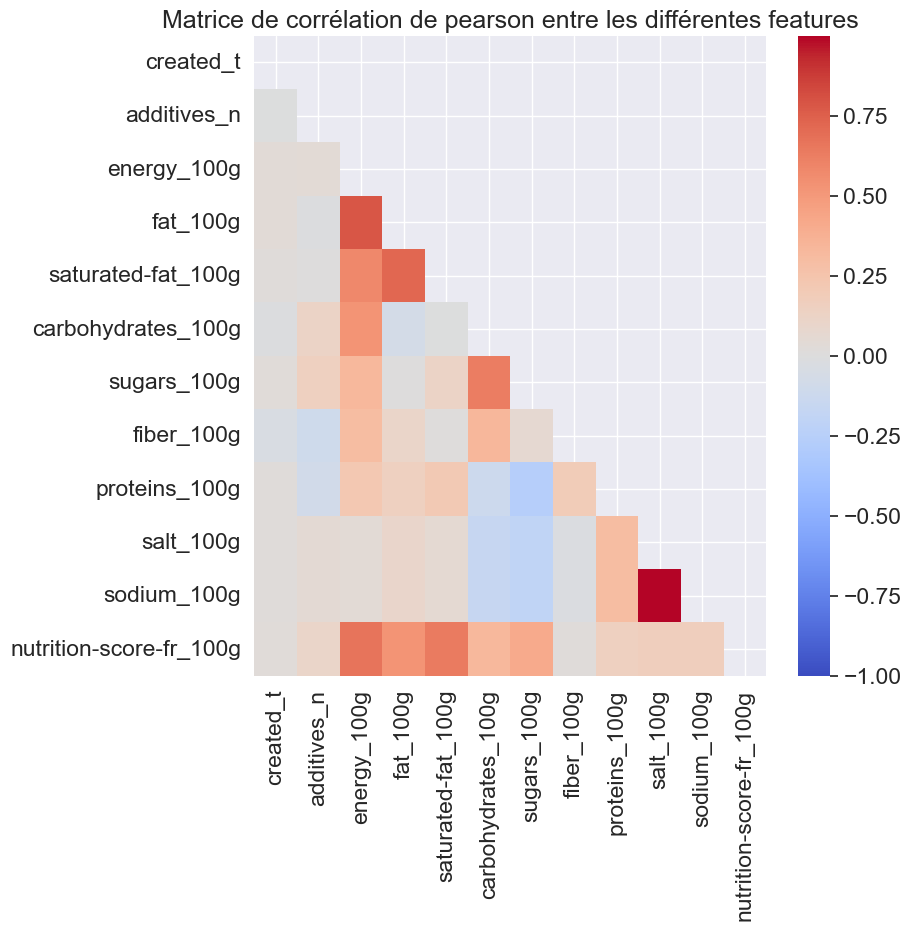

In [547]:
plot_corr_heatmap(data)

Analyse du tableau : 

* additives_n : pas de correlation remarquable
* energy_100g : forte corrélation avec:
    * fat_100g
    * saturated-fat_100g
    * carbohydrates_100g
    * nutrition-score-fr_100g
* fat_100g et saturated-fat_100g fortement corrélés
* nutrition-score-fr_100g : forte corrélation avec:
    * saturated_fat_100g
    * energy_100g
    * fat_100g

* sugars_100g : forte correlation avec carbohydrates_100g

* sodium_100g correlation très forte avec salt_100g 

In [548]:
object_columns = data.select_dtypes(include = ['object']).columns

In [549]:
object_columns

Index(['code', 'url', 'creator', 'created_datetime', 'last_modified_t',
       'product_name', 'packaging', 'packaging_tags', 'brands',
       'ingredients_text', 'allergens', 'additives', 'additives_tags',
       'nutrition_grade_fr', 'pnns_groups_1', 'pnns_groups_2', 'image_url',
       'image_small_url', 'quantity'],
      dtype='object')

### Test du Chi 2 - Indépendance des variables

Même si les données ne suivent pas une distribution normale, préparons les opérations pour appliquer le test si c'était le cas, à but d'apprentissage

Le test du Chi-2 (ou test du khi-deux) est un test statistique qui permet de mesurer l'indépendance ou l'association entre deux variables qualitatives. Par conséquent, il est utilisé pour des variables qualitatives et non pour des variables quantitatives.

Le test du Chi-2 évalue la différence entre les fréquences observées et les fréquences attendues en fonction de l'hypothèse nulle selon laquelle les variables étudiées sont indépendantes. Si la valeur p est inférieure à un certain seuil prédéfini, généralement 0,05, ici 0.03, cela signifie que les variables ne sont pas indépendantes et qu'il y a une association significative entre elles.

In [90]:
# from scipy.stats import chi2_contingency
# from scipy.stats import chi2
# def test_chi2(serie1, serie2):
    
#     alpha = 0.03    
    
#     #H0 : les variables sont indépendantes
    
#     #print('tableau de contingence :\n', pd.crosstab(serie1.array, serie2.array))
#     tab_contingence = pd.crosstab(serie1.array, serie2.array)
#     stat_chi2, p, dof, expected_table = chi2_contingency(tab_contingence.values)
#     print('chi2 : {0:.5f},\np : {0:.5f},\ndof : {0:.5f}\n'.format(stat_chi2, p, dof))
#     #print('tableau de contingence : \n', tab_contingence)
    
#     critical = chi2.ppf(1-alpha, dof) #
#     #print('critital : ', critical)

#     if p <= alpha:
#         print('Variables non indépendantes (H0 rejetée) car p = {} <= alpha = {}'.format(p, alpha))
#         return False
    
#     else:
#         print('H0 non rejetée car p = {} >= alpha = {}'.format(p, alpha))
#         return True

In [569]:
# Importer les bibliothèques nécessaires pour réaliser un test de chi2
from scipy.stats import chi2_contingency
from scipy.stats import chi2

# Créer une fonction pour le test de chi2 entre deux séries
def test_chi2(serie1, serie2):
    
    # Définir le niveau de significativité
    alpha = 0.03    
    
    # Formuler l'hypothèse nulle : les variables sont indépendantes
    
    # Calculer le tableau de contingence à partir des deux séries
    tab_contingence = pd.crosstab(serie1.array, serie2.array)
    
    # Calculer les statistiques du test de chi2 à partir du tableau de contingence
    stat_chi2, p, dof, expected_table = chi2_contingency(tab_contingence.values)
    
    # Afficher les résultats du test
    print('chi2 : {0:.5f},\np : {0:.5f},\ndof : {0:.5f}\n'.format(stat_chi2, p, dof))
    
    # Calculer la valeur critique à partir du niveau de significativité et des degrés de liberté
    critical = chi2.ppf(1-alpha, dof)
    
    # Evaluer l'hypothèse nulle en comparant la valeur critique et la valeur p
    if p <= alpha:
        print('Variables non indépendantes (H0 rejetée) car p = {} <= alpha = {}'.format(p, alpha))
        return False
    
    else:
        print('H0 non rejetée car p = {} >= alpha = {}'.format(p, alpha))
        return True


In [570]:
data.head(1)

,code,url,creator,created_t,created_datetime,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


In [571]:
#data.nunique().sort_values()

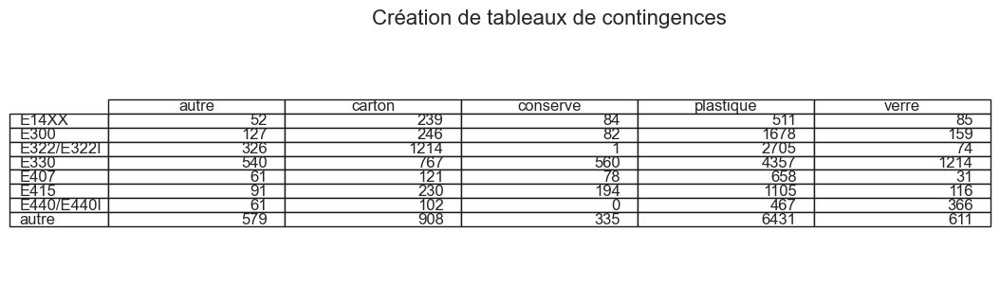

In [572]:
pd.crosstab(data['additives_tags'], data['packaging_tags'])
save_table_opt(pd.crosstab(data['additives_tags'], data['packaging_tags']), "Création de tableaux de contingences", "crosstab.png")


In [573]:
tags = data.columns[data.columns.str.contains('_tag')].tolist()

In [574]:
tags

['packaging_tags', 'additives_tags']

In [575]:
data[tags].sample(5)

,packaging_tags,additives_tags
66763,NaN,NaN
21500,plastique,NaN
74299,plastique,NaN
11424,plastique,NaN
80247,NaN,NaN


In [576]:
data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns

Index(['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity'],
      dtype='object')

In [577]:
import seaborn as sns
x = pd.cut(data['nutrition-score-fr_100g'], 20)
for column in data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns:
    print('test d\'indépendance {} / {}'.format('nutriscore',column))
    if data[column].nunique() > 20 :
        y = pd.cut(data[column], 20).astype('category')
    else:
        y = data[column].astype('category')
    test_chi2(x, y)
    
    #table = pd.DataFrame({'nutriscore' : x, column : y})
    #print(table.sample(10))
    print('________________________________________________________________________________________________\n')

test d'indépendance nutriscore / additives_n
chi2 : 2165.14083,
p : 2165.14083,
dof : 2165.14083

Variables non indépendantes (H0 rejetée) car p = 3.7980965007495495e-303 <= alpha = 0.03
________________________________________________________________________________________________

test d'indépendance nutriscore / ingredients_from_palm_oil_n
chi2 : 2421.64459,
p : 2421.64459,
dof : 2421.64459

Variables non indépendantes (H0 rejetée) car p = 0.0 <= alpha = 0.03
________________________________________________________________________________________________

test d'indépendance nutriscore / ingredients_that_may_be_from_palm_oil_n
chi2 : 576.00170,
p : 576.00170,
dof : 576.00170

Variables non indépendantes (H0 rejetée) car p = 6.933223202412732e-87 <= alpha = 0.03
________________________________________________________________________________________________

test d'indépendance nutriscore / energy_100g
chi2 : 44044.81571,
p : 44044.81571,
dof : 44044.81571

Variables non indépendant

Le test du CHI2 conclut au rejet de l'hypothèse d'indépendance pour toutes nos variables: on peut donc conclure qu'il y a un lien entre la valeur du nutriscore et la valeur des variables

### Test ANOVA (Analyse de la variance) -  Indépendance des variables

**Test de Normalité**

Les variables quantitatives sont-elles de distribution normale?  (hypothèse à valider pour pouvoir appliquer le test d'indépendance par l'analyse de la variance ADOMA)

**A : test de normalité d'Agostino & Pearson**

In [579]:
?stats.normaltest

In [580]:
data[numeric_columns].head()

,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1000.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0
4,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1000.0


In [581]:
# Importation du module stats depuis la librairie scipy
from scipy import stats

# Sélection des colonnes numériques
numeric_columns = data.select_dtypes(include=['int8', 'float32', 'int32', 'float64']).columns
# On exclut la première colonne qui n'est pas numérique
numeric_columns = numeric_columns[1:]

# Pour chaque colonne numérique
for column in numeric_columns:
    # Affichage du nom de la colonne
    print('________\n{}'.format(column))
    
    # Calcul du test normalité de la colonne
    k2, p = stats.normaltest(data[column], axis=0, nan_policy='omit')
    
    # Définition du niveau de significativité
    alpha = 5e-2
    
    # Affichage de la valeur de p
    print("p = {:g}".format(p))
    
    # Test d'hypothèse sur la normalité de la colonne
    if p < alpha: # hypothèse nulle : x a une distribution normale
        print("H0 est rejetée : {} n'est pas de distribution normale".format(column))
    else:
        print("H0 ne peut être rejetée : {}, on considère l'hypothèse de normalité".format(column))


________
ingredients_from_palm_oil_n
p = 0
H0 est rejetée : ingredients_from_palm_oil_n n'est pas de distribution normale
________
ingredients_that_may_be_from_palm_oil_n
p = 0
H0 est rejetée : ingredients_that_may_be_from_palm_oil_n n'est pas de distribution normale
________
energy_100g
p = 0
H0 est rejetée : energy_100g n'est pas de distribution normale
________
fat_100g
p = 0
H0 est rejetée : fat_100g n'est pas de distribution normale
________
saturated-fat_100g
p = 0
H0 est rejetée : saturated-fat_100g n'est pas de distribution normale
________
carbohydrates_100g
p = 0
H0 est rejetée : carbohydrates_100g n'est pas de distribution normale
________
sugars_100g
p = 0
H0 est rejetée : sugars_100g n'est pas de distribution normale
________
fiber_100g
p = 0
H0 est rejetée : fiber_100g n'est pas de distribution normale
________
proteins_100g
p = 0
H0 est rejetée : proteins_100g n'est pas de distribution normale
________
salt_100g
p = 0
H0 est rejetée : salt_100g n'est pas de distribution 

On ne peut pas appliquer le test Anova car les variables ne sont pas de distribution normale

**B. Test de normalité Kolmogorov Smirnov**

In [582]:
from scipy import stats
numeric_columns = data.select_dtypes(include = ['int8', 'float32','int32','float64']).columns
numeric_columns = numeric_columns[1:]

for column in numeric_columns:
    print('________\n{}'.format(column))
    D, p = stats.kstest(data[column].dropna(), 
                     'norm', 
                     args=(data[column].mean(), data[column].std()))
    alpha = 5e-2
    print("p = {}".format(p))
    if p < alpha:  # null hypothesis: x comes from a normal distribution
        print("The null hypothesis can be rejected : {} is not from a normal distribution".format(column))
    else:
        print("The null hypothesis cannot be rejected")

________
ingredients_from_palm_oil_n
p = 0.0
The null hypothesis can be rejected : ingredients_from_palm_oil_n is not from a normal distribution
________
ingredients_that_may_be_from_palm_oil_n
p = 0.0
The null hypothesis can be rejected : ingredients_that_may_be_from_palm_oil_n is not from a normal distribution
________
energy_100g
p = 0.0
The null hypothesis can be rejected : energy_100g is not from a normal distribution
________
fat_100g
p = 0.0
The null hypothesis can be rejected : fat_100g is not from a normal distribution
________
saturated-fat_100g
p = 0.0
The null hypothesis can be rejected : saturated-fat_100g is not from a normal distribution
________
carbohydrates_100g
p = 0.0
The null hypothesis can be rejected : carbohydrates_100g is not from a normal distribution
________
sugars_100g
p = 0.0
The null hypothesis can be rejected : sugars_100g is not from a normal distribution
________
fiber_100g
p = 0.0
The null hypothesis can be rejected : fiber_100g is not from a normal d

Le test de Kolmogorov Smirnov confirme la non normalité des distributions de données : on ne peut appliquer l'analyse de la variance

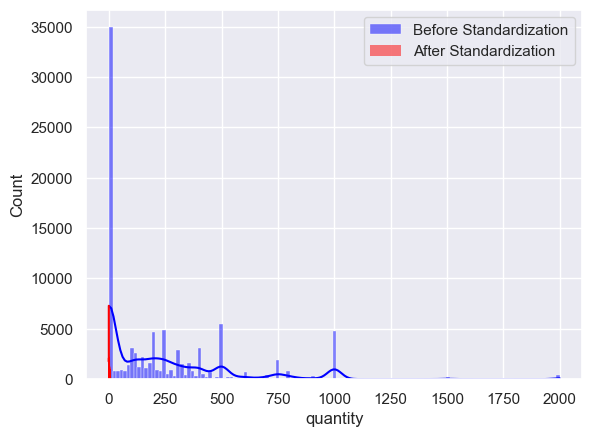

In [583]:
from sklearn.preprocessing import StandardScaler
# Charger les données
data = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
data_standardized = data.copy()
numeric_columns = data.select_dtypes(include=['int8', 'float32', 'int32', 'float64']).columns
numeric_columns = numeric_columns[1:]

scaler = StandardScaler()

# for column in numeric_columns:
#     data[column] = scaler.fit_transform(data[[column]].dropna().values.reshape(-1, 1))
# #     data[column] = scaler.fit_transform(data[[column]].dropna())
for column in numeric_columns:
    filled_column = data[column].fillna(data_standardized[column].mean())  # Remplace les valeurs manquantes par la moyenne
    data_standardized[column] = scaler.fit_transform(filled_column.values.reshape(-1, 1))



sns.histplot(data[column], kde=True, color='blue', label='Before Standardization')
sns.histplot(data_standardized[column], kde=True, color='red', label='After Standardization')
plt.legend()
plt.show()


**C. ANOVA : analyse de la variance**

Même si les données ne suivent pas une distribution normale, préparons les opérations pour appliquer le test si c'était le cas, à but d'apprentissage
Une standardisation a été fait pour entrevoir le mecanisme.

Il faut fournir en entrée au test les données pour chaque groupe, regardons un exemple d'application pour le nutrition grade et la feature salt_100g 

In [593]:
data_anova= data_standardized.copy()
# data_anova= data.copy()
# Charger les données
# data_anova = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
data_anova['nutrition_grade_fr'].dropna().unique().tolist()

['d', 'e', 'c', 'b', 'a']

In [636]:
# Importer le module stats de la librairie scipy
from scipy import stats

# Sélectionner les variables numériques de chaque groupe de nutrition, en éliminant les valeurs manquantes
# pour chaque groupe de nutrition
data_a = data_anova[data_anova['nutrition_grade_fr'] == 'a'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)
data_b = data_anova[data_anova['nutrition_grade_fr'] == 'b'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)
data_c = data_anova[data_anova['nutrition_grade_fr'] == 'c'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)
data_d = data_anova[data_anova['nutrition_grade_fr'] == 'd'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)
data_e = data_anova[data_anova['nutrition_grade_fr'] == 'e'].select_dtypes(['int8', 'float32','int32','float64']).dropna(axis=0).dropna(axis=1)

# Calculer la statistique F et la p-valeur en utilisant la fonction f_oneway() de scipy.stats,
# qui prend les données de chaque groupe de nutrition en entrée
f_statistic, p = stats.f_oneway(
                                data_b,
                                data_c,
                                data_d,
                                data_e)


In [637]:
pd.DataFrame({'features': data_b.columns.tolist(),
              'p' : p,
              'bool_test' : p<alpha}) #si p<alpha : on rejette l'hypothèse d'indépendance H0 : les variables ne sont pas indépendantes

,features,p,bool_test
0,additives_n,1.142945e-50,True
1,ingredients_from_palm_oil_n,1.369577e-291,True
2,ingredients_that_may_be_from_palm_oil_n,3.787260e-45,True
3,energy_100g,0.000000e+00,True
4,fat_100g,0.000000e+00,True
5,saturated-fat_100g,0.000000e+00,True
6,carbohydrates_100g,0.000000e+00,True
7,sugars_100g,0.000000e+00,True
8,fiber_100g,1.634052e-40,True
9,proteins_100g,1.215580e-170,True


Si il y a validation de l'hypothèse de normalité, enfin si c'est le cas, on pourrait interpréter les résultats comme suit : Toutes Les variables suivantes ont une distribution qui change en fonction des valeurs de nutrition_grade_fr (groupes de nutrition), ce qui suggère qu'il y a une relation entre ces variables et la notation de nutrition_grade_fr. Par conséquent, il est probable que les variables soient liées et qu'elles aient une certaine influence sur la notation de nutrition_grade_fr.

### Test de student d'indépendance

Hypothèses : 
* distributions normales => comme vu précédemment cette hypothèse n'est pas acceptable
* variance homogène => on va ramener la variance à 1 pour pouvoir appliquer le test de student

H0 : la moyenne de 2 échantillons de "salt_100g" est la même quel que soit le "nutrition grade" 


**de même que précédemment, le test n'est pas applicable faute d'hypothèse de normalité.**

In [596]:
from sklearn.preprocessing import StandardScaler

In [597]:
data['salt_100g'].dropna()

10       0.0100 
11       0.0030 
15       0.0254 
18       0.8000 
19       0.1000 
          ...   
94468    0.2900 
94469    10.0000
94475    0.6800 
94477    0.1000 
94481    0.0254 
Name: salt_100g, Length: 59276, dtype: float64

In [598]:
scaler = StandardScaler(copy=True, with_mean=False, with_std=True)
a = data[['nutrition-score-fr_100g','salt_100g']].copy().dropna()
b = scaler.fit_transform(a['salt_100g'].values.reshape(-1,1))
a = a['nutrition-score-fr_100g']
a = scaler.fit_transform(a.values.reshape(-1,1))
alpha = 0.05

In [599]:
t_stats, p = stats.ttest_ind(a, b)

In [600]:
p < alpha

array([ True])

Si les distributions étaient normales, on pourrait rejetter l'hypothèse d'indépendance : la moyenne des échantillons de salt_100g est liée à la valeur de nutrition_grade

In [601]:
data.columns
# for colonne in data.columns:
#     print('\n',colonne)
#     print('Qté Nan : ', round(data[colonne].isna().sum()/data[colonne].shape[0]*100), '%')
#     print('Uniques : ', data[colonne].nunique())

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'product_name', 'quantity_original', 'packaging',
       'packaging_tags', 'brands', 'categories_fr', 'labels_fr',
       'countries_fr', 'ingredients_text', 'allergens', 'additives_n',
       'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')

In [602]:
df.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'product_name', 'quantity_original', 'packaging',
       'packaging_tags', 'brands', 'categories_fr', 'labels_fr',
       'countries_fr', 'ingredients_text', 'allergens', 'additives_n',
       'additives', 'additives_tags', 'additives_fr',
       'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'pnns_groups_1', 'pnns_groups_2', 'states_fr', 'main_category_fr',
       'image_url', 'image_small_url', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g',
       'quantity_origine', 'quantity', 'quantity_unit'],
      dtype='object')

In [626]:
# -- reordering columns
quant_cols =  ['nutrition-score-fr_100g','additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g']

In [630]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

df = replace_nan(df)

In [631]:
#La méthode inplace=True modifie l'objet DataFrame original et ne retourne donc pas de copie du DataFrame.
df.dropna(inplace=True)
df= df[df['nutrition_grade_fr'] != '0']
df = df.loc[dfz['nutrition_grade_fr'].notnull() & (df['nutrition_grade_fr'] != 0)]
df = df.reset_index(drop=True)

print(df['nutrition_grade_fr'].unique())
print(df['nutrition_grade_fr'].isna().sum())


['d' 'e' 'c' 'b' 'a']
0


In [634]:
# df = df.loc[dfz['nutrition_grade_fr'].notnull() & (df['nutrition_grade_fr'] != 0)]
# df = df.loc[(df.select_dtypes(include=np.number).notnull()) & (df.select_dtypes(include=np.number) != 0).any(axis=1)]


In [633]:
df.groupby(['nutrition_grade_fr'])[['nutrition-score-fr_100g','additives_n', 'ingredients_from_palm_oil_n',       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',       'proteins_100g', 'salt_100g', 'sodium_100g']].agg([np.median, np.mean, np.std]).T


nutrition_grade_fr                                       a           b  \
nutrition-score-fr_100g                 median  0.000000    1.000000     
                                        mean    0.004361    0.927628     
                                        std     0.159786    0.823443     
additives_n                             median  0.000000    0.000000     
                                        mean    0.677882    1.221760     
                                        std     1.458283    2.103222     
ingredients_from_palm_oil_n             median  0.000000    0.000000     
                                        mean    0.003115    0.011002     
                                        std     0.055733    0.104327     
ingredients_that_may_be_from_palm_oil_n median  0.000000    0.000000     
                                        mean    0.047767    0.082885     
                                        std     0.250887    0.331335     
energy_100g                             median  435.000000  439.500000   
                                        mean    669.218744  552.405685   
                                        std     546.332270  433.495246   
fat_100g                                median  1.000000    1.900000     
                                        mean    2.315671    3.365490     
                                        std     4.066898    4.888411     
saturated-fat_100g                      median  0.350000    0.800000     
                                        mean    0.612852    1.154022     
                                        std     0.762548    1.160504     
carbohydrates_100g                      median  8.300000    4.900000     
                                        mean    19.450168   12.450806    
                                        std     25.421044   18.938757    
sugars_100g                             median  2.400000    2.500000     
                                        mean    3.763874    4.557071     
                                        std     4.507913    6.497894     
fiber_100g                              median  2.400000    0.300000     
                                        mean    3.084598    1.162244     
                                        std     3.364585    1.935028     
proteins_100g                           median  6.500000    4.500000     
                                        mean    7.429817    6.423093     
                                        std     6.228065    6.276102     
salt_100g                               median  0.160020    0.650000     
                                        mean    0.363444    0.596394     
                                        std     0.388189    0.494216     
sodium_100g                             median  0.063000    0.255906     
                                        mean    0.143088    0.234800     
                                        std     0.152829    0.194572     

nutrition_grade_fr                                       c            d  \
nutrition-score-fr_100g                 median  5.000000    14.000000     
                                        mean    5.529412    13.847602     
                                        std     2.443180    2.512496      
additives_n                             median  0.000000    0.000000      
                                        mean    1.526555    1.702249      
                                        std     2.230886    2.517882      
ingredients_from_palm_oil_n             median  0.000000    0.000000      
                                        mean    0.025714    0.055947      
                                        std     0.158295    0.229835      
ingredients_that_may_be_from_palm_oil_n median  0.000000    0.000000      
                                        mean    0.116639    0.169466      
                                        std     0.393905    0.483153      
energy_100g                             median  661.000000  1346

In [609]:
df = df.fillna(0).round(2)
# df = df.drop('00', axis=1, inplace=True)

df.groupby(['nutrition_grade_fr'])['energy_100g'].agg([np.median, np.mean, np.std]).T

nutrition_grade_fr,a,b,c,d,e
median,435.000000,439.500000,661.000000,1346.500000,1905.000000
mean,669.218744,552.405685,853.089361,1368.255940,1712.547785
std,546.332270,433.495246,640.637404,626.849445,756.177877


On peut observer que la médiane et la moyenne de la variable energy_100g augmentent à mesure que la lettre de grade nutritionnel augmente, de la catégorie a à la catégorie e. Cela indique que les produits avec des grades nutritionnels plus élevés ont tendance à avoir une valeur énergétique plus élevée. Cependant, la variation dans les valeurs est également plus importante pour les grades nutritionnels plus élevés, comme en témoigne l'écart type plus élevé.

Il est important de noter que cette analyse ne prend en compte que la variable energy_100g et ne considère pas les autres facteurs qui peuvent influencer le grade nutritionnel d'un produit. Par conséquent, il ne faut pas tirer des conclusions hâtives sur la qualité nutritionnelle des produits en se basant uniquement sur ces résultats.

In [638]:
compare_analyses('nutrition-score-fr_100g',quant_cols,df)

,colonne de référence,p-value ANOVA,corr,p-value t-Test,p-value Kruskal-Wallis,pente de la régression,ordonnée à l'origine
0,nutrition-score-fr_100g,1.0,1.000000,1.000000e+00,1.0,1.000000,3.019807e-14
1,additives_n,1.0,0.141314,0.000000e+00,1.0,0.516670,8.080180e+00
2,ingredients_from_palm_oil_n,1.0,0.214667,0.000000e+00,1.0,8.494182,8.438866e+00
3,ingredients_that_may_be_from_palm_oil_n,1.0,0.086626,0.000000e+00,1.0,1.786728,8.604939e+00
4,energy_100g,1.0,0.641400,0.000000e+00,1.0,0.006914,1.430622e+00
5,fat_100g,1.0,0.453330,7.162374e-21,1.0,0.238622,6.469246e+00
6,saturated-fat_100g,1.0,0.644558,0.000000e+00,1.0,0.712323,5.251485e+00
7,carbohydrates_100g,1.0,0.190416,0.000000e+00,1.0,0.060040,7.635391e+00
8,sugars_100g,1.0,0.437272,2.373981e-141,1.0,0.200914,6.438219e+00
9,fiber_100g,1.0,-0.167548,0.000000e+00,1.0,-0.512107,9.572694e+00


In [635]:
compare_analyses('nutrition_grade_fr',quant_cols,df)

ValueError: could not convert string to float: 'd'

 la variable "nutrition-score-fr_100g", qui correspond au score nutritionnel de chaque aliment. La p-value ANOVA est "NaN", ce qui signifie qu'il n'y a pas de différences significatives entre les différents groupes pour cette variable. La corrélation est élevée (1.0), ce qui montre que le score nutritionnel est fortement lié aux autres variables. Les p-values des tests t-Test et Kruskal-Wallis sont toutes deux de 1.0, ce qui signifie qu'il n'y a pas de différences significatives entre les groupes pour ces tests.

En résumé, cela indique que le score nutritionnel est très corrélé aux autres variables, mais il n'y a pas de différences significatives entre les groupes pour cette variable.






In [639]:
compare_analyses('energy_100g',quant_cols,df)

,colonne de référence,p-value ANOVA,corr,p-value t-Test,p-value Kruskal-Wallis,pente de la régression,ordonnée à l'origine
0,nutrition-score-fr_100g,1.0,0.641400,0.0,1.0,59.500519,5.427232e+02
1,additives_n,1.0,0.037888,0.0,1.0,12.850655,1.048621e+03
2,ingredients_from_palm_oil_n,1.0,0.197880,0.0,1.0,726.356686,1.035298e+03
3,ingredients_that_may_be_from_palm_oil_n,1.0,0.103397,0.0,1.0,197.839894,1.044438e+03
4,energy_100g,1.0,1.000000,1.0,1.0,1.000000,1.364242e-12
5,fat_100g,1.0,0.617987,0.0,1.0,30.176408,7.711975e+02
6,saturated-fat_100g,1.0,0.555546,0.0,1.0,56.954315,7.824872e+02
7,carbohydrates_100g,1.0,0.407475,0.0,1.0,11.918755,8.343474e+02
8,sugars_100g,1.0,0.321708,0.0,1.0,13.712313,9.050871e+02
9,fiber_100g,1.0,0.206493,0.0,1.0,58.549061,9.789743e+02


La colonne "p-value" indique la significativité statistique de la relation entre chaque variable et "energy_100g". Si la p-value est inférieure à 0,05 (ou tout autre seuil que vous avez défini), cela indique une relation significative entre les deux variables.

La colonne "corr" indique la corrélation entre chaque variable et "energy_100g", ce qui peut vous aider à comprendre la direction et la force de la relation. Si la corrélation est positive, cela signifie que lorsque la valeur de "energy_100g" augmente, la valeur de l'autre variable augmente également. Si la corrélation est négative, cela signifie que lorsque la valeur de "energy_100g" augmente, la valeur de l'autre variable diminue.

La colonne "pente de la régression" et "ordonnée à l'origine" donnent les paramètres de la droite de régression entre chaque variable et "energy_100g".

À partir de ce tableau, vous pouvez conclure que "energy_100g" est significativement corrélée avec toutes les autres variables, à l'exception de "nutrition-score-fr_100g". La corrélation est forte pour certaines variables, telles que "fat_100g" et "saturated-fat_100g", tandis qu'elle est plus faible pour d'autres, telles que "fiber_100g". Vous pouvez également voir les paramètres de la droite de régression entre chaque variable et "energy_100g", qui vous aideront à comprendre comment la relation entre les variables évolue à mesure que la valeur de "energy_100g" change.

In [264]:
id_distr_pnns1 = mult_test(df[quant_cols+['nutrition_grade_fr']], C_col='nutrition_grade_fr',
                           test_func='id_dist', print_opt=False)
id_distr_pnns1


# id_distr_pnns1 = mult_test(df[quant_cols+['pnns1']], C_col='pnns1',
#                            test_func='id_dist', print_opt=False)
# id_distr_pnns1

Empty DataFrame
Columns: []
Index: []


,nutrition-score-fr_100g,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g
ANOVA,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"
Kruskal-Wallis,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"


L'ANOVA et le test de Kruskal-Wallis indiquent que les distributions de toutes les valeurs quantitatives sont différentes selon les catégories nutrition_grade_fr.

In [265]:
df = df.fillna(0).round(2)
# df = df.drop('00', axis=1, inplace=True)

df.groupby(['pnns_groups_1'])['nutrition-score-fr_100g'].agg([np.median, np.mean, np.std]).T

pnns_groups_1,0,Beverages,Cereals and potatoes,Composite foods,Fat and sauces,Fish Meat Eggs,Fruits and vegetables,Milk and dairy products,Salty snacks,Sugary snacks,cereals-and-potatoes,fruits-and-vegetables,sugary-snacks,unknown
median,0.000000,0.000000,0.000000,0.000000,10.000000,0.000000,0.000000,3.000000,13.000000,14.000000,0.0,0.000000,14.000000,0.000000
mean,4.034194,4.367458,1.357279,3.074604,8.805130,5.901282,0.350507,6.438241,10.285429,11.426485,0.0,0.084536,11.177083,4.485658
std,7.187895,6.207141,3.860935,5.082704,8.330032,7.993265,1.608149,6.920768,8.377004,10.481494,0.0,0.434879,8.459366,7.531772


Les moyennes, ainsi que les écarts-types semblent différents, mais vérifions si ces écarts dans les valeurs moyennes sont statistiquement significatifs.

Nous savons que les données ne sont pas normalement distribuées, nous ne devons donc pas utiliser l'ANOVA, car cela nécessite des données normalement distribuées. Nous utiliserons le test Kruskal-Wallis H (non paramétrique) qui ne nécessite que des données iid et imprimerons le résultat de l'ANOVA à titre informatif uniquement.

In [642]:
# Printing results of ANOVA and Kruskal-Wallis tests for 'nutriscore' vs. 'pnns1'

id_cat_distrib_tests(df[quant_cols], C_col='energy_100g',
                     Q_col='nutrition-score-fr_100g', print_opt=True)

oooooooo- nutrition-score-fr_100g vs. energy_100g -oooooooo
---ANOVA---
stat=12.338, p=0.0000000000
Prob. different distr
---Kruskal-Wallis---
stat=14641.940, p=0.0000000000
Prob. different distr


{'ANOVA': (0.0, 'False'), 'Kruskal-Wallis': (0.0, 'False')}

Les résultats de l'ANOVA et du test de Kruskal-Wallis indiquent tous deux que la distribution de la variable "nutrition-score-fr_100g" est significativement différente selon les niveaux de la variable "energy_100g". En d'autres termes, il y a une relation statistiquement significative entre les deux variables. Cela peut signifier que l'apport énergétique d'un produit peut avoir un impact sur sa qualité nutritionnelle selon le score "nutrition-score-fr_100g".

In [643]:
# Printing results of ANOVA and Kruskal-Wallis tests for 'nutriscore' vs. 'pnns1'

id_cat_distrib_tests(df[quant_cols], C_col='fat_100g',
                     Q_col='nutrition-score-fr_100g', print_opt=True)

oooooooo- nutrition-score-fr_100g vs. fat_100g -oooooooo
---ANOVA---
stat=27.614, p=0.0000000000
Prob. different distr
---Kruskal-Wallis---
stat=11723.893, p=0.0000000000
Prob. different distr


{'ANOVA': (0.0, 'False'), 'Kruskal-Wallis': (0.0, 'False')}

Les tests ANOVA et Kruskal-Wallis montrent tous les deux des p-values très faibles (inférieures à 0,05), ce qui signifie que la variable "nutrition-score-fr_100g" est significativement associée à la variable "fat_100g". Cela suggère qu'il existe une relation entre ces deux variables et que la teneur en graisse peut avoir une influence sur la valeur nutritionnelle du produit.

In [646]:
# Printing results of ANOVA and Kruskal-Wallis tests for 'nutriscore' vs. 'pnns1'

id_cat_distrib_tests(df[quant_cols], C_col='fat_100g',
                     Q_col='energy_100g', print_opt=True)

oooooooo- energy_100g vs. fat_100g -oooooooo
---ANOVA---
stat=29.015, p=0.0000000000
Prob. different distr
---Kruskal-Wallis---
stat=10935.118, p=0.0000000000
Prob. different distr


{'ANOVA': (0.0, 'False'), 'Kruskal-Wallis': (0.0, 'False')}

Les résultats de l'ANOVA et du test de Kruskal-Wallis indiquent tous deux que la distribution des valeurs pour les variables "energy_100g" et "fat_100g" est significativement différente. Cela suggère qu'il y a une relation entre ces deux variables

In [644]:
# Printing results of ANOVA and Kruskal-Wallis tests for 'nutriscore' vs. 'pnns1'

id_cat_distrib_tests(df[quant_cols+['pnns_groups_1']], C_col='pnns_groups_1',
                     Q_col='nutrition-score-fr_100g', print_opt=True)

oooooooo- energy_100g vs. pnns_groups_1 -oooooooo
---ANOVA---
stat=1253.389, p=0.0000000000
Prob. different distr
---Kruskal-Wallis---
stat=10760.860, p=0.0000000000
Prob. different distr


{'ANOVA': (0.0, 'False'), 'Kruskal-Wallis': (0.0, 'False')}

In [647]:
# Results (p-value, same distr or not) of ANOVA and Kruskal-Wallis tests
# for 'nutriscore' vs. 'pnns1' categories
df[quant_cols+['pnns_groups_1']] = df[quant_cols+['pnns_groups_1']].fillna(0).round(2)
# pnns1_n_item_prop = pnns1_n_item_prop.drop('unknown', axis=1, inplace=True)


id_distr_pnns1 = mult_test(df[quant_cols+['pnns_groups_1']], C_col='pnns_groups_1',
                           test_func='id_dist', print_opt=False)
id_distr_pnns1

Empty DataFrame
Columns: []
Index: []


,nutrition-score-fr_100g,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g
ANOVA,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"
Kruskal-Wallis,"(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')","(0.0, 'False')"


Au moins une des distributions catégorielles (groupes pnns_groups_1) du nutrition-score-fr_100g est significativement différente des autres.

Voyons maintenant s'il existe une ou plusieurs caractéristiques quantitatives qui ont les distributions sem pour toutes les catégories pnns1 :

In [649]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# Charger les données
df_g = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Affichage du dataframe avant la modification
print(df_g)

# Renommage des colonnes en remplaçant '-' par '_'
df_g = df_g.rename(columns=lambda x: x.replace('-', '_'))

# Affichage du dataframe après la modification
print(df_g)
# Créer un modèle ANOVA
# formula = '`energy_100g` ~ `nutrition-score-fr_100g` + `additives_n` + `ingredients_from_palm_oil_n` + `ingredients_that_may_be_from_palm_oil_n` + `fat_100g` + `saturated-fat_100g` + `carbohydrates_100g` + `sugars_100g` + `fiber_100g` + `proteins_100g` + `salt_100g` + `sodium_100g`'
formula = 'energy_100g ~ nutrition_score_fr_100g + additives_n + ingredients_from_palm_oil_n + ingredients_that_may_be_from_palm_oil_n + fat_100g + saturated_fat_100g + carbohydrates_100g + sugars_100g + fiber_100g + proteins_100g + salt_100g + sodium_100g'

model = ols(formula=formula, data=df_g).fit()

# Réaliser l'analyse de variance (ANOVA)
anova_table = sm.stats.anova_lm(model, typ=2)

# Afficher la table ANOVA
print(anova_table)


                code  \
0      0000000003087   
1      0000000024600   
2      0000000027205   
3      0000000039259   
4      0000005200016   
...              ...   
94480  9906410000009   
94481  99111250        
94482  9918            
94483  9935010000003   
94484  9980282863788   

                                                                                              url  \
0      http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao   
1      http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf                       
2      http://world-fr.openfoodfacts.org/produit/0000000027205                                      
3      http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2                              
4      http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune    
...                                                                                          ...    
9448

In [650]:
import pandas as pd
import statsmodels.api as sm
from statsmodels.formula.api import ols
import seaborn as sns
import matplotlib.pyplot as plt

# Charger les données
df_a = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
df_a.isna().sum()
# Affichage du dataframe avant la modification
print(df_a)

# Renommage des colonnes en remplaçant '-' par '_'
df_a = df_a.rename(columns=lambda x: x.replace('-', '_'))

# Affichage du dataframe après la modification
print(df_a)

quant_cols = ['nutrition_score_fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
              'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
              'saturated_fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
              'proteins_100g', 'salt_100g', 'sodium_100g']

anova_results = {}

for col in quant_cols:
    if col != 'energy_100g':
        formula = f'energy_100g ~ C({col})'
        model = ols(formula, data=df_a).fit()
        anova_table = sm.stats.anova_lm(model, typ=2)
        anova_results[col] = anova_table

for col, result in anova_results.items():
    plt.figure(figsize=(12, 6))
    sns.boxplot(x=col, y='energy_100g', data=df_a)
#     plt.title(f'ANOVA - energy_100g vs {col}\nF-value: {result.loc["C("+col+")", "F"]:.2f} | p-value: {result.loc["C("+col+")", "PR(>F)"]:.6f}')
    plt.title(f'ANOVA - energy_100g ')

    plt.show()

                code  \
0      0000000003087   
1      0000000024600   
2      0000000027205   
3      0000000039259   
4      0000005200016   
...              ...   
94480  9906410000009   
94481  99111250        
94482  9918            
94483  9935010000003   
94484  9980282863788   

                                                                                              url  \
0      http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao   
1      http://world-fr.openfoodfacts.org/produit/0000000024600/filet-de-boeuf                       
2      http://world-fr.openfoodfacts.org/produit/0000000027205                                      
3      http://world-fr.openfoodfacts.org/produit/0000000039259/twix-x2                              
4      http://world-fr.openfoodfacts.org/produit/0000005200016/lentilles-vertes-bertrand-lejeune    
...                                                                                          ...    
9448

LinAlgError: SVD did not converge

## Marques et nutriscore 
Est-ce possible d'identifier des marques généralistes qui proposeraient toujours des produits au meilleur classement nutriscore pour toutes les catégories ?

Nous ferons une sélection de marques et de catégories pnns2 suffisamment représentées pour tenter de répondre à cette question (30 produits par catégorie et combinaison de marques).

In [687]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

In [688]:
# Pour la colonne 'pnns_groups_2'
print(data['pnns_groups_2'].unique())

# Pour la colonne 'brands'
print(data['brands'].unique())


[nan 'unknown' 'Legumes' 'Biscuits and cakes' 'Sweets'
 'Non-sugared beverages' 'Sweetened beverages' 'Meat' 'Soups'
 'Alcoholic beverages' 'Sandwich' 'Appetizers' 'Dressings and sauces'
 'Chocolate products' 'Dried fruits' 'Nuts' 'One-dish meals' 'Cheese'
 'Fruits' 'Fats' 'Pizza pies and quiche' 'Vegetables' 'Breakfast cereals'
 'Cereals' 'Fruit juices' 'vegetables' 'Ice cream' 'Milk and yogurt'
 'Bread' 'Fish and seafood' 'Tripe dishes' 'pastries' 'Processed meat'
 'Dairy desserts' 'Artificially sweetened beverages' 'Fruit nectars'
 'Eggs' 'Potatoes' 'Salty and fatty products' 'fruits' 'legumes' 'cereals']
["Ferme t'y R'nao" nan 'Bertrand Lejeune' ... 'L. Boulaire'
 'Roussette du Bugey' 'Sans marque,D.Lambert']


In [689]:
data['brands'].dropna().unique()


array(["Ferme t'y R'nao", 'Bertrand Lejeune', 'A&W', ..., 'L. Boulaire',
       'Roussette du Bugey', 'Sans marque,D.Lambert'], dtype=object)

In [699]:
df['pnns_groups_2'].value_counts()

unknown                             11907
One-dish meals                      4814 
Biscuits and cakes                  3533 
Sweets                              3222 
Cereals                             2892 
Cheese                              2877 
Processed meat                      2855 
Non-sugared beverages               2704 
Dressings and sauces                2452 
Fish and seafood                    2142 
Chocolate products                  1972 
Milk and yogurt                     1965 
Alcoholic beverages                 1940 
Vegetables                          1732 
Appetizers                          1529 
Sweetened beverages                 1490 
Fruit juices                        1484 
Fruits                              1448 
Meat                                1341 
Bread                               1235 
Fats                                1153 
Breakfast cereals                   966  
Dairy desserts                      721  
Sandwich                          

In [700]:
# -- Set of categories and brands to consider
set_cat = set(['Legumes', 'Biscuits and cakes', 'Sweets',
               'Non-sugared beverages' ,'Sweetened beverages', 'Meat',
               'Alcoholic beverages', 'Sandwich' ,'Appetizers', 'Dressings and sauces',
               'Chocolate products', 'Dried fruits', 'Nuts' ,'One-dish meals' ,'Cheese',
               'Fruits', 'Fats' ,'Vegetables', 'Breakfast cereals' ,'Cereals', 'Fruit juices',
               'Milk and yogurt', 'Ice cream' ,'Fish and seafood', 'Bread', 'Tripe dishes',
               'pastries', 'Processed meat' ,'Pizza pies and quiche' ,'Dairy desserts',
               'Artificially sweetened beverages' ,'Eggs', 'Potatoes' ,'vegetables', 'Soups',
               'Fruit nectars', 'fruits', 'legumes', 'cereals', 'Salty and fatty products'])

set_brands = set(['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 
                  'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora'])

# -- Filter and select relevant columns
df_ = df[['pnns_groups_2', 'brands']]
df_ = df_[df_['pnns_groups_2'].isin(set_cat)]
df_ = df_[df_['brands'].isin(set_brands)]

# -- Create a pivot table of counts
pivot = pd.pivot_table(df_, index='pnns_groups_2', columns='brands', aggfunc=len, fill_value=0)

# -- Get the top 10 brands for each category
top_brands = pd.DataFrame(columns=['Category', 'Brand', 'Count'])
for cat in pivot.index:
    top = pivot.loc[cat].sort_values(ascending=False)[:10]
    for i, count in top.items():
        top_brands = top_brands.append({'Category': cat, 'Brand': i, 'Count': count}, ignore_index=True)

# -- Display the results
for cat in set_cat:
    print('Category:', cat)
    display(top_brands[top_brands['Category'] == cat].sort_values(by='Count', ascending=False).head(100))
    print()


Category: Tripe dishes


,Category,Brand,Count



Category: Vegetables


,Category,Brand,Count
210,Vegetables,casino,4
211,Vegetables,auchan,1
212,Vegetables,carrefour,1
213,Vegetables,cora,1
214,Vegetables,belle france,0
215,Vegetables,monoprix,0
216,Vegetables,netto,0



Category: Potatoes


,Category,Brand,Count



Category: Sandwich


,Category,Brand,Count



Category: Processed meat


,Category,Brand,Count
182,Processed meat,carrefour,2
183,Processed meat,auchan,1
184,Processed meat,casino,1
185,Processed meat,netto,1
186,Processed meat,belle france,0
187,Processed meat,cora,0
188,Processed meat,monoprix,0



Category: Fish and seafood


,Category,Brand,Count
98,Fish and seafood,cora,2
99,Fish and seafood,netto,2
100,Fish and seafood,casino,1
101,Fish and seafood,auchan,0
102,Fish and seafood,belle france,0
103,Fish and seafood,carrefour,0
104,Fish and seafood,monoprix,0



Category: One-dish meals


,Category,Brand,Count
168,One-dish meals,carrefour,4
169,One-dish meals,auchan,3
170,One-dish meals,casino,2
171,One-dish meals,monoprix,2
172,One-dish meals,belle france,0
173,One-dish meals,cora,0
174,One-dish meals,netto,0



Category: Milk and yogurt


,Category,Brand,Count
147,Milk and yogurt,auchan,3
148,Milk and yogurt,casino,2
149,Milk and yogurt,monoprix,1
150,Milk and yogurt,netto,1
151,Milk and yogurt,belle france,0
152,Milk and yogurt,carrefour,0
153,Milk and yogurt,cora,0



Category: Ice cream


,Category,Brand,Count
126,Ice cream,monoprix,1
127,Ice cream,auchan,0
128,Ice cream,belle france,0
129,Ice cream,carrefour,0
130,Ice cream,casino,0
131,Ice cream,cora,0
132,Ice cream,netto,0



Category: Salty and fatty products


,Category,Brand,Count



Category: Breakfast cereals


,Category,Brand,Count
35,Breakfast cereals,auchan,3
36,Breakfast cereals,carrefour,2
37,Breakfast cereals,casino,1
38,Breakfast cereals,cora,1
39,Breakfast cereals,belle france,0
40,Breakfast cereals,monoprix,0
41,Breakfast cereals,netto,0



Category: legumes


,Category,Brand,Count



Category: Fruit juices


,Category,Brand,Count
105,Fruit juices,auchan,1
106,Fruit juices,carrefour,1
107,Fruit juices,belle france,0
108,Fruit juices,casino,0
109,Fruit juices,cora,0
110,Fruit juices,monoprix,0
111,Fruit juices,netto,0



Category: Artificially sweetened beverages


,Category,Brand,Count
14,Artificially sweetened beverages,cora,2
15,Artificially sweetened beverages,auchan,0
16,Artificially sweetened beverages,belle france,0
17,Artificially sweetened beverages,carrefour,0
18,Artificially sweetened beverages,casino,0
19,Artificially sweetened beverages,monoprix,0
20,Artificially sweetened beverages,netto,0



Category: Biscuits and cakes


,Category,Brand,Count
21,Biscuits and cakes,auchan,3
22,Biscuits and cakes,carrefour,2
23,Biscuits and cakes,casino,2
24,Biscuits and cakes,cora,2
25,Biscuits and cakes,monoprix,1
26,Biscuits and cakes,belle france,0
27,Biscuits and cakes,netto,0



Category: vegetables


,Category,Brand,Count
231,vegetables,auchan,1
232,vegetables,carrefour,1
233,vegetables,belle france,0
234,vegetables,casino,0
235,vegetables,cora,0
236,vegetables,monoprix,0
237,vegetables,netto,0



Category: Dairy desserts


,Category,Brand,Count
63,Dairy desserts,auchan,1
64,Dairy desserts,belle france,0
65,Dairy desserts,carrefour,0
66,Dairy desserts,casino,0
67,Dairy desserts,cora,0
68,Dairy desserts,monoprix,0
69,Dairy desserts,netto,0



Category: Non-sugared beverages


,Category,Brand,Count
154,Non-sugared beverages,auchan,4
155,Non-sugared beverages,casino,3
156,Non-sugared beverages,carrefour,2
157,Non-sugared beverages,belle france,1
158,Non-sugared beverages,cora,1
159,Non-sugared beverages,monoprix,1
160,Non-sugared beverages,netto,0



Category: Fruit nectars


,Category,Brand,Count
112,Fruit nectars,auchan,3
113,Fruit nectars,belle france,0
114,Fruit nectars,carrefour,0
115,Fruit nectars,casino,0
116,Fruit nectars,cora,0
117,Fruit nectars,monoprix,0
118,Fruit nectars,netto,0



Category: Eggs


,Category,Brand,Count
84,Eggs,auchan,1
85,Eggs,casino,1
86,Eggs,monoprix,1
87,Eggs,belle france,0
88,Eggs,carrefour,0
89,Eggs,cora,0
90,Eggs,netto,0



Category: Meat


,Category,Brand,Count
140,Meat,carrefour,4
141,Meat,auchan,1
142,Meat,belle france,0
143,Meat,casino,0
144,Meat,cora,0
145,Meat,monoprix,0
146,Meat,netto,0



Category: Chocolate products


,Category,Brand,Count
56,Chocolate products,casino,3
57,Chocolate products,auchan,1
58,Chocolate products,carrefour,1
59,Chocolate products,belle france,0
60,Chocolate products,cora,0
61,Chocolate products,monoprix,0
62,Chocolate products,netto,0



Category: Fruits


,Category,Brand,Count
119,Fruits,auchan,2
120,Fruits,carrefour,2
121,Fruits,casino,1
122,Fruits,cora,1
123,Fruits,belle france,0
124,Fruits,monoprix,0
125,Fruits,netto,0



Category: Dressings and sauces


,Category,Brand,Count
70,Dressings and sauces,carrefour,3
71,Dressings and sauces,casino,3
72,Dressings and sauces,auchan,2
73,Dressings and sauces,cora,2
74,Dressings and sauces,belle france,1
75,Dressings and sauces,monoprix,0
76,Dressings and sauces,netto,0



Category: Dried fruits


,Category,Brand,Count
77,Dried fruits,auchan,2
78,Dried fruits,belle france,0
79,Dried fruits,carrefour,0
80,Dried fruits,casino,0
81,Dried fruits,cora,0
82,Dried fruits,monoprix,0
83,Dried fruits,netto,0



Category: Fats


,Category,Brand,Count
91,Fats,casino,2
92,Fats,auchan,0
93,Fats,belle france,0
94,Fats,carrefour,0
95,Fats,cora,0
96,Fats,monoprix,0
97,Fats,netto,0



Category: fruits


,Category,Brand,Count
217,fruits,carrefour,1
218,fruits,auchan,0
219,fruits,belle france,0
220,fruits,casino,0
221,fruits,cora,0
222,fruits,monoprix,0
223,fruits,netto,0



Category: Cereals


,Category,Brand,Count
42,Cereals,auchan,5
43,Cereals,casino,3
44,Cereals,carrefour,2
45,Cereals,monoprix,1
46,Cereals,belle france,0
47,Cereals,cora,0
48,Cereals,netto,0



Category: Legumes


,Category,Brand,Count
133,Legumes,carrefour,1
134,Legumes,auchan,0
135,Legumes,belle france,0
136,Legumes,casino,0
137,Legumes,cora,0
138,Legumes,monoprix,0
139,Legumes,netto,0



Category: Cheese


,Category,Brand,Count
49,Cheese,auchan,4
50,Cheese,monoprix,4
51,Cheese,carrefour,2
52,Cheese,cora,2
53,Cheese,casino,1
54,Cheese,belle france,0
55,Cheese,netto,0



Category: Pizza pies and quiche


,Category,Brand,Count
175,Pizza pies and quiche,casino,1
176,Pizza pies and quiche,auchan,0
177,Pizza pies and quiche,belle france,0
178,Pizza pies and quiche,carrefour,0
179,Pizza pies and quiche,cora,0
180,Pizza pies and quiche,monoprix,0
181,Pizza pies and quiche,netto,0



Category: Nuts


,Category,Brand,Count
161,Nuts,cora,1
162,Nuts,auchan,0
163,Nuts,belle france,0
164,Nuts,carrefour,0
165,Nuts,casino,0
166,Nuts,monoprix,0
167,Nuts,netto,0



Category: cereals


,Category,Brand,Count



Category: Alcoholic beverages


,Category,Brand,Count
0,Alcoholic beverages,casino,1
1,Alcoholic beverages,auchan,0
2,Alcoholic beverages,belle france,0
3,Alcoholic beverages,carrefour,0
4,Alcoholic beverages,cora,0
5,Alcoholic beverages,monoprix,0
6,Alcoholic beverages,netto,0



Category: Sweets


,Category,Brand,Count
203,Sweets,carrefour,3
204,Sweets,auchan,2
205,Sweets,belle france,2
206,Sweets,monoprix,1
207,Sweets,casino,0
208,Sweets,cora,0
209,Sweets,netto,0



Category: Appetizers


,Category,Brand,Count
7,Appetizers,belle france,2
8,Appetizers,carrefour,2
9,Appetizers,casino,2
10,Appetizers,auchan,1
11,Appetizers,cora,0
12,Appetizers,monoprix,0
13,Appetizers,netto,0



Category: pastries


,Category,Brand,Count
224,pastries,auchan,2
225,pastries,carrefour,1
226,pastries,casino,1
227,pastries,belle france,0
228,pastries,cora,0
229,pastries,monoprix,0
230,pastries,netto,0



Category: Soups


,Category,Brand,Count
189,Soups,carrefour,3
190,Soups,casino,1
191,Soups,auchan,0
192,Soups,belle france,0
193,Soups,cora,0
194,Soups,monoprix,0
195,Soups,netto,0



Category: Bread


,Category,Brand,Count
28,Bread,carrefour,4
29,Bread,auchan,3
30,Bread,casino,2
31,Bread,belle france,0
32,Bread,cora,0
33,Bread,monoprix,0
34,Bread,netto,0



Category: Sweetened beverages


,Category,Brand,Count
196,Sweetened beverages,carrefour,1
197,Sweetened beverages,monoprix,1
198,Sweetened beverages,auchan,0
199,Sweetened beverages,belle france,0
200,Sweetened beverages,casino,0
201,Sweetened beverages,cora,0
202,Sweetened beverages,netto,0


In [701]:
def check_column_value(df, column_name, value_list):
    mask = df[column_name].isin(value_list)
    df_filtered = df[mask]
    if len(df_filtered) > 0:
        print(f"La valeur '{value_list}' existe dans la colonne '{column_name}'.")
    else:
        print(f"La valeur '{value_list}' n'existe pas dans la colonne '{column_name}'.")
    return df_filtered

brands_list = ['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora']
df_filtered = check_column_value(data, 'brands', brands_list)

# brands_list = ['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora']
# mask = df['brands'].isin(brands_list)
# df_filtered = df[mask]


La valeur '['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora']' existe dans la colonne 'brands'.


In [702]:
# Selecting the main pnns_groups_2 categories on which we want to compare brands
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
# -- reordering columns
quant_cols = ['nutrition-score-fr_100g', 'additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
       'proteins_100g', 'salt_100g', 'sodium_100g']

set_cat = set(['Legumes', 'Biscuits and cakes', 'Sweets',
 'Non-sugared beverages' ,'Sweetened beverages', 'Meat',
 'Alcoholic beverages', 'Sandwich' ,'Appetizers', 'Dressings and sauces',
 'Chocolate products', 'Dried fruits', 'Nuts' ,'One-dish meals' ,'Cheese',
 'Fruits' 'Fats' ,'Vegetables', 'Breakfast cereals' ,'Cereals', 'Fruit juices',
 'Milk and yogurt', 'Ice cream' ,'Fish and seafood' 'Bread', 'Tripe dishes',
 'pastries', 'Processed meat' ,'Pizza pies and quiche' ,'Dairy desserts',
 'Artificially sweetened beverages' ,'Eggs', 'Potatoes' ,'vegetables', 'Soups',
 'Fruit nectars', 'fruits', 'legumes', 'cereals', 'Salty and fatty products'])

# -- Getting the brands that makes the 3 categories of food
set_brands = set(['monoprix', 'auchan', 'prix leader', 'jour', 'migrants', 'propriétaire', 
                  'tu', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora'])
#set(df['brands'].dropna().unique())
for cat in set_cat:
    df_ = df[df['pnns_groups_2']==cat][quant_cols+['brands']]
    set_brands = set_brands & set(df_['brands'].dropna().unique()    )  
set_brands = {s for s in set_brands\
                 if s==s and s!='sans marque'}

# -- Creating the subset dataframe
cond1 = df['brands'].isin(set_brands)
cond2 = df['pnns_groups_2'].isin(set_cat)
df_ = df.loc[cond1&cond2]
print('*********************cond1**********************')
print(cond1)
print('*********************cond2**********************')
print(cond2)
print('*********************df_**********************')
print(df_)
print('*********************pnns_groups_2**********************')
print(df_['pnns_groups_2'])
print('*********************brands**********************')
print(df_['brands'])
data_crosstab = pd.crosstab(df_['pnns_groups_2'], df_['brands'], margins = True)

# -- Selecting brands and categ with more than 350 products
cond_brands = data_crosstab.loc['All',:]>1000
set_brands = set(data_crosstab.loc[:,cond_brands].columns)-set(['All'])
cond_cats = data_crosstab.loc[:,'All']>1000
set_cats = set(data_crosstab.loc[cond_cats].index)-set(['All'])
cond1 = df['brands'].isin(set_brands)
cond2 = df['pnns_groups_2'].isin(set_cats)
df_ = df.loc[cond1&cond2]

print('number of brands to be compared: ', len(set_brands))
for i, b in enumerate(set_brands):
    print('\n'+b if i % 7 == 0 else b, end=' | ')

print('\n\nnumber of pnns_groups_2 categories: ', len(set_cats))
for i, c in enumerate(set_cats):
    print('\n'+c if i % 5 == 0 else c, end=' | ')

*********************cond1**********************
0        False
1        False
2        False
3        False
4        False
         ...  
94480    False
94481    False
94482    False
94483    False
94484    False
Name: brands, Length: 94485, dtype: bool
*********************cond2**********************
0        False
1        False
2        False
3        False
4        True 
         ...  
94480    True 
94481    True 
94482    False
94483    True 
94484    False
Name: pnns_groups_2, Length: 94485, dtype: bool
*********************df_**********************
Empty DataFrame
Columns: [code, url, creator, created_t, created_datetime, last_modified_t, product_name, quantity_original, packaging, packaging_tags, brands, categories_fr, labels_fr, countries_fr, ingredients_text, allergens, additives_n, additives, additives_tags, additives_fr, ingredients_from_palm_oil_n, ingredients_that_may_be_from_palm_oil_n, nutrition_grade_fr, pnns_groups_1, pnns_groups_2, states_fr, main_category_fr, imag

ValueError: No objects to concatenate

In [ ]:
# # Grouper les données par magasin et par produit
# grouped_df = df.groupby(['brands', 'pnns_groups_2'])['product_name'].count()

# # Obtenir les 5 produits les plus vendus de chaque magasin
# top_products_by_brand = grouped_df.groupby(level=0, group_keys=False).nlargest(5)

# # Afficher les résultats
# print(top_products_by_brand)


In [ ]:
# top_products = df['pnns_groups_2'].value_counts().head(20)
# print(top_products)


In [723]:
# Sélectionner les colonnes pnns_groups_2 et brands
df_sub = df[['pnns_groups_2', 'brands']]

# Filtrer les lignes qui correspondent aux catégories d'aliments souhaitées
set_cats = set(['One-dish meals', 'Cereals', 'Sweets', 'Cheese', 'Non-sugared beverages', 
                'Processed meat', 'Alcoholic beverages', 'Biscuits and cakes', 
                'Dressings and sauces', 'Vegetables', 'Fish and seafood', 'Fruits', 
                'Milk and yogurt', 'Meat', 'Chocolate products', 'Sweetened beverages', 
                'Fats', 'Fruit juices', 'Bread'])

df_sub = df_sub[df_sub['pnns_groups_2'].isin(set_cats)]

# Grouper les données par pnns_groups_2 et brands, puis faire une somme par magasin
df_grouped = df_sub.groupby(['pnns_groups_2', 'brands']).size().reset_index(name='count')
df_summed = df_grouped.groupby(['pnns_groups_2', 'brands'])['count'].agg(['sum', 'count']).reset_index()
df_summed.columns = ['pnns_groups_2', 'brands', 'total_count', 'num_products']

# Pour chaque catégorie, trier les magasins en ordre décroissant de vente et afficher le premier
for cat in set_cats:
    df_cat = df_summed[df_summed['pnns_groups_2'] == cat]
    if len(df_cat) > 0:
        df_sorted = df_cat.sort_values(by='total_count', ascending=False)
        print(f"{cat}: {df_sorted.iloc[0]['brands']}, {df_sorted.iloc[0]['total_count']} produits vendus")
    else:
        print(f"No data for {cat}")
# Afficher une liste unique des magasins
# Grouper les données par marque et faire une somme par magasin
df_grouped_a = df_sub.groupby(['brands']).size().reset_index(name='count')
df_summed_a = df_grouped_a.groupby(['brands'])['count'].agg(['sum', 'count']).reset_index()
df_summed_a.columns = ['brands', 'total_count', 'num_products']

# Trier les magasins en ordre décroissant de vente et afficher les 20 premiers
df_sorted = df_summed.sort_values(by='total_count', ascending=False)
top_brands = list(df_sorted['brands'][:30].unique())
print(f"Les 20 premiers magasins qui vendent le plus de produits: {top_brands}")


Vegetables: Carrefour, 104 produits vendus
Processed meat: Fleury Michon, 183 produits vendus
Fish and seafood: U, 78 produits vendus
Milk and yogurt: Yoplait, 89 produits vendus
One-dish meals: Picard, 222 produits vendus
Fruit juices: Tropicana, 139 produits vendus
Biscuits and cakes: Carrefour, 158 produits vendus
Non-sugared beverages: Carrefour, 89 produits vendus
Fruits: Andros, 78 produits vendus
Meat: Carrefour, 73 produits vendus
Chocolate products: Lindt, 189 produits vendus
Dressings and sauces: Carrefour, 106 produits vendus
Fats: Carrefour, 44 produits vendus
Cereals: Carrefour, 115 produits vendus
Cheese: Carrefour, 117 produits vendus
Alcoholic beverages: Leffe, 22 produits vendus
Sweets: Haribo, 156 produits vendus
Bread: Carrefour, 76 produits vendus
Sweetened beverages: U, 50 produits vendus
Les 20 premiers magasins qui vendent le plus de produits: ['Picard', 'Carrefour', 'Lindt', 'Fleury Michon', 'Haribo', 'Leader Price', 'Tropicana', 'U', 'Casino', 'Auchan', 'Amora'

Établissons un classement des marques en fonction du nutriscore moyen

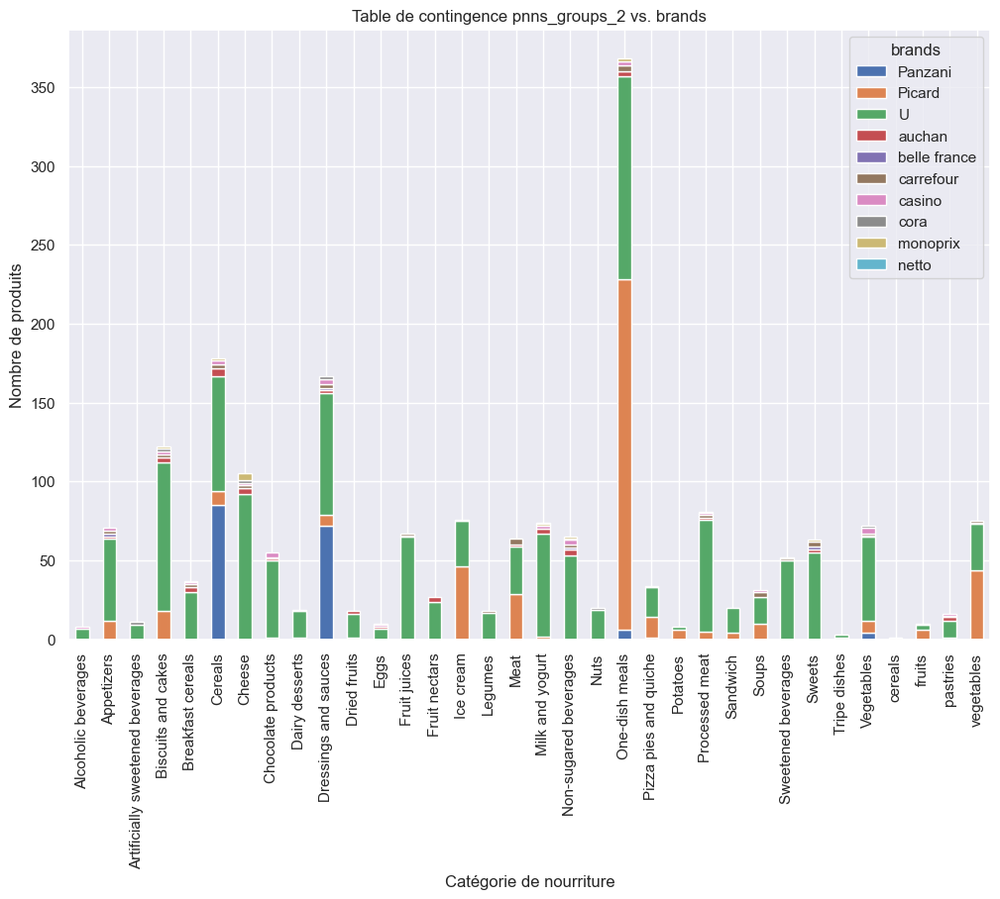

In [725]:
set_cat = set(['Legumes', 'Biscuits and cakes', 'Sweets',
 'Non-sugared beverages' ,'Sweetened beverages', 'Meat',
 'Alcoholic beverages', 'Sandwich' ,'Appetizers', 'Dressings and sauces',
 'Chocolate products', 'Dried fruits', 'Nuts' ,'One-dish meals' ,'Cheese',
 'Fruits' 'Fats' ,'Vegetables', 'Breakfast cereals' ,'Cereals', 'Fruit juices',
 'Milk and yogurt', 'Ice cream' ,'Fish and seafood' 'Bread', 'Tripe dishes',
 'pastries', 'Processed meat' ,'Pizza pies and quiche' ,'Dairy desserts',
 'Artificially sweetened beverages' ,'Eggs', 'Potatoes' ,'vegetables', 'Soups',
 'Fruit nectars', 'fruits', 'legumes', 'cereals', 'Salty and fatty products'])

# -- Getting the brands that makes the 3 categories of food
set_brands = set(['monoprix', 'auchan', 'prix leader', 'U', 'casino', 'Panzani', 
                  'Picard', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora'])

# set_brands = set(['Picard', 'Carrefour', 'Lindt', 'Fleury Michon', 'Haribo', 'Leader Price', 'Tropicana', 'U', 
#  'Casino', 'Auchan', 'Amora', 'Monique Ranou', 'Yoplait', 'Panzani','monoprix', 'auchan', 'prix leader', 
#  'delhaize', 'belle france', 'netto', 'cora', 'casino'])

# créer un dataframe filtré
df_filt = df.loc[df['pnns_groups_2'].isin(set_cat) & df['brands'].isin(set_brands)]

# créer la table de contingence
cont_table = pd.crosstab(df_filt['pnns_groups_2'], df_filt['brands'])

# afficher la table de contingence
# print(cont_table)

# créer le graphique de la table de contingence
cont_table.plot(kind='bar', stacked=True, figsize=(12,8))
plt.xlabel('Catégorie de nourriture')
plt.ylabel('Nombre de produits')
plt.title('Table de contingence pnns_groups_2 vs. brands')
plt.show()


In [705]:
df['brands'].unique().tolist()

["Ferme t'y R'nao",
 nan,
 'Bertrand Lejeune',
 'A&W',
 'St Michel',
 'Alice Délice',
 "M&m's ",
 'Pepsi',
 'Bo Frost',
 '7Up,Pepsico',
 'Bijou',
 'Sovivo',
 'Intermarché',
 'Le Moulin de Moreau-Sarlat',
 'Le Moulin de Moreau Sarlat',
 'Swedish By Nature',
 'Marks & Spencer',
 'Mark And Spencer',
 'Guédelon',
 'Fleury Michon',
 'Liebig',
 'Mark & Spencer',
 'Marks and Spencer',
 'M&S',
 'De Nigris',
 'Mark and Spencer',
 'Jaja',
 'Picard',
 'M&M',
 'Marché Franprix',
 'Imperial Dragon',
 'Hapi trading',
 'TABASCO',
 'McIlhenny Company',
 'Tabasco',
 'herta',
 'Florette',
 'Lindt',
 'SINA',
 'La Anita',
 'Daunat',
 'Carrefour',
 'Amofood',
 'Pure via',
 'Pepperidge farm',
 'Pepperidge Farm',
 'Chocolate Chunk,Pepperidge Farm',
 'Soft Baked,Pepperidge Farm',
 'Wonderful',
 'Wonderfull',
 'Wonderful pistachios',
 'patisseries colibri',
 'Bioitalia',
 'Damiano',
 'Conagra Foods Inc.',
 "Sainsbury's",
 'Marks&Spencer',
 'Fromagerie Bonal',
 'Le Gaulois',
 'Betty Crocker',
 'Nature valley',


In [706]:
# from fuzzywuzzy import fuzz

# # Normalisation des chaînes de caractères dans la colonne 'brands'
# df['brands'] = df['brands'].apply(lambda x: str(x).lower().strip())

# # Trouver les valeurs en doublon avec une tolérance de similarité de 80%
# duplicates = []
# unique_brands = df['brands'].unique()
# for i, brand1 in enumerate(unique_brands):
#     for brand2 in unique_brands[i+1:]:
#         similarity = fuzz.ratio(brand1, brand2)
#         if similarity > 80:
#             duplicates.append((brand1, brand2))

# # Fusionner les doublons
# for dup in duplicates:
#     df.loc[df['brands'] == dup[1], 'brands'] = dup[0]
    
# # Afficher les valeurs uniques après déduplication
# unique_brands = df['brands'].unique().tolist()
# print(unique_brands)


In [726]:
## Nutriscore ranking the brands for each pnns2 category
set_cat = set(['Legumes', 'Biscuits and cakes', 'Sweets',
 'Non-sugared beverages' ,'Sweetened beverages', 'Meat',
 'Alcoholic beverages', 'Sandwich' ,'Appetizers', 'Dressings and sauces',
 'Chocolate products', 'Dried fruits', 'Nuts' ,'One-dish meals' ,'Cheese',
 'Fruits' 'Fats' ,'Vegetables', 'Breakfast cereals' ,'Cereals', 'Fruit juices',
 'Milk and yogurt', 'Ice cream' ,'Fish and seafood' 'Bread', 'Tripe dishes',
 'pastries', 'Processed meat' ,'Pizza pies and quiche' ,'Dairy desserts',
 'Artificially sweetened beverages' ,'Eggs', 'Potatoes' ,'vegetables', 'Soups',
 'Fruit nectars', 'fruits', 'legumes', 'cereals', 'Salty and fatty products'])

# -- Getting the brands that makes the 3 categories of food
# set_brands = set(df['brands'].dropna().unique())
# -- Getting the brands that makes the 3 categories of food
# set_brands = set(['monoprix', 'auchan', 'prix leader', 'U', 'casino', 'Panzani', 
#                   'Picard', 'casino', 'carrefour', 'delhaize', 'belle france', 'netto', 'cora'])

set_brands = set(['Picard', 'Carrefour', 'Lindt', 'Fleury Michon', 'Haribo', 'Leader Price', 'Tropicana', 'U', 
 'Casino', 'Auchan', 'Amora', 'Monique Ranou', 'Yoplait', 'Panzani','monoprix', 'auchan', 'prix leader', 
 'delhaize', 'belle france', 'netto', 'cora', 'casino'])
# -- Mean nutriscore for each brand and each category
df_nutri_mean, df_nutri_median = pd.DataFrame([]), pd.DataFrame([])
for c in set_cat:
    for b in set_brands:
        c1 = df['brands']==b
        c2 = df['pnns_groups_2']==c
        df_nutri_mean.loc[b,c] = df[c1&c2]['nutrition-score-fr_100g'].mean()
        df_nutri_median.loc[b,c] = df[c1&c2]['nutrition-score-fr_100g'].median()

# -- Rank of each brand for each prodcut
df_rank_mean, df_rank_median = pd.DataFrame([]), pd.DataFrame([])
df_rank_mean = df_nutri_mean.apply(rankdata,axis=0)
df_rank_median = df_nutri_median.apply(rankdata,axis=0)

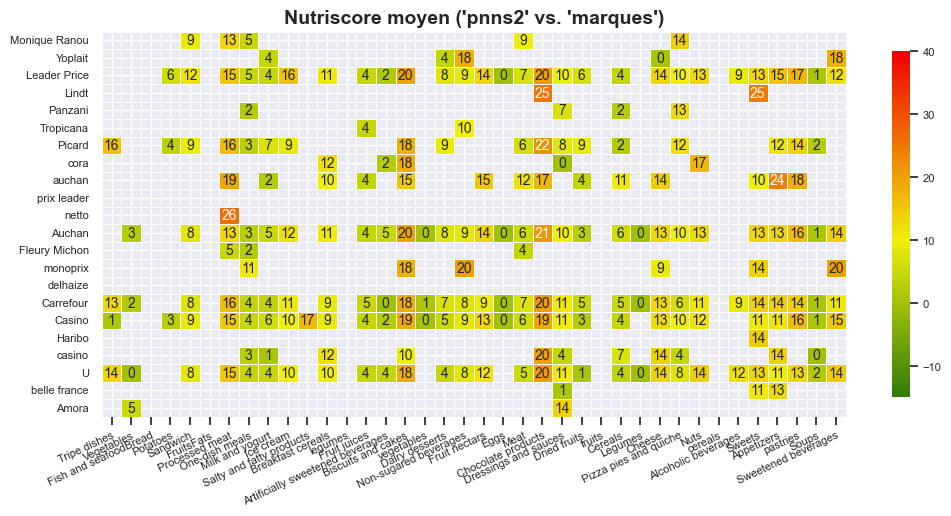

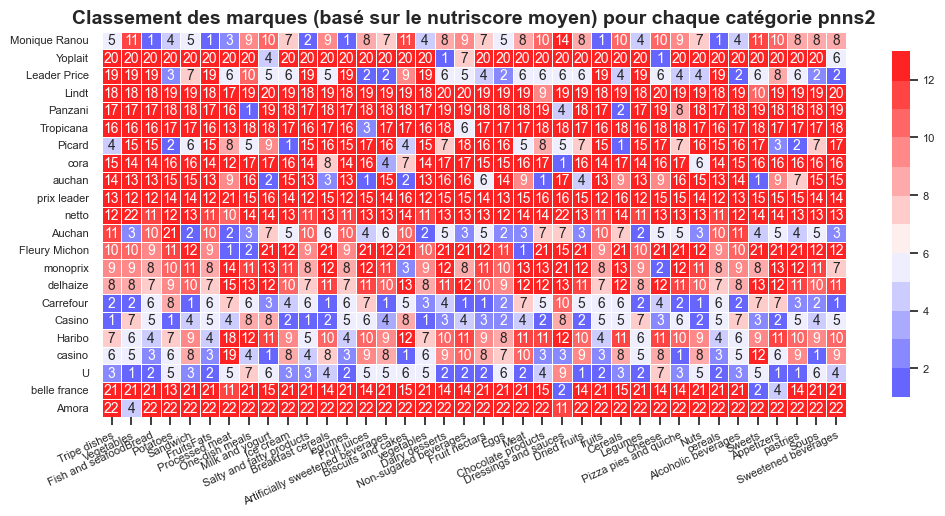

In [727]:
# Importation des bibliothèques nécessaires
from matplotlib.colors import ListedColormap

# Définition de la colormap "Green2Red" allant du vert au rouge
N = 128
vals = np.ones((2*N, 4))
vals[:, 0] = np.concatenate((np.linspace(5/N, 120/N, N), np.linspace(120/N, 120/N, N)))
vals[:, 1] = np.concatenate((np.linspace(50/N, 120/N,  N), np.linspace(120/N, 0/N, N)))
vals[:, 2] = np.concatenate((np.linspace(5/N, 5/N, N), np.linspace(5/N, 0/N, N)))
Green2Red = ListedColormap(vals)

# Plotting du premier heatmap
# Nutriscore moyen pour chaque marque et catégorie pnns2
plot_heatmap(df_nutri_mean,
             "Nutriscore moyen ('pnns2' vs. 'marques')",
             vmin=-15, center=10, vmax=40, fmt='.0f',
             palette=Green2Red,
             figsize=(12, 5), shape='rect')

# Affichage du premier heatmap
plt.show()

# Plotting du deuxième heatmap
# Classement des marques pour chaque catégorie pnns2
plot_heatmap(df_rank_mean,
             "Classement des marques (basé sur le nutriscore moyen) pour chaque catégorie pnns2",
             vmin=1, center=6, vmax=13, fmt='.0f',
             palette=sns.color_palette("bwr", 14),
             figsize=(12, 5), shape='rect')

# Affichage du deuxième heatmap
plt.show()


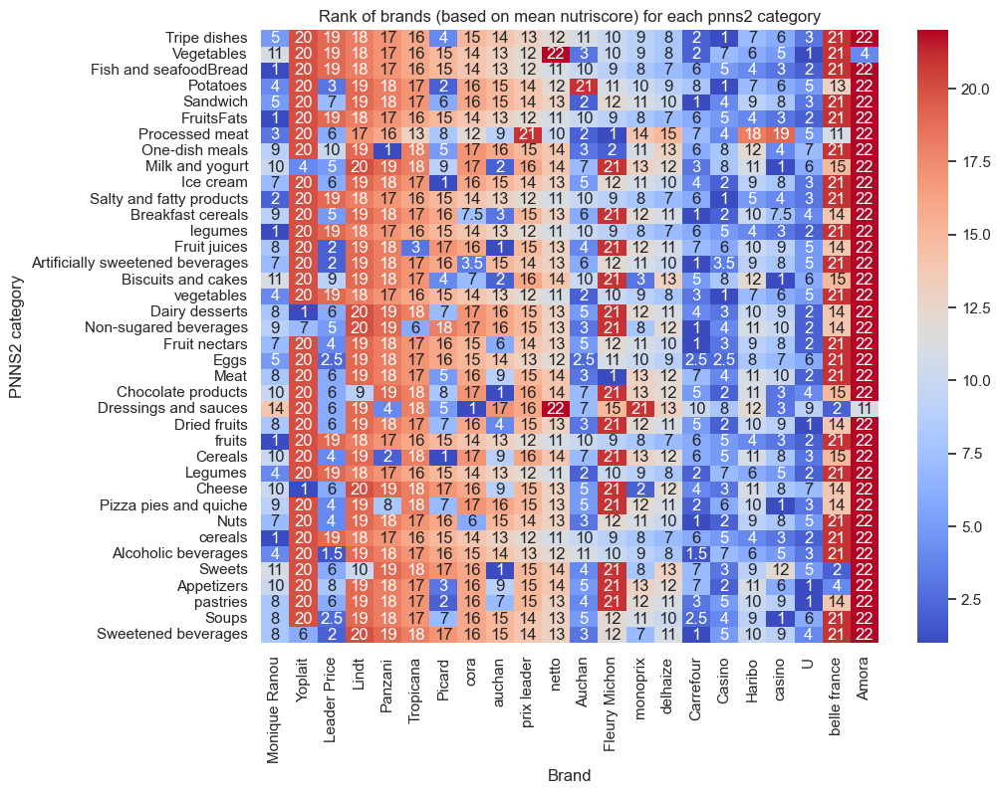

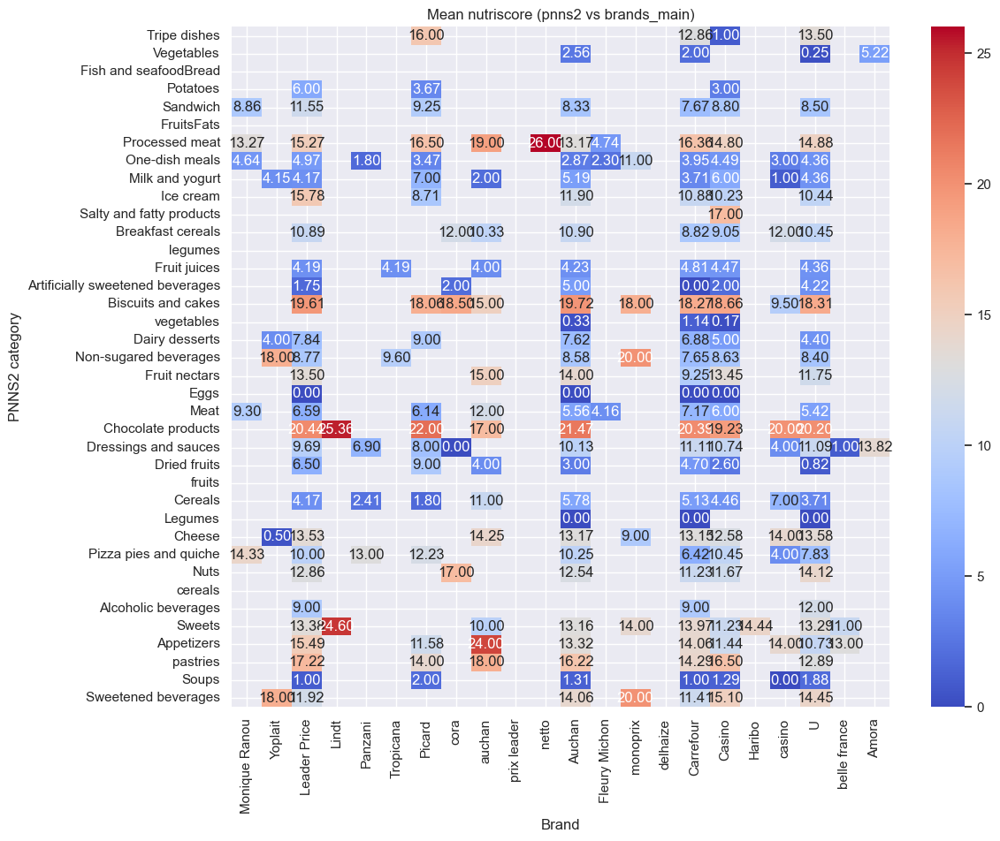

In [728]:
# Heatmap for rank of brands based on mean nutriscore for each pnns2 category
plt.figure(figsize=(10, 8))
sns.heatmap(df_rank_mean.T, cmap='coolwarm', annot=True, fmt='g')
plt.title('Rank of brands (based on mean nutriscore) for each pnns2 category')
plt.xlabel('Brand')
plt.ylabel('PNNS2 category')
plt.show()

# Heatmap for mean nutriscore (pnns2 vs brands_main)
plt.figure(figsize=(12, 10))
sns.heatmap(df_nutri_mean.T, cmap='coolwarm', annot=True, fmt='.2f')
plt.title('Mean nutriscore (pnns2 vs brands_main)')
plt.xlabel('Brand')
plt.ylabel('PNNS2 category')
plt.show()

    

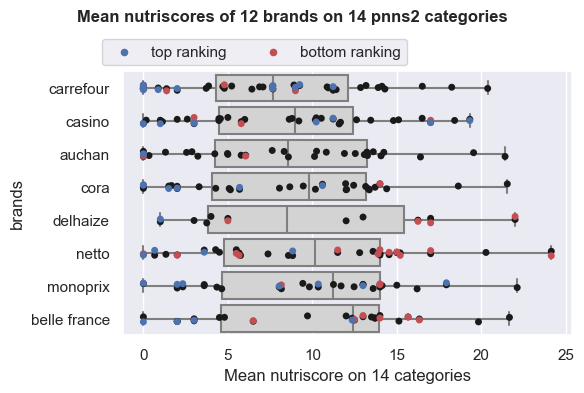

In [685]:
# Showing the ranking of brands for mean nutriscores on pnns2 categories

# -- Preparing unstacked dataframes for easier plotting with seaborn
df_ = df_nutri_mean.T.reset_index().rename(columns={'index':'pnns_groups_2'})
df_ = df_.melt(id_vars=['pnns_groups_2'] , var_name='brand',
                    value_vars=df_nutri_mean.index, value_name='nutri_mean' )
ordered_brands = df_nutri_mean.mean(axis=1).sort_values().index
df_bottom_ = df_nutri_mean.where(df_nutri_mean==df_nutri_mean.max(axis=0))
df_bottom_ = df_bottom_.T.reset_index().rename(columns={'index':'pnns_groups_2'})
df_bottom_ = df_bottom_.melt(id_vars=['pnns_groups_2'] , var_name='brand',
                    value_vars=df_nutri_mean.index, value_name='nutri_mean')

df_top_ = df_nutri_mean.where(df_nutri_mean==df_nutri_mean.min(axis=0))
df_top_ = df_top_.T.reset_index().rename(columns={'index':'pnns_groups_2'})
df_top_ = df_top_.melt(id_vars=['pnns_groups_2'] , var_name='brand',
                    value_vars=df_nutri_mean.index, value_name='nutri_mean' )

# -- Plotting boxplots, stripplots of mean nutriscores and first, last rankings
fig = plt.figure(figsize=(6,4))
sns.boxplot(y='brand' , x='nutri_mean', color='lightgrey',
            data = df_, order = ordered_brands)
sns.stripplot(y='brand' , x='nutri_mean', color='k',
              data = df_, order = ordered_brands)
sns.stripplot(y='brand' , x='nutri_mean', color='r',
              data = df_bottom_, order = ordered_brands)
sns.stripplot(y='brand' , x='nutri_mean', color='b',
              data = df_top_, order = ordered_brands)
ax = plt.gca()
ax.scatter([0],[0], c='b', s=20, label='top ranking')
ax.scatter([0],[0], c='r', s=20, label='bottom ranking')
plt.tight_layout(rect=[0,0,1,0.87])
plt.suptitle('Mean nutriscores of 12 brands on 14 pnns2 categories',
             fontweight='bold', fontsize=12)
ax.set_xlabel('Mean nutriscore on 14 categories'), ax.set_ylabel('brands')
ax.legend(bbox_to_anchor=(0.65,1.15), ncol=2)

plt.show()

In [686]:
# Importation de la librairie pandas
import pandas as pd

# Création d'un dataframe vide pour stocker les résultats
df_res = pd.DataFrame([])

# Ajout de deux colonnes pour stocker les marques ayant le meilleur et le pire classement
df_res['marque avec le meilleur classement'] = df_rank_mean.idxmin(axis=0)
df_res['marque avec le pire classement'] = df_rank_mean.idxmax(axis=0)

# Affichage des marques ayant le meilleur classement et leur nombre d'occurrences
print('--- MEILLEUR CLASSEMENT ---')
print(df_res['marque avec le meilleur classement'].value_counts())

# Affichage des marques ayant le premier classement
print("---- Listes des premiers classements -----")
[print(b +': '+ str(list(df_res[df_res['marque avec le meilleur classement']==b].index)))\
                              for b in set(df_res['marque avec le meilleur classement'])];

# Affichage des marques ayant le pire classement et leur nombre d'occurrences
print('--- PIRE CLASSEMENT ---')
print(df_res['marque avec le pire classement'].value_counts())

# Affichage des marques ayant le dernier classement
print("\n---- Listes des derniers classements -----")
[print(b +': '+ str(list(df_res[df_res['marque avec le pire classement']==b].index)))\
                              for b in set(df_res['marque avec le pire classement'])];


--- MEILLEUR CLASSEMENT ---
cora            11
carrefour       8 
casino          6 
monoprix        5 
netto           3 
belle france    3 
delhaize        1 
auchan          1 
Name: marque avec le meilleur classement, dtype: int64
---- Listes des premiers classements -----
cora: ['Fish and seafoodBread', 'FruitsFats', 'legumes', 'vegetables', 'Eggs', 'Dried fruits', 'fruits', 'Cereals', 'Pizza pies and quiche', 'cereals', 'pastries']
belle france: ['Dairy desserts', 'Cheese', 'Sweetened beverages']
auchan: ['Legumes']
carrefour: ['Vegetables', 'Sandwich', 'Artificially sweetened beverages', 'Non-sugared beverages', 'Fruit nectars', 'Nuts', 'Alcoholic beverages', 'Soups']
netto: ['Milk and yogurt', 'Breakfast cereals', 'Fruit juices']
delhaize: ['One-dish meals']
monoprix: ['Processed meat', 'Biscuits and cakes', 'Meat', 'Dressings and sauces', 'Appetizers']
casino: ['Tripe dishes', 'Potatoes', 'Ice cream', 'Salty and fatty products', 'Chocolate products', 'Sweets']
--- PIRE CLASSEM

Ce graphique et les données imprimées ci-dessous montrent que certaines marques ont en effet de meilleurs nutriscores moyens que d'autres. On remarque notamment que :

- cora sont les deux premiers du meilleur classement

- jour a le pire classement

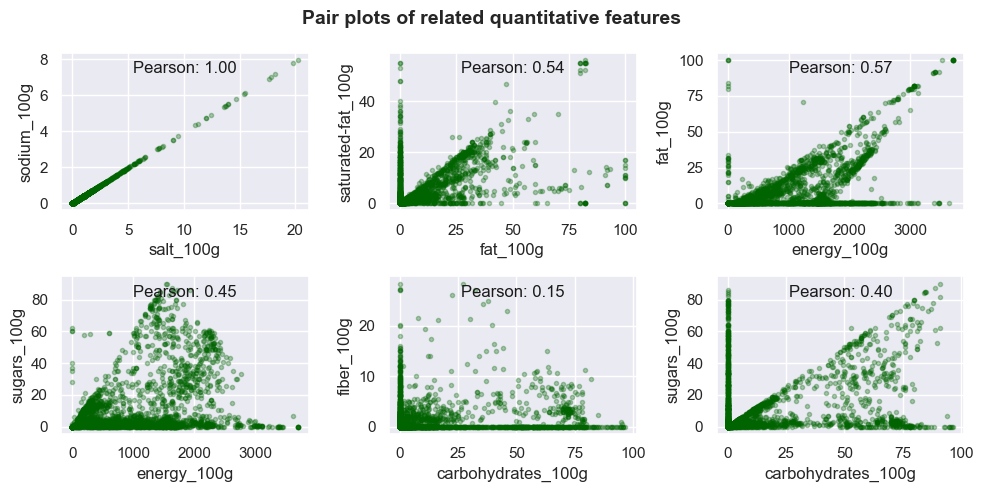

In [283]:
# Function to show scatter plot:

def pair_plot(df,c):
    x, y = c
    plt.scatter(df[x], df[y], marker='.', alpha=0.3, color = 'darkgreen')
    # plt.scatter(df[x], df[y], marker='o', edgecolors='darkblue',
    #             alpha=0.5, color='grey', s=20)
      
    plt.xlabel(x), plt.ylabel(y)
    plt.text(0.5, 0.9, 'Pearson: %.2f'%df[c].corr().iloc[0,1],
        ha='center', va='center', fontsize=12, c='k', transform=ax.transAxes)

dict_couples = {'c1': ['salt_100g', 'sodium_100g'],
                'c2': ['fat_100g', 'saturated-fat_100g'],
                'c3': ['energy_100g', 'fat_100g'],
                'c4': ['energy_100g', 'sugars_100g'],
                'c5': ['carbohydrates_100g', 'fiber_100g'],
                'c6': ['carbohydrates_100g', 'sugars_100g']}

# Plotting related features

fig = plt.figure(figsize=(10,5))
for i, c in enumerate(dict_couples.items(),1):
    ax = fig.add_subplot(2,3,i)
    pair_plot(df.sample(5000),c[1])
plt.tight_layout(rect=[0,0,1,0.93])
plt.suptitle('Pair plots of related quantitative features',
             fontweight='bold', fontsize=14)

plt.show()

Comme prévu, le sodium est corrélé avec le sel et les matières grasses à l'énergie provenant des matières grasses.

Les sucres et les fibres sont inférieurs aux glucides, et l'énergie provenant des graisses est inférieure à l'énergie totale.

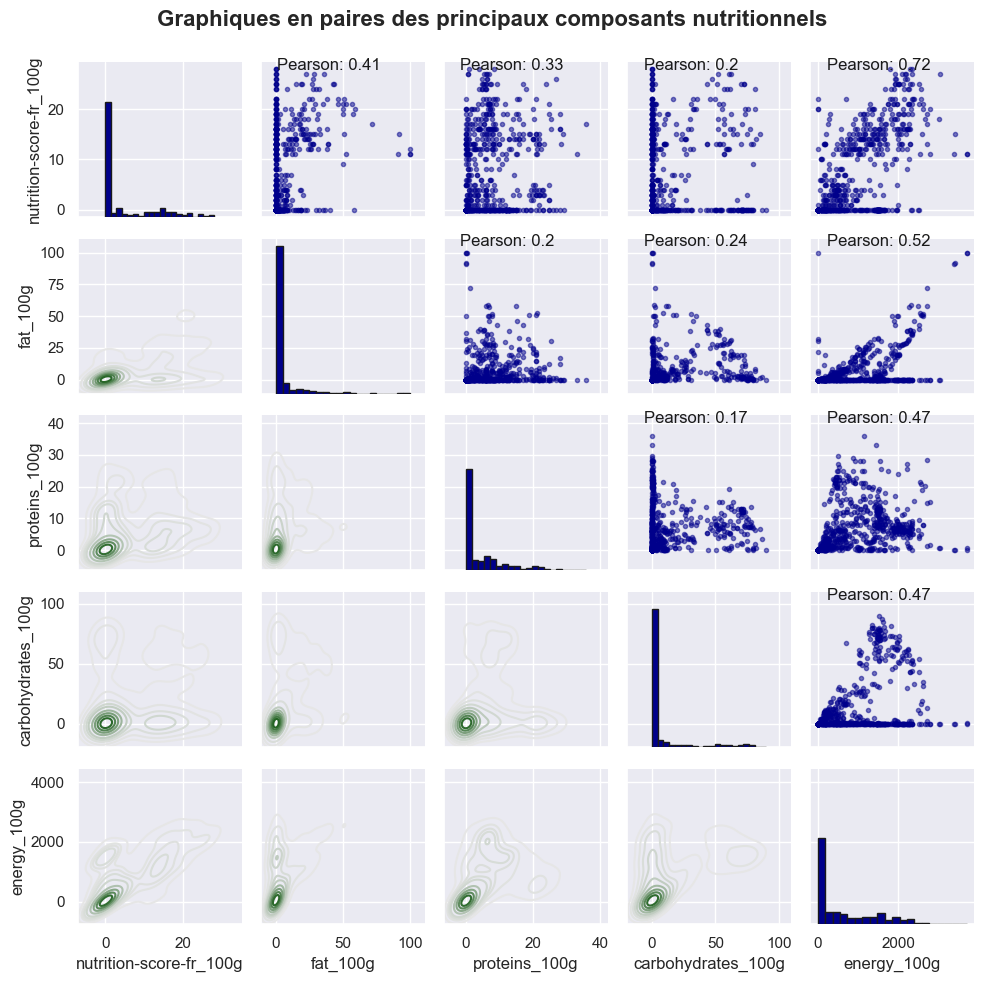

In [270]:
# Scatterplot matrix on main nutritional components (too much data -> on a sample)

# Creating grey to blue colormap
N = 256
vals = np.ones((N, 4))
vals[:, 0] = np.linspace(0.9, 5/N, N)
vals[:, 1] = np.linspace(0.9, 80/N,  N)
vals[:, 2] = np.linspace(0.9, 5/N, N)
Grey2Green = ListedColormap(vals)

# Function that prints Pearson correlation coefficient
def print_corr(x, y, **kwargs):
    label = r'Pearson: ' + str(round(np.corrcoef(x, y)[0][1], 2))
    ax = plt.gca()
    ax.annotate(label, xy = (0.1, 0.95), c='k', size = 12,
                xycoords = ax.transAxes)

cols = ['nutrition-score-fr_100g', 'fat_100g', 'proteins_100g','carbohydrates_100g', 'energy_100g']
df_sample = df.sample(1000)

# Creating the grid
grid = sns.PairGrid(data=df_sample,
                    vars=cols, height=2)

# Mapping the grid with plots and text
# grid = grid.map_upper(plt.scatter, marker='o', edgecolors='darkblue',
#                       alpha=0.5, color='blue', s=20)
grid = grid.map_upper(plt.scatter, marker='.', alpha=0.5, color = 'darkblue')
grid = grid.map_upper(print_corr)
grid = grid.map_diag(plt.hist, bins = 20, color = 'darkblue', edgecolor = 'k')
grid = grid.map_lower(sns.kdeplot, cmap = Grey2Green)

plt.tight_layout(rect=[0,0,1,0.95])
plt.suptitle('Graphiques en paires des principaux composants nutritionnels',
             fontweight='bold', fontsize=16)

plt.show()

Ces diagrammes de paires montrent que :

- le nutriscore augmente avec la teneur en lipides puis en glucides 
- le nutriscore augmente avec l'énergie en général
- les produits à haute teneur en matières grasses ont tendance à contenir moins de glucides et ceux qui contiennent plus de glucides ont tendance à contenir moins de matières grasses.
- peu de produits ont une forte teneur en protéines
- l'énergie a tendance à augmenter de manière cohérente avec la teneur en lipides et en glucides, mais les protéines ont moins d'influence sur la teneur énergétique totale, probablement parce que la plupart des produits contiennent moins de protéines que les lipides et les glucides.

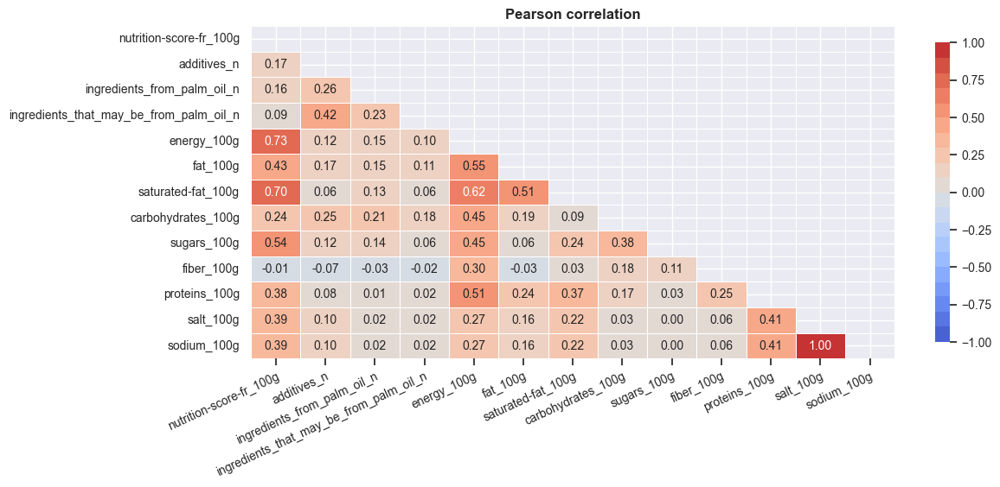

In [260]:
# Linear correlation (Pearson)

cols = quant_cols
pears_corr = df[cols].corr()
plot_heatmap(pears_corr, shape='tri',
             title="Pearson correlation", figsize=(12,5))

plt.show()

Si les distributions étaient normales, on pourrait rejetter l'hypothèse d'indépendance : la moyenne des échantillons de salt_100g est liée à la valeur de nutrition_grade

Comme nous l'avons déjà vu ci-dessus sur les graphiques de paires, certaines des corrélations sont assez évidentes, comme par exemple :

- gras -> énergie
- sucres -> glucides
- lipides, saturés, lipides, sucres, énergie -> nutriscore


Mais, plus surprenant :

plus de fibres peuvent être trouvées dans les produits à haute énergie
Comme nous le savons par sa formule, le nutriscore, sans surprise :

augmente avec l'énergie, les graisses saturées, le sucre et le sel
diminue avec la teneur en fibres, protéines et fruits et légumes

Cependant, pour la plupart des produits, la plupart des facteurs corrélés au nutriscore sont (par ordre décroissant d'importance) :

énergie, gras saturés, lipides, glucides, sucre (coefficient de Pearson >0,4)

les glucides, le sel et les fibres ont moins d'influence sur le nutriscore (abs(coeff de pearson) < 0,25)

=> Pour obtenir de meilleurs nutrigrades, l'industrie alimentaire devrait se concentrer principalement sur la diminution de la teneur en matières grasses, en sucre et en énergie globale de ses produits .



Nous testerons la corrélation linéaire (Pearson) et la relation monotone (Spearman, Kendall).

In [729]:
# Index(['additives_n', 'ingredients_from_palm_oil_n',
#        'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
#        'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
#        'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g'],
#       dtype='object')

# Définir les couples de variables pour effectuer les tests de corrélation
test_couples = [('fat_100g', 'nutrition-score-fr_100g'), ('carbohydrates_100g', 'nutrition-score-fr_100g'),
                ('proteins_100g', 'nutrition-score-fr_100g'), ('energy_100g', 'nutrition-score-fr_100g'),
                ('fiber_100g', 'nutrition-score-fr_100g'), ('sugars_100g', 'nutrition-score-fr_100g'),
                ('fat_100g', 'fiber_100g'), ('fat_100g', 'salt_100g'),
                ('ingredients_from_palm_oil_n', 'fiber_100g'), ('ingredients_from_palm_oil_n', 'salt_100g')]


# # Charger les données
# data = pd.read_csv('data/fr.openfoodfacts.org.products_cleaned5.csv')
# #df = df.fillna(0) # Remplacez les NaN par la valeur 0

# # Copier les données dans un nouveau dataframe
df_ = data.copy()

# Remplacer les valeurs infinies et manquantes par NaN
df_ = df_.replace([np.inf, -np.inf], np.nan).dropna()
nombre_de_lignes = data.shape[0]
print (nombre_de_lignes)
# Effectuer un échantillonnage aléatoire des données pour réduire la taille des données
df_ = df_.sample(min(10000, nombre_de_lignes), replace=True, random_state=42)


# Parcourir la liste des couples de variables et effectuer les tests de corrélation
for tup in test_couples:
    print('------'+str(tup).upper()+'-----')
    c1, c2 = tup
    display(correlation_tests(df_[c1], df_[c2], print_opt=False))


94485
------('FAT_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.681520,0.0
Spearman,0.742967,0.0
Kendall,0.546310,0.0


------('CARBOHYDRATES_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.493470,0.0
Spearman,0.445412,0.0
Kendall,0.306672,0.0


------('PROTEINS_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.143415,4.207602e-47
Spearman,0.150269,1.371682e-51
Kendall,0.097262,1.040167e-45


------('ENERGY_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.767185,0.0
Spearman,0.760678,0.0
Kendall,0.561618,0.0


------('FIBER_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.125421,2.388809e-36
Spearman,0.166727,2.974144e-63
Kendall,0.099777,2.162908e-47


------('SUGARS_100G', 'NUTRITION-SCORE-FR_100G')-----


,stat,p_value
Pearson,0.625426,0.0
Spearman,0.571586,0.0
Kendall,0.415787,0.0


------('FAT_100G', 'FIBER_100G')-----


,stat,p_value
Pearson,0.225066,4.924045e-115
Spearman,0.287125,4.474637e-189
Kendall,0.203856,2.689790e-199


------('FAT_100G', 'SALT_100G')-----


,stat,p_value
Pearson,0.027271,0.006385
Spearman,0.043757,0.000012
Kendall,0.028514,0.000022


------('INGREDIENTS_FROM_PALM_OIL_N', 'FIBER_100G')-----


,stat,p_value
Pearson,0.134838,8.594325e-42
Spearman,0.192398,5.321445e-84
Kendall,0.158964,1.750412e-82


------('INGREDIENTS_FROM_PALM_OIL_N', 'SALT_100G')-----


,stat,p_value
Pearson,-0.070989,1.185683e-12
Spearman,-0.085962,7.239852e-18
Kendall,-0.070495,8.272558e-18


Les 3 tests indiquent une relation linéaire avec un niveau de confiance de 5 % entre la combinaison des caractéristiques énumérées ci-dessus. Cependant, nous devons tempérer ces conclusions car cette sensibilité élevée peut être principalement due à la grande quantité de données disponibles. Si nous soumettons un échantillon de 1 000 ou 10 000 des données aux mêmes tests, les conclusions sont plus conformes aux conclusions qui peuvent être facilement tirées des diagrammes de paires

In [805]:
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

In [902]:
##### Analyse en composantes principales #####

# Paramètre l'affichage pour la mise en forme des valeurs
np.set_printoptions(formatter={'float': '{: 6.2f}'.format})

# --Sélection des caractéristiques et des index (dropna) pour l'ACP
pca_cols =  [ 'additives_n', 'ingredients_from_palm_oil_n',
             'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
             'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
             'proteins_100g', 'salt_100g', 'sodium_100g']

# Supprime la caractéristique "nutriscore" des colonnes à considérer
pca_cols = [c for c in pca_cols if c!='nutriscore']

# Sélectionne un échantillon aléatoire de 10000 observations sans valeur manquante 
df_sample = df.loc[:, pca_cols].dropna(how='any').sample(10000)

# Stocke les index des observations sélectionnées
id_code = df_sample.index

# Transforme l'échantillon en matrice numérique
X = df_sample.values

# --Standardisation des données
X_sc = StandardScaler().fit_transform(X)

# -- Détermination des composantes principales
n_comp = 12
pca = PCA(n_components=n_comp).fit(X_sc)

# -- Coefficients des composantes principales (en fonction des caractéristiques initiales)
pca_df = pd.DataFrame(pca.components_,
                      index=['PC'+str(i+1) for i in range(n_comp)],
                      columns=pca_cols).T

# Projection de X sur les composantes principales
X_proj = pca.transform(X_sc)


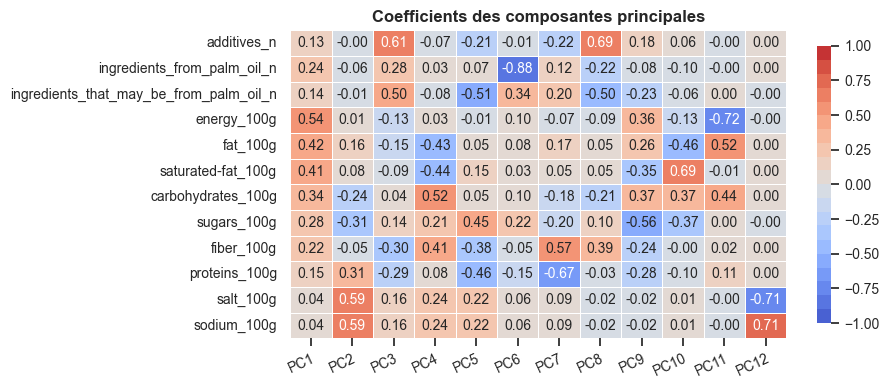

In [903]:
# Plotting principal components coefficient
# Tracé du coefficient des composantes principales

plot_heatmap(pca_df,'Coefficients des composantes principales', vmin=-1, vmax=1, center=0,
             palette=sns.color_palette("coolwarm", 20),figsize=(8,4),shape='rect')
plt.show()

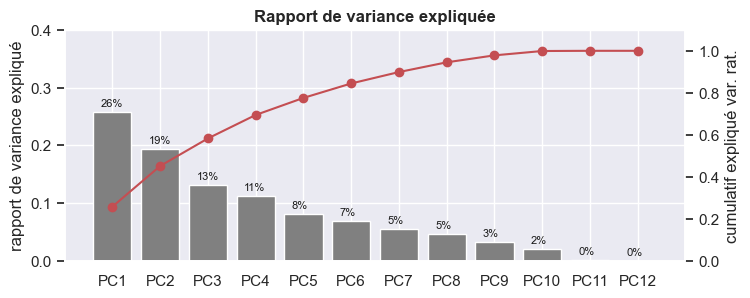

In [809]:
# Plotting explained variance ratio in scree plot
# Tracé du rapport de variance expliquée dans un graphe d'éboulis

# Obtention du ratio de variance expliquée
exp_var_rat = pca.explained_variance_ratio_

# Création d'un graphique à barres pour le ratio de variance expliquée
plt.bar(x=pca_df.columns, height=exp_var_rat, color='grey')

# Configuration de l'axe y principal
ax1 = plt.gca()
ax1.set(ylim=(0,0.4))

# Création d'un deuxième axe y pour la courbe de la variance expliquée cumulée
ax2 = ax1.twinx()
ax2.plot(exp_var_rat.cumsum(), 'ro-')
ax2.set(ylim=(0,1.1))

# Configuration des étiquettes des axes y
ax1.set_ylabel('rapport de variance expliqué')
ax2.set_ylabel('cumulatif expliqué var. rat.')

# Ajout des pourcentages au-dessus des barres
for i, p in enumerate(ax1.patches):
    ax1.text( p.get_width()/5 + p.get_x(), p.get_height()+ p.get_y()+0.01,
             '{:.0f}%'.format(exp_var_rat[i]*100),
                fontsize=8, color='k')

# Configuration de la taille du graphique et ajout d'un titre
plt.gcf().set_size_inches(8,3)
plt.title('Rapport de variance expliquée', fontweight='bold')

# Sauvegarde et affichage du graphique

plt.grid(False)

# Affichage du graphique
plt.show()



In [749]:
pca_cols

['additives_n',
 'ingredients_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil_n',
 'energy_100g',
 'fat_100g',
 'saturated-fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g']

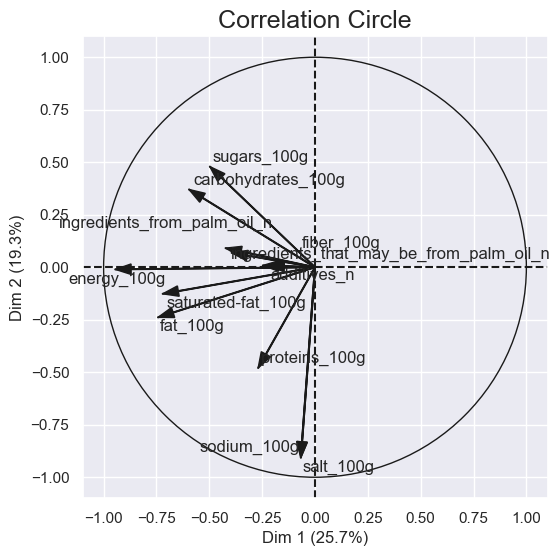

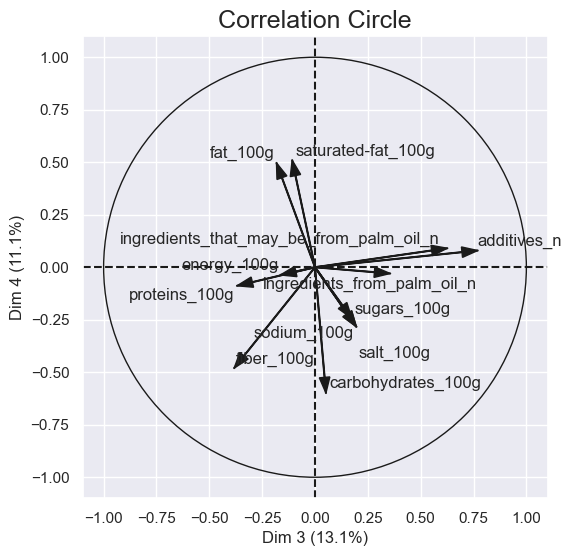

In [810]:
# POUR RECALCULER LA PCA AVEC MLXTEND

figure, correlation_matrix = \
     plot_pca_correlation_graph(X = X_sc, variables_names = pca_cols,
                                dimensions=(1, 2), figure_axis_size=6)
figure, correlation_matrix = \
     plot_pca_correlation_graph(X = X_sc, variables_names = pca_cols,
                                dimensions=(3, 4), figure_axis_size=6)

In [751]:
correlation_matrix

,Dim 1,Dim 2,Dim 3,Dim 4
additives_n,-0.227024,0.025409,0.767058,0.032988
ingredients_from_palm_oil_n,-0.422398,-0.089643,0.338992,-0.053704
ingredients_that_may_be_from_palm_oil_n,-0.254547,0.008742,0.628801,0.053482
energy_100g,-0.945416,-0.040019,-0.164569,-0.026419
fat_100g,-0.756477,0.200954,-0.145354,0.499832
saturated-fat_100g,-0.724985,0.085855,-0.073923,0.520603
carbohydrates_100g,-0.583500,-0.400112,0.020907,-0.593081
sugars_100g,-0.478555,-0.503008,0.172856,-0.238045
fiber_100g,-0.392318,-0.090978,-0.410393,-0.464175
proteins_100g,-0.314243,0.440997,-0.413162,-0.044255


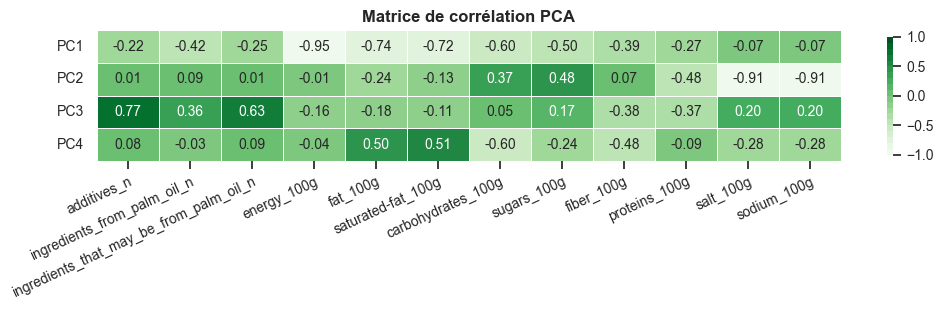

In [811]:
# Tracé de la matrice de corrélation PCA
plot_heatmap(correlation_matrix.T,'Matrice de corrélation PCA', vmin=-1, vmax=1, center=0,
             palette=sns.color_palette("Greens", 20),figsize=(12,1.7),shape='rect')
plt.gca().set_yticklabels(['PC1', 'PC2', 'PC3', 'PC4'])

# Affichage de la figure
plt.show()


In [812]:
# Plotting a sample of values projected on first factorial planes

# id_code_samp = pd.Series(id_code).sample(300)
# X_samp = df.loc[id_code_samp, pca_cols].values
# X_sc_samp = StandardScaler().fit_transform(X_samp)

# Sélection de 300 échantillons aléatoires
id_code_samp = pd.Series(id_code).sample(300)

# Sélection des colonnes PCA et des valeurs correspondantes pour les 300 échantillons sélectionnés
X_samp = df.loc[id_code_samp, pca_cols].values

# Standardisation des données d'échantillons PCA
X_sc_samp = StandardScaler().fit_transform(X_samp)


Ce code sert à sélectionner un échantillon aléatoire de 300 échantillons à partir des données transformées par l'analyse en composantes principales (PCA) et normalisées à l'aide de la StandardScaler. Cela peut être utile pour effectuer des analyses de clustering ou de classification sur un échantillon représentatif des données.

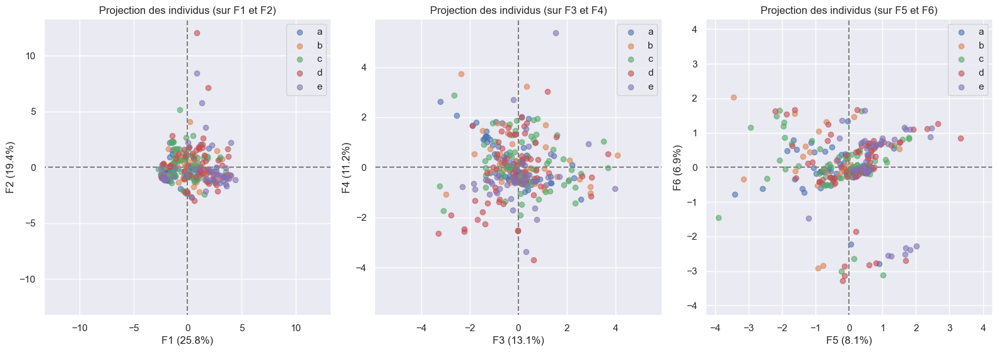

In [813]:
illus_var_p = df.loc[id_code_samp, 'nutrition_grade_fr']
illus_var_p = illus_var_p[illus_var_p.apply(lambda x: isinstance(x, str))]
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= illus_var_p,
                         lab_on=False, alpha=0.6)
plt.show()

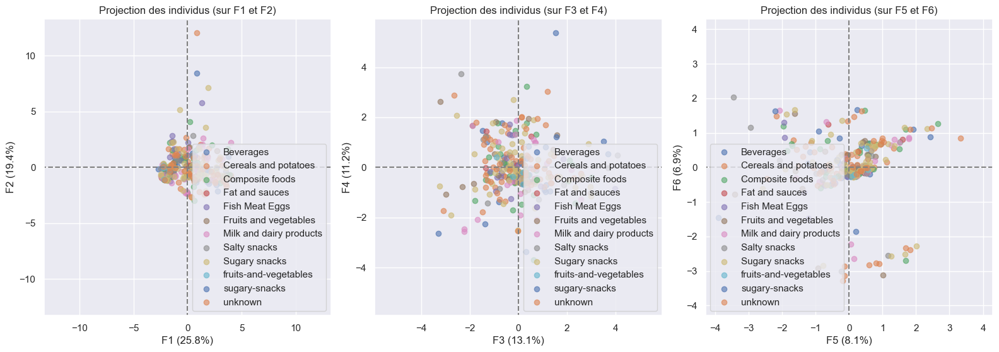

In [814]:
illus_var_p = df.loc[id_code_samp, 'pnns_groups_1']
illus_var_p = illus_var_p[illus_var_p.apply(lambda x: isinstance(x, str))]
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= illus_var_p,
                         lab_on=False, alpha=0.6)

plt.show()

### 4.2 Regroupement ou Clustering
Les quatre premières CP (Composantes Principales) expliquent 73 % de la variance totale. Nous allons garder ces 4 et essayer de trouver des clusters.

In [887]:
# KMeans Clustering
# Regroupement de KMeans
# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')
# --Sélection des caractéristiques et des index (dropna) pour l'ACP
numeric_cols =  [ 'additives_n', 'ingredients_from_palm_oil_n',
             'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
             'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
             'proteins_100g', 'salt_100g', 'sodium_100g']

# Nombre de clusters
n_clust = 5

# Création d'un objet KMeans avec 5 clusters et entraînement du modèle sur les données projetées X_proj
km = KMeans(n_clusters=n_clust).fit(X_proj)

# Attribution des labels de cluster pour chaque individu
clustK = km.labels_

# Ajout de la colonne 'cluster_Kmeans' dans le DataFrame df pour stocker les labels de cluster pour chaque individu
df.loc[id_code, 'cluster_Kmeans'] = clustK

# Suppression des individus qui n'ont pas de label de cluster dans le DataFrame df
df.dropna(subset=['cluster_Kmeans'], inplace=True)

# Suppression des valeurs manquantes dans les colonnes numériques du DataFrame df
df[numeric_cols].dropna()

# Affichage des labels de clusters uniques
df['cluster_Kmeans'].unique()


array([  0.00,   3.00,   2.00,   1.00,   4.00])

Ce code effectue un clustering KMeans sur un ensemble de données numériques et assigne chaque observation à un cluster. Cela permet de regrouper des observations similaires ensemble en fonction de leurs caractéristiques numériques.

La variable n_clust définit le nombre de clusters souhaité pour l'algorithme de clustering KMeans. Ensuite, la méthode KMeans.fit() est utilisée pour ajuster le modèle KMeans à nos données projetées X_proj. La variable clustK contient les étiquettes de cluster prédites pour chaque observation de X_proj.

En tirant des conclusions sur la taille et la composition de chaque cluster, il est possible d'identifier des groupes de données similaires qui peuvent aider à comprendre les relations et les tendances sous-jacentes dans les données. Cela peut aider à prendre des décisions éclairées et à formuler des stratégies de manière plus efficace en fonction des caractéristiques communes des différents groupes.

In [888]:
## KMeans Clustering

n_clust = 5
km = KMeans(n_clusters=n_clust).fit(X_proj)
clustK = km.labels_
df.loc[id_code, 'cluster_Kmeans'] = clustK

In [898]:
pca_cols = ['additives_n', 'ingredients_from_palm_oil_n',
            'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
            'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
            'proteins_100g', 'salt_100g', 'sodium_100g']

# Filtrer les lignes contenant des valeurs manquantes dans les colonnes d'intérêt
cols = pca_cols + ['cluster_Kmeans']
df_filtered = df[cols].dropna()

# Calculer la matrice de corrélation PPS
pps_corr = pps.matrix(df_filtered).round(2)

# Arrondir les valeurs de la matrice de corrélation à 2 décimales
pps_corr = pps_corr.round(2)

# Afficher le graphique PPS
pps.matrix(df_filtered).pivot(columns='x', index='y', values='ppscore').style.background_gradient(cmap='coolwarm')

# # # Création du DataFrame nettoyé
# df_cleaned = df.dropna(subset=pca_cols, how='any')
# df_cleaned[cols] = df_cleaned[cols].applymap(lambda x: round(x, 2))

# # Calcul de la matrice de ppscore
# pps_corr = pps.matrix(df_cleaned[cols])

# # # Affichage du graphique
# sns.heatmap(pps_corr, cmap='Blues', annot=True)
# plt.title('Sampled Predictive Power Score (ppscore)')
# plt.show()


x,additives_n,carbohydrates_100g,cluster_Kmeans,energy_100g,fat_100g,fiber_100g,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,proteins_100g,salt_100g,saturated-fat_100g,sodium_100g,sugars_100g
y,,,,,,,,,,,,,
additives_n,1.000000,0.000000,0.094279,0.000000,0.000000,0.000000,0.000000,0.024773,0.000000,0.000000,0.000000,0.000000,0.000000
carbohydrates_100g,0.000000,1.000000,0.544857,0.474571,0.059899,0.195170,0.006471,0.000000,0.225356,0.000000,0.019393,0.000000,0.288958
cluster_Kmeans,0.000000,0.214852,1.000000,0.287851,0.001052,0.000000,0.000000,0.098979,0.029348,0.000000,0.020122,0.000000,0.000000
energy_100g,0.000000,0.434554,0.578431,1.000000,0.415663,0.153149,0.052724,0.007590,0.231391,0.005244,0.293007,0.006736,0.205523
fat_100g,0.000000,0.067984,0.309862,0.504091,1.000000,0.000000,0.000000,0.000000,0.015792,0.000000,0.490857,0.000000,0.012954
fiber_100g,0.000000,0.031779,0.092612,0.000000,0.000000,1.000000,0.000000,0.000000,0.040350,0.000000,0.000000,0.000000,0.000000
ingredients_from_palm_oil_n,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
ingredients_that_may_be_from_palm_oil_n,0.000000,0.000000,0.241569,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
proteins_100g,0.000000,0.084695,0.232032,0.088667,0.143110,0.018577,0.000000,0.000000,1.000000,0.028534,0.094434,0.027398,0.027626


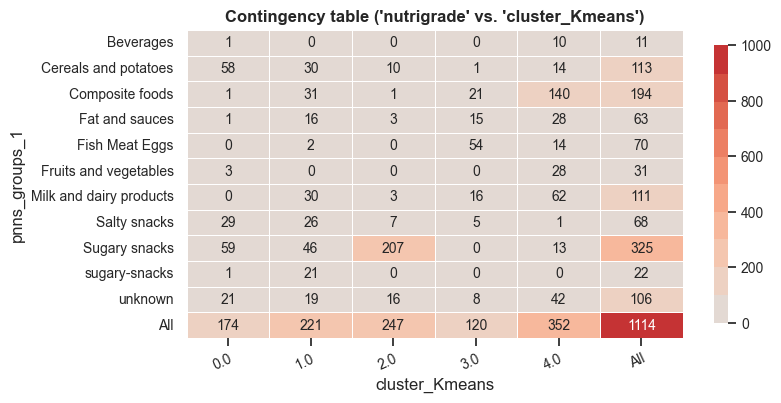

In [885]:
## Creating table of contingency

data_crosstab = pd.crosstab(df['pnns_groups_1'], 
                            df['cluster_Kmeans'],  
                               margins = True)

plot_heatmap(data_crosstab,"Contingency table ('nutrigrade' vs. 'cluster_Kmeans')",
             vmin=0, vmax=1000, palette=sns.color_palette("coolwarm", 20),
             figsize=(8,4), shape='rect', fmt='.0f')
plt.show()

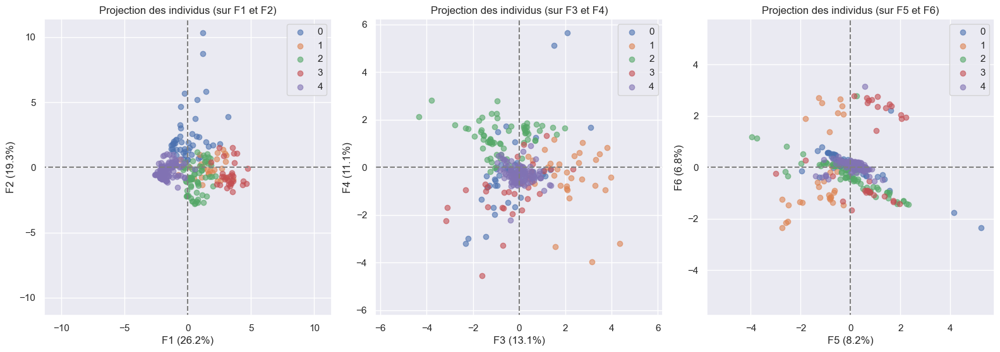

In [771]:
display_factorial_planes(pca.transform(X_sc_samp), n_comp, pca, [(0,1),(2,3),(4,5)],
                         n_cols=3, labels=np.array(id_code_samp),
                         illus_var= df.loc[id_code_samp, 'cluster_Kmeans'],
                         lab_on=False, alpha=0.6)

plt.show()

---Chi-squared
stat=987.820, p=0.000
Probably dependent


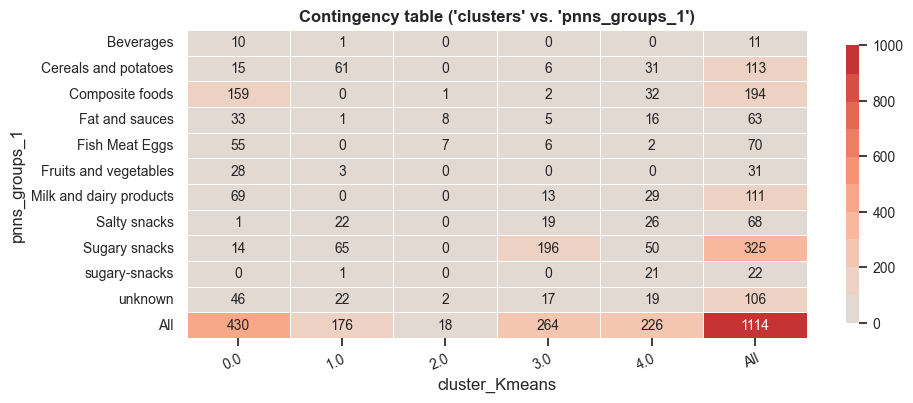

In [843]:
# Importer la bibliothèque Pandas et la fonction crosstab de Pandas pour créer une table de contingence
import pandas as pd
from pandas.api.types import CategoricalDtype

# --Sélection des caractéristiques et des index (dropna) pour l'ACP
pca_cols =  [ 'additives_n', 'ingredients_from_palm_oil_n',
             'ingredients_that_may_be_from_palm_oil_n', 'energy_100g', 'fat_100g',
             'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
             'proteins_100g', 'salt_100g', 'sodium_100g']


# Créer une table de contingence qui croise les catégories 'pnns_groups_1' et 'cluster_Kmeans'
data_crosstab = pd.crosstab(df['pnns_groups_1'], df['cluster_Kmeans'], margins=True)

# Importer la bibliothèque SciPy et la fonction chi2_contingency pour effectuer le test du chi2
from scipy.stats import chi2_contingency
stat, p, dof, expected = chi2_contingency(data_crosstab)

# Imprimer les résultats du test du chi2
print('---'+"Chi-squared")
print('stat=%.3f, p=%.3f' % (stat, p))
print('Probably independent') if p > 0.05 else print('Probably dependent')

# Définir une liste de noms de colonnes à utiliser dans la matrice des composantes principales
# pca_cols = df[numeric_cols].columns.tolist() + ['PC12']

# Créer une DataFrame à partir de la matrice des composantes principales obtenue par la fonction PCA
# Ici, on transpose la matrice obtenue par pca.components_ pour avoir la forme correcte de la matrice des composantes principales
pca_df = pd.DataFrame(pca.components_.T, columns=pca_cols)

# Créer un heatmap pour visualiser la table de contingence
plot_heatmap(data_crosstab,"Contingency table ('clusters' vs. 'pnns_groups_1')",
             vmin=0, vmax=1000,figsize=(10,4),shape='rect', fmt='.0f',
             palette=sns.color_palette("coolwarm", 20))

# Afficher le heatmap
plt.show()


# QUESTION 4

**Élaborer une idée d’application. Identifier des arguments justifiant la faisabilité (ou non) de l’application à partir des données Open Food Facts.**

Idées : 
* Identifier les caractéristiques nutritionnelles des produits mauvais nutriscores et étiqueter automatiquement les produits qui ont des caractéristiques similaires
* **Calcul automatique de nutriscore**
* Vérifier si le nombre d'additifs est lié au nutriscore / mettre un indicateur sur le nombre d'additifs

## Calcul automatique de nutri score par régression linéaire

In [142]:
data.head(1)

,code,url,creator,last_modified_t,product_name,quantity_original,packaging,packaging_tags,brands,categories_fr,labels_fr,countries_fr,ingredients_text,allergens,additives_n,additives,additives_tags,additives_fr,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,pnns_groups_1,pnns_groups_2,states_fr,main_category_fr,image_url,image_small_url,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g,quantity_origine,quantity,quantity_unit
0,0000000003087,http://world-fr.openfoodfacts.org/produit/0000000003087/farine-de-ble-noir-ferme-t-y-r-nao,openfoodfacts-contributors,1474103893,Farine de blé noir,1kg,NaN,NaN,Ferme t'y R'nao,NaN,NaN,France,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"A compléter,Informations nutritionnelles à compléter,Ingrédients à compléter,Date limite à compléter,Caractéristiques à compléter,Catégories à compléter,Marques complétées,Emballage à compléter,Quantité complétée,Nom du produit complete,Photos à valider,Photos envoyées",NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1kg,1000.0,g


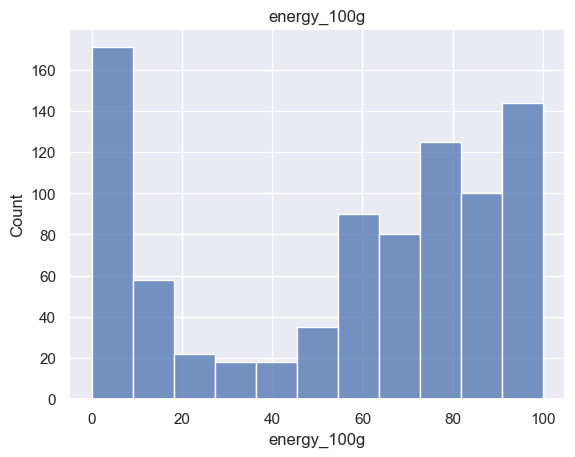

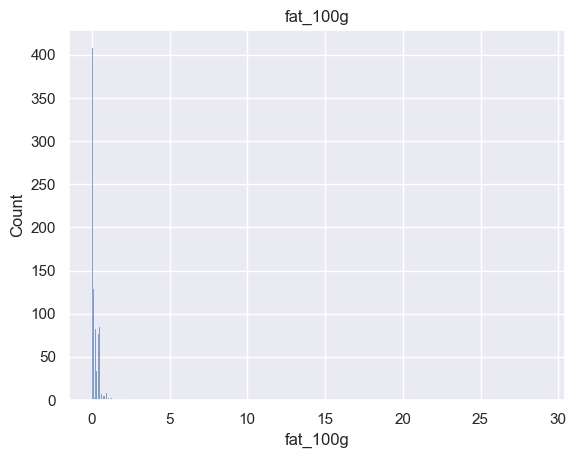

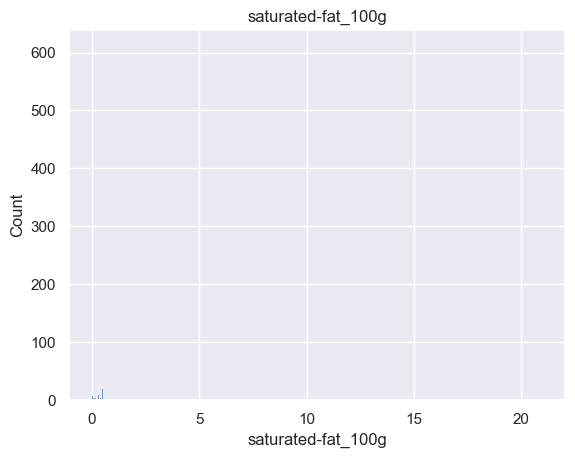

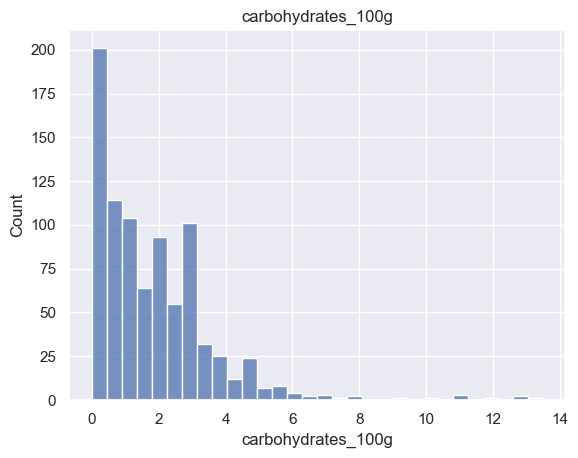

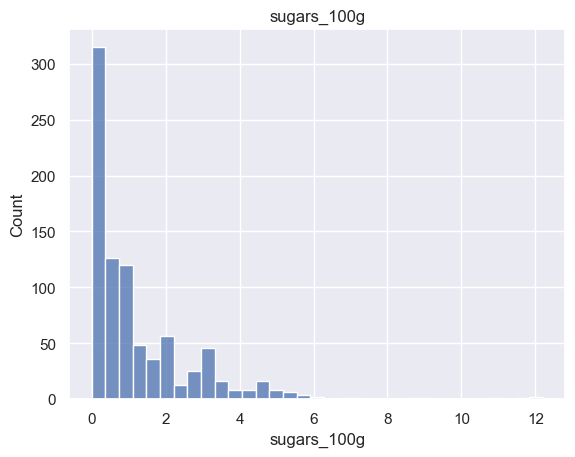

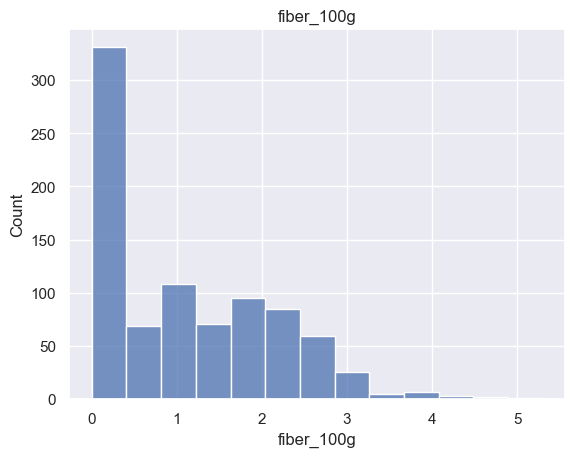

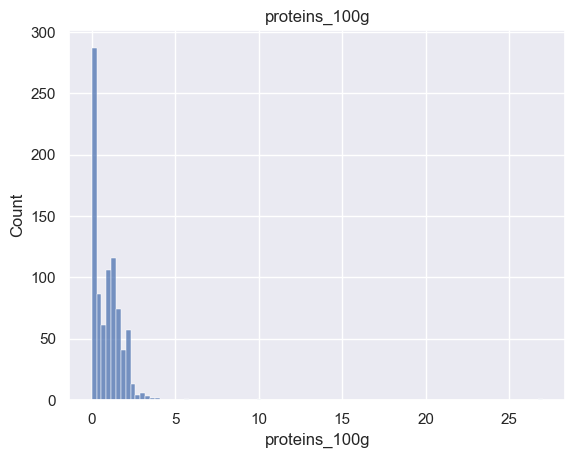

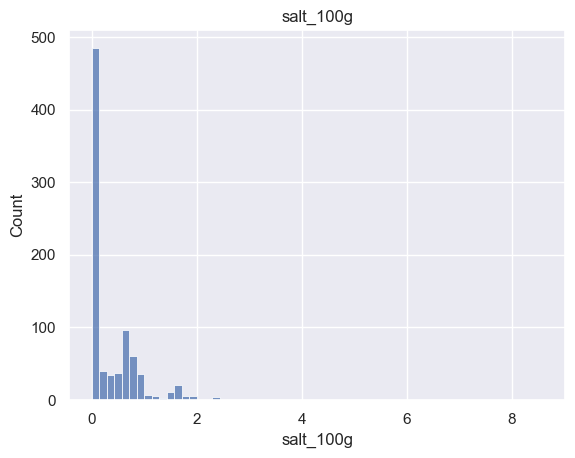

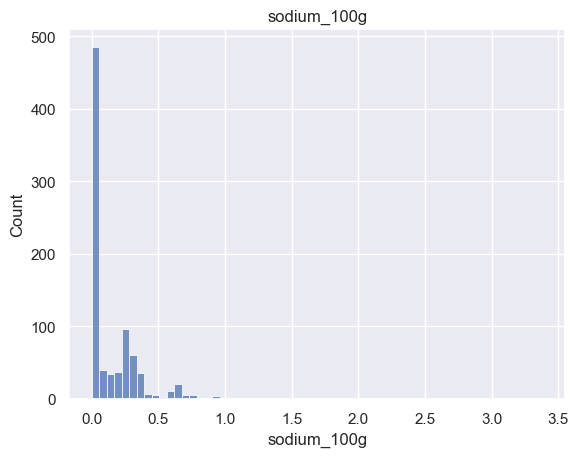

In [905]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Charger les données
data = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Variables pertinentes
variables = ["product_name", "categories_fr", "ingredients_text", "energy_100g", "fat_100g", "saturated-fat_100g",
             "carbohydrates_100g", "sugars_100g", "fiber_100g", "proteins_100g", "salt_100g", "sodium_100g",'nutrition_grade_fr']

# Filtrer les données
filtered_data = data[variables]

# Traiter les valeurs manquantes
filtered_data = filtered_data.dropna()

# Traiter les valeurs aberrantes
for col in filtered_data.columns:
    if col.endswith("_100g"):
        filtered_data = filtered_data[filtered_data[col] >= 0]
        filtered_data = filtered_data[filtered_data[col] <= 100]

# Calcul du Nutri-Score
def compute_nutriscore(row):
    # Calcul des points selon les règles officielles du Nutri-Score 
    score = 0
    energy_points = 0
    saturated_fat_points = 0
    sugars_points = 0
    sodium_points = 0
    fiber_points = 0
    proteins_points = 0
    
    # Points pour l'énergie
    if row["energy_100g"] <= 335:
        energy_points = 0
    elif row["energy_100g"] <= 670:
        energy_points = 1
    elif row["energy_100g"] <= 1005:
        energy_points = 2
    elif row["energy_100g"] <= 1340:
        energy_points = 3
    elif row["energy_100g"] <= 1675:
        energy_points = 4
    else:
        energy_points = 5
        
    # Points pour les acides gras saturés
    if row["saturated-fat_100g"] <= 1:
        saturated_fat_points = 0
    elif row["saturated-fat_100g"] <= 2:
        saturated_fat_points = 1
    elif row["saturated-fat_100g"] <= 3:
        saturated_fat_points = 2
    elif row["saturated-fat_100g"] <= 4:
        saturated_fat_points = 3
    elif row["saturated-fat_100g"] <= 5:
        saturated_fat_points = 4
    else:
        saturated_fat_points = 5
    
    # Points pour les sucres
    if row["sugars_100g"] <= 4.5:
        sugars_points = 0
    elif row["sugars_100g"] <= 9:
        sugars_points = 1
    elif row["sugars_100g"] <= 13.5:
        sugars_points = 2
    elif row["sugars_100g"] <= 18:
        sugars_points = 3
    elif row["sugars_100g"] <= 22.5:
        sugars_points = 4
    else:
        sugars_points = 5
    
    # Points pour le sodium ou sel
    if row["sodium_100g"] <= 90:
        sodium_points = 0
    elif row["sodium_100g"] <= 180:
        sodium_points = 1
    elif row["sodium_100g"] <= 270:
        sodium_points = 2
    elif row["sodium_100g"] <= 360:
        sodium_points = 3
    elif row["sodium_100g"] <= 450:
        sodium_points = 4
    else:
        sodium_points = 5
        
    # Points pour les fibres
    if row["fiber_100g"] >= 3:
        fiber_points = 1
        
    # Points pour les protéines
    if row["proteins_100g"] >= 1.6:
        proteins_points = 0.5 * np.floor((row["proteins_100g"] - 1.6) / 0.8)
        
    # Score final
    score = energy_points + saturated_fat_points + sugars_points + sodium_points - fiber_points - proteins_points
    
    if score <= -1:
        return "A"
    elif score <= 2:
        return "B"
    elif score <= 10:
        return "C"
    elif score <= 18:
        return "D"
    else:
        return "E"

filtered_data["nutriscore_f"] = filtered_data.apply(compute_nutriscore, axis=1)

# Visualisations univariées
for col in filtered_data.columns:
    if col.endswith("_100g"):
        plt.figure()
        sns.histplot(data=filtered_data, x=col)
        plt.title(col)
        plt.show()

# Sauvegarder le résultat
filtered_data.to_csv("nutriscore_data_v3.csv", index=False)

### Random Forest Regressor

Le modèle par régression linéaire ne semble pas donner de bons résultats. Essayons un modèle non linéaire (modèle d'ensemble : Random Forest)

In [176]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

params = {
    'n_estimators': [50],
    'verbose' : [1]
}

rfr = GridSearchCV(RandomForestRegressor(), params, cv = 5)

In [177]:
rfr.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    1.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'n_estimators': [50], 'verbose': [1]})

In [178]:
rfr.best_estimator_

RandomForestRegressor(n_estimators=50, verbose=1)

In [524]:

print('R² sur jeu d\'entraînement : ', rfr.best_estimator_.score(X_train,y_train))
print('R² sur jeu de test', rfr.best_estimator_.score(X_test,y_test))


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.1s finished


R² sur jeu d'entraînement :  0.9907021597770415
R² sur jeu de test 0.9399302983634974


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished


In [181]:
print('RMSE = ', sqrt(mean_squared_error(y_test, rfr.best_estimator_.predict(X_test))))

RMSE =  1.8987755787471137


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


(-1.4000000000000001, 29.4, -1.982163429260254, 41.62543201446533)

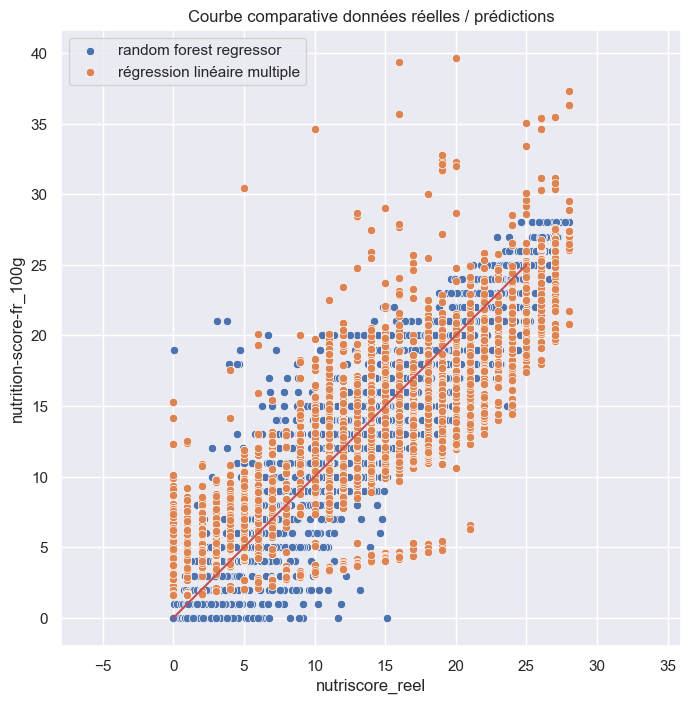

In [183]:
plt.figure(figsize=(8,8))
plt.title('Courbe comparative données réelles / prédictions')
sns.scatterplot(x = rfr.predict(X_test),y = y_test)
sns.scatterplot(x = resultat['nutriscore_reel'], y = resultat['prediction'])
plt.legend(['random forest regressor', 'régression linéaire multiple'])
sns.lineplot([0,25],[0,25], color='r')
ax = plt.gca()
ax.set_xlim(0,25)
ax.set_ylim(0,25)
ax.axis('equal')

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    0.0s finished
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\ProgramData\Anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


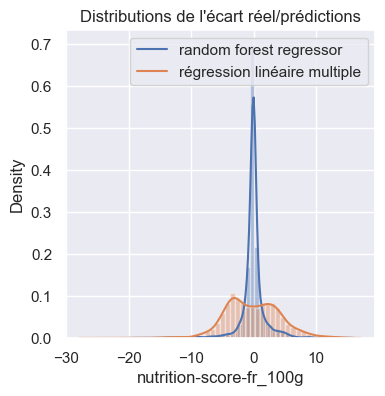

In [184]:
plt.figure(figsize=(4,4))
plt.title('Distributions de l\'écart réel/prédictions')
sns.distplot(rfr.predict(X_test) -  y_test)
sns.distplot(resultat['nutriscore_reel'] - resultat['prediction'])
plt.legend(['random forest regressor', 'régression linéaire multiple'])

In [185]:
rfr.best_estimator_.feature_importances_

array([0.50682837, 0.01670931, 0.1875935 , 0.01912755, 0.10642359,
       0.0422758 , 0.0597439 , 0.06129797])

In [186]:
random_forest_features = pd.DataFrame({'feature' : data_reg.drop(['nutrition-score-fr_100g'],axis=1).columns,
                                      'importance' : rfr.best_estimator_.feature_importances_})

In [187]:
random_forest_features.sort_values(by='importance',ascending=False, inplace=True)

<Axes: title={'center': 'Importance des variables dans le random forest'}, xlabel='importance', ylabel='feature'>

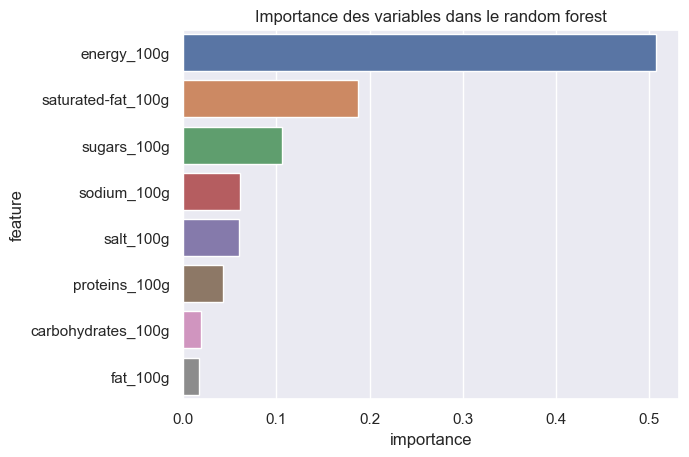

In [188]:
plt.title('Importance des variables dans le random forest')

sns.barplot(y = random_forest_features['feature'], x=random_forest_features['importance'])

Graphiquement, on observe assez nettement que le random forest décrit mieux la variance du jeu de données que le modèle par régression linéaire multiple :
* écart quasi nul pour une partie plus importante des données, 
* pour les écarts plus important, la porportion est plus faible que pour la régression linéaire.

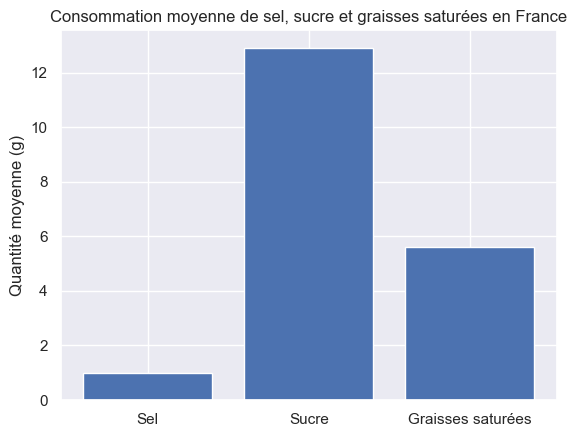

In [907]:
import pandas as pd
import matplotlib.pyplot as plt

# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Nettoyer les données
df = df.dropna(subset=["salt_100g", "sugars_100g", "saturated-fat_100g"])
df = df[df["salt_100g"] > 0]
df = df[df["sugars_100g"] > 0]
df = df[df["saturated-fat_100g"] > 0]

# Calculer la quantité moyenne de sel, de sucre et de graisses saturées
mean_salt = df["salt_100g"].mean()
mean_sugar = df["sugars_100g"].mean()
mean_sat_fat = df["saturated-fat_100g"].mean()

# Créer le graphique
labels = ["Sel", "Sucre", "Graisses saturées"]
values = [mean_salt, mean_sugar, mean_sat_fat]
plt.bar(labels, values)
plt.ylabel("Quantité moyenne (g)")
plt.title("Consommation moyenne de sel, sucre et graisses saturées en France")
plt.show()


***************homemade***********************
Empty DataFrame
Columns: [energy_100g, salt_100g, sugars_100g, fat_100g, ingredients_text]
Index: []
***************industrial***********************
Empty DataFrame
Columns: [energy_100g, salt_100g, sugars_100g, fat_100g, ingredients_text]
Index: []
***************homemade_mean***********************
energy_100g         NaN
salt_100g           NaN
sugars_100g         NaN
fat_100g            NaN
ingredients_text    NaN
dtype: object
***************industrial_mean***********************
energy_100g         NaN
salt_100g           NaN
sugars_100g         NaN
fat_100g            NaN
ingredients_text    NaN
dtype: object
***************df***********************
       energy_100g  salt_100g  sugars_100g  fat_100g  \
2785   404.0        0.20000    0.01         10.600     
3125   919.0        1.19000    3.61         8.610      
5268   113.0        0.02000    5.60         0.060      
9871   967.0        0.69000    47.00        1.100      
15109  

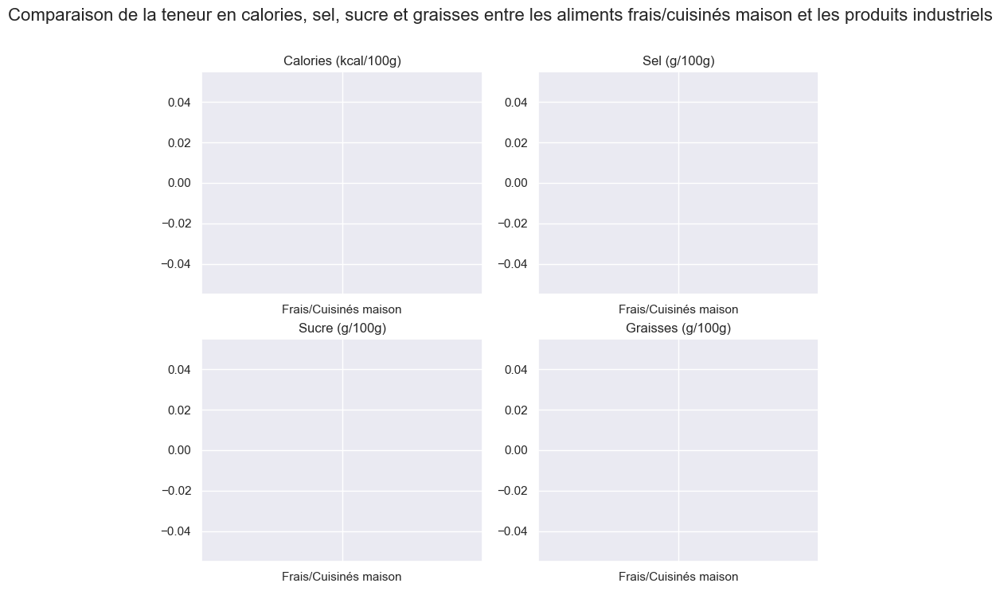

In [915]:
import pandas as pd
import matplotlib.pyplot as plt

# Charger les données
df = pd.read_csv('../data/fr.openfoodfacts.org.products_cleaned8.csv')

# Filtrer les données pour ne garder que les aliments et les boissons
df = df[df["categories_fr"].str.contains("food|drink", na=False)]

# Sélectionner les variables d'intérêt
df = df[["energy_100g", "salt_100g", "sugars_100g", "fat_100g","ingredients_text"]]
# Nettoyer les données
df = df.dropna(subset=["energy_100g","salt_100g", "sugars_100g", "fat_100g"])
df = df[df["energy_100g"] > 0]
df = df[df["salt_100g"] > 0]
df = df[df["sugars_100g"] > 0]
df = df[df["fat_100g"] > 0]
# Supprimer toutes les valeurs nulles des colonnes
df = df.dropna()

# Calculer la moyenne des valeurs pour les aliments frais ou cuisinés maison et pour les produits industriels
# homemade = df[(df["ingredients_text"].str.contains("home made", case=False))]
# industrial = df[(df["ingredients_text"].str.contains("industrial", case=False))]

homemade = df[(df["ingredients_text"].str.contains("home made|fait maison|frais|cuisinés", case=False))]
industrial = df[(df["ingredients_text"].str.contains("industrial|industriel|transformé", case=False))]

homemade_mean = homemade.mean()
industrial_mean = industrial.mean()
print("***************homemade***********************")
print(homemade)
print("***************industrial***********************")
print(industrial)
print("***************homemade_mean***********************")
print(homemade_mean)
print("***************industrial_mean***********************")
print(industrial_mean)
print("***************df***********************")
print(df)

# Créer un graphique en barres pour chaque variable
fig, ax = plt.subplots(2, 2, figsize=(10, 8))
fig.suptitle("Comparaison de la teneur en calories, sel, sucre et graisses entre les aliments frais/cuisinés maison et les produits industriels", fontsize=16)

ax[0, 0].bar(["Frais/Cuisinés maison", "Produits industriels"], [homemade_mean["energy_100g"], industrial_mean["energy_100g"]])
ax[0, 0].set_title("Calories (kcal/100g)")

ax[0, 1].bar(["Frais/Cuisinés maison", "Produits industriels"], [homemade_mean["salt_100g"], industrial_mean["salt_100g"]])
ax[0, 1].set_title("Sel (g/100g)")

ax[1, 0].bar(["Frais/Cuisinés maison", "Produits industriels"], [homemade_mean["sugars_100g"], industrial_mean["sugars_100g"]])
ax[1, 0].set_title("Sucre (g/100g)")

ax[1, 1].bar(["Frais/Cuisinés maison", "Produits industriels"], [homemade_mean["fat_100g"], industrial_mean["fat_100g"]])
ax[1, 1].set_title("Graisses (g/100g)")

plt.show()


In [168]:
df.columns

Index(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name',
       'generic_name', 'quantity',
       ...
       'ph_100g', 'fruits-vegetables-nuts_100g',
       'collagen-meat-protein-ratio_100g', 'cocoa_100g', 'chlorophyl_100g',
       'carbon-footprint_100g', 'nutrition-score-fr_100g',
       'nutrition-score-uk_100g', 'glycemic-index_100g',
       'water-hardness_100g'],
      dtype='object', length=162)

In [184]:
print (df) 

        energy_100g  salt_100g  sugars_100g  fat_100g  \
236     144.0        0.000000   2.50         0.90       
628     1554.0       0.010008   1.50         1.30       
884     1554.0       0.010008   1.50         1.30       
1719    1050.0       1.220000   7.14         1.79       
1727    1120.0       1.470000   2.22         2.22       
...        ...            ...    ...          ...       
320318  3404.0       0.000000   0.00         92.00      
320378  690.0        8.407400   11.20        1.00       
320399  1210.0       0.876300   11.70        4.00       
320431  1325.0       1.978660   2.20         5.50       
320471  1150.0       0.025400   63.50        0.10       

                                                                                                                                                                                                                                                                                                                           

# QUESTION 5

**Rédiger un rapport d’exploration et pitcher votre idée durant la soutenance du projet.** : voir support de présentation